# Your first neural network

In this project, you'll build your first neural network and use it to predict daily bike rental ridership. We've provided some of the code, but left the implementation of the neural network up to you (for the most part). After you've submitted this project, feel free to explore the data and the model more.



In [76]:
%matplotlib inline
%config InlineBackend.figure_format = 'retina'

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

## Load and prepare the data

A critical step in working with neural networks is preparing the data correctly. Variables on different scales make it difficult for the network to efficiently learn the correct weights. Below, we've written the code to load and prepare the data. You'll learn more about this soon!

In [77]:
data_path = 'Bike-Sharing-Dataset/hour.csv'

rides = pd.read_csv(data_path)

In [78]:
rides.head()

,instant,dteday,season,yr,mnth,hr,holiday,weekday,workingday,weathersit,temp,atemp,hum,windspeed,casual,registered,cnt
0,1,2011-01-01,1,0,1,0,0,6,0,1,0.24,0.2879,0.81,0.0,3,13,16
1,2,2011-01-01,1,0,1,1,0,6,0,1,0.22,0.2727,0.80,0.0,8,32,40
2,3,2011-01-01,1,0,1,2,0,6,0,1,0.22,0.2727,0.80,0.0,5,27,32
3,4,2011-01-01,1,0,1,3,0,6,0,1,0.24,0.2879,0.75,0.0,3,10,13
4,5,2011-01-01,1,0,1,4,0,6,0,1,0.24,0.2879,0.75,0.0,0,1,1


## Checking out the data

This dataset has the number of riders for each hour of each day from January 1 2011 to December 31 2012. The number of riders is split between casual and registered, summed up in the `cnt` column. You can see the first few rows of the data above.

Below is a plot showing the number of bike riders over the first 10 days or so in the data set. (Some days don't have exactly 24 entries in the data set, so it's not exactly 10 days.) You can see the hourly rentals here. This data is pretty complicated! The weekends have lower over all ridership and there are spikes when people are biking to and from work during the week. Looking at the data above, we also have information about temperature, humidity, and windspeed, all of these likely affecting the number of riders. You'll be trying to capture all this with your model.

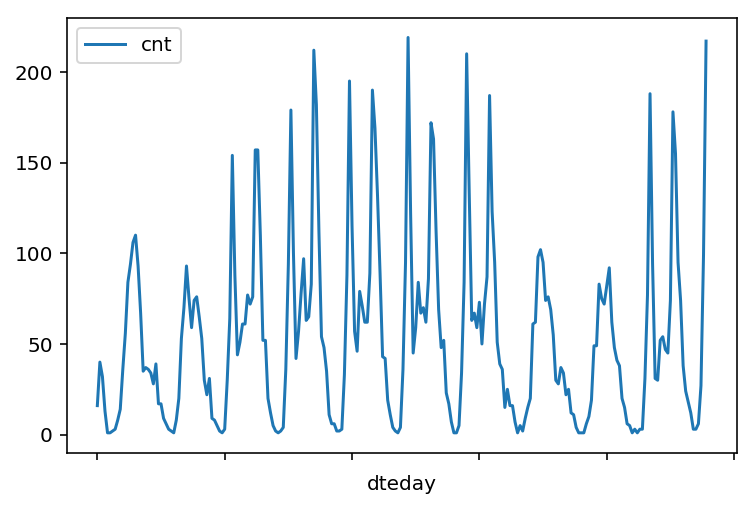

In [79]:
rides[:24*10].plot(x='dteday', y='cnt')

### Dummy variables
Here we have some categorical variables like season, weather, month. To include these in our model, we'll need to make binary dummy variables. This is simple to do with Pandas thanks to `get_dummies()`.

In [80]:
dummy_fields = ['season', 'weathersit', 'mnth', 'hr', 'weekday']
for each in dummy_fields:
    dummies = pd.get_dummies(rides[each], prefix=each, drop_first=False)
    rides = pd.concat([rides, dummies], axis=1)

fields_to_drop = ['instant', 'dteday', 'season', 'weathersit', 
                  'weekday', 'atemp', 'mnth', 'workingday', 'hr']
data = rides.drop(fields_to_drop, axis=1)
data.head()

,yr,holiday,temp,hum,windspeed,casual,registered,cnt,season_1,season_2,...,hr_21,hr_22,hr_23,weekday_0,weekday_1,weekday_2,weekday_3,weekday_4,weekday_5,weekday_6
0,0,0,0.24,0.81,0.0,3,13,16,1,0,...,0,0,0,0,0,0,0,0,0,1
1,0,0,0.22,0.80,0.0,8,32,40,1,0,...,0,0,0,0,0,0,0,0,0,1
2,0,0,0.22,0.80,0.0,5,27,32,1,0,...,0,0,0,0,0,0,0,0,0,1
3,0,0,0.24,0.75,0.0,3,10,13,1,0,...,0,0,0,0,0,0,0,0,0,1
4,0,0,0.24,0.75,0.0,0,1,1,1,0,...,0,0,0,0,0,0,0,0,0,1


### Scaling target variables
To make training the network easier, we'll standardize each of the continuous variables. That is, we'll shift and scale the variables such that they have zero mean and a standard deviation of 1.

The scaling factors are saved so we can go backwards when we use the network for predictions.

In [81]:
quant_features = ['casual', 'registered', 'cnt', 'temp', 'hum', 'windspeed']
# Store scalings in a dictionary so we can convert back later
scaled_features = {}
for each in quant_features:
    mean, std = data[each].mean(), data[each].std()
    scaled_features[each] = [mean, std]
    data.loc[:, each] = (data[each] - mean)/std

### Splitting the data into training, testing, and validation sets

We'll save the data for the last approximately 21 days to use as a test set after we've trained the network. We'll use this set to make predictions and compare them with the actual number of riders.

In [82]:
# Save data for approximately the last 21 days 
test_data = data[-21*24:]

# Now remove the test data from the data set 
data = data[:-21*24]

# Separate the data into features and targets
target_fields = ['cnt', 'casual', 'registered']
features, targets = data.drop(target_fields, axis=1), data[target_fields]
test_features, test_targets = test_data.drop(target_fields, axis=1), test_data[target_fields]

We'll split the data into two sets, one for training and one for validating as the network is being trained. Since this is time series data, we'll train on historical data, then try to predict on future data (the validation set).

In [83]:
# Hold out the last 60 days or so of the remaining data as a validation set
train_features, train_targets = features[:-60*24], targets[:-60*24]
val_features, val_targets = features[-60*24:], targets[-60*24:]

## Time to build the network

Below you'll build your network. We've built out the structure. You'll implement both the forward pass and backwards pass through the network. You'll also set the hyperparameters: the learning rate, the number of hidden units, and the number of training passes.

<img src="assets/neural_network.png" width=300px>

The network has two layers, a hidden layer and an output layer. The hidden layer will use the sigmoid function for activations. The output layer has only one node and is used for the regression, the output of the node is the same as the input of the node. That is, the activation function is $f(x)=x$. A function that takes the input signal and generates an output signal, but takes into account the threshold, is called an activation function. We work through each layer of our network calculating the outputs for each neuron. All of the outputs from one layer become inputs to the neurons on the next layer. This process is called *forward propagation*.

We use the weights to propagate signals forward from the input to the output layers in a neural network. We use the weights to also propagate error backwards from the output back into the network to update our weights. This is called *backpropagation*.

> **Hint:** You'll need the derivative of the output activation function ($f(x) = x$) for the backpropagation implementation. If you aren't familiar with calculus, this function is equivalent to the equation $y = x$. What is the slope of that equation? That is the derivative of $f(x)$.

Below, you have these tasks:
1. Implement the sigmoid function to use as the activation function. Set `self.activation_function` in `__init__` to your sigmoid function.
2. Implement the forward pass in the `train` method.
3. Implement the backpropagation algorithm in the `train` method, including calculating the output error.
4. Implement the forward pass in the `run` method.
  

In [10]:
#############
# In the my_answers.py file, fill out the TODO sections as specified
#############

# from my_answers import NeuralNetwork

In [174]:
class NeuralNetwork(object):
    def __init__(self, input_nodes, hidden_nodes, output_nodes, learning_rate):
        # Set number of nodes in input, hidden and output layers.
        self.input_nodes = input_nodes
        self.hidden_nodes = hidden_nodes
        self.output_nodes = output_nodes

        # Initialize weights
        self.weights_input_to_hidden = np.random.normal(0.0, self.input_nodes**-0.5, 
                                       (self.input_nodes, self.hidden_nodes))

        self.weights_hidden_to_output = np.random.normal(0.0, self.hidden_nodes**-0.5, 
                                       (self.hidden_nodes, self.output_nodes))
        self.lr = learning_rate
        
        #### TODO: Set self.activation_function to your implemented sigmoid function ####
        #
        # Note: in Python, you can define a function with a lambda expression,
        # as shown below.
        # self.activation_function = lambda x : 0  # Replace 0 with your sigmoid calculation.
        
        ### If the lambda code above is not something you're familiar with,
        # You can uncomment out the following three lines and put your 
        # implementation there instead.
        #
        def sigmoid(x):
            return 1 / (1 + np.exp(-x))  # Replace 0 with your sigmoid calculation here
        
        self.activation_function = sigmoid
                    

    def train(self, features, targets):
        ''' Train the network on batch of features and targets. 
        
            Arguments
            ---------
            
            features: 2D array, each row is one data record, each column is a feature
            targets: 1D array of target values
        
        '''
        n_records = features.shape[0]
        delta_weights_i_h = np.zeros(self.weights_input_to_hidden.shape)
        delta_weights_h_o = np.zeros(self.weights_hidden_to_output.shape)
        for X, y in zip(features, targets):
            
            final_outputs, hidden_outputs = self.forward_pass_train(X)  # Implement the forward pass function below
            # Implement the backproagation function below
            delta_weights_i_h, delta_weights_h_o = self.backpropagation(final_outputs, hidden_outputs, X, y, 
                                                                        delta_weights_i_h, delta_weights_h_o)
        self.update_weights(delta_weights_i_h, delta_weights_h_o, n_records)


    def forward_pass_train(self, X):
        ''' Implement forward pass here 
         
            Arguments
            ---------
            X: features batch

        '''
        #### Implement the forward pass here ####
        ### Forward pass ###
        # TODO: Hidden layer - Replace these values with your calculations.
        hidden_inputs = np.dot(X, self.weights_input_to_hidden) # signals into hidden layer
        
        # print ('Forward pass')
        # print('X', X.shape)
        # print('self.weights_input_to_hidden', self.weights_input_to_hidden.shape)
        # print('hidden_inputs', hidden_inputs.shape)
        
        hidden_outputs = self.activation_function(hidden_inputs) # signals from hidden layer
        
        # print('hidden_outputs', hidden_outputs.shape)
        # print('self.weights_hidden_to_output', self.weights_hidden_to_output.shape)

        # TODO: Output layer - Replace these values with your calculations.
        final_inputs = np.dot(hidden_outputs, self.weights_hidden_to_output) # signals into final output layer
        
        # print('final_inputs', final_inputs.shape)
        
        final_outputs = self.activation_function(final_inputs) # signals from final output layer
        
        # print('final_outputs', final_outputs.shape)
        
        return final_outputs, hidden_outputs

    def backpropagation(self, final_outputs, hidden_outputs, X, y, delta_weights_i_h, delta_weights_h_o):
        ''' Implement backpropagation
         
            Arguments
            ---------
            final_outputs: output from forward pass
            y: target (i.e. label) batch
            delta_weights_i_h: change in weights from input to hidden layers
            delta_weights_h_o: change in weights from hidden to output layers

        '''
        #### Implement the backward pass here ####
        ### Backward pass ###
        
        # print ('Backward pass')

        # TODO: Output error - Replace this value with your calculations.
        error = y - final_outputs  # Output layer error is the difference between desired target and actual output.
        
        # TODO: Calculate the hidden layer's contribution to the error
        output_error_term = error * final_outputs * (1 - final_outputs)
        
        # print ('y', y)
        # print ('final_outputs', final_outputs.shape)
        # print ('output_error_term', output_error_term.shape)
        # print ('error', error.shape)
        
        
        # print ('self.weights_hidden_to_output', self.weights_hidden_to_output.shape)
        
        
        hidden_error = np.dot(self.weights_hidden_to_output, output_error_term.T)
        
        # print ('hidden_error', hidden_error.shape)
        # print ('hidden_outputs', hidden_outputs.shape)
        
        # TODO: Backpropagated error terms - Replace these values with your calculations.
        # output_error_term = None
        
        hidden_error_term = hidden_error * hidden_outputs * (1 - hidden_outputs)
        
        # print ('hidden_error_term', hidden_error_term.shape)
        # print (' X[:, None]',  X[:, None].shape)
        
        # print ('output_error_term.T', np.array(output_error_term, ndmin=2).shape)
        # print ('hidden_outputs.T', np.array(hidden_outputs, ndmin=2).shape)
        
        # Weight step (input to hidden)
        delta_weights_i_h += hidden_error_term * X[:, None]
        # print ('delta_weights_i_h', delta_weights_i_h.shape)
        
        # Weight step (hidden to output)
        delta_weights_h_o += output_error_term[:, None] * hidden_outputs[:, None]
        
        # print ('delta_weights_h_o', delta_weights_h_o.shape)
        
        return delta_weights_i_h, delta_weights_h_o

    def update_weights(self, delta_weights_i_h, delta_weights_h_o, n_records):
        ''' Update weights on gradient descent step
         
            Arguments
            ---------
            delta_weights_i_h: change in weights from input to hidden layers
            delta_weights_h_o: change in weights from hidden to output layers
            n_records: number of records

        '''
        self.weights_hidden_to_output += self.lr * delta_weights_h_o / n_records # update hidden-to-output weights with gradient descent step
        self.weights_input_to_hidden += self.lr * delta_weights_i_h / n_records # update input-to-hidden weights with gradient descent step

    def run(self, features):
        ''' Run a forward pass through the network with input features 
        
            Arguments
            ---------
            features: 1D array of feature values
        '''
        
        #### Implement the forward pass here ####
        # TODO: Hidden layer - replace these values with the appropriate calculations.
        hidden_inputs = np.dot(features, self.weights_input_to_hidden) # signals into hidden layer
        hidden_outputs = self.activation_function(hidden_inputs) # signals from hidden layer
        
        # TODO: Output layer - Replace these values with the appropriate calculations.
        final_inputs = np.dot(hidden_outputs, self.weights_hidden_to_output) # signals into final output layer
        final_outputs = self.activation_function(final_inputs) # signals from final output layer 
        
        return final_outputs


#########################################################
# Set your hyperparameters here
##########################################################
iterations = 100
learning_rate = 0.1
hidden_nodes = 2
output_nodes = 1

In [175]:
def MSE(y, Y):
    return np.mean((y-Y)**2)

## Unit tests

Run these unit tests to check the correctness of your network implementation. This will help you be sure your network was implemented correctly befor you starting trying to train it. These tests must all be successful to pass the project.

In [183]:
import unittest

inputs = np.array([[0.5, -0.2, 0.1]])
targets = np.array([[0.4]])
test_w_i_h = np.array([[0.1, -0.2],
                       [0.4, 0.5],
                       [-0.3, 0.2]])
test_w_h_o = np.array([[0.3],
                       [-0.1]])

class TestMethods(unittest.TestCase):
    
    ##########
    # Unit tests for data loading
    ##########
    
    def test_data_path(self):
        # Test that file path to dataset has been unaltered
        self.assertTrue(data_path.lower() == 'bike-sharing-dataset/hour.csv')
        
    def test_data_loaded(self):
        # Test that data frame loaded
        self.assertTrue(isinstance(rides, pd.DataFrame))
    
    ##########
    # Unit tests for network functionality
    ##########

    def test_activation(self):
        network = NeuralNetwork(3, 2, 1, 0.5)
        # Test that the activation function is a sigmoid
        self.assertTrue(np.all(network.activation_function(0.5) == 1/(1+np.exp(-0.5))))

    def test_train(self):
        # Test that weights are updated correctly on training
        network = NeuralNetwork(3, 2, 1, 0.5)
        network.weights_input_to_hidden = test_w_i_h.copy()
        network.weights_hidden_to_output = test_w_h_o.copy()
        
        network.train(inputs, targets)
        self.assertTrue(np.allclose(network.weights_hidden_to_output, 
                                    np.array([[ 0.37275328], 
                                              [-0.03172939]])))
        self.assertTrue(np.allclose(network.weights_input_to_hidden,
                                    np.array([[ 0.10562014, -0.20185996], 
                                              [0.39775194, 0.50074398], 
                                              [-0.29887597, 0.19962801]])))

    def test_run(self):
        # Test correctness of run method
        network = NeuralNetwork(3, 2, 1, 0.5)
        network.weights_input_to_hidden = test_w_i_h.copy()
        network.weights_hidden_to_output = test_w_h_o.copy()

        self.assertTrue(np.allclose(network.run(inputs), 0.09998924))
        
    def runTest(self):
        test_run()

suite = unittest.TestLoader().loadTestsFromModule(TestMethods())
unittest.TextTestRunner().run(suite)

...FF

Forward pass
('X', (3,))
('self.weights_input_to_hidden', (3, 2))
('hidden_inputs', (2,))
('hidden_outputs', (2,))
('self.weights_hidden_to_output', (2, 1))
('final_inputs', (1,))
('final_outputs', (1,))
Backward pass
('y', array([0.4]))
('final_outputs', (1,))
('output_error_term', (1,))
('error', (1,))
('self.weights_hidden_to_output', (2, 1))
('hidden_error', (2,))
('hidden_outputs', (2,))
('hidden_error_term', (2,))
(' X[:, None]', (3, 1))
('output_error_term.T', (1, 1))
('hidden_outputs.T', (1, 2))
('delta_weights_i_h', (3, 2))
('delta_weights_h_o', (2, 1))



FAIL: test_run (__main__.TestMethods)
----------------------------------------------------------------------
Traceback (most recent call last):
  File "<ipython-input-183-765fc06a90c8>", line 55, in test_run
    self.assertTrue(np.allclose(network.run(inputs), 0.09998924))
AssertionError: False is not true

FAIL: test_train (__main__.TestMethods)
----------------------------------------------------------------------
Traceback (most recent call last):
  File "<ipython-input-183-765fc06a90c8>", line 43, in test_train
    [-0.03172939]])))
AssertionError: False is not true

----------------------------------------------------------------------
Ran 5 tests in 0.014s

FAILED (failures=2)


<unittest.runner.TextTestResult run=5 errors=0 failures=2>

## Training the network

Here you'll set the hyperparameters for the network. The strategy here is to find hyperparameters such that the error on the training set is low, but you're not overfitting to the data. If you train the network too long or have too many hidden nodes, it can become overly specific to the training set and will fail to generalize to the validation set. That is, the loss on the validation set will start increasing as the training set loss drops.

You'll also be using a method know as Stochastic Gradient Descent (SGD) to train the network. The idea is that for each training pass, you grab a random sample of the data instead of using the whole data set. You use many more training passes than with normal gradient descent, but each pass is much faster. This ends up training the network more efficiently. You'll learn more about SGD later.

### Choose the number of iterations
This is the number of batches of samples from the training data we'll use to train the network. The more iterations you use, the better the model will fit the data. However, this process can have sharply diminishing returns and can waste computational resources if you use too many iterations.  You want to find a number here where the network has a low training loss, and the validation loss is at a minimum. The ideal number of iterations would be a level that stops shortly after the validation loss is no longer decreasing.

### Choose the learning rate
This scales the size of weight updates. If this is too big, the weights tend to explode and the network fails to fit the data. Normally a good choice to start at is 0.1; however, if you effectively divide the learning rate by n_records, try starting out with a learning rate of 1. In either case, if the network has problems fitting the data, try reducing the learning rate. Note that the lower the learning rate, the smaller the steps are in the weight updates and the longer it takes for the neural network to converge.

### Choose the number of hidden nodes
In a model where all the weights are optimized, the more hidden nodes you have, the more accurate the predictions of the model will be.  (A fully optimized model could have weights of zero, after all.) However, the more hidden nodes you have, the harder it will be to optimize the weights of the model, and the more likely it will be that suboptimal weights will lead to overfitting. With overfitting, the model will memorize the training data instead of learning the true pattern, and won't generalize well to unseen data.  

Try a few different numbers and see how it affects the performance. You can look at the losses dictionary for a metric of the network performance. If the number of hidden units is too low, then the model won't have enough space to learn and if it is too high there are too many options for the direction that the learning can take. The trick here is to find the right balance in number of hidden units you choose.  You'll generally find that the best number of hidden nodes to use ends up being between the number of input and output nodes.

In [184]:
import sys

####################
### Set the hyperparameters in you myanswers.py file ###
####################

# from my_answers import iterations, learning_rate, hidden_nodes, output_nodes


N_i = train_features.shape[1]
network = NeuralNetwork(N_i, hidden_nodes, output_nodes, learning_rate)

losses = {'train':[], 'validation':[]}
for ii in range(iterations):
    # Go through a random batch of 128 records from the training data set
    batch = np.random.choice(train_features.index, size=128)
    X, y = train_features.ix[batch].values, train_targets.ix[batch]['cnt']
                             
    network.train(X, y)
    
    # Printing out the training progress
    train_loss = MSE(network.run(train_features).T, train_targets['cnt'].values)
    val_loss = MSE(network.run(val_features).T, val_targets['cnt'].values)
    sys.stdout.write("\rProgress: {:2.1f}".format(100 * ii/float(iterations)) \
                     + "% ... Training loss: " + str(train_loss)[:5] \
                     + " ... Validation loss: " + str(val_loss)[:5])
    sys.stdout.flush()
    
    losses['train'].append(train_loss)
    losses['validation'].append(val_loss)

Forward pass
('X', (56,))
('self.weights_input_to_hidden', (56, 2))
('hidden_inputs', (2,))
('hidden_outputs', (2,))
('self.weights_hidden_to_output', (2, 1))
('final_inputs', (1,))
('final_outputs', (1,))
Backward pass
('y', -0.2726927743800745)
('final_outputs', (1,))
('output_error_term', (1,))
('error', (1,))
('self.weights_hidden_to_output', (2, 1))
('hidden_error', (2,))
('hidden_outputs', (2,))
('hidden_error_term', (2,))
(' X[:, None]', (56, 1))
('output_error_term.T', (1, 1))
('hidden_outputs.T', (1, 2))
('delta_weights_i_h', (56, 2))
('delta_weights_h_o', (2, 1))
Forward pass
('X', (56,))
('self.weights_input_to_hidden', (56, 2))
('hidden_inputs', (2,))
('hidden_outputs', (2,))
('self.weights_hidden_to_output', (2, 1))
('final_inputs', (1,))
('final_outputs', (1,))
Backward pass
('y', -0.2561536062394751)
('final_outputs', (1,))
('output_error_term', (1,))
('error', (1,))
('self.weights_hidden_to_output', (2, 1))
('hidden_error', (2,))
('hidden_outputs', (2,))
('hidden_error_

('self.weights_hidden_to_output', (2, 1))
('final_inputs', (1,))
('final_outputs', (1,))
Backward pass
('y', 1.805729355288587)
('final_outputs', (1,))
('output_error_term', (1,))
('error', (1,))
('self.weights_hidden_to_output', (2, 1))
('hidden_error', (2,))
('hidden_outputs', (2,))
('hidden_error_term', (2,))
(' X[:, None]', (56, 1))
('output_error_term.T', (1, 1))
('hidden_outputs.T', (1, 2))
('delta_weights_i_h', (56, 2))
('delta_weights_h_o', (2, 1))
Forward pass
('X', (56,))
('self.weights_input_to_hidden', (56, 2))
('hidden_inputs', (2,))
('hidden_outputs', (2,))
('self.weights_hidden_to_output', (2, 1))
('final_inputs', (1,))
('final_outputs', (1,))
Backward pass
('y', 1.5962332255076608)
('final_outputs', (1,))
('output_error_term', (1,))
('error', (1,))
('self.weights_hidden_to_output', (2, 1))
('hidden_error', (2,))
('hidden_outputs', (2,))
('hidden_error_term', (2,))
(' X[:, None]', (56, 1))
('output_error_term.T', (1, 1))
('hidden_outputs.T', (1, 2))
('delta_weights_i_h',

Progress: 0.0% ... Training loss: 1.073 ... Validation loss: 1.284Forward pass
('X', (56,))
('self.weights_input_to_hidden', (56, 2))
('hidden_inputs', (2,))
('hidden_outputs', (2,))
('self.weights_hidden_to_output', (2, 1))
('final_inputs', (1,))
('final_outputs', (1,))
Backward pass
('y', 1.5245634968983965)
('final_outputs', (1,))
('output_error_term', (1,))
('error', (1,))
('self.weights_hidden_to_output', (2, 1))
('hidden_error', (2,))
('hidden_outputs', (2,))
('hidden_error_term', (2,))
(' X[:, None]', (56, 1))
('output_error_term.T', (1, 1))
('hidden_outputs.T', (1, 2))
('delta_weights_i_h', (56, 2))
('delta_weights_h_o', (2, 1))
Forward pass
('X', (56,))
('self.weights_input_to_hidden', (56, 2))
('hidden_inputs', (2,))
('hidden_outputs', (2,))
('self.weights_hidden_to_output', (2, 1))
('final_inputs', (1,))
('final_outputs', (1,))
Backward pass
('y', -0.5483455767233983)
('final_outputs', (1,))
('output_error_term', (1,))
('error', (1,))
('self.weights_hidden_to_output', (2, 1)

('hidden_error', (2,))
('hidden_outputs', (2,))
('hidden_error_term', (2,))
(' X[:, None]', (56, 1))
('output_error_term.T', (1, 1))
('hidden_outputs.T', (1, 2))
('delta_weights_i_h', (56, 2))
('delta_weights_h_o', (2, 1))
Forward pass
('X', (56,))
('self.weights_input_to_hidden', (56, 2))
('hidden_inputs', (2,))
('hidden_outputs', (2,))
('self.weights_hidden_to_output', (2, 1))
('final_inputs', (1,))
('final_outputs', (1,))
Backward pass
('y', -0.7909200427855233)
('final_outputs', (1,))
('output_error_term', (1,))
('error', (1,))
('self.weights_hidden_to_output', (2, 1))
('hidden_error', (2,))
('hidden_outputs', (2,))
('hidden_error_term', (2,))
(' X[:, None]', (56, 1))
('output_error_term.T', (1, 1))
('hidden_outputs.T', (1, 2))
('delta_weights_i_h', (56, 2))
('delta_weights_h_o', (2, 1))
Forward pass
('X', (56,))
('self.weights_input_to_hidden', (56, 2))
('hidden_inputs', (2,))
('hidden_outputs', (2,))
('self.weights_hidden_to_output', (2, 1))
('final_inputs', (1,))
('final_outputs

Progress: 1.0% ... Training loss: 1.072 ... Validation loss: 1.284Forward pass
('X', (56,))
('self.weights_input_to_hidden', (56, 2))
('hidden_inputs', (2,))
('hidden_outputs', (2,))
('self.weights_hidden_to_output', (2, 1))
('final_inputs', (1,))
('final_outputs', (1,))
Backward pass
('y', 0.025012252150715234)
('final_outputs', (1,))
('output_error_term', (1,))
('error', (1,))
('self.weights_hidden_to_output', (2, 1))
('hidden_error', (2,))
('hidden_outputs', (2,))
('hidden_error_term', (2,))
(' X[:, None]', (56, 1))
('output_error_term.T', (1, 1))
('hidden_outputs.T', (1, 2))
('delta_weights_i_h', (56, 2))
('delta_weights_h_o', (2, 1))
Forward pass
('X', (56,))
('self.weights_input_to_hidden', (56, 2))
('hidden_inputs', (2,))
('hidden_outputs', (2,))
('self.weights_hidden_to_output', (2, 1))
('final_inputs', (1,))
('final_outputs', (1,))
Backward pass
('y', 1.0835190131490786)
('final_outputs', (1,))
('output_error_term', (1,))
('error', (1,))
('self.weights_hidden_to_output', (2, 1

('final_inputs', (1,))
('final_outputs', (1,))
Backward pass
('y', 0.03603836424444819)
('final_outputs', (1,))
('output_error_term', (1,))
('error', (1,))
('self.weights_hidden_to_output', (2, 1))
('hidden_error', (2,))
('hidden_outputs', (2,))
('hidden_error_term', (2,))
(' X[:, None]', (56, 1))
('output_error_term.T', (1, 1))
('hidden_outputs.T', (1, 2))
('delta_weights_i_h', (56, 2))
('delta_weights_h_o', (2, 1))
Forward pass
('X', (56,))
('self.weights_input_to_hidden', (56, 2))
('hidden_inputs', (2,))
('hidden_outputs', (2,))
('self.weights_hidden_to_output', (2, 1))
('final_inputs', (1,))
('final_outputs', (1,))
Backward pass
('y', -0.2010230457708103)
('final_outputs', (1,))
('output_error_term', (1,))
('error', (1,))
('self.weights_hidden_to_output', (2, 1))
('hidden_error', (2,))
('hidden_outputs', (2,))
('hidden_error_term', (2,))
(' X[:, None]', (56, 1))
('output_error_term.T', (1, 1))
('hidden_outputs.T', (1, 2))
('delta_weights_i_h', (56, 2))
('delta_weights_h_o', (2, 1))

('hidden_outputs.T', (1, 2))
('delta_weights_i_h', (56, 2))
('delta_weights_h_o', (2, 1))
Forward pass
('X', (56,))
('self.weights_input_to_hidden', (56, 2))
('hidden_inputs', (2,))
('hidden_outputs', (2,))
('self.weights_hidden_to_output', (2, 1))
('final_inputs', (1,))
('final_outputs', (1,))
Backward pass
('y', -0.2726927743800745)
('final_outputs', (1,))
('output_error_term', (1,))
('error', (1,))
('self.weights_hidden_to_output', (2, 1))
('hidden_error', (2,))
('hidden_outputs', (2,))
('hidden_error_term', (2,))
(' X[:, None]', (56, 1))
('output_error_term.T', (1, 1))
('hidden_outputs.T', (1, 2))
('delta_weights_i_h', (56, 2))
('delta_weights_h_o', (2, 1))
Forward pass
('X', (56,))
('self.weights_input_to_hidden', (56, 2))
('hidden_inputs', (2,))
('hidden_outputs', (2,))
('self.weights_hidden_to_output', (2, 1))
('final_inputs', (1,))
('final_outputs', (1,))
Backward pass
('y', 3.139888918630274)
('final_outputs', (1,))
('output_error_term', (1,))
('error', (1,))
('self.weights_hi

Progress: 2.0% ... Training loss: 1.072 ... Validation loss: 1.283Forward pass
('X', (56,))
('self.weights_input_to_hidden', (56, 2))
('hidden_inputs', (2,))
('hidden_outputs', (2,))
('self.weights_hidden_to_output', (2, 1))
('final_inputs', (1,))
('final_outputs', (1,))
Backward pass
('y', -0.9783639483789834)
('final_outputs', (1,))
('output_error_term', (1,))
('error', (1,))
('self.weights_hidden_to_output', (2, 1))
('hidden_error', (2,))
('hidden_outputs', (2,))
('hidden_error_term', (2,))
(' X[:, None]', (56, 1))
('output_error_term.T', (1, 1))
('hidden_outputs.T', (1, 2))
('delta_weights_i_h', (56, 2))
('delta_weights_h_o', (2, 1))
Forward pass
('X', (56,))
('self.weights_input_to_hidden', (56, 2))
('hidden_inputs', (2,))
('hidden_outputs', (2,))
('self.weights_hidden_to_output', (2, 1))
('final_inputs', (1,))
('final_outputs', (1,))
Backward pass
('y', 0.06360364447878057)
('final_outputs', (1,))
('output_error_term', (1,))
('error', (1,))
('self.weights_hidden_to_output', (2, 1

('hidden_outputs', (2,))
('self.weights_hidden_to_output', (2, 1))
('final_inputs', (1,))
('final_outputs', (1,))
Backward pass
('y', -1.0390075648945147)
('final_outputs', (1,))
('output_error_term', (1,))
('error', (1,))
('self.weights_hidden_to_output', (2, 1))
('hidden_error', (2,))
('hidden_outputs', (2,))
('hidden_error_term', (2,))
(' X[:, None]', (56, 1))
('output_error_term.T', (1, 1))
('hidden_outputs.T', (1, 2))
('delta_weights_i_h', (56, 2))
('delta_weights_h_o', (2, 1))
Forward pass
('X', (56,))
('self.weights_input_to_hidden', (56, 2))
('hidden_inputs', (2,))
('hidden_outputs', (2,))
('self.weights_hidden_to_output', (2, 1))
('final_inputs', (1,))
('final_outputs', (1,))
Backward pass
('y', 0.18489087750984304)
('final_outputs', (1,))
('output_error_term', (1,))
('error', (1,))
('self.weights_hidden_to_output', (2, 1))
('hidden_error', (2,))
('hidden_outputs', (2,))
('hidden_error_term', (2,))
(' X[:, None]', (56, 1))
('output_error_term.T', (1, 1))
('hidden_outputs.T', (

('hidden_error_term', (2,))
(' X[:, None]', (56, 1))
('output_error_term.T', (1, 1))
('hidden_outputs.T', (1, 2))
('delta_weights_i_h', (56, 2))
('delta_weights_h_o', (2, 1))
Forward pass
('X', (56,))
('self.weights_input_to_hidden', (56, 2))
('hidden_inputs', (2,))
('hidden_outputs', (2,))
('self.weights_hidden_to_output', (2, 1))
('final_inputs', (1,))
('final_outputs', (1,))
Backward pass
('y', -0.7964330988323898)
('final_outputs', (1,))
('output_error_term', (1,))
('error', (1,))
('self.weights_hidden_to_output', (2, 1))
('hidden_error', (2,))
('hidden_outputs', (2,))
('hidden_error_term', (2,))
(' X[:, None]', (56, 1))
('output_error_term.T', (1, 1))
('hidden_outputs.T', (1, 2))
('delta_weights_i_h', (56, 2))
('delta_weights_h_o', (2, 1))
Forward pass
('X', (56,))
('self.weights_input_to_hidden', (56, 2))
('hidden_inputs', (2,))
('hidden_outputs', (2,))
('self.weights_hidden_to_output', (2, 1))
('final_inputs', (1,))
('final_outputs', (1,))
Backward pass
('y', 1.805729355288587)


Forward pass
('X', (56,))
('self.weights_input_to_hidden', (56, 2))
('hidden_inputs', (2,))
('hidden_outputs', (2,))
('self.weights_hidden_to_output', (2, 1))
('final_inputs', (1,))
('final_outputs', (1,))
Backward pass
('y', 1.689955178304391)
('final_outputs', (1,))
('output_error_term', (1,))
('error', (1,))
('self.weights_hidden_to_output', (2, 1))
('hidden_error', (2,))
('hidden_outputs', (2,))
('hidden_error_term', (2,))
(' X[:, None]', (56, 1))
('output_error_term.T', (1, 1))
('hidden_outputs.T', (1, 2))
('delta_weights_i_h', (56, 2))
('delta_weights_h_o', (2, 1))
Forward pass
('X', (56,))
('self.weights_input_to_hidden', (56, 2))
('hidden_inputs', (2,))
('hidden_outputs', (2,))
('self.weights_hidden_to_output', (2, 1))
('final_inputs', (1,))
('final_outputs', (1,))
Backward pass
('y', -0.614502249285796)
('final_outputs', (1,))
('output_error_term', (1,))
('error', (1,))
('self.weights_hidden_to_output', (2, 1))
('hidden_error', (2,))
('hidden_outputs', (2,))
('hidden_error_ter

Progress: 3.0% ... Training loss: 1.071 ... Validation loss: 1.283Forward pass
('X', (56,))
('self.weights_input_to_hidden', (56, 2))
('hidden_inputs', (2,))
('hidden_outputs', (2,))
('self.weights_hidden_to_output', (2, 1))
('final_inputs', (1,))
('final_outputs', (1,))
Backward pass
('y', -1.0224683967539152)
('final_outputs', (1,))
('output_error_term', (1,))
('error', (1,))
('self.weights_hidden_to_output', (2, 1))
('hidden_error', (2,))
('hidden_outputs', (2,))
('hidden_error_term', (2,))
(' X[:, None]', (56, 1))
('output_error_term.T', (1, 1))
('hidden_outputs.T', (1, 2))
('delta_weights_i_h', (56, 2))
('delta_weights_h_o', (2, 1))
Forward pass
('X', (56,))
('self.weights_input_to_hidden', (56, 2))
('hidden_inputs', (2,))
('hidden_outputs', (2,))
('self.weights_hidden_to_output', (2, 1))
('final_inputs', (1,))
('final_outputs', (1,))
Backward pass
('y', -0.8956681076759864)
('final_outputs', (1,))
('output_error_term', (1,))
('error', (1,))
('self.weights_hidden_to_output', (2, 1

('hidden_outputs', (2,))
('hidden_error_term', (2,))
(' X[:, None]', (56, 1))
('output_error_term.T', (1, 1))
('hidden_outputs.T', (1, 2))
('delta_weights_i_h', (56, 2))
('delta_weights_h_o', (2, 1))
Forward pass
('X', (56,))
('self.weights_input_to_hidden', (56, 2))
('hidden_inputs', (2,))
('hidden_outputs', (2,))
('self.weights_hidden_to_output', (2, 1))
('final_inputs', (1,))
('final_outputs', (1,))
Backward pass
('y', 0.5046481282280987)
('final_outputs', (1,))
('output_error_term', (1,))
('error', (1,))
('self.weights_hidden_to_output', (2, 1))
('hidden_error', (2,))
('hidden_outputs', (2,))
('hidden_error_term', (2,))
(' X[:, None]', (56, 1))
('output_error_term.T', (1, 1))
('hidden_outputs.T', (1, 2))
('delta_weights_i_h', (56, 2))
('delta_weights_h_o', (2, 1))
Forward pass
('X', (56,))
('self.weights_input_to_hidden', (56, 2))
('hidden_inputs', (2,))
('hidden_outputs', (2,))
('self.weights_hidden_to_output', (2, 1))
('final_inputs', (1,))
('final_outputs', (1,))
Backward pass
(

(' X[:, None]', (56, 1))
('output_error_term.T', (1, 1))
('hidden_outputs.T', (1, 2))
('delta_weights_i_h', (56, 2))
('delta_weights_h_o', (2, 1))
Forward pass
('X', (56,))
('self.weights_input_to_hidden', (56, 2))
('hidden_inputs', (2,))
('hidden_outputs', (2,))
('self.weights_hidden_to_output', (2, 1))
('final_inputs', (1,))
('final_outputs', (1,))
Backward pass
('y', 0.09668198075997943)
('final_outputs', (1,))
('output_error_term', (1,))
('error', (1,))
('self.weights_hidden_to_output', (2, 1))
('hidden_error', (2,))
('hidden_outputs', (2,))
('hidden_error_term', (2,))
(' X[:, None]', (56, 1))
('output_error_term.T', (1, 1))
('hidden_outputs.T', (1, 2))
('delta_weights_i_h', (56, 2))
('delta_weights_h_o', (2, 1))
Forward pass
('X', (56,))
('self.weights_input_to_hidden', (56, 2))
('hidden_inputs', (2,))
('hidden_outputs', (2,))
('self.weights_hidden_to_output', (2, 1))
('final_inputs', (1,))
('final_outputs', (1,))
Backward pass
('y', -0.7743808746449239)
('final_outputs', (1,))
('

Backward pass
('y', -0.5483455767233983)
('final_outputs', (1,))
('output_error_term', (1,))
('error', (1,))
('self.weights_hidden_to_output', (2, 1))
('hidden_error', (2,))
('hidden_outputs', (2,))
('hidden_error_term', (2,))
(' X[:, None]', (56, 1))
('output_error_term.T', (1, 1))
('hidden_outputs.T', (1, 2))
('delta_weights_i_h', (56, 2))
('delta_weights_h_o', (2, 1))
Forward pass
('X', (56,))
('self.weights_input_to_hidden', (56, 2))
('hidden_inputs', (2,))
('hidden_outputs', (2,))
('self.weights_hidden_to_output', (2, 1))
('final_inputs', (1,))
('final_outputs', (1,))
Backward pass
('y', -0.3884669513642705)
('final_outputs', (1,))
('output_error_term', (1,))
('error', (1,))
('self.weights_hidden_to_output', (2, 1))
('hidden_error', (2,))
('hidden_outputs', (2,))
('hidden_error_term', (2,))
(' X[:, None]', (56, 1))
('output_error_term.T', (1, 1))
('hidden_outputs.T', (1, 2))
('delta_weights_i_h', (56, 2))
('delta_weights_h_o', (2, 1))
Forward pass
('X', (56,))
('self.weights_input

Progress: 4.0% ... Training loss: 1.070 ... Validation loss: 1.283Forward pass
('X', (56,))
('self.weights_input_to_hidden', (56, 2))
('hidden_inputs', (2,))
('hidden_outputs', (2,))
('self.weights_hidden_to_output', (2, 1))
('final_inputs', (1,))
('final_outputs', (1,))
Backward pass
('y', 0.6314484173060276)
('final_outputs', (1,))
('output_error_term', (1,))
('error', (1,))
('self.weights_hidden_to_output', (2, 1))
('hidden_error', (2,))
('hidden_outputs', (2,))
('hidden_error_term', (2,))
(' X[:, None]', (56, 1))
('output_error_term.T', (1, 1))
('hidden_outputs.T', (1, 2))
('delta_weights_i_h', (56, 2))
('delta_weights_h_o', (2, 1))
Forward pass
('X', (56,))
('self.weights_input_to_hidden', (56, 2))
('hidden_inputs', (2,))
('hidden_outputs', (2,))
('self.weights_hidden_to_output', (2, 1))
('final_inputs', (1,))
('final_outputs', (1,))
Backward pass
('y', -1.0279814528007818)
('final_outputs', (1,))
('output_error_term', (1,))
('error', (1,))
('self.weights_hidden_to_output', (2, 1)

('delta_weights_i_h', (56, 2))
('delta_weights_h_o', (2, 1))
Forward pass
('X', (56,))
('self.weights_input_to_hidden', (56, 2))
('hidden_inputs', (2,))
('hidden_outputs', (2,))
('self.weights_hidden_to_output', (2, 1))
('final_inputs', (1,))
('final_outputs', (1,))
Backward pass
('y', 0.7361964821964907)
('final_outputs', (1,))
('output_error_term', (1,))
('error', (1,))
('self.weights_hidden_to_output', (2, 1))
('hidden_error', (2,))
('hidden_outputs', (2,))
('hidden_error_term', (2,))
(' X[:, None]', (56, 1))
('output_error_term.T', (1, 1))
('hidden_outputs.T', (1, 2))
('delta_weights_i_h', (56, 2))
('delta_weights_h_o', (2, 1))
Forward pass
('X', (56,))
('self.weights_input_to_hidden', (56, 2))
('hidden_inputs', (2,))
('hidden_outputs', (2,))
('self.weights_hidden_to_output', (2, 1))
('final_inputs', (1,))
('final_outputs', (1,))
Backward pass
('y', -1.0169553407070488)
('final_outputs', (1,))
('output_error_term', (1,))
('error', (1,))
('self.weights_hidden_to_output', (2, 1))
('h

('self.weights_hidden_to_output', (2, 1))
('final_inputs', (1,))
('final_outputs', (1,))
Backward pass
('y', -0.5538586327702648)
('final_outputs', (1,))
('output_error_term', (1,))
('error', (1,))
('self.weights_hidden_to_output', (2, 1))
('hidden_error', (2,))
('hidden_outputs', (2,))
('hidden_error_term', (2,))
(' X[:, None]', (56, 1))
('output_error_term.T', (1, 1))
('hidden_outputs.T', (1, 2))
('delta_weights_i_h', (56, 2))
('delta_weights_h_o', (2, 1))
Forward pass
('X', (56,))
('self.weights_input_to_hidden', (56, 2))
('hidden_inputs', (2,))
('hidden_outputs', (2,))
('self.weights_hidden_to_output', (2, 1))
('final_inputs', (1,))
('final_outputs', (1,))
Backward pass
('y', -0.38295389531740404)
('final_outputs', (1,))
('output_error_term', (1,))
('error', (1,))
('self.weights_hidden_to_output', (2, 1))
('hidden_error', (2,))
('hidden_outputs', (2,))
('hidden_error_term', (2,))
(' X[:, None]', (56, 1))
('output_error_term.T', (1, 1))
('hidden_outputs.T', (1, 2))
('delta_weights_i

('delta_weights_i_h', (56, 2))
('delta_weights_h_o', (2, 1))
Forward pass
('X', (56,))
('self.weights_input_to_hidden', (56, 2))
('hidden_inputs', (2,))
('hidden_outputs', (2,))
('self.weights_hidden_to_output', (2, 1))
('final_inputs', (1,))
('final_outputs', (1,))
Backward pass
('y', 1.0780059571022123)
('final_outputs', (1,))
('output_error_term', (1,))
('error', (1,))
('self.weights_hidden_to_output', (2, 1))
('hidden_error', (2,))
('hidden_outputs', (2,))
('hidden_error_term', (2,))
(' X[:, None]', (56, 1))
('output_error_term.T', (1, 1))
('hidden_outputs.T', (1, 2))
('delta_weights_i_h', (56, 2))
('delta_weights_h_o', (2, 1))
Forward pass
('X', (56,))
('self.weights_input_to_hidden', (56, 2))
('hidden_inputs', (2,))
('hidden_outputs', (2,))
('self.weights_hidden_to_output', (2, 1))
('final_inputs', (1,))
('final_outputs', (1,))
Backward pass
('y', -1.0224683967539152)
('final_outputs', (1,))
('output_error_term', (1,))
('error', (1,))
('self.weights_hidden_to_output', (2, 1))
('h

('y', 1.5135373848046636)
('final_outputs', (1,))
('output_error_term', (1,))
('error', (1,))
('self.weights_hidden_to_output', (2, 1))
('hidden_error', (2,))
('hidden_outputs', (2,))
('hidden_error_term', (2,))
(' X[:, None]', (56, 1))
('output_error_term.T', (1, 1))
('hidden_outputs.T', (1, 2))
('delta_weights_i_h', (56, 2))
('delta_weights_h_o', (2, 1))
Forward pass
('X', (56,))
('self.weights_input_to_hidden', (56, 2))
('hidden_inputs', (2,))
('hidden_outputs', (2,))
('self.weights_hidden_to_output', (2, 1))
('final_inputs', (1,))
('final_outputs', (1,))
Backward pass
('y', 1.0614667889616127)
('final_outputs', (1,))
('output_error_term', (1,))
('error', (1,))
('self.weights_hidden_to_output', (2, 1))
('hidden_error', (2,))
('hidden_outputs', (2,))
('hidden_error_term', (2,))
(' X[:, None]', (56, 1))
('output_error_term.T', (1, 1))
('hidden_outputs.T', (1, 2))
('delta_weights_i_h', (56, 2))
('delta_weights_h_o', (2, 1))
Forward pass
('X', (56,))
('self.weights_input_to_hidden', (56

('hidden_error_term', (2,))
(' X[:, None]', (56, 1))
('output_error_term.T', (1, 1))
('hidden_outputs.T', (1, 2))
('delta_weights_i_h', (56, 2))
('delta_weights_h_o', (2, 1))
Forward pass
('X', (56,))
('self.weights_input_to_hidden', (56, 2))
('hidden_inputs', (2,))
('hidden_outputs', (2,))
('self.weights_hidden_to_output', (2, 1))
('final_inputs', (1,))
('final_outputs', (1,))
Backward pass
('y', -1.0224683967539152)
('final_outputs', (1,))
('output_error_term', (1,))
('error', (1,))
('self.weights_hidden_to_output', (2, 1))
('hidden_error', (2,))
('hidden_outputs', (2,))
('hidden_error_term', (2,))
(' X[:, None]', (56, 1))
('output_error_term.T', (1, 1))
('hidden_outputs.T', (1, 2))
('delta_weights_i_h', (56, 2))
('delta_weights_h_o', (2, 1))
Forward pass
('X', (56,))
('self.weights_input_to_hidden', (56, 2))
('hidden_inputs', (2,))
('hidden_outputs', (2,))
('self.weights_hidden_to_output', (2, 1))
('final_inputs', (1,))
('final_outputs', (1,))
Backward pass
('y', -0.730276426269992)

('output_error_term.T', (1, 1))
('hidden_outputs.T', (1, 2))
('delta_weights_i_h', (56, 2))
('delta_weights_h_o', (2, 1))
Forward pass
('X', (56,))
('self.weights_input_to_hidden', (56, 2))
('hidden_inputs', (2,))
('hidden_outputs', (2,))
('self.weights_hidden_to_output', (2, 1))
('final_inputs', (1,))
('final_outputs', (1,))
Backward pass
('y', -0.8515636593010545)
('final_outputs', (1,))
('output_error_term', (1,))
('error', (1,))
('self.weights_hidden_to_output', (2, 1))
('hidden_error', (2,))
('hidden_outputs', (2,))
('hidden_error_term', (2,))
(' X[:, None]', (56, 1))
('output_error_term.T', (1, 1))
('hidden_outputs.T', (1, 2))
('delta_weights_i_h', (56, 2))
('delta_weights_h_o', (2, 1))
Forward pass
('X', (56,))
('self.weights_input_to_hidden', (56, 2))
('hidden_inputs', (2,))
('hidden_outputs', (2,))
('self.weights_hidden_to_output', (2, 1))
('final_inputs', (1,))
('final_outputs', (1,))
Backward pass
('y', -0.25064055019260856)
('final_outputs', (1,))
('output_error_term', (1,)

('X', (56,))
('self.weights_input_to_hidden', (56, 2))
('hidden_inputs', (2,))
('hidden_outputs', (2,))
('self.weights_hidden_to_output', (2, 1))
('final_inputs', (1,))
('final_outputs', (1,))
Backward pass
('y', 0.06911670052564704)
('final_outputs', (1,))
('output_error_term', (1,))
('error', (1,))
('self.weights_hidden_to_output', (2, 1))
('hidden_error', (2,))
('hidden_outputs', (2,))
('hidden_error_term', (2,))
(' X[:, None]', (56, 1))
('output_error_term.T', (1, 1))
('hidden_outputs.T', (1, 2))
('delta_weights_i_h', (56, 2))
('delta_weights_h_o', (2, 1))
Forward pass
('X', (56,))
('self.weights_input_to_hidden', (56, 2))
('hidden_inputs', (2,))
('hidden_outputs', (2,))
('self.weights_hidden_to_output', (2, 1))
('final_inputs', (1,))
('final_outputs', (1,))
Backward pass
('y', -0.741302538363725)
('final_outputs', (1,))
('output_error_term', (1,))
('error', (1,))
('self.weights_hidden_to_output', (2, 1))
('hidden_error', (2,))
('hidden_outputs', (2,))
('hidden_error_term', (2,))
(

('self.weights_hidden_to_output', (2, 1))
('hidden_error', (2,))
('hidden_outputs', (2,))
('hidden_error_term', (2,))
(' X[:, None]', (56, 1))
('output_error_term.T', (1, 1))
('hidden_outputs.T', (1, 2))
('delta_weights_i_h', (56, 2))
('delta_weights_h_o', (2, 1))
Forward pass
('X', (56,))
('self.weights_input_to_hidden', (56, 2))
('hidden_inputs', (2,))
('hidden_outputs', (2,))
('self.weights_hidden_to_output', (2, 1))
('final_inputs', (1,))
('final_outputs', (1,))
Backward pass
('y', 0.39438700729076914)
('final_outputs', (1,))
('output_error_term', (1,))
('error', (1,))
('self.weights_hidden_to_output', (2, 1))
('hidden_error', (2,))
('hidden_outputs', (2,))
('hidden_error_term', (2,))
(' X[:, None]', (56, 1))
('output_error_term.T', (1, 1))
('hidden_outputs.T', (1, 2))
('delta_weights_i_h', (56, 2))
('delta_weights_h_o', (2, 1))
Forward pass
('X', (56,))
('self.weights_input_to_hidden', (56, 2))
('hidden_inputs', (2,))
('hidden_outputs', (2,))
('self.weights_hidden_to_output', (2, 

('self.weights_input_to_hidden', (56, 2))
('hidden_inputs', (2,))
('hidden_outputs', (2,))
('self.weights_hidden_to_output', (2, 1))
('final_inputs', (1,))
('final_outputs', (1,))
Backward pass
('y', 0.35579561496270384)
('final_outputs', (1,))
('output_error_term', (1,))
('error', (1,))
('self.weights_hidden_to_output', (2, 1))
('hidden_error', (2,))
('hidden_outputs', (2,))
('hidden_error_term', (2,))
(' X[:, None]', (56, 1))
('output_error_term.T', (1, 1))
('hidden_outputs.T', (1, 2))
('delta_weights_i_h', (56, 2))
('delta_weights_h_o', (2, 1))
Forward pass
('X', (56,))
('self.weights_input_to_hidden', (56, 2))
('hidden_inputs', (2,))
('hidden_outputs', (2,))
('self.weights_hidden_to_output', (2, 1))
('final_inputs', (1,))
('final_outputs', (1,))
Backward pass
('y', -0.8350244911604551)
('final_outputs', (1,))
('output_error_term', (1,))
('error', (1,))
('self.weights_hidden_to_output', (2, 1))
('hidden_error', (2,))
('hidden_outputs', (2,))
('hidden_error_term', (2,))
(' X[:, None]

Progress: 7.0% ... Training loss: 1.067 ... Validation loss: 1.282Forward pass
('X', (56,))
('self.weights_input_to_hidden', (56, 2))
('hidden_inputs', (2,))
('hidden_outputs', (2,))
('self.weights_hidden_to_output', (2, 1))
('final_inputs', (1,))
('final_outputs', (1,))
Backward pass
('y', -1.0279814528007818)
('final_outputs', (1,))
('output_error_term', (1,))
('error', (1,))
('self.weights_hidden_to_output', (2, 1))
('hidden_error', (2,))
('hidden_outputs', (2,))
('hidden_error_term', (2,))
(' X[:, None]', (56, 1))
('output_error_term.T', (1, 1))
('hidden_outputs.T', (1, 2))
('delta_weights_i_h', (56, 2))
('delta_weights_h_o', (2, 1))
Forward pass
('X', (56,))
('self.weights_input_to_hidden', (56, 2))
('hidden_inputs', (2,))
('hidden_outputs', (2,))
('self.weights_hidden_to_output', (2, 1))
('final_inputs', (1,))
('final_outputs', (1,))
Backward pass
('y', -0.7909200427855233)
('final_outputs', (1,))
('output_error_term', (1,))
('error', (1,))
('self.weights_hidden_to_output', (2, 1

('hidden_error_term', (2,))
(' X[:, None]', (56, 1))
('output_error_term.T', (1, 1))
('hidden_outputs.T', (1, 2))
('delta_weights_i_h', (56, 2))
('delta_weights_h_o', (2, 1))
Forward pass
('X', (56,))
('self.weights_input_to_hidden', (56, 2))
('hidden_inputs', (2,))
('hidden_outputs', (2,))
('self.weights_hidden_to_output', (2, 1))
('final_inputs', (1,))
('final_outputs', (1,))
Backward pass
('y', -0.7082242020825261)
('final_outputs', (1,))
('output_error_term', (1,))
('error', (1,))
('self.weights_hidden_to_output', (2, 1))
('hidden_error', (2,))
('hidden_outputs', (2,))
('hidden_error_term', (2,))
(' X[:, None]', (56, 1))
('output_error_term.T', (1, 1))
('hidden_outputs.T', (1, 2))
('delta_weights_i_h', (56, 2))
('delta_weights_h_o', (2, 1))
Forward pass
('X', (56,))
('self.weights_input_to_hidden', (56, 2))
('hidden_inputs', (2,))
('hidden_outputs', (2,))
('self.weights_hidden_to_output', (2, 1))
('final_inputs', (1,))
('final_outputs', (1,))
Backward pass
('y', -1.0279814528007818

('final_inputs', (1,))
('final_outputs', (1,))
Backward pass
('y', -0.8295114351135886)
('final_outputs', (1,))
('output_error_term', (1,))
('error', (1,))
('self.weights_hidden_to_output', (2, 1))
('hidden_error', (2,))
('hidden_outputs', (2,))
('hidden_error_term', (2,))
(' X[:, None]', (56, 1))
('output_error_term.T', (1, 1))
('hidden_outputs.T', (1, 2))
('delta_weights_i_h', (56, 2))
('delta_weights_h_o', (2, 1))
Forward pass
('X', (56,))
('self.weights_input_to_hidden', (56, 2))
('hidden_inputs', (2,))
('hidden_outputs', (2,))
('self.weights_hidden_to_output', (2, 1))
('final_inputs', (1,))
('final_outputs', (1,))
Backward pass
('y', -0.41603223159860286)
('final_outputs', (1,))
('output_error_term', (1,))
('error', (1,))
('self.weights_hidden_to_output', (2, 1))
('hidden_error', (2,))
('hidden_outputs', (2,))
('hidden_error_term', (2,))
(' X[:, None]', (56, 1))
('output_error_term.T', (1, 1))
('hidden_outputs.T', (1, 2))
('delta_weights_i_h', (56, 2))
('delta_weights_h_o', (2, 1)

('delta_weights_i_h', (56, 2))
('delta_weights_h_o', (2, 1))
Forward pass
('X', (56,))
('self.weights_input_to_hidden', (56, 2))
('hidden_inputs', (2,))
('hidden_outputs', (2,))
('self.weights_hidden_to_output', (2, 1))
('final_inputs', (1,))
('final_outputs', (1,))
Backward pass
('y', -1.0169553407070488)
('final_outputs', (1,))
('output_error_term', (1,))
('error', (1,))
('self.weights_hidden_to_output', (2, 1))
('hidden_error', (2,))
('hidden_outputs', (2,))
('hidden_error_term', (2,))
(' X[:, None]', (56, 1))
('output_error_term.T', (1, 1))
('hidden_outputs.T', (1, 2))
('delta_weights_i_h', (56, 2))
('delta_weights_h_o', (2, 1))
Forward pass
('X', (56,))
('self.weights_input_to_hidden', (56, 2))
('hidden_inputs', (2,))
('hidden_outputs', (2,))
('self.weights_hidden_to_output', (2, 1))
('final_inputs', (1,))
('final_outputs', (1,))
Backward pass
('y', 1.1055712373365445)
('final_outputs', (1,))
('output_error_term', (1,))
('error', (1,))
('self.weights_hidden_to_output', (2, 1))
('h

Progress: 8.0% ... Training loss: 1.066 ... Validation loss: 1.281Forward pass
('X', (56,))
('self.weights_input_to_hidden', (56, 2))
('hidden_inputs', (2,))
('hidden_outputs', (2,))
('self.weights_hidden_to_output', (2, 1))
('final_inputs', (1,))
('final_outputs', (1,))
Backward pass
('y', 0.16283865332237715)
('final_outputs', (1,))
('output_error_term', (1,))
('error', (1,))
('self.weights_hidden_to_output', (2, 1))
('hidden_error', (2,))
('hidden_outputs', (2,))
('hidden_error_term', (2,))
(' X[:, None]', (56, 1))
('output_error_term.T', (1, 1))
('hidden_outputs.T', (1, 2))
('delta_weights_i_h', (56, 2))
('delta_weights_h_o', (2, 1))
Forward pass
('X', (56,))
('self.weights_input_to_hidden', (56, 2))
('hidden_inputs', (2,))
('hidden_outputs', (2,))
('self.weights_hidden_to_output', (2, 1))
('final_inputs', (1,))
('final_outputs', (1,))
Backward pass
('y', -0.32782333484873927)
('final_outputs', (1,))
('output_error_term', (1,))
('error', (1,))
('self.weights_hidden_to_output', (2, 

('final_inputs', (1,))
('final_outputs', (1,))
Backward pass
('y', -0.4380844557860688)
('final_outputs', (1,))
('output_error_term', (1,))
('error', (1,))
('self.weights_hidden_to_output', (2, 1))
('hidden_error', (2,))
('hidden_outputs', (2,))
('hidden_error_term', (2,))
(' X[:, None]', (56, 1))
('output_error_term.T', (1, 1))
('hidden_outputs.T', (1, 2))
('delta_weights_i_h', (56, 2))
('delta_weights_h_o', (2, 1))
Forward pass
('X', (56,))
('self.weights_input_to_hidden', (56, 2))
('hidden_inputs', (2,))
('hidden_outputs', (2,))
('self.weights_hidden_to_output', (2, 1))
('final_inputs', (1,))
('final_outputs', (1,))
Backward pass
('y', 0.08014281261938)
('final_outputs', (1,))
('output_error_term', (1,))
('error', (1,))
('self.weights_hidden_to_output', (2, 1))
('hidden_error', (2,))
('hidden_outputs', (2,))
('hidden_error_term', (2,))
(' X[:, None]', (56, 1))
('output_error_term.T', (1, 1))
('hidden_outputs.T', (1, 2))
('delta_weights_i_h', (56, 2))
('delta_weights_h_o', (2, 1))
Fo

('delta_weights_i_h', (56, 2))
('delta_weights_h_o', (2, 1))
Forward pass
('X', (56,))
('self.weights_input_to_hidden', (56, 2))
('hidden_inputs', (2,))
('hidden_outputs', (2,))
('self.weights_hidden_to_output', (2, 1))
('final_inputs', (1,))
('final_outputs', (1,))
Backward pass
('y', 3.6746553551763226)
('final_outputs', (1,))
('output_error_term', (1,))
('error', (1,))
('self.weights_hidden_to_output', (2, 1))
('hidden_error', (2,))
('hidden_outputs', (2,))
('hidden_error_term', (2,))
(' X[:, None]', (56, 1))
('output_error_term.T', (1, 1))
('hidden_outputs.T', (1, 2))
('delta_weights_i_h', (56, 2))
('delta_weights_h_o', (2, 1))
Forward pass
('X', (56,))
('self.weights_input_to_hidden', (56, 2))
('hidden_inputs', (2,))
('hidden_outputs', (2,))
('self.weights_hidden_to_output', (2, 1))
('final_inputs', (1,))
('final_outputs', (1,))
Backward pass
('y', 0.1021950368068459)
('final_outputs', (1,))
('output_error_term', (1,))
('error', (1,))
('self.weights_hidden_to_output', (2, 1))
('hi

('y', -0.5373194646296654)
('final_outputs', (1,))
('output_error_term', (1,))
('error', (1,))
('self.weights_hidden_to_output', (2, 1))
('hidden_error', (2,))
('hidden_outputs', (2,))
('hidden_error_term', (2,))
(' X[:, None]', (56, 1))
('output_error_term.T', (1, 1))
('hidden_outputs.T', (1, 2))
('delta_weights_i_h', (56, 2))
('delta_weights_h_o', (2, 1))
Forward pass
('X', (56,))
('self.weights_input_to_hidden', (56, 2))
('hidden_inputs', (2,))
('hidden_outputs', (2,))
('self.weights_hidden_to_output', (2, 1))
('final_inputs', (1,))
('final_outputs', (1,))
Backward pass
('y', 0.6314484173060276)
('final_outputs', (1,))
('output_error_term', (1,))
('error', (1,))
('self.weights_hidden_to_output', (2, 1))
('hidden_error', (2,))
('hidden_outputs', (2,))
('hidden_error_term', (2,))
(' X[:, None]', (56, 1))
('output_error_term.T', (1, 1))
('hidden_outputs.T', (1, 2))
('delta_weights_i_h', (56, 2))
('delta_weights_h_o', (2, 1))
Forward pass
('X', (56,))
('self.weights_input_to_hidden', (5

('hidden_error', (2,))
('hidden_outputs', (2,))
('hidden_error_term', (2,))
(' X[:, None]', (56, 1))
('output_error_term.T', (1, 1))
('hidden_outputs.T', (1, 2))
('delta_weights_i_h', (56, 2))
('delta_weights_h_o', (2, 1))
Forward pass
('X', (56,))
('self.weights_input_to_hidden', (56, 2))
('hidden_inputs', (2,))
('hidden_outputs', (2,))
('self.weights_hidden_to_output', (2, 1))
('final_inputs', (1,))
('final_outputs', (1,))
Backward pass
('y', 0.16835170936924362)
('final_outputs', (1,))
('output_error_term', (1,))
('error', (1,))
('self.weights_hidden_to_output', (2, 1))
('hidden_error', (2,))
('hidden_outputs', (2,))
('hidden_error_term', (2,))
(' X[:, None]', (56, 1))
('output_error_term.T', (1, 1))
('hidden_outputs.T', (1, 2))
('delta_weights_i_h', (56, 2))
('delta_weights_h_o', (2, 1))
Forward pass
('X', (56,))
('self.weights_input_to_hidden', (56, 2))
('hidden_inputs', (2,))
('hidden_outputs', (2,))
('self.weights_hidden_to_output', (2, 1))
('final_inputs', (1,))
('final_outputs

('hidden_inputs', (2,))
('hidden_outputs', (2,))
('self.weights_hidden_to_output', (2, 1))
('final_inputs', (1,))
('final_outputs', (1,))
Backward pass
('y', -0.3057711106612733)
('final_outputs', (1,))
('output_error_term', (1,))
('error', (1,))
('self.weights_hidden_to_output', (2, 1))
('hidden_error', (2,))
('hidden_outputs', (2,))
('hidden_error_term', (2,))
(' X[:, None]', (56, 1))
('output_error_term.T', (1, 1))
('hidden_outputs.T', (1, 2))
('delta_weights_i_h', (56, 2))
('delta_weights_h_o', (2, 1))
Forward pass
('X', (56,))
('self.weights_input_to_hidden', (56, 2))
('hidden_inputs', (2,))
('hidden_outputs', (2,))
('self.weights_hidden_to_output', (2, 1))
('final_inputs', (1,))
('final_outputs', (1,))
Backward pass
('y', -0.04114442041168248)
('final_outputs', (1,))
('output_error_term', (1,))
('error', (1,))
('self.weights_hidden_to_output', (2, 1))
('hidden_error', (2,))
('hidden_outputs', (2,))
('hidden_error_term', (2,))
(' X[:, None]', (56, 1))
('output_error_term.T', (1, 1

Progress: 9.0% ... Training loss: 1.065 ... Validation loss: 1.281Forward pass
('X', (56,))
('self.weights_input_to_hidden', (56, 2))
('hidden_inputs', (2,))
('hidden_outputs', (2,))
('self.weights_hidden_to_output', (2, 1))
('final_inputs', (1,))
('final_outputs', (1,))
Backward pass
('y', -0.6255283613795289)
('final_outputs', (1,))
('output_error_term', (1,))
('error', (1,))
('self.weights_hidden_to_output', (2, 1))
('hidden_error', (2,))
('hidden_outputs', (2,))
('hidden_error_term', (2,))
(' X[:, None]', (56, 1))
('output_error_term.T', (1, 1))
('hidden_outputs.T', (1, 2))
('delta_weights_i_h', (56, 2))
('delta_weights_h_o', (2, 1))
Forward pass
('X', (56,))
('self.weights_input_to_hidden', (56, 2))
('hidden_inputs', (2,))
('hidden_outputs', (2,))
('self.weights_hidden_to_output', (2, 1))
('final_inputs', (1,))
('final_outputs', (1,))
Backward pass
('y', 1.1000581812896781)
('final_outputs', (1,))
('output_error_term', (1,))
('error', (1,))
('self.weights_hidden_to_output', (2, 1)

('hidden_inputs', (2,))
('hidden_outputs', (2,))
('self.weights_hidden_to_output', (2, 1))
('final_inputs', (1,))
('final_outputs', (1,))
Backward pass
('y', -0.44911056787980175)
('final_outputs', (1,))
('output_error_term', (1,))
('error', (1,))
('self.weights_hidden_to_output', (2, 1))
('hidden_error', (2,))
('hidden_outputs', (2,))
('hidden_error_term', (2,))
(' X[:, None]', (56, 1))
('output_error_term.T', (1, 1))
('hidden_outputs.T', (1, 2))
('delta_weights_i_h', (56, 2))
('delta_weights_h_o', (2, 1))
Forward pass
('X', (56,))
('self.weights_input_to_hidden', (56, 2))
('hidden_inputs', (2,))
('hidden_outputs', (2,))
('self.weights_hidden_to_output', (2, 1))
('final_inputs', (1,))
('final_outputs', (1,))
Backward pass
('y', 1.9821471487883142)
('final_outputs', (1,))
('output_error_term', (1,))
('error', (1,))
('self.weights_hidden_to_output', (2, 1))
('hidden_error', (2,))
('hidden_outputs', (2,))
('hidden_error_term', (2,))
(' X[:, None]', (56, 1))
('output_error_term.T', (1, 1)

('output_error_term.T', (1, 1))
('hidden_outputs.T', (1, 2))
('delta_weights_i_h', (56, 2))
('delta_weights_h_o', (2, 1))
Forward pass
('X', (56,))
('self.weights_input_to_hidden', (56, 2))
('hidden_inputs', (2,))
('hidden_outputs', (2,))
('self.weights_hidden_to_output', (2, 1))
('final_inputs', (1,))
('final_outputs', (1,))
Backward pass
('y', 0.6259353612591612)
('final_outputs', (1,))
('output_error_term', (1,))
('error', (1,))
('self.weights_hidden_to_output', (2, 1))
('hidden_error', (2,))
('hidden_outputs', (2,))
('hidden_error_term', (2,))
(' X[:, None]', (56, 1))
('output_error_term.T', (1, 1))
('hidden_outputs.T', (1, 2))
('delta_weights_i_h', (56, 2))
('delta_weights_h_o', (2, 1))
Forward pass
('X', (56,))
('self.weights_input_to_hidden', (56, 2))
('hidden_inputs', (2,))
('hidden_outputs', (2,))
('self.weights_hidden_to_output', (2, 1))
('final_inputs', (1,))
('final_outputs', (1,))
Backward pass
('y', -0.7468155944105914)
('final_outputs', (1,))
('output_error_term', (1,))


('hidden_error_term', (2,))
(' X[:, None]', (56, 1))
('output_error_term.T', (1, 1))
('hidden_outputs.T', (1, 2))
('delta_weights_i_h', (56, 2))
('delta_weights_h_o', (2, 1))
Forward pass
('X', (56,))
('self.weights_input_to_hidden', (56, 2))
('hidden_inputs', (2,))
('hidden_outputs', (2,))
('self.weights_hidden_to_output', (2, 1))
('final_inputs', (1,))
('final_outputs', (1,))
Backward pass
('y', -0.9452856120977846)
('final_outputs', (1,))
('output_error_term', (1,))
('error', (1,))
('self.weights_hidden_to_output', (2, 1))
('hidden_error', (2,))
('hidden_outputs', (2,))
('hidden_error_term', (2,))
(' X[:, None]', (56, 1))
('output_error_term.T', (1, 1))
('hidden_outputs.T', (1, 2))
('delta_weights_i_h', (56, 2))
('delta_weights_h_o', (2, 1))
Forward pass
('X', (56,))
('self.weights_input_to_hidden', (56, 2))
('hidden_inputs', (2,))
('hidden_outputs', (2,))
('self.weights_hidden_to_output', (2, 1))
('final_inputs', (1,))
('final_outputs', (1,))
Backward pass
('y', 0.4991350721812322)

('hidden_inputs', (2,))
('hidden_outputs', (2,))
('self.weights_hidden_to_output', (2, 1))
('final_inputs', (1,))
('final_outputs', (1,))
Backward pass
('y', -0.22858832600514267)
('final_outputs', (1,))
('output_error_term', (1,))
('error', (1,))
('self.weights_hidden_to_output', (2, 1))
('hidden_error', (2,))
('hidden_outputs', (2,))
('hidden_error_term', (2,))
(' X[:, None]', (56, 1))
('output_error_term.T', (1, 1))
('hidden_outputs.T', (1, 2))
('delta_weights_i_h', (56, 2))
('delta_weights_h_o', (2, 1))
Forward pass
('X', (56,))
('self.weights_input_to_hidden', (56, 2))
('hidden_inputs', (2,))
('hidden_outputs', (2,))
('self.weights_hidden_to_output', (2, 1))
('final_inputs', (1,))
('final_outputs', (1,))
Backward pass
('y', 0.041551420291314665)
('final_outputs', (1,))
('output_error_term', (1,))
('error', (1,))
('self.weights_hidden_to_output', (2, 1))
('hidden_error', (2,))
('hidden_outputs', (2,))
('hidden_error_term', (2,))
(' X[:, None]', (56, 1))
('output_error_term.T', (1, 

('hidden_error_term', (2,))
(' X[:, None]', (56, 1))
('output_error_term.T', (1, 1))
('hidden_outputs.T', (1, 2))
('delta_weights_i_h', (56, 2))
('delta_weights_h_o', (2, 1))
Forward pass
('X', (56,))
('self.weights_input_to_hidden', (56, 2))
('hidden_inputs', (2,))
('hidden_outputs', (2,))
('self.weights_hidden_to_output', (2, 1))
('final_inputs', (1,))
('final_outputs', (1,))
Backward pass
('y', 0.09116892471311296)
('final_outputs', (1,))
('output_error_term', (1,))
('error', (1,))
('self.weights_hidden_to_output', (2, 1))
('hidden_error', (2,))
('hidden_outputs', (2,))
('hidden_error_term', (2,))
(' X[:, None]', (56, 1))
('output_error_term.T', (1, 1))
('hidden_outputs.T', (1, 2))
('delta_weights_i_h', (56, 2))
('delta_weights_h_o', (2, 1))
Forward pass
('X', (56,))
('self.weights_input_to_hidden', (56, 2))
('hidden_inputs', (2,))
('hidden_outputs', (2,))
('self.weights_hidden_to_output', (2, 1))
('final_inputs', (1,))
('final_outputs', (1,))
Backward pass
('y', -0.9783639483789834

('hidden_outputs', (2,))
('hidden_error_term', (2,))
(' X[:, None]', (56, 1))
('output_error_term.T', (1, 1))
('hidden_outputs.T', (1, 2))
('delta_weights_i_h', (56, 2))
('delta_weights_h_o', (2, 1))
Forward pass
('X', (56,))
('self.weights_input_to_hidden', (56, 2))
('hidden_inputs', (2,))
('hidden_outputs', (2,))
('self.weights_hidden_to_output', (2, 1))
('final_inputs', (1,))
('final_outputs', (1,))
Backward pass
('y', -0.5979630811451966)
('final_outputs', (1,))
('output_error_term', (1,))
('error', (1,))
('self.weights_hidden_to_output', (2, 1))
('hidden_error', (2,))
('hidden_outputs', (2,))
('hidden_error_term', (2,))
(' X[:, None]', (56, 1))
('output_error_term.T', (1, 1))
('hidden_outputs.T', (1, 2))
('delta_weights_i_h', (56, 2))
('delta_weights_h_o', (2, 1))
Forward pass
('X', (56,))
('self.weights_input_to_hidden', (56, 2))
('hidden_inputs', (2,))
('hidden_outputs', (2,))
('self.weights_hidden_to_output', (2, 1))
('final_inputs', (1,))
('final_outputs', (1,))
Backward pass


('self.weights_hidden_to_output', (2, 1))
('hidden_error', (2,))
('hidden_outputs', (2,))
('hidden_error_term', (2,))
(' X[:, None]', (56, 1))
('output_error_term.T', (1, 1))
('hidden_outputs.T', (1, 2))
('delta_weights_i_h', (56, 2))
('delta_weights_h_o', (2, 1))
Forward pass
('X', (56,))
('self.weights_input_to_hidden', (56, 2))
('hidden_inputs', (2,))
('hidden_outputs', (2,))
('self.weights_hidden_to_output', (2, 1))
('final_inputs', (1,))
('final_outputs', (1,))
Backward pass
('y', 0.9401795559305504)
('final_outputs', (1,))
('output_error_term', (1,))
('error', (1,))
('self.weights_hidden_to_output', (2, 1))
('hidden_error', (2,))
('hidden_outputs', (2,))
('hidden_error_term', (2,))
(' X[:, None]', (56, 1))
('output_error_term.T', (1, 1))
('hidden_outputs.T', (1, 2))
('delta_weights_i_h', (56, 2))
('delta_weights_h_o', (2, 1))
Forward pass
('X', (56,))
('self.weights_input_to_hidden', (56, 2))
('hidden_inputs', (2,))
('hidden_outputs', (2,))
('self.weights_hidden_to_output', (2, 1

('self.weights_input_to_hidden', (56, 2))
('hidden_inputs', (2,))
('hidden_outputs', (2,))
('self.weights_hidden_to_output', (2, 1))
('final_inputs', (1,))
('final_outputs', (1,))
Backward pass
('y', -0.8681028274416539)
('final_outputs', (1,))
('output_error_term', (1,))
('error', (1,))
('self.weights_hidden_to_output', (2, 1))
('hidden_error', (2,))
('hidden_outputs', (2,))
('hidden_error_term', (2,))
(' X[:, None]', (56, 1))
('output_error_term.T', (1, 1))
('hidden_outputs.T', (1, 2))
('delta_weights_i_h', (56, 2))
('delta_weights_h_o', (2, 1))
Forward pass
('X', (56,))
('self.weights_input_to_hidden', (56, 2))
('hidden_inputs', (2,))
('hidden_outputs', (2,))
('self.weights_hidden_to_output', (2, 1))
('final_inputs', (1,))
('final_outputs', (1,))
Backward pass
('y', 0.21796921379104192)
('final_outputs', (1,))
('output_error_term', (1,))
('error', (1,))
('self.weights_hidden_to_output', (2, 1))
('hidden_error', (2,))
('hidden_outputs', (2,))
('hidden_error_term', (2,))
(' X[:, None]

('delta_weights_i_h', (56, 2))
('delta_weights_h_o', (2, 1))
Forward pass
('X', (56,))
('self.weights_input_to_hidden', (56, 2))
('hidden_inputs', (2,))
('hidden_outputs', (2,))
('self.weights_hidden_to_output', (2, 1))
('final_inputs', (1,))
('final_outputs', (1,))
Backward pass
('y', -0.6586066976607279)
('final_outputs', (1,))
('output_error_term', (1,))
('error', (1,))
('self.weights_hidden_to_output', (2, 1))
('hidden_error', (2,))
('hidden_outputs', (2,))
('hidden_error_term', (2,))
(' X[:, None]', (56, 1))
('output_error_term.T', (1, 1))
('hidden_outputs.T', (1, 2))
('delta_weights_i_h', (56, 2))
('delta_weights_h_o', (2, 1))
Forward pass
('X', (56,))
('self.weights_input_to_hidden', (56, 2))
('hidden_inputs', (2,))
('hidden_outputs', (2,))
('self.weights_hidden_to_output', (2, 1))
('final_inputs', (1,))
('final_outputs', (1,))
Backward pass
('y', -1.0224683967539152)
('final_outputs', (1,))
('output_error_term', (1,))
('error', (1,))
('self.weights_hidden_to_output', (2, 1))
('

('final_outputs', (1,))
Backward pass
('y', -0.9949031165195829)
('final_outputs', (1,))
('output_error_term', (1,))
('error', (1,))
('self.weights_hidden_to_output', (2, 1))
('hidden_error', (2,))
('hidden_outputs', (2,))
('hidden_error_term', (2,))
(' X[:, None]', (56, 1))
('output_error_term.T', (1, 1))
('hidden_outputs.T', (1, 2))
('delta_weights_i_h', (56, 2))
('delta_weights_h_o', (2, 1))
Forward pass
('X', (56,))
('self.weights_input_to_hidden', (56, 2))
('hidden_inputs', (2,))
('hidden_outputs', (2,))
('self.weights_hidden_to_output', (2, 1))
('final_inputs', (1,))
('final_outputs', (1,))
Backward pass
('y', -1.0390075648945147)
('final_outputs', (1,))
('output_error_term', (1,))
('error', (1,))
('self.weights_hidden_to_output', (2, 1))
('hidden_error', (2,))
('hidden_outputs', (2,))
('hidden_error_term', (2,))
(' X[:, None]', (56, 1))
('output_error_term.T', (1, 1))
('hidden_outputs.T', (1, 2))
('delta_weights_i_h', (56, 2))
('delta_weights_h_o', (2, 1))
Forward pass
('X', (56

('final_outputs', (1,))
Backward pass
('y', -0.8295114351135886)
('final_outputs', (1,))
('output_error_term', (1,))
('error', (1,))
('self.weights_hidden_to_output', (2, 1))
('hidden_error', (2,))
('hidden_outputs', (2,))
('hidden_error_term', (2,))
(' X[:, None]', (56, 1))
('output_error_term.T', (1, 1))
('hidden_outputs.T', (1, 2))
('delta_weights_i_h', (56, 2))
('delta_weights_h_o', (2, 1))
Forward pass
('X', (56,))
('self.weights_input_to_hidden', (56, 2))
('hidden_inputs', (2,))
('hidden_outputs', (2,))
('self.weights_hidden_to_output', (2, 1))
('final_inputs', (1,))
('final_outputs', (1,))
Backward pass
('y', 0.14078642913491124)
('final_outputs', (1,))
('output_error_term', (1,))
('error', (1,))
('self.weights_hidden_to_output', (2, 1))
('hidden_error', (2,))
('hidden_outputs', (2,))
('hidden_error_term', (2,))
(' X[:, None]', (56, 1))
('output_error_term.T', (1, 1))
('hidden_outputs.T', (1, 2))
('delta_weights_i_h', (56, 2))
('delta_weights_h_o', (2, 1))
Forward pass
('X', (56

Progress: 12.0% ... Training loss: 1.062 ... Validation loss: 1.280Forward pass
('X', (56,))
('self.weights_input_to_hidden', (56, 2))
('hidden_inputs', (2,))
('hidden_outputs', (2,))
('self.weights_hidden_to_output', (2, 1))
('final_inputs', (1,))
('final_outputs', (1,))
Backward pass
('y', -1.0224683967539152)
('final_outputs', (1,))
('output_error_term', (1,))
('error', (1,))
('self.weights_hidden_to_output', (2, 1))
('hidden_error', (2,))
('hidden_outputs', (2,))
('hidden_error_term', (2,))
(' X[:, None]', (56, 1))
('output_error_term.T', (1, 1))
('hidden_outputs.T', (1, 2))
('delta_weights_i_h', (56, 2))
('delta_weights_h_o', (2, 1))
Forward pass
('X', (56,))
('self.weights_input_to_hidden', (56, 2))
('hidden_inputs', (2,))
('hidden_outputs', (2,))
('self.weights_hidden_to_output', (2, 1))
('final_inputs', (1,))
('final_outputs', (1,))
Backward pass
('y', -0.4050061195048699)
('final_outputs', (1,))
('output_error_term', (1,))
('error', (1,))
('self.weights_hidden_to_output', (2, 

('hidden_outputs', (2,))
('hidden_error_term', (2,))
(' X[:, None]', (56, 1))
('output_error_term.T', (1, 1))
('hidden_outputs.T', (1, 2))
('delta_weights_i_h', (56, 2))
('delta_weights_h_o', (2, 1))
Forward pass
('X', (56,))
('self.weights_input_to_hidden', (56, 2))
('hidden_inputs', (2,))
('hidden_outputs', (2,))
('self.weights_hidden_to_output', (2, 1))
('final_inputs', (1,))
('final_outputs', (1,))
Backward pass
('y', -0.3884669513642705)
('final_outputs', (1,))
('output_error_term', (1,))
('error', (1,))
('self.weights_hidden_to_output', (2, 1))
('hidden_error', (2,))
('hidden_outputs', (2,))
('hidden_error_term', (2,))
(' X[:, None]', (56, 1))
('output_error_term.T', (1, 1))
('hidden_outputs.T', (1, 2))
('delta_weights_i_h', (56, 2))
('delta_weights_h_o', (2, 1))
Forward pass
('X', (56,))
('self.weights_input_to_hidden', (56, 2))
('hidden_inputs', (2,))
('hidden_outputs', (2,))
('self.weights_hidden_to_output', (2, 1))
('final_inputs', (1,))
('final_outputs', (1,))
Backward pass


('self.weights_input_to_hidden', (56, 2))
('hidden_inputs', (2,))
('hidden_outputs', (2,))
('self.weights_hidden_to_output', (2, 1))
('final_inputs', (1,))
('final_outputs', (1,))
Backward pass
('y', -0.6751458658013273)
('final_outputs', (1,))
('output_error_term', (1,))
('error', (1,))
('self.weights_hidden_to_output', (2, 1))
('hidden_error', (2,))
('hidden_outputs', (2,))
('hidden_error_term', (2,))
(' X[:, None]', (56, 1))
('output_error_term.T', (1, 1))
('hidden_outputs.T', (1, 2))
('delta_weights_i_h', (56, 2))
('delta_weights_h_o', (2, 1))
Forward pass
('X', (56,))
('self.weights_input_to_hidden', (56, 2))
('hidden_inputs', (2,))
('hidden_outputs', (2,))
('self.weights_hidden_to_output', (2, 1))
('final_inputs', (1,))
('final_outputs', (1,))
Backward pass
('y', -1.0334945088476482)
('final_outputs', (1,))
('output_error_term', (1,))
('error', (1,))
('self.weights_hidden_to_output', (2, 1))
('hidden_error', (2,))
('hidden_outputs', (2,))
('hidden_error_term', (2,))
(' X[:, None]

Progress: 13.0% ... Training loss: 1.061 ... Validation loss: 1.280Forward pass
('X', (56,))
('self.weights_input_to_hidden', (56, 2))
('hidden_inputs', (2,))
('hidden_outputs', (2,))
('self.weights_hidden_to_output', (2, 1))
('final_inputs', (1,))
('final_outputs', (1,))
Backward pass
('y', 3.0516800218804105)
('final_outputs', (1,))
('output_error_term', (1,))
('error', (1,))
('self.weights_hidden_to_output', (2, 1))
('hidden_error', (2,))
('hidden_outputs', (2,))
('hidden_error_term', (2,))
(' X[:, None]', (56, 1))
('output_error_term.T', (1, 1))
('hidden_outputs.T', (1, 2))
('delta_weights_i_h', (56, 2))
('delta_weights_h_o', (2, 1))
Forward pass
('X', (56,))
('self.weights_input_to_hidden', (56, 2))
('hidden_inputs', (2,))
('hidden_outputs', (2,))
('self.weights_hidden_to_output', (2, 1))
('final_inputs', (1,))
('final_outputs', (1,))
Backward pass
('y', -0.030118308317949528)
('final_outputs', (1,))
('output_error_term', (1,))
('error', (1,))
('self.weights_hidden_to_output', (2,

('hidden_error_term', (2,))
(' X[:, None]', (56, 1))
('output_error_term.T', (1, 1))
('hidden_outputs.T', (1, 2))
('delta_weights_i_h', (56, 2))
('delta_weights_h_o', (2, 1))
Forward pass
('X', (56,))
('self.weights_input_to_hidden', (56, 2))
('hidden_inputs', (2,))
('hidden_outputs', (2,))
('self.weights_hidden_to_output', (2, 1))
('final_inputs', (1,))
('final_outputs', (1,))
Backward pass
('y', -0.9011811637228528)
('final_outputs', (1,))
('output_error_term', (1,))
('error', (1,))
('self.weights_hidden_to_output', (2, 1))
('hidden_error', (2,))
('hidden_outputs', (2,))
('hidden_error_term', (2,))
(' X[:, None]', (56, 1))
('output_error_term.T', (1, 1))
('hidden_outputs.T', (1, 2))
('delta_weights_i_h', (56, 2))
('delta_weights_h_o', (2, 1))
Forward pass
('X', (56,))
('self.weights_input_to_hidden', (56, 2))
('hidden_inputs', (2,))
('hidden_outputs', (2,))
('self.weights_hidden_to_output', (2, 1))
('final_inputs', (1,))
('final_outputs', (1,))
Backward pass
('y', -0.8736158834885204

('hidden_outputs', (2,))
('self.weights_hidden_to_output', (2, 1))
('final_inputs', (1,))
('final_outputs', (1,))
Backward pass
('y', -1.0279814528007818)
('final_outputs', (1,))
('output_error_term', (1,))
('error', (1,))
('self.weights_hidden_to_output', (2, 1))
('hidden_error', (2,))
('hidden_outputs', (2,))
('hidden_error_term', (2,))
(' X[:, None]', (56, 1))
('output_error_term.T', (1, 1))
('hidden_outputs.T', (1, 2))
('delta_weights_i_h', (56, 2))
('delta_weights_h_o', (2, 1))
Forward pass
('X', (56,))
('self.weights_input_to_hidden', (56, 2))
('hidden_inputs', (2,))
('hidden_outputs', (2,))
('self.weights_hidden_to_output', (2, 1))
('final_inputs', (1,))
('final_outputs', (1,))
Backward pass
('y', -0.8791289395353868)
('final_outputs', (1,))
('output_error_term', (1,))
('error', (1,))
('self.weights_hidden_to_output', (2, 1))
('hidden_error', (2,))
('hidden_outputs', (2,))
('hidden_error_term', (2,))
(' X[:, None]', (56, 1))
('output_error_term.T', (1, 1))
('hidden_outputs.T', (

('self.weights_input_to_hidden', (56, 2))
('hidden_inputs', (2,))
('hidden_outputs', (2,))
('self.weights_hidden_to_output', (2, 1))
('final_inputs', (1,))
('final_outputs', (1,))
Backward pass
('y', 0.6093961931185617)
('final_outputs', (1,))
('output_error_term', (1,))
('error', (1,))
('self.weights_hidden_to_output', (2, 1))
('hidden_error', (2,))
('hidden_outputs', (2,))
('hidden_error_term', (2,))
(' X[:, None]', (56, 1))
('output_error_term.T', (1, 1))
('hidden_outputs.T', (1, 2))
('delta_weights_i_h', (56, 2))
('delta_weights_h_o', (2, 1))
Forward pass
('X', (56,))
('self.weights_input_to_hidden', (56, 2))
('hidden_inputs', (2,))
('hidden_outputs', (2,))
('self.weights_hidden_to_output', (2, 1))
('final_inputs', (1,))
('final_outputs', (1,))
Backward pass
('y', -0.15140554134901202)
('final_outputs', (1,))
('output_error_term', (1,))
('error', (1,))
('self.weights_hidden_to_output', (2, 1))
('hidden_error', (2,))
('hidden_outputs', (2,))
('hidden_error_term', (2,))
(' X[:, None]

Progress: 14.0% ... Training loss: 1.060 ... Validation loss: 1.280Forward pass
('X', (56,))
('self.weights_input_to_hidden', (56, 2))
('hidden_inputs', (2,))
('hidden_outputs', (2,))
('self.weights_hidden_to_output', (2, 1))
('final_inputs', (1,))
('final_outputs', (1,))
Backward pass
('y', 0.10770809285371238)
('final_outputs', (1,))
('output_error_term', (1,))
('error', (1,))
('self.weights_hidden_to_output', (2, 1))
('hidden_error', (2,))
('hidden_outputs', (2,))
('hidden_error_term', (2,))
(' X[:, None]', (56, 1))
('output_error_term.T', (1, 1))
('hidden_outputs.T', (1, 2))
('delta_weights_i_h', (56, 2))
('delta_weights_h_o', (2, 1))
Forward pass
('X', (56,))
('self.weights_input_to_hidden', (56, 2))
('hidden_inputs', (2,))
('hidden_outputs', (2,))
('self.weights_hidden_to_output', (2, 1))
('final_inputs', (1,))
('final_outputs', (1,))
Backward pass
('y', -0.6200153053326625)
('final_outputs', (1,))
('output_error_term', (1,))
('error', (1,))
('self.weights_hidden_to_output', (2, 

Backward pass
('y', 0.2400214379785078)
('final_outputs', (1,))
('output_error_term', (1,))
('error', (1,))
('self.weights_hidden_to_output', (2, 1))
('hidden_error', (2,))
('hidden_outputs', (2,))
('hidden_error_term', (2,))
(' X[:, None]', (56, 1))
('output_error_term.T', (1, 1))
('hidden_outputs.T', (1, 2))
('delta_weights_i_h', (56, 2))
('delta_weights_h_o', (2, 1))
Forward pass
('X', (56,))
('self.weights_input_to_hidden', (56, 2))
('hidden_inputs', (2,))
('hidden_outputs', (2,))
('self.weights_hidden_to_output', (2, 1))
('final_inputs', (1,))
('final_outputs', (1,))
Backward pass
('y', 2.0427907653038453)
('final_outputs', (1,))
('output_error_term', (1,))
('error', (1,))
('self.weights_hidden_to_output', (2, 1))
('hidden_error', (2,))
('hidden_outputs', (2,))
('hidden_error_term', (2,))
(' X[:, None]', (56, 1))
('output_error_term.T', (1, 1))
('hidden_outputs.T', (1, 2))
('delta_weights_i_h', (56, 2))
('delta_weights_h_o', (2, 1))
Forward pass
('X', (56,))
('self.weights_input_t

('final_outputs', (1,))
Backward pass
('y', -1.0114422846601823)
('final_outputs', (1,))
('output_error_term', (1,))
('error', (1,))
('self.weights_hidden_to_output', (2, 1))
('hidden_error', (2,))
('hidden_outputs', (2,))
('hidden_error_term', (2,))
(' X[:, None]', (56, 1))
('output_error_term.T', (1, 1))
('hidden_outputs.T', (1, 2))
('delta_weights_i_h', (56, 2))
('delta_weights_h_o', (2, 1))
Forward pass
('X', (56,))
('self.weights_input_to_hidden', (56, 2))
('hidden_inputs', (2,))
('hidden_outputs', (2,))
('self.weights_hidden_to_output', (2, 1))
('final_inputs', (1,))
('final_outputs', (1,))
Backward pass
('y', -0.9673378362852505)
('final_outputs', (1,))
('output_error_term', (1,))
('error', (1,))
('self.weights_hidden_to_output', (2, 1))
('hidden_error', (2,))
('hidden_outputs', (2,))
('hidden_error_term', (2,))
(' X[:, None]', (56, 1))
('output_error_term.T', (1, 1))
('hidden_outputs.T', (1, 2))
('delta_weights_i_h', (56, 2))
('delta_weights_h_o', (2, 1))
Forward pass
('X', (56

('hidden_error', (2,))
('hidden_outputs', (2,))
('hidden_error_term', (2,))
(' X[:, None]', (56, 1))
('output_error_term.T', (1, 1))
('hidden_outputs.T', (1, 2))
('delta_weights_i_h', (56, 2))
('delta_weights_h_o', (2, 1))
Forward pass
('X', (56,))
('self.weights_input_to_hidden', (56, 2))
('hidden_inputs', (2,))
('hidden_outputs', (2,))
('self.weights_hidden_to_output', (2, 1))
('final_inputs', (1,))
('final_outputs', (1,))
Backward pass
('y', -0.1569185973958785)
('final_outputs', (1,))
('output_error_term', (1,))
('error', (1,))
('self.weights_hidden_to_output', (2, 1))
('hidden_error', (2,))
('hidden_outputs', (2,))
('hidden_error_term', (2,))
(' X[:, None]', (56, 1))
('output_error_term.T', (1, 1))
('hidden_outputs.T', (1, 2))
('delta_weights_i_h', (56, 2))
('delta_weights_h_o', (2, 1))
Forward pass
('X', (56,))
('self.weights_input_to_hidden', (56, 2))
('hidden_inputs', (2,))
('hidden_outputs', (2,))
('self.weights_hidden_to_output', (2, 1))
('final_inputs', (1,))
('final_outputs

('hidden_outputs.T', (1, 2))
('delta_weights_i_h', (56, 2))
('delta_weights_h_o', (2, 1))
Forward pass
('X', (56,))
('self.weights_input_to_hidden', (56, 2))
('hidden_inputs', (2,))
('hidden_outputs', (2,))
('self.weights_hidden_to_output', (2, 1))
('final_inputs', (1,))
('final_outputs', (1,))
Backward pass
('y', -0.8295114351135886)
('final_outputs', (1,))
('output_error_term', (1,))
('error', (1,))
('self.weights_hidden_to_output', (2, 1))
('hidden_error', (2,))
('hidden_outputs', (2,))
('hidden_error_term', (2,))
(' X[:, None]', (56, 1))
('output_error_term.T', (1, 1))
('hidden_outputs.T', (1, 2))
('delta_weights_i_h', (56, 2))
('delta_weights_h_o', (2, 1))
Forward pass
('X', (56,))
('self.weights_input_to_hidden', (56, 2))
('hidden_inputs', (2,))
('hidden_outputs', (2,))
('self.weights_hidden_to_output', (2, 1))
('final_inputs', (1,))
('final_outputs', (1,))
Backward pass
('y', 0.4329783996188345)
('final_outputs', (1,))
('output_error_term', (1,))
('error', (1,))
('self.weights_h

('output_error_term.T', (1, 1))
('hidden_outputs.T', (1, 2))
('delta_weights_i_h', (56, 2))
('delta_weights_h_o', (2, 1))
Forward pass
('X', (56,))
('self.weights_input_to_hidden', (56, 2))
('hidden_inputs', (2,))
('hidden_outputs', (2,))
('self.weights_hidden_to_output', (2, 1))
('final_inputs', (1,))
('final_outputs', (1,))
Backward pass
('y', 0.6369614733528941)
('final_outputs', (1,))
('output_error_term', (1,))
('error', (1,))
('self.weights_hidden_to_output', (2, 1))
('hidden_error', (2,))
('hidden_outputs', (2,))
('hidden_error_term', (2,))
(' X[:, None]', (56, 1))
('output_error_term.T', (1, 1))
('hidden_outputs.T', (1, 2))
('delta_weights_i_h', (56, 2))
('delta_weights_h_o', (2, 1))
Forward pass
('X', (56,))
('self.weights_input_to_hidden', (56, 2))
('hidden_inputs', (2,))
('hidden_outputs', (2,))
('self.weights_hidden_to_output', (2, 1))
('final_inputs', (1,))
('final_outputs', (1,))
Backward pass
('y', 2.1144604939131098)
('final_outputs', (1,))
('output_error_term', (1,))
(

Progress: 15.0% ... Training loss: 1.059 ... Validation loss: 1.279Forward pass
('X', (56,))
('self.weights_input_to_hidden', (56, 2))
('hidden_inputs', (2,))
('hidden_outputs', (2,))
('self.weights_hidden_to_output', (2, 1))
('final_inputs', (1,))
('final_outputs', (1,))
Backward pass
('y', -1.0114422846601823)
('final_outputs', (1,))
('output_error_term', (1,))
('error', (1,))
('self.weights_hidden_to_output', (2, 1))
('hidden_error', (2,))
('hidden_outputs', (2,))
('hidden_error_term', (2,))
(' X[:, None]', (56, 1))
('output_error_term.T', (1, 1))
('hidden_outputs.T', (1, 2))
('delta_weights_i_h', (56, 2))
('delta_weights_h_o', (2, 1))
Forward pass
('X', (56,))
('self.weights_input_to_hidden', (56, 2))
('hidden_inputs', (2,))
('hidden_outputs', (2,))
('self.weights_hidden_to_output', (2, 1))
('final_inputs', (1,))
('final_outputs', (1,))
Backward pass
('y', 1.9986863169289135)
('final_outputs', (1,))
('output_error_term', (1,))
('error', (1,))
('self.weights_hidden_to_output', (2, 1

('hidden_error', (2,))
('hidden_outputs', (2,))
('hidden_error_term', (2,))
(' X[:, None]', (56, 1))
('output_error_term.T', (1, 1))
('hidden_outputs.T', (1, 2))
('delta_weights_i_h', (56, 2))
('delta_weights_h_o', (2, 1))
Forward pass
('X', (56,))
('self.weights_input_to_hidden', (56, 2))
('hidden_inputs', (2,))
('hidden_outputs', (2,))
('self.weights_hidden_to_output', (2, 1))
('final_inputs', (1,))
('final_outputs', (1,))
Backward pass
('y', -0.4821889041610006)
('final_outputs', (1,))
('output_error_term', (1,))
('error', (1,))
('self.weights_hidden_to_output', (2, 1))
('hidden_error', (2,))
('hidden_outputs', (2,))
('hidden_error_term', (2,))
(' X[:, None]', (56, 1))
('output_error_term.T', (1, 1))
('hidden_outputs.T', (1, 2))
('delta_weights_i_h', (56, 2))
('delta_weights_h_o', (2, 1))
Forward pass
('X', (56,))
('self.weights_input_to_hidden', (56, 2))
('hidden_inputs', (2,))
('hidden_outputs', (2,))
('self.weights_hidden_to_output', (2, 1))
('final_inputs', (1,))
('final_outputs

('error', (1,))
('self.weights_hidden_to_output', (2, 1))
('hidden_error', (2,))
('hidden_outputs', (2,))
('hidden_error_term', (2,))
(' X[:, None]', (56, 1))
('output_error_term.T', (1, 1))
('hidden_outputs.T', (1, 2))
('delta_weights_i_h', (56, 2))
('delta_weights_h_o', (2, 1))
Forward pass
('X', (56,))
('self.weights_input_to_hidden', (56, 2))
('hidden_inputs', (2,))
('hidden_outputs', (2,))
('self.weights_hidden_to_output', (2, 1))
('final_inputs', (1,))
('final_outputs', (1,))
Backward pass
('y', 1.8443207476166523)
('final_outputs', (1,))
('output_error_term', (1,))
('error', (1,))
('self.weights_hidden_to_output', (2, 1))
('hidden_error', (2,))
('hidden_outputs', (2,))
('hidden_error_term', (2,))
(' X[:, None]', (56, 1))
('output_error_term.T', (1, 1))
('hidden_outputs.T', (1, 2))
('delta_weights_i_h', (56, 2))
('delta_weights_h_o', (2, 1))
Forward pass
('X', (56,))
('self.weights_input_to_hidden', (56, 2))
('hidden_inputs', (2,))
('hidden_outputs', (2,))
('self.weights_hidden_t

('hidden_outputs', (2,))
('self.weights_hidden_to_output', (2, 1))
('final_inputs', (1,))
('final_outputs', (1,))
Backward pass
('y', -0.008066084130483623)
('final_outputs', (1,))
('output_error_term', (1,))
('error', (1,))
('self.weights_hidden_to_output', (2, 1))
('hidden_error', (2,))
('hidden_outputs', (2,))
('hidden_error_term', (2,))
(' X[:, None]', (56, 1))
('output_error_term.T', (1, 1))
('hidden_outputs.T', (1, 2))
('delta_weights_i_h', (56, 2))
('delta_weights_h_o', (2, 1))
Forward pass
('X', (56,))
('self.weights_input_to_hidden', (56, 2))
('hidden_inputs', (2,))
('hidden_outputs', (2,))
('self.weights_hidden_to_output', (2, 1))
('final_inputs', (1,))
('final_outputs', (1,))
Backward pass
('y', 0.2400214379785078)
('final_outputs', (1,))
('output_error_term', (1,))
('error', (1,))
('self.weights_hidden_to_output', (2, 1))
('hidden_error', (2,))
('hidden_outputs', (2,))
('hidden_error_term', (2,))
(' X[:, None]', (56, 1))
('output_error_term.T', (1, 1))
('hidden_outputs.T', 

(' X[:, None]', (56, 1))
('output_error_term.T', (1, 1))
('hidden_outputs.T', (1, 2))
('delta_weights_i_h', (56, 2))
('delta_weights_h_o', (2, 1))
Forward pass
('X', (56,))
('self.weights_input_to_hidden', (56, 2))
('hidden_inputs', (2,))
('hidden_outputs', (2,))
('self.weights_hidden_to_output', (2, 1))
('final_inputs', (1,))
('final_outputs', (1,))
Backward pass
('y', -0.9838770044258499)
('final_outputs', (1,))
('output_error_term', (1,))
('error', (1,))
('self.weights_hidden_to_output', (2, 1))
('hidden_error', (2,))
('hidden_outputs', (2,))
('hidden_error_term', (2,))
(' X[:, None]', (56, 1))
('output_error_term.T', (1, 1))
('hidden_outputs.T', (1, 2))
('delta_weights_i_h', (56, 2))
('delta_weights_h_o', (2, 1))
Forward pass
('X', (56,))
('self.weights_input_to_hidden', (56, 2))
('hidden_inputs', (2,))
('hidden_outputs', (2,))
('self.weights_hidden_to_output', (2, 1))
('final_inputs', (1,))
('final_outputs', (1,))
Backward pass
('y', 1.028388452680414)
('final_outputs', (1,))
('ou

('final_outputs', (1,))
Backward pass
('y', 0.311691166587772)
('final_outputs', (1,))
('output_error_term', (1,))
('error', (1,))
('self.weights_hidden_to_output', (2, 1))
('hidden_error', (2,))
('hidden_outputs', (2,))
('hidden_error_term', (2,))
(' X[:, None]', (56, 1))
('output_error_term.T', (1, 1))
('hidden_outputs.T', (1, 2))
('delta_weights_i_h', (56, 2))
('delta_weights_h_o', (2, 1))
Forward pass
('X', (56,))
('self.weights_input_to_hidden', (56, 2))
('hidden_inputs', (2,))
('hidden_outputs', (2,))
('self.weights_hidden_to_output', (2, 1))
('final_inputs', (1,))
('final_outputs', (1,))
Backward pass
('y', 0.5046481282280987)
('final_outputs', (1,))
('output_error_term', (1,))
('error', (1,))
('self.weights_hidden_to_output', (2, 1))
('hidden_error', (2,))
('hidden_outputs', (2,))
('hidden_error_term', (2,))
(' X[:, None]', (56, 1))
('output_error_term.T', (1, 1))
('hidden_outputs.T', (1, 2))
('delta_weights_i_h', (56, 2))
('delta_weights_h_o', (2, 1))
Forward pass
('X', (56,))

('output_error_term.T', (1, 1))
('hidden_outputs.T', (1, 2))
('delta_weights_i_h', (56, 2))
('delta_weights_h_o', (2, 1))
Forward pass
('X', (56,))
('self.weights_input_to_hidden', (56, 2))
('hidden_inputs', (2,))
('hidden_outputs', (2,))
('self.weights_hidden_to_output', (2, 1))
('final_inputs', (1,))
('final_outputs', (1,))
Backward pass
('y', 0.11322114890057886)
('final_outputs', (1,))
('output_error_term', (1,))
('error', (1,))
('self.weights_hidden_to_output', (2, 1))
('hidden_error', (2,))
('hidden_outputs', (2,))
('hidden_error_term', (2,))
(' X[:, None]', (56, 1))
('output_error_term.T', (1, 1))
('hidden_outputs.T', (1, 2))
('delta_weights_i_h', (56, 2))
('delta_weights_h_o', (2, 1))
Forward pass
('X', (56,))
('self.weights_input_to_hidden', (56, 2))
('hidden_inputs', (2,))
('hidden_outputs', (2,))
('self.weights_hidden_to_output', (2, 1))
('final_inputs', (1,))
('final_outputs', (1,))
Backward pass
('y', 0.4164392314782351)
('final_outputs', (1,))
('output_error_term', (1,))


('hidden_outputs', (2,))
('self.weights_hidden_to_output', (2, 1))
('final_inputs', (1,))
('final_outputs', (1,))
Backward pass
('y', -0.1734577655364779)
('final_outputs', (1,))
('output_error_term', (1,))
('error', (1,))
('self.weights_hidden_to_output', (2, 1))
('hidden_error', (2,))
('hidden_outputs', (2,))
('hidden_error_term', (2,))
(' X[:, None]', (56, 1))
('output_error_term.T', (1, 1))
('hidden_outputs.T', (1, 2))
('delta_weights_i_h', (56, 2))
('delta_weights_h_o', (2, 1))
Forward pass
('X', (56,))
('self.weights_input_to_hidden', (56, 2))
('hidden_inputs', (2,))
('hidden_outputs', (2,))
('self.weights_hidden_to_output', (2, 1))
('final_inputs', (1,))
('final_outputs', (1,))
Backward pass
('y', -1.0390075648945147)
('final_outputs', (1,))
('output_error_term', (1,))
('error', (1,))
('self.weights_hidden_to_output', (2, 1))
('hidden_error', (2,))
('hidden_outputs', (2,))
('hidden_error_term', (2,))
(' X[:, None]', (56, 1))
('output_error_term.T', (1, 1))
('hidden_outputs.T', (

('self.weights_input_to_hidden', (56, 2))
('hidden_inputs', (2,))
('hidden_outputs', (2,))
('self.weights_hidden_to_output', (2, 1))
('final_inputs', (1,))
('final_outputs', (1,))
Backward pass
('y', 0.08565586866624647)
('final_outputs', (1,))
('output_error_term', (1,))
('error', (1,))
('self.weights_hidden_to_output', (2, 1))
('hidden_error', (2,))
('hidden_outputs', (2,))
('hidden_error_term', (2,))
(' X[:, None]', (56, 1))
('output_error_term.T', (1, 1))
('hidden_outputs.T', (1, 2))
('delta_weights_i_h', (56, 2))
('delta_weights_h_o', (2, 1))
Forward pass
('X', (56,))
('self.weights_input_to_hidden', (56, 2))
('hidden_inputs', (2,))
('hidden_outputs', (2,))
('self.weights_hidden_to_output', (2, 1))
('final_inputs', (1,))
('final_outputs', (1,))
Backward pass
('y', -0.41603223159860286)
('final_outputs', (1,))
('output_error_term', (1,))
('error', (1,))
('self.weights_hidden_to_output', (2, 1))
('hidden_error', (2,))
('hidden_outputs', (2,))
('hidden_error_term', (2,))
(' X[:, None

('final_outputs', (1,))
Backward pass
('y', -0.614502249285796)
('final_outputs', (1,))
('output_error_term', (1,))
('error', (1,))
('self.weights_hidden_to_output', (2, 1))
('hidden_error', (2,))
('hidden_outputs', (2,))
('hidden_error_term', (2,))
(' X[:, None]', (56, 1))
('output_error_term.T', (1, 1))
('hidden_outputs.T', (1, 2))
('delta_weights_i_h', (56, 2))
('delta_weights_h_o', (2, 1))
Forward pass
('X', (56,))
('self.weights_input_to_hidden', (56, 2))
('hidden_inputs', (2,))
('hidden_outputs', (2,))
('self.weights_hidden_to_output', (2, 1))
('final_inputs', (1,))
('final_outputs', (1,))
Backward pass
('y', -1.0169553407070488)
('final_outputs', (1,))
('output_error_term', (1,))
('error', (1,))
('self.weights_hidden_to_output', (2, 1))
('hidden_error', (2,))
('hidden_outputs', (2,))
('hidden_error_term', (2,))
(' X[:, None]', (56, 1))
('output_error_term.T', (1, 1))
('hidden_outputs.T', (1, 2))
('delta_weights_i_h', (56, 2))
('delta_weights_h_o', (2, 1))
Forward pass
('X', (56,

('output_error_term', (1,))
('error', (1,))
('self.weights_hidden_to_output', (2, 1))
('hidden_error', (2,))
('hidden_outputs', (2,))
('hidden_error_term', (2,))
(' X[:, None]', (56, 1))
('output_error_term.T', (1, 1))
('hidden_outputs.T', (1, 2))
('delta_weights_i_h', (56, 2))
('delta_weights_h_o', (2, 1))
Forward pass
('X', (56,))
('self.weights_input_to_hidden', (56, 2))
('hidden_inputs', (2,))
('hidden_outputs', (2,))
('self.weights_hidden_to_output', (2, 1))
('final_inputs', (1,))
('final_outputs', (1,))
Backward pass
('y', -0.5428325206765319)
('final_outputs', (1,))
('output_error_term', (1,))
('error', (1,))
('self.weights_hidden_to_output', (2, 1))
('hidden_error', (2,))
('hidden_outputs', (2,))
('hidden_error_term', (2,))
(' X[:, None]', (56, 1))
('output_error_term.T', (1, 1))
('hidden_outputs.T', (1, 2))
('delta_weights_i_h', (56, 2))
('delta_weights_h_o', (2, 1))
Forward pass
('X', (56,))
('self.weights_input_to_hidden', (56, 2))
('hidden_inputs', (2,))
('hidden_outputs', 

('final_outputs', (1,))
Backward pass
('y', -0.3388494469424722)
('final_outputs', (1,))
('output_error_term', (1,))
('error', (1,))
('self.weights_hidden_to_output', (2, 1))
('hidden_error', (2,))
('hidden_outputs', (2,))
('hidden_error_term', (2,))
(' X[:, None]', (56, 1))
('output_error_term.T', (1, 1))
('hidden_outputs.T', (1, 2))
('delta_weights_i_h', (56, 2))
('delta_weights_h_o', (2, 1))
Forward pass
('X', (56,))
('self.weights_input_to_hidden', (56, 2))
('hidden_inputs', (2,))
('hidden_outputs', (2,))
('self.weights_hidden_to_output', (2, 1))
('final_inputs', (1,))
('final_outputs', (1,))
Backward pass
('y', 0.6535006414934935)
('final_outputs', (1,))
('output_error_term', (1,))
('error', (1,))
('self.weights_hidden_to_output', (2, 1))
('hidden_error', (2,))
('hidden_outputs', (2,))
('hidden_error_term', (2,))
(' X[:, None]', (56, 1))
('output_error_term.T', (1, 1))
('hidden_outputs.T', (1, 2))
('delta_weights_i_h', (56, 2))
('delta_weights_h_o', (2, 1))
Forward pass
('X', (56,

('hidden_error_term', (2,))
(' X[:, None]', (56, 1))
('output_error_term.T', (1, 1))
('hidden_outputs.T', (1, 2))
('delta_weights_i_h', (56, 2))
('delta_weights_h_o', (2, 1))
Forward pass
('X', (56,))
('self.weights_input_to_hidden', (56, 2))
('hidden_inputs', (2,))
('hidden_outputs', (2,))
('self.weights_hidden_to_output', (2, 1))
('final_inputs', (1,))
('final_outputs', (1,))
Backward pass
('y', -1.0114422846601823)
('final_outputs', (1,))
('output_error_term', (1,))
('error', (1,))
('self.weights_hidden_to_output', (2, 1))
('hidden_error', (2,))
('hidden_outputs', (2,))
('hidden_error_term', (2,))
(' X[:, None]', (56, 1))
('output_error_term.T', (1, 1))
('hidden_outputs.T', (1, 2))
('delta_weights_i_h', (56, 2))
('delta_weights_h_o', (2, 1))
Forward pass
('X', (56,))
('self.weights_input_to_hidden', (56, 2))
('hidden_inputs', (2,))
('hidden_outputs', (2,))
('self.weights_hidden_to_output', (2, 1))
('final_inputs', (1,))
('final_outputs', (1,))
Backward pass
('y', -0.2065361018176767

('delta_weights_h_o', (2, 1))
Forward pass
('X', (56,))
('self.weights_input_to_hidden', (56, 2))
('hidden_inputs', (2,))
('hidden_outputs', (2,))
('self.weights_hidden_to_output', (2, 1))
('final_inputs', (1,))
('final_outputs', (1,))
Backward pass
('y', -0.1569185973958785)
('final_outputs', (1,))
('output_error_term', (1,))
('error', (1,))
('self.weights_hidden_to_output', (2, 1))
('hidden_error', (2,))
('hidden_outputs', (2,))
('hidden_error_term', (2,))
(' X[:, None]', (56, 1))
('output_error_term.T', (1, 1))
('hidden_outputs.T', (1, 2))
('delta_weights_i_h', (56, 2))
('delta_weights_h_o', (2, 1))
Forward pass
('X', (56,))
('self.weights_input_to_hidden', (56, 2))
('hidden_inputs', (2,))
('hidden_outputs', (2,))
('self.weights_hidden_to_output', (2, 1))
('final_inputs', (1,))
('final_outputs', (1,))
Backward pass
('y', -0.6420675295201284)
('final_outputs', (1,))
('output_error_term', (1,))
('error', (1,))
('self.weights_hidden_to_output', (2, 1))
('hidden_error', (2,))
('hidden_o

('output_error_term', (1,))
('error', (1,))
('self.weights_hidden_to_output', (2, 1))
('hidden_error', (2,))
('hidden_outputs', (2,))
('hidden_error_term', (2,))
(' X[:, None]', (56, 1))
('output_error_term.T', (1, 1))
('hidden_outputs.T', (1, 2))
('delta_weights_i_h', (56, 2))
('delta_weights_h_o', (2, 1))
Forward pass
('X', (56,))
('self.weights_input_to_hidden', (56, 2))
('hidden_inputs', (2,))
('hidden_outputs', (2,))
('self.weights_hidden_to_output', (2, 1))
('final_inputs', (1,))
('final_outputs', (1,))
Backward pass
('y', 1.5300765529452631)
('final_outputs', (1,))
('output_error_term', (1,))
('error', (1,))
('self.weights_hidden_to_output', (2, 1))
('hidden_error', (2,))
('hidden_outputs', (2,))
('hidden_error_term', (2,))
(' X[:, None]', (56, 1))
('output_error_term.T', (1, 1))
('hidden_outputs.T', (1, 2))
('delta_weights_i_h', (56, 2))
('delta_weights_h_o', (2, 1))
Forward pass
('X', (56,))
('self.weights_input_to_hidden', (56, 2))
('hidden_inputs', (2,))
('hidden_outputs', (

Progress: 18.0% ... Training loss: 1.056 ... Validation loss: 1.279Forward pass
('X', (56,))
('self.weights_input_to_hidden', (56, 2))
('hidden_inputs', (2,))
('hidden_outputs', (2,))
('self.weights_hidden_to_output', (2, 1))
('final_inputs', (1,))
('final_outputs', (1,))
Backward pass
('y', -0.5207802964890659)
('final_outputs', (1,))
('output_error_term', (1,))
('error', (1,))
('self.weights_hidden_to_output', (2, 1))
('hidden_error', (2,))
('hidden_outputs', (2,))
('hidden_error_term', (2,))
(' X[:, None]', (56, 1))
('output_error_term.T', (1, 1))
('hidden_outputs.T', (1, 2))
('delta_weights_i_h', (56, 2))
('delta_weights_h_o', (2, 1))
Forward pass
('X', (56,))
('self.weights_input_to_hidden', (56, 2))
('hidden_inputs', (2,))
('hidden_outputs', (2,))
('self.weights_hidden_to_output', (2, 1))
('final_inputs', (1,))
('final_outputs', (1,))
Backward pass
('y', -0.10730109297408019)
('final_outputs', (1,))
('output_error_term', (1,))
('error', (1,))
('self.weights_hidden_to_output', (2,

('self.weights_input_to_hidden', (56, 2))
('hidden_inputs', (2,))
('hidden_outputs', (2,))
('self.weights_hidden_to_output', (2, 1))
('final_inputs', (1,))
('final_outputs', (1,))
Backward pass
('y', -0.730276426269992)
('final_outputs', (1,))
('output_error_term', (1,))
('error', (1,))
('self.weights_hidden_to_output', (2, 1))
('hidden_error', (2,))
('hidden_outputs', (2,))
('hidden_error_term', (2,))
(' X[:, None]', (56, 1))
('output_error_term.T', (1, 1))
('hidden_outputs.T', (1, 2))
('delta_weights_i_h', (56, 2))
('delta_weights_h_o', (2, 1))
Forward pass
('X', (56,))
('self.weights_input_to_hidden', (56, 2))
('hidden_inputs', (2,))
('hidden_outputs', (2,))
('self.weights_hidden_to_output', (2, 1))
('final_inputs', (1,))
('final_outputs', (1,))
Backward pass
('y', 0.3613086710095703)
('final_outputs', (1,))
('output_error_term', (1,))
('error', (1,))
('self.weights_hidden_to_output', (2, 1))
('hidden_error', (2,))
('hidden_outputs', (2,))
('hidden_error_term', (2,))
(' X[:, None]',

('final_inputs', (1,))
('final_outputs', (1,))
Backward pass
('y', 2.654739986506024)
('final_outputs', (1,))
('output_error_term', (1,))
('error', (1,))
('self.weights_hidden_to_output', (2, 1))
('hidden_error', (2,))
('hidden_outputs', (2,))
('hidden_error_term', (2,))
(' X[:, None]', (56, 1))
('output_error_term.T', (1, 1))
('hidden_outputs.T', (1, 2))
('delta_weights_i_h', (56, 2))
('delta_weights_h_o', (2, 1))
Forward pass
('X', (56,))
('self.weights_input_to_hidden', (56, 2))
('hidden_inputs', (2,))
('hidden_outputs', (2,))
('self.weights_hidden_to_output', (2, 1))
('final_inputs', (1,))
('final_outputs', (1,))
Backward pass
('y', -0.393980007411137)
('final_outputs', (1,))
('output_error_term', (1,))
('error', (1,))
('self.weights_hidden_to_output', (2, 1))
('hidden_error', (2,))
('hidden_outputs', (2,))
('hidden_error_term', (2,))
(' X[:, None]', (56, 1))
('output_error_term.T', (1, 1))
('hidden_outputs.T', (1, 2))
('delta_weights_i_h', (56, 2))
('delta_weights_h_o', (2, 1))
Fo

('hidden_inputs', (2,))
('hidden_outputs', (2,))
('self.weights_hidden_to_output', (2, 1))
('final_inputs', (1,))
('final_outputs', (1,))
Backward pass
('y', -1.0004161725664493)
('final_outputs', (1,))
('output_error_term', (1,))
('error', (1,))
('self.weights_hidden_to_output', (2, 1))
('hidden_error', (2,))
('hidden_outputs', (2,))
('hidden_error_term', (2,))
(' X[:, None]', (56, 1))
('output_error_term.T', (1, 1))
('hidden_outputs.T', (1, 2))
('delta_weights_i_h', (56, 2))
('delta_weights_h_o', (2, 1))
Forward pass
('X', (56,))
('self.weights_input_to_hidden', (56, 2))
('hidden_inputs', (2,))
('hidden_outputs', (2,))
('self.weights_hidden_to_output', (2, 1))
('final_inputs', (1,))
('final_outputs', (1,))
Backward pass
('y', 0.195916989603576)
('final_outputs', (1,))
('output_error_term', (1,))
('error', (1,))
('self.weights_hidden_to_output', (2, 1))
('hidden_error', (2,))
('hidden_outputs', (2,))
('hidden_error_term', (2,))
(' X[:, None]', (56, 1))
('output_error_term.T', (1, 1))


('X', (56,))
('self.weights_input_to_hidden', (56, 2))
('hidden_inputs', (2,))
('hidden_outputs', (2,))
('self.weights_hidden_to_output', (2, 1))
('final_inputs', (1,))
('final_outputs', (1,))
Backward pass
('y', 1.0780059571022123)
('final_outputs', (1,))
('output_error_term', (1,))
('error', (1,))
('self.weights_hidden_to_output', (2, 1))
('hidden_error', (2,))
('hidden_outputs', (2,))
('hidden_error_term', (2,))
(' X[:, None]', (56, 1))
('output_error_term.T', (1, 1))
('hidden_outputs.T', (1, 2))
('delta_weights_i_h', (56, 2))
('delta_weights_h_o', (2, 1))
Forward pass
('X', (56,))
('self.weights_input_to_hidden', (56, 2))
('hidden_inputs', (2,))
('hidden_outputs', (2,))
('self.weights_hidden_to_output', (2, 1))
('final_inputs', (1,))
('final_outputs', (1,))
Backward pass
('y', -0.23410138205200914)
('final_outputs', (1,))
('output_error_term', (1,))
('error', (1,))
('self.weights_hidden_to_output', (2, 1))
('hidden_error', (2,))
('hidden_outputs', (2,))
('hidden_error_term', (2,))


('output_error_term', (1,))
('error', (1,))
('self.weights_hidden_to_output', (2, 1))
('hidden_error', (2,))
('hidden_outputs', (2,))
('hidden_error_term', (2,))
(' X[:, None]', (56, 1))
('output_error_term.T', (1, 1))
('hidden_outputs.T', (1, 2))
('delta_weights_i_h', (56, 2))
('delta_weights_h_o', (2, 1))
Forward pass
('X', (56,))
('self.weights_input_to_hidden', (56, 2))
('hidden_inputs', (2,))
('hidden_outputs', (2,))
('self.weights_hidden_to_output', (2, 1))
('final_inputs', (1,))
('final_outputs', (1,))
Backward pass
('y', 0.6424745293997606)
('final_outputs', (1,))
('output_error_term', (1,))
('error', (1,))
('self.weights_hidden_to_output', (2, 1))
('hidden_error', (2,))
('hidden_outputs', (2,))
('hidden_error_term', (2,))
(' X[:, None]', (56, 1))
('output_error_term.T', (1, 1))
('hidden_outputs.T', (1, 2))
('delta_weights_i_h', (56, 2))
('delta_weights_h_o', (2, 1))
Forward pass
('X', (56,))
('self.weights_input_to_hidden', (56, 2))
('hidden_inputs', (2,))
('hidden_outputs', (

('hidden_inputs', (2,))
('hidden_outputs', (2,))
('self.weights_hidden_to_output', (2, 1))
('final_inputs', (1,))
('final_outputs', (1,))
Backward pass
('y', 0.46054367985316685)
('final_outputs', (1,))
('output_error_term', (1,))
('error', (1,))
('self.weights_hidden_to_output', (2, 1))
('hidden_error', (2,))
('hidden_outputs', (2,))
('hidden_error_term', (2,))
(' X[:, None]', (56, 1))
('output_error_term.T', (1, 1))
('hidden_outputs.T', (1, 2))
('delta_weights_i_h', (56, 2))
('delta_weights_h_o', (2, 1))
Forward pass
('X', (56,))
('self.weights_input_to_hidden', (56, 2))
('hidden_inputs', (2,))
('hidden_outputs', (2,))
('self.weights_hidden_to_output', (2, 1))
('final_inputs', (1,))
('final_outputs', (1,))
Backward pass
('y', -0.7909200427855233)
('final_outputs', (1,))
('output_error_term', (1,))
('error', (1,))
('self.weights_hidden_to_output', (2, 1))
('hidden_error', (2,))
('hidden_outputs', (2,))
('hidden_error_term', (2,))
(' X[:, None]', (56, 1))
('output_error_term.T', (1, 1)

('final_outputs', (1,))
('output_error_term', (1,))
('error', (1,))
('self.weights_hidden_to_output', (2, 1))
('hidden_error', (2,))
('hidden_outputs', (2,))
('hidden_error_term', (2,))
(' X[:, None]', (56, 1))
('output_error_term.T', (1, 1))
('hidden_outputs.T', (1, 2))
('delta_weights_i_h', (56, 2))
('delta_weights_h_o', (2, 1))
Forward pass
('X', (56,))
('self.weights_input_to_hidden', (56, 2))
('hidden_inputs', (2,))
('hidden_outputs', (2,))
('self.weights_hidden_to_output', (2, 1))
('final_inputs', (1,))
('final_outputs', (1,))
Backward pass
('y', 1.4859721045703314)
('final_outputs', (1,))
('output_error_term', (1,))
('error', (1,))
('self.weights_hidden_to_output', (2, 1))
('hidden_error', (2,))
('hidden_outputs', (2,))
('hidden_error_term', (2,))
(' X[:, None]', (56, 1))
('output_error_term.T', (1, 1))
('hidden_outputs.T', (1, 2))
('delta_weights_i_h', (56, 2))
('delta_weights_h_o', (2, 1))
Forward pass
('X', (56,))
('self.weights_input_to_hidden', (56, 2))
('hidden_inputs', (2

('output_error_term', (1,))
('error', (1,))
('self.weights_hidden_to_output', (2, 1))
('hidden_error', (2,))
('hidden_outputs', (2,))
('hidden_error_term', (2,))
(' X[:, None]', (56, 1))
('output_error_term.T', (1, 1))
('hidden_outputs.T', (1, 2))
('delta_weights_i_h', (56, 2))
('delta_weights_h_o', (2, 1))
Forward pass
('X', (56,))
('self.weights_input_to_hidden', (56, 2))
('hidden_inputs', (2,))
('hidden_outputs', (2,))
('self.weights_hidden_to_output', (2, 1))
('final_inputs', (1,))
('final_outputs', (1,))
Backward pass
('y', -0.0631966445991484)
('final_outputs', (1,))
('output_error_term', (1,))
('error', (1,))
('self.weights_hidden_to_output', (2, 1))
('hidden_error', (2,))
('hidden_outputs', (2,))
('hidden_error_term', (2,))
(' X[:, None]', (56, 1))
('output_error_term.T', (1, 1))
('hidden_outputs.T', (1, 2))
('delta_weights_i_h', (56, 2))
('delta_weights_h_o', (2, 1))
Forward pass
('X', (56,))
('self.weights_input_to_hidden', (56, 2))
('hidden_inputs', (2,))
('hidden_outputs', 

Progress: 20.0% ... Training loss: 1.054 ... Validation loss: 1.278Forward pass
('X', (56,))
('self.weights_input_to_hidden', (56, 2))
('hidden_inputs', (2,))
('hidden_outputs', (2,))
('self.weights_hidden_to_output', (2, 1))
('final_inputs', (1,))
('final_outputs', (1,))
Backward pass
('y', -0.6475805855669949)
('final_outputs', (1,))
('output_error_term', (1,))
('error', (1,))
('self.weights_hidden_to_output', (2, 1))
('hidden_error', (2,))
('hidden_outputs', (2,))
('hidden_error_term', (2,))
(' X[:, None]', (56, 1))
('output_error_term.T', (1, 1))
('hidden_outputs.T', (1, 2))
('delta_weights_i_h', (56, 2))
('delta_weights_h_o', (2, 1))
Forward pass
('X', (56,))
('self.weights_input_to_hidden', (56, 2))
('hidden_inputs', (2,))
('hidden_outputs', (2,))
('self.weights_hidden_to_output', (2, 1))
('final_inputs', (1,))
('final_outputs', (1,))
Backward pass
('y', -0.9838770044258499)
('final_outputs', (1,))
('output_error_term', (1,))
('error', (1,))
('self.weights_hidden_to_output', (2, 

('hidden_outputs', (2,))
('self.weights_hidden_to_output', (2, 1))
('final_inputs', (1,))
('final_outputs', (1,))
Backward pass
('y', -0.25064055019260856)
('final_outputs', (1,))
('output_error_term', (1,))
('error', (1,))
('self.weights_hidden_to_output', (2, 1))
('hidden_error', (2,))
('hidden_outputs', (2,))
('hidden_error_term', (2,))
(' X[:, None]', (56, 1))
('output_error_term.T', (1, 1))
('hidden_outputs.T', (1, 2))
('delta_weights_i_h', (56, 2))
('delta_weights_h_o', (2, 1))
Forward pass
('X', (56,))
('self.weights_input_to_hidden', (56, 2))
('hidden_inputs', (2,))
('hidden_outputs', (2,))
('self.weights_hidden_to_output', (2, 1))
('final_inputs', (1,))
('final_outputs', (1,))
Backward pass
('y', -0.5979630811451966)
('final_outputs', (1,))
('output_error_term', (1,))
('error', (1,))
('self.weights_hidden_to_output', (2, 1))
('hidden_error', (2,))
('hidden_outputs', (2,))
('hidden_error_term', (2,))
(' X[:, None]', (56, 1))
('output_error_term.T', (1, 1))
('hidden_outputs.T', 

('hidden_inputs', (2,))
('hidden_outputs', (2,))
('self.weights_hidden_to_output', (2, 1))
('final_inputs', (1,))
('final_outputs', (1,))
Backward pass
('y', -0.6696328097544608)
('final_outputs', (1,))
('output_error_term', (1,))
('error', (1,))
('self.weights_hidden_to_output', (2, 1))
('hidden_error', (2,))
('hidden_outputs', (2,))
('hidden_error_term', (2,))
(' X[:, None]', (56, 1))
('output_error_term.T', (1, 1))
('hidden_outputs.T', (1, 2))
('delta_weights_i_h', (56, 2))
('delta_weights_h_o', (2, 1))
Forward pass
('X', (56,))
('self.weights_input_to_hidden', (56, 2))
('hidden_inputs', (2,))
('hidden_outputs', (2,))
('self.weights_hidden_to_output', (2, 1))
('final_inputs', (1,))
('final_outputs', (1,))
Backward pass
('y', -0.6475805855669949)
('final_outputs', (1,))
('output_error_term', (1,))
('error', (1,))
('self.weights_hidden_to_output', (2, 1))
('hidden_error', (2,))
('hidden_outputs', (2,))
('hidden_error_term', (2,))
(' X[:, None]', (56, 1))
('output_error_term.T', (1, 1)

('self.weights_input_to_hidden', (56, 2))
('hidden_inputs', (2,))
('hidden_outputs', (2,))
('self.weights_hidden_to_output', (2, 1))
('final_inputs', (1,))
('final_outputs', (1,))
Backward pass
('y', -1.0390075648945147)
('final_outputs', (1,))
('output_error_term', (1,))
('error', (1,))
('self.weights_hidden_to_output', (2, 1))
('hidden_error', (2,))
('hidden_outputs', (2,))
('hidden_error_term', (2,))
(' X[:, None]', (56, 1))
('output_error_term.T', (1, 1))
('hidden_outputs.T', (1, 2))
('delta_weights_i_h', (56, 2))
('delta_weights_h_o', (2, 1))
Forward pass
('X', (56,))
('self.weights_input_to_hidden', (56, 2))
('hidden_inputs', (2,))
('hidden_outputs', (2,))
('self.weights_hidden_to_output', (2, 1))
('final_inputs', (1,))
('final_outputs', (1,))
Backward pass
('y', -0.8074592109261227)
('final_outputs', (1,))
('output_error_term', (1,))
('error', (1,))
('self.weights_hidden_to_output', (2, 1))
('hidden_error', (2,))
('hidden_outputs', (2,))
('hidden_error_term', (2,))
(' X[:, None]

('delta_weights_h_o', (2, 1))
Forward pass
('X', (56,))
('self.weights_input_to_hidden', (56, 2))
('hidden_inputs', (2,))
('hidden_outputs', (2,))
('self.weights_hidden_to_output', (2, 1))
('final_inputs', (1,))
('final_outputs', (1,))
Backward pass
('y', -0.25064055019260856)
('final_outputs', (1,))
('output_error_term', (1,))
('error', (1,))
('self.weights_hidden_to_output', (2, 1))
('hidden_error', (2,))
('hidden_outputs', (2,))
('hidden_error_term', (2,))
(' X[:, None]', (56, 1))
('output_error_term.T', (1, 1))
('hidden_outputs.T', (1, 2))
('delta_weights_i_h', (56, 2))
('delta_weights_h_o', (2, 1))
Forward pass
('X', (56,))
('self.weights_input_to_hidden', (56, 2))
('hidden_inputs', (2,))
('hidden_outputs', (2,))
('self.weights_hidden_to_output', (2, 1))
('final_inputs', (1,))
('final_outputs', (1,))
Backward pass
('y', 0.19040393355670954)
('final_outputs', (1,))
('output_error_term', (1,))
('error', (1,))
('self.weights_hidden_to_output', (2, 1))
('hidden_error', (2,))
('hidden_

Progress: 21.0% ... Training loss: 1.053 ... Validation loss: 1.278Forward pass
('X', (56,))
('self.weights_input_to_hidden', (56, 2))
('hidden_inputs', (2,))
('hidden_outputs', (2,))
('self.weights_hidden_to_output', (2, 1))
('final_inputs', (1,))
('final_outputs', (1,))
Backward pass
('y', 0.9181273317430844)
('final_outputs', (1,))
('output_error_term', (1,))
('error', (1,))
('self.weights_hidden_to_output', (2, 1))
('hidden_error', (2,))
('hidden_outputs', (2,))
('hidden_error_term', (2,))
(' X[:, None]', (56, 1))
('output_error_term.T', (1, 1))
('hidden_outputs.T', (1, 2))
('delta_weights_i_h', (56, 2))
('delta_weights_h_o', (2, 1))
Forward pass
('X', (56,))
('self.weights_input_to_hidden', (56, 2))
('hidden_inputs', (2,))
('hidden_outputs', (2,))
('self.weights_hidden_to_output', (2, 1))
('final_inputs', (1,))
('final_outputs', (1,))
Backward pass
('y', 0.2841258863534396)
('final_outputs', (1,))
('output_error_term', (1,))
('error', (1,))
('self.weights_hidden_to_output', (2, 1)

('y', -0.42154528764546934)
('final_outputs', (1,))
('output_error_term', (1,))
('error', (1,))
('self.weights_hidden_to_output', (2, 1))
('hidden_error', (2,))
('hidden_outputs', (2,))
('hidden_error_term', (2,))
(' X[:, None]', (56, 1))
('output_error_term.T', (1, 1))
('hidden_outputs.T', (1, 2))
('delta_weights_i_h', (56, 2))
('delta_weights_h_o', (2, 1))
Forward pass
('X', (56,))
('self.weights_input_to_hidden', (56, 2))
('hidden_inputs', (2,))
('hidden_outputs', (2,))
('self.weights_hidden_to_output', (2, 1))
('final_inputs', (1,))
('final_outputs', (1,))
Backward pass
('y', -0.1293533171615461)
('final_outputs', (1,))
('output_error_term', (1,))
('error', (1,))
('self.weights_hidden_to_output', (2, 1))
('hidden_error', (2,))
('hidden_outputs', (2,))
('hidden_error_term', (2,))
(' X[:, None]', (56, 1))
('output_error_term.T', (1, 1))
('hidden_outputs.T', (1, 2))
('delta_weights_i_h', (56, 2))
('delta_weights_h_o', (2, 1))
Forward pass
('X', (56,))
('self.weights_input_to_hidden', 

('self.weights_input_to_hidden', (56, 2))
('hidden_inputs', (2,))
('hidden_outputs', (2,))
('self.weights_hidden_to_output', (2, 1))
('final_inputs', (1,))
('final_outputs', (1,))
Backward pass
('y', -0.5648847448639978)
('final_outputs', (1,))
('output_error_term', (1,))
('error', (1,))
('self.weights_hidden_to_output', (2, 1))
('hidden_error', (2,))
('hidden_outputs', (2,))
('hidden_error_term', (2,))
(' X[:, None]', (56, 1))
('output_error_term.T', (1, 1))
('hidden_outputs.T', (1, 2))
('delta_weights_i_h', (56, 2))
('delta_weights_h_o', (2, 1))
Forward pass
('X', (56,))
('self.weights_input_to_hidden', (56, 2))
('hidden_inputs', (2,))
('hidden_outputs', (2,))
('self.weights_hidden_to_output', (2, 1))
('final_inputs', (1,))
('final_outputs', (1,))
Backward pass
('y', -0.14037942925527905)
('final_outputs', (1,))
('output_error_term', (1,))
('error', (1,))
('self.weights_hidden_to_output', (2, 1))
('hidden_error', (2,))
('hidden_outputs', (2,))
('hidden_error_term', (2,))
(' X[:, None

('final_outputs', (1,))
('output_error_term', (1,))
('error', (1,))
('self.weights_hidden_to_output', (2, 1))
('hidden_error', (2,))
('hidden_outputs', (2,))
('hidden_error_term', (2,))
(' X[:, None]', (56, 1))
('output_error_term.T', (1, 1))
('hidden_outputs.T', (1, 2))
('delta_weights_i_h', (56, 2))
('delta_weights_h_o', (2, 1))
Forward pass
('X', (56,))
('self.weights_input_to_hidden', (56, 2))
('hidden_inputs', (2,))
('hidden_outputs', (2,))
('self.weights_hidden_to_output', (2, 1))
('final_inputs', (1,))
('final_outputs', (1,))
Backward pass
('y', -0.42154528764546934)
('final_outputs', (1,))
('output_error_term', (1,))
('error', (1,))
('self.weights_hidden_to_output', (2, 1))
('hidden_error', (2,))
('hidden_outputs', (2,))
('hidden_error_term', (2,))
(' X[:, None]', (56, 1))
('output_error_term.T', (1, 1))
('hidden_outputs.T', (1, 2))
('delta_weights_i_h', (56, 2))
('delta_weights_h_o', (2, 1))
Forward pass
('X', (56,))
('self.weights_input_to_hidden', (56, 2))
('hidden_inputs', 

('output_error_term.T', (1, 1))
('hidden_outputs.T', (1, 2))
('delta_weights_i_h', (56, 2))
('delta_weights_h_o', (2, 1))
Forward pass
('X', (56,))
('self.weights_input_to_hidden', (56, 2))
('hidden_inputs', (2,))
('hidden_outputs', (2,))
('self.weights_hidden_to_output', (2, 1))
('final_inputs', (1,))
('final_outputs', (1,))
Backward pass
('y', -0.9949031165195829)
('final_outputs', (1,))
('output_error_term', (1,))
('error', (1,))
('self.weights_hidden_to_output', (2, 1))
('hidden_error', (2,))
('hidden_outputs', (2,))
('hidden_error_term', (2,))
(' X[:, None]', (56, 1))
('output_error_term.T', (1, 1))
('hidden_outputs.T', (1, 2))
('delta_weights_i_h', (56, 2))
('delta_weights_h_o', (2, 1))
Forward pass
('X', (56,))
('self.weights_input_to_hidden', (56, 2))
('hidden_inputs', (2,))
('hidden_outputs', (2,))
('self.weights_hidden_to_output', (2, 1))
('final_inputs', (1,))
('final_outputs', (1,))
Backward pass
('y', -0.46564973602040116)
('final_outputs', (1,))
('output_error_term', (1,)

Progress: 22.0% ... Training loss: 1.052 ... Validation loss: 1.278Forward pass
('X', (56,))
('self.weights_input_to_hidden', (56, 2))
('hidden_inputs', (2,))
('hidden_outputs', (2,))
('self.weights_hidden_to_output', (2, 1))
('final_inputs', (1,))
('final_outputs', (1,))
Backward pass
('y', 0.195916989603576)
('final_outputs', (1,))
('output_error_term', (1,))
('error', (1,))
('self.weights_hidden_to_output', (2, 1))
('hidden_error', (2,))
('hidden_outputs', (2,))
('hidden_error_term', (2,))
(' X[:, None]', (56, 1))
('output_error_term.T', (1, 1))
('hidden_outputs.T', (1, 2))
('delta_weights_i_h', (56, 2))
('delta_weights_h_o', (2, 1))
Forward pass
('X', (56,))
('self.weights_input_to_hidden', (56, 2))
('hidden_inputs', (2,))
('hidden_outputs', (2,))
('self.weights_hidden_to_output', (2, 1))
('final_inputs', (1,))
('final_outputs', (1,))
Backward pass
('y', -0.9783639483789834)
('final_outputs', (1,))
('output_error_term', (1,))
('error', (1,))
('self.weights_hidden_to_output', (2, 1)

('hidden_error', (2,))
('hidden_outputs', (2,))
('hidden_error_term', (2,))
(' X[:, None]', (56, 1))
('output_error_term.T', (1, 1))
('hidden_outputs.T', (1, 2))
('delta_weights_i_h', (56, 2))
('delta_weights_h_o', (2, 1))
Forward pass
('X', (56,))
('self.weights_input_to_hidden', (56, 2))
('hidden_inputs', (2,))
('hidden_outputs', (2,))
('self.weights_hidden_to_output', (2, 1))
('final_inputs', (1,))
('final_outputs', (1,))
Backward pass
('y', 0.5928570249779623)
('final_outputs', (1,))
('output_error_term', (1,))
('error', (1,))
('self.weights_hidden_to_output', (2, 1))
('hidden_error', (2,))
('hidden_outputs', (2,))
('hidden_error_term', (2,))
(' X[:, None]', (56, 1))
('output_error_term.T', (1, 1))
('hidden_outputs.T', (1, 2))
('delta_weights_i_h', (56, 2))
('delta_weights_h_o', (2, 1))
Forward pass
('X', (56,))
('self.weights_input_to_hidden', (56, 2))
('hidden_inputs', (2,))
('hidden_outputs', (2,))
('self.weights_hidden_to_output', (2, 1))
('final_inputs', (1,))
('final_outputs'

('y', 0.3502825589158373)
('final_outputs', (1,))
('output_error_term', (1,))
('error', (1,))
('self.weights_hidden_to_output', (2, 1))
('hidden_error', (2,))
('hidden_outputs', (2,))
('hidden_error_term', (2,))
(' X[:, None]', (56, 1))
('output_error_term.T', (1, 1))
('hidden_outputs.T', (1, 2))
('delta_weights_i_h', (56, 2))
('delta_weights_h_o', (2, 1))
Forward pass
('X', (56,))
('self.weights_input_to_hidden', (56, 2))
('hidden_inputs', (2,))
('hidden_outputs', (2,))
('self.weights_hidden_to_output', (2, 1))
('final_inputs', (1,))
('final_outputs', (1,))
Backward pass
('y', -0.6916850339419267)
('final_outputs', (1,))
('output_error_term', (1,))
('error', (1,))
('self.weights_hidden_to_output', (2, 1))
('hidden_error', (2,))
('hidden_outputs', (2,))
('hidden_error_term', (2,))
(' X[:, None]', (56, 1))
('output_error_term.T', (1, 1))
('hidden_outputs.T', (1, 2))
('delta_weights_i_h', (56, 2))
('delta_weights_h_o', (2, 1))
Forward pass
('X', (56,))
('self.weights_input_to_hidden', (5

('delta_weights_i_h', (56, 2))
('delta_weights_h_o', (2, 1))
Forward pass
('X', (56,))
('self.weights_input_to_hidden', (56, 2))
('hidden_inputs', (2,))
('hidden_outputs', (2,))
('self.weights_hidden_to_output', (2, 1))
('final_inputs', (1,))
('final_outputs', (1,))
Backward pass
('y', 0.15732559727551068)
('final_outputs', (1,))
('output_error_term', (1,))
('error', (1,))
('self.weights_hidden_to_output', (2, 1))
('hidden_error', (2,))
('hidden_outputs', (2,))
('hidden_error_term', (2,))
(' X[:, None]', (56, 1))
('output_error_term.T', (1, 1))
('hidden_outputs.T', (1, 2))
('delta_weights_i_h', (56, 2))
('delta_weights_h_o', (2, 1))
Forward pass
('X', (56,))
('self.weights_input_to_hidden', (56, 2))
('hidden_inputs', (2,))
('hidden_outputs', (2,))
('self.weights_hidden_to_output', (2, 1))
('final_inputs', (1,))
('final_outputs', (1,))
Backward pass
('y', -0.9563117241915176)
('final_outputs', (1,))
('output_error_term', (1,))
('error', (1,))
('self.weights_hidden_to_output', (2, 1))
('

('hidden_outputs', (2,))
('hidden_error_term', (2,))
(' X[:, None]', (56, 1))
('output_error_term.T', (1, 1))
('hidden_outputs.T', (1, 2))
('delta_weights_i_h', (56, 2))
('delta_weights_h_o', (2, 1))
Forward pass
('X', (56,))
('self.weights_input_to_hidden', (56, 2))
('hidden_inputs', (2,))
('hidden_outputs', (2,))
('self.weights_hidden_to_output', (2, 1))
('final_inputs', (1,))
('final_outputs', (1,))
Backward pass
('y', -0.035631364364816)
('final_outputs', (1,))
('output_error_term', (1,))
('error', (1,))
('self.weights_hidden_to_output', (2, 1))
('hidden_error', (2,))
('hidden_outputs', (2,))
('hidden_error_term', (2,))
(' X[:, None]', (56, 1))
('output_error_term.T', (1, 1))
('hidden_outputs.T', (1, 2))
('delta_weights_i_h', (56, 2))
('delta_weights_h_o', (2, 1))
Forward pass
('X', (56,))
('self.weights_input_to_hidden', (56, 2))
('hidden_inputs', (2,))
('hidden_outputs', (2,))
('self.weights_hidden_to_output', (2, 1))
('final_inputs', (1,))
('final_outputs', (1,))
Backward pass
(

('self.weights_input_to_hidden', (56, 2))
('hidden_inputs', (2,))
('hidden_outputs', (2,))
('self.weights_hidden_to_output', (2, 1))
('final_inputs', (1,))
('final_outputs', (1,))
Backward pass
('y', 0.6755528656809594)
('final_outputs', (1,))
('output_error_term', (1,))
('error', (1,))
('self.weights_hidden_to_output', (2, 1))
('hidden_error', (2,))
('hidden_outputs', (2,))
('hidden_error_term', (2,))
(' X[:, None]', (56, 1))
('output_error_term.T', (1, 1))
('hidden_outputs.T', (1, 2))
('delta_weights_i_h', (56, 2))
('delta_weights_h_o', (2, 1))
Progress: 23.0% ... Training loss: 1.051 ... Validation loss: 1.277Forward pass
('X', (56,))
('self.weights_input_to_hidden', (56, 2))
('hidden_inputs', (2,))
('hidden_outputs', (2,))
('self.weights_hidden_to_output', (2, 1))
('final_inputs', (1,))
('final_outputs', (1,))
Backward pass
('y', -0.9838770044258499)
('final_outputs', (1,))
('output_error_term', (1,))
('error', (1,))
('self.weights_hidden_to_output', (2, 1))
('hidden_error', (2,))


('error', (1,))
('self.weights_hidden_to_output', (2, 1))
('hidden_error', (2,))
('hidden_outputs', (2,))
('hidden_error_term', (2,))
(' X[:, None]', (56, 1))
('output_error_term.T', (1, 1))
('hidden_outputs.T', (1, 2))
('delta_weights_i_h', (56, 2))
('delta_weights_h_o', (2, 1))
Forward pass
('X', (56,))
('self.weights_input_to_hidden', (56, 2))
('hidden_inputs', (2,))
('hidden_outputs', (2,))
('self.weights_hidden_to_output', (2, 1))
('final_inputs', (1,))
('final_outputs', (1,))
Backward pass
('y', -0.7578417065043244)
('final_outputs', (1,))
('output_error_term', (1,))
('error', (1,))
('self.weights_hidden_to_output', (2, 1))
('hidden_error', (2,))
('hidden_outputs', (2,))
('hidden_error_term', (2,))
(' X[:, None]', (56, 1))
('output_error_term.T', (1, 1))
('hidden_outputs.T', (1, 2))
('delta_weights_i_h', (56, 2))
('delta_weights_h_o', (2, 1))
Forward pass
('X', (56,))
('self.weights_input_to_hidden', (56, 2))
('hidden_inputs', (2,))
('hidden_outputs', (2,))
('self.weights_hidden_

Backward pass
('y', -0.5703978009108642)
('final_outputs', (1,))
('output_error_term', (1,))
('error', (1,))
('self.weights_hidden_to_output', (2, 1))
('hidden_error', (2,))
('hidden_outputs', (2,))
('hidden_error_term', (2,))
(' X[:, None]', (56, 1))
('output_error_term.T', (1, 1))
('hidden_outputs.T', (1, 2))
('delta_weights_i_h', (56, 2))
('delta_weights_h_o', (2, 1))
Forward pass
('X', (56,))
('self.weights_input_to_hidden', (56, 2))
('hidden_inputs', (2,))
('hidden_outputs', (2,))
('self.weights_hidden_to_output', (2, 1))
('final_inputs', (1,))
('final_outputs', (1,))
Backward pass
('y', 0.9456926119774168)
('final_outputs', (1,))
('output_error_term', (1,))
('error', (1,))
('self.weights_hidden_to_output', (2, 1))
('hidden_error', (2,))
('hidden_outputs', (2,))
('hidden_error_term', (2,))
(' X[:, None]', (56, 1))
('output_error_term.T', (1, 1))
('hidden_outputs.T', (1, 2))
('delta_weights_i_h', (56, 2))
('delta_weights_h_o', (2, 1))
Forward pass
('X', (56,))
('self.weights_input_

('final_outputs', (1,))
('output_error_term', (1,))
('error', (1,))
('self.weights_hidden_to_output', (2, 1))
('hidden_error', (2,))
('hidden_outputs', (2,))
('hidden_error_term', (2,))
(' X[:, None]', (56, 1))
('output_error_term.T', (1, 1))
('hidden_outputs.T', (1, 2))
('delta_weights_i_h', (56, 2))
('delta_weights_h_o', (2, 1))
Forward pass
('X', (56,))
('self.weights_input_to_hidden', (56, 2))
('hidden_inputs', (2,))
('hidden_outputs', (2,))
('self.weights_hidden_to_output', (2, 1))
('final_inputs', (1,))
('final_outputs', (1,))
Backward pass
('y', 1.7561118508667886)
('final_outputs', (1,))
('output_error_term', (1,))
('error', (1,))
('self.weights_hidden_to_output', (2, 1))
('hidden_error', (2,))
('hidden_outputs', (2,))
('hidden_error_term', (2,))
(' X[:, None]', (56, 1))
('output_error_term.T', (1, 1))
('hidden_outputs.T', (1, 2))
('delta_weights_i_h', (56, 2))
('delta_weights_h_o', (2, 1))
Forward pass
('X', (56,))
('self.weights_input_to_hidden', (56, 2))
('hidden_inputs', (2

('final_inputs', (1,))
('final_outputs', (1,))
Backward pass
('y', -0.6475805855669949)
('final_outputs', (1,))
('output_error_term', (1,))
('error', (1,))
('self.weights_hidden_to_output', (2, 1))
('hidden_error', (2,))
('hidden_outputs', (2,))
('hidden_error_term', (2,))
(' X[:, None]', (56, 1))
('output_error_term.T', (1, 1))
('hidden_outputs.T', (1, 2))
('delta_weights_i_h', (56, 2))
('delta_weights_h_o', (2, 1))
Forward pass
('X', (56,))
('self.weights_input_to_hidden', (56, 2))
('hidden_inputs', (2,))
('hidden_outputs', (2,))
('self.weights_hidden_to_output', (2, 1))
('final_inputs', (1,))
('final_outputs', (1,))
Backward pass
('y', -0.46564973602040116)
('final_outputs', (1,))
('output_error_term', (1,))
('error', (1,))
('self.weights_hidden_to_output', (2, 1))
('hidden_error', (2,))
('hidden_outputs', (2,))
('hidden_error_term', (2,))
(' X[:, None]', (56, 1))
('output_error_term.T', (1, 1))
('hidden_outputs.T', (1, 2))
('delta_weights_i_h', (56, 2))
('delta_weights_h_o', (2, 1)

('hidden_outputs', (2,))
('self.weights_hidden_to_output', (2, 1))
('final_inputs', (1,))
('final_outputs', (1,))
Backward pass
('y', 0.9567187240711498)
('final_outputs', (1,))
('output_error_term', (1,))
('error', (1,))
('self.weights_hidden_to_output', (2, 1))
('hidden_error', (2,))
('hidden_outputs', (2,))
('hidden_error_term', (2,))
(' X[:, None]', (56, 1))
('output_error_term.T', (1, 1))
('hidden_outputs.T', (1, 2))
('delta_weights_i_h', (56, 2))
('delta_weights_h_o', (2, 1))
Forward pass
('X', (56,))
('self.weights_input_to_hidden', (56, 2))
('hidden_inputs', (2,))
('hidden_outputs', (2,))
('self.weights_hidden_to_output', (2, 1))
('final_inputs', (1,))
('final_outputs', (1,))
Backward pass
('y', 0.2510475500722408)
('final_outputs', (1,))
('output_error_term', (1,))
('error', (1,))
('self.weights_hidden_to_output', (2, 1))
('hidden_error', (2,))
('hidden_outputs', (2,))
('hidden_error_term', (2,))
(' X[:, None]', (56, 1))
('output_error_term.T', (1, 1))
('hidden_outputs.T', (1,

('self.weights_hidden_to_output', (2, 1))
('final_inputs', (1,))
('final_outputs', (1,))
Backward pass
('y', 0.2234822698379084)
('final_outputs', (1,))
('output_error_term', (1,))
('error', (1,))
('self.weights_hidden_to_output', (2, 1))
('hidden_error', (2,))
('hidden_outputs', (2,))
('hidden_error_term', (2,))
(' X[:, None]', (56, 1))
('output_error_term.T', (1, 1))
('hidden_outputs.T', (1, 2))
('delta_weights_i_h', (56, 2))
('delta_weights_h_o', (2, 1))
Forward pass
('X', (56,))
('self.weights_input_to_hidden', (56, 2))
('hidden_inputs', (2,))
('hidden_outputs', (2,))
('self.weights_hidden_to_output', (2, 1))
('final_inputs', (1,))
('final_outputs', (1,))
Backward pass
('y', -0.9893900604727164)
('final_outputs', (1,))
('output_error_term', (1,))
('error', (1,))
('self.weights_hidden_to_output', (2, 1))
('hidden_error', (2,))
('hidden_outputs', (2,))
('hidden_error_term', (2,))
(' X[:, None]', (56, 1))
('output_error_term.T', (1, 1))
('hidden_outputs.T', (1, 2))
('delta_weights_i_h

('y', -0.4821889041610006)
('final_outputs', (1,))
('output_error_term', (1,))
('error', (1,))
('self.weights_hidden_to_output', (2, 1))
('hidden_error', (2,))
('hidden_outputs', (2,))
('hidden_error_term', (2,))
(' X[:, None]', (56, 1))
('output_error_term.T', (1, 1))
('hidden_outputs.T', (1, 2))
('delta_weights_i_h', (56, 2))
('delta_weights_h_o', (2, 1))
Forward pass
('X', (56,))
('self.weights_input_to_hidden', (56, 2))
('hidden_inputs', (2,))
('hidden_outputs', (2,))
('self.weights_hidden_to_output', (2, 1))
('final_inputs', (1,))
('final_outputs', (1,))
Backward pass
('y', -0.5152672404421994)
('final_outputs', (1,))
('output_error_term', (1,))
('error', (1,))
('self.weights_hidden_to_output', (2, 1))
('hidden_error', (2,))
('hidden_outputs', (2,))
('hidden_error_term', (2,))
(' X[:, None]', (56, 1))
('output_error_term.T', (1, 1))
('hidden_outputs.T', (1, 2))
('delta_weights_i_h', (56, 2))
('delta_weights_h_o', (2, 1))
Forward pass
('X', (56,))
('self.weights_input_to_hidden', (

('self.weights_input_to_hidden', (56, 2))
('hidden_inputs', (2,))
('hidden_outputs', (2,))
('self.weights_hidden_to_output', (2, 1))
('final_inputs', (1,))
('final_outputs', (1,))
Backward pass
('y', -0.4766758481141341)
('final_outputs', (1,))
('output_error_term', (1,))
('error', (1,))
('self.weights_hidden_to_output', (2, 1))
('hidden_error', (2,))
('hidden_outputs', (2,))
('hidden_error_term', (2,))
(' X[:, None]', (56, 1))
('output_error_term.T', (1, 1))
('hidden_outputs.T', (1, 2))
('delta_weights_i_h', (56, 2))
('delta_weights_h_o', (2, 1))
Forward pass
('X', (56,))
('self.weights_input_to_hidden', (56, 2))
('hidden_inputs', (2,))
('hidden_outputs', (2,))
('self.weights_hidden_to_output', (2, 1))
('final_inputs', (1,))
('final_outputs', (1,))
Backward pass
('y', -0.15140554134901202)
('final_outputs', (1,))
('output_error_term', (1,))
('error', (1,))
('self.weights_hidden_to_output', (2, 1))
('hidden_error', (2,))
('hidden_outputs', (2,))
('hidden_error_term', (2,))
(' X[:, None

Progress: 25.0% ... Training loss: 1.049 ... Validation loss: 1.277Forward pass
('X', (56,))
('self.weights_input_to_hidden', (56, 2))
('hidden_inputs', (2,))
('hidden_outputs', (2,))
('self.weights_hidden_to_output', (2, 1))
('final_inputs', (1,))
('final_outputs', (1,))
Backward pass
('y', 2.941418900943081)
('final_outputs', (1,))
('output_error_term', (1,))
('error', (1,))
('self.weights_hidden_to_output', (2, 1))
('hidden_error', (2,))
('hidden_outputs', (2,))
('hidden_error_term', (2,))
(' X[:, None]', (56, 1))
('output_error_term.T', (1, 1))
('hidden_outputs.T', (1, 2))
('delta_weights_i_h', (56, 2))
('delta_weights_h_o', (2, 1))
Forward pass
('X', (56,))
('self.weights_input_to_hidden', (56, 2))
('hidden_inputs', (2,))
('hidden_outputs', (2,))
('self.weights_hidden_to_output', (2, 1))
('final_inputs', (1,))
('final_outputs', (1,))
Backward pass
('y', 0.27309977425970666)
('final_outputs', (1,))
('output_error_term', (1,))
('error', (1,))
('self.weights_hidden_to_output', (2, 1)

('output_error_term', (1,))
('error', (1,))
('self.weights_hidden_to_output', (2, 1))
('hidden_error', (2,))
('hidden_outputs', (2,))
('hidden_error_term', (2,))
(' X[:, None]', (56, 1))
('output_error_term.T', (1, 1))
('hidden_outputs.T', (1, 2))
('delta_weights_i_h', (56, 2))
('delta_weights_h_o', (2, 1))
Forward pass
('X', (56,))
('self.weights_input_to_hidden', (56, 2))
('hidden_inputs', (2,))
('hidden_outputs', (2,))
('self.weights_hidden_to_output', (2, 1))
('final_inputs', (1,))
('final_outputs', (1,))
Backward pass
('y', 0.030525308197581712)
('final_outputs', (1,))
('output_error_term', (1,))
('error', (1,))
('self.weights_hidden_to_output', (2, 1))
('hidden_error', (2,))
('hidden_outputs', (2,))
('hidden_error_term', (2,))
(' X[:, None]', (56, 1))
('output_error_term.T', (1, 1))
('hidden_outputs.T', (1, 2))
('delta_weights_i_h', (56, 2))
('delta_weights_h_o', (2, 1))
Forward pass
('X', (56,))
('self.weights_input_to_hidden', (56, 2))
('hidden_inputs', (2,))
('hidden_outputs',

('y', 0.15732559727551068)
('final_outputs', (1,))
('output_error_term', (1,))
('error', (1,))
('self.weights_hidden_to_output', (2, 1))
('hidden_error', (2,))
('hidden_outputs', (2,))
('hidden_error_term', (2,))
(' X[:, None]', (56, 1))
('output_error_term.T', (1, 1))
('hidden_outputs.T', (1, 2))
('delta_weights_i_h', (56, 2))
('delta_weights_h_o', (2, 1))
Forward pass
('X', (56,))
('self.weights_input_to_hidden', (56, 2))
('hidden_inputs', (2,))
('hidden_outputs', (2,))
('self.weights_hidden_to_output', (2, 1))
('final_inputs', (1,))
('final_outputs', (1,))
Backward pass
('y', -0.36641472717680457)
('final_outputs', (1,))
('output_error_term', (1,))
('error', (1,))
('self.weights_hidden_to_output', (2, 1))
('hidden_error', (2,))
('hidden_outputs', (2,))
('hidden_error_term', (2,))
(' X[:, None]', (56, 1))
('output_error_term.T', (1, 1))
('hidden_outputs.T', (1, 2))
('delta_weights_i_h', (56, 2))
('delta_weights_h_o', (2, 1))
Forward pass
('X', (56,))
('self.weights_input_to_hidden', 

('final_inputs', (1,))
('final_outputs', (1,))
Backward pass
('y', -0.035631364364816)
('final_outputs', (1,))
('output_error_term', (1,))
('error', (1,))
('self.weights_hidden_to_output', (2, 1))
('hidden_error', (2,))
('hidden_outputs', (2,))
('hidden_error_term', (2,))
(' X[:, None]', (56, 1))
('output_error_term.T', (1, 1))
('hidden_outputs.T', (1, 2))
('delta_weights_i_h', (56, 2))
('delta_weights_h_o', (2, 1))
Forward pass
('X', (56,))
('self.weights_input_to_hidden', (56, 2))
('hidden_inputs', (2,))
('hidden_outputs', (2,))
('self.weights_hidden_to_output', (2, 1))
('final_inputs', (1,))
('final_outputs', (1,))
Backward pass
('y', -1.0279814528007818)
('final_outputs', (1,))
('output_error_term', (1,))
('error', (1,))
('self.weights_hidden_to_output', (2, 1))
('hidden_error', (2,))
('hidden_outputs', (2,))
('hidden_error_term', (2,))
(' X[:, None]', (56, 1))
('output_error_term.T', (1, 1))
('hidden_outputs.T', (1, 2))
('delta_weights_i_h', (56, 2))
('delta_weights_h_o', (2, 1))


('output_error_term.T', (1, 1))
('hidden_outputs.T', (1, 2))
('delta_weights_i_h', (56, 2))
('delta_weights_h_o', (2, 1))
Forward pass
('X', (56,))
('self.weights_input_to_hidden', (56, 2))
('hidden_inputs', (2,))
('hidden_outputs', (2,))
('self.weights_hidden_to_output', (2, 1))
('final_inputs', (1,))
('final_outputs', (1,))
Backward pass
('y', -1.0279814528007818)
('final_outputs', (1,))
('output_error_term', (1,))
('error', (1,))
('self.weights_hidden_to_output', (2, 1))
('hidden_error', (2,))
('hidden_outputs', (2,))
('hidden_error_term', (2,))
(' X[:, None]', (56, 1))
('output_error_term.T', (1, 1))
('hidden_outputs.T', (1, 2))
('delta_weights_i_h', (56, 2))
('delta_weights_h_o', (2, 1))
Forward pass
('X', (56,))
('self.weights_input_to_hidden', (56, 2))
('hidden_inputs', (2,))
('hidden_outputs', (2,))
('self.weights_hidden_to_output', (2, 1))
('final_inputs', (1,))
('final_outputs', (1,))
Backward pass
('y', 3.2115586472395385)
('final_outputs', (1,))
('output_error_term', (1,))


Progress: 26.0% ... Training loss: 1.048 ... Validation loss: 1.277Forward pass
('X', (56,))
('self.weights_input_to_hidden', (56, 2))
('hidden_inputs', (2,))
('hidden_outputs', (2,))
('self.weights_hidden_to_output', (2, 1))
('final_inputs', (1,))
('final_outputs', (1,))
Backward pass
('y', -1.0114422846601823)
('final_outputs', (1,))
('output_error_term', (1,))
('error', (1,))
('self.weights_hidden_to_output', (2, 1))
('hidden_error', (2,))
('hidden_outputs', (2,))
('hidden_error_term', (2,))
(' X[:, None]', (56, 1))
('output_error_term.T', (1, 1))
('hidden_outputs.T', (1, 2))
('delta_weights_i_h', (56, 2))
('delta_weights_h_o', (2, 1))
Forward pass
('X', (56,))
('self.weights_input_to_hidden', (56, 2))
('hidden_inputs', (2,))
('hidden_outputs', (2,))
('self.weights_hidden_to_output', (2, 1))
('final_inputs', (1,))
('final_outputs', (1,))
Backward pass
('y', -0.9177203318634523)
('final_outputs', (1,))
('output_error_term', (1,))
('error', (1,))
('self.weights_hidden_to_output', (2, 

Forward pass
('X', (56,))
('self.weights_input_to_hidden', (56, 2))
('hidden_inputs', (2,))
('hidden_outputs', (2,))
('self.weights_hidden_to_output', (2, 1))
('final_inputs', (1,))
('final_outputs', (1,))
Backward pass
('y', -0.7743808746449239)
('final_outputs', (1,))
('output_error_term', (1,))
('error', (1,))
('self.weights_hidden_to_output', (2, 1))
('hidden_error', (2,))
('hidden_outputs', (2,))
('hidden_error_term', (2,))
(' X[:, None]', (56, 1))
('output_error_term.T', (1, 1))
('hidden_outputs.T', (1, 2))
('delta_weights_i_h', (56, 2))
('delta_weights_h_o', (2, 1))
Forward pass
('X', (56,))
('self.weights_input_to_hidden', (56, 2))
('hidden_inputs', (2,))
('hidden_outputs', (2,))
('self.weights_hidden_to_output', (2, 1))
('final_inputs', (1,))
('final_outputs', (1,))
Backward pass
('y', -0.06870970064601487)
('final_outputs', (1,))
('output_error_term', (1,))
('error', (1,))
('self.weights_hidden_to_output', (2, 1))
('hidden_error', (2,))
('hidden_outputs', (2,))
('hidden_error

('self.weights_input_to_hidden', (56, 2))
('hidden_inputs', (2,))
('hidden_outputs', (2,))
('self.weights_hidden_to_output', (2, 1))
('final_inputs', (1,))
('final_outputs', (1,))
Backward pass
('y', -1.0114422846601823)
('final_outputs', (1,))
('output_error_term', (1,))
('error', (1,))
('self.weights_hidden_to_output', (2, 1))
('hidden_error', (2,))
('hidden_outputs', (2,))
('hidden_error_term', (2,))
(' X[:, None]', (56, 1))
('output_error_term.T', (1, 1))
('hidden_outputs.T', (1, 2))
('delta_weights_i_h', (56, 2))
('delta_weights_h_o', (2, 1))
Forward pass
('X', (56,))
('self.weights_input_to_hidden', (56, 2))
('hidden_inputs', (2,))
('hidden_outputs', (2,))
('self.weights_hidden_to_output', (2, 1))
('final_inputs', (1,))
('final_outputs', (1,))
Backward pass
('y', -0.7468155944105914)
('final_outputs', (1,))
('output_error_term', (1,))
('error', (1,))
('self.weights_hidden_to_output', (2, 1))
('hidden_error', (2,))
('hidden_outputs', (2,))
('hidden_error_term', (2,))
(' X[:, None]

('y', -1.0224683967539152)
('final_outputs', (1,))
('output_error_term', (1,))
('error', (1,))
('self.weights_hidden_to_output', (2, 1))
('hidden_error', (2,))
('hidden_outputs', (2,))
('hidden_error_term', (2,))
(' X[:, None]', (56, 1))
('output_error_term.T', (1, 1))
('hidden_outputs.T', (1, 2))
('delta_weights_i_h', (56, 2))
('delta_weights_h_o', (2, 1))
Forward pass
('X', (56,))
('self.weights_input_to_hidden', (56, 2))
('hidden_inputs', (2,))
('hidden_outputs', (2,))
('self.weights_hidden_to_output', (2, 1))
('final_inputs', (1,))
('final_outputs', (1,))
Backward pass
('y', -0.3057711106612733)
('final_outputs', (1,))
('output_error_term', (1,))
('error', (1,))
('self.weights_hidden_to_output', (2, 1))
('hidden_error', (2,))
('hidden_outputs', (2,))
('hidden_error_term', (2,))
(' X[:, None]', (56, 1))
('output_error_term.T', (1, 1))
('hidden_outputs.T', (1, 2))
('delta_weights_i_h', (56, 2))
('delta_weights_h_o', (2, 1))
Forward pass
('X', (56,))
('self.weights_input_to_hidden', (

('delta_weights_i_h', (56, 2))
('delta_weights_h_o', (2, 1))
Forward pass
('X', (56,))
('self.weights_input_to_hidden', (56, 2))
('hidden_inputs', (2,))
('hidden_outputs', (2,))
('self.weights_hidden_to_output', (2, 1))
('final_inputs', (1,))
('final_outputs', (1,))
Backward pass
('y', 0.30617811054090555)
('final_outputs', (1,))
('output_error_term', (1,))
('error', (1,))
('self.weights_hidden_to_output', (2, 1))
('hidden_error', (2,))
('hidden_outputs', (2,))
('hidden_error_term', (2,))
(' X[:, None]', (56, 1))
('output_error_term.T', (1, 1))
('hidden_outputs.T', (1, 2))
('delta_weights_i_h', (56, 2))
('delta_weights_h_o', (2, 1))
Forward pass
('X', (56,))
('self.weights_input_to_hidden', (56, 2))
('hidden_inputs', (2,))
('hidden_outputs', (2,))
('self.weights_hidden_to_output', (2, 1))
('final_inputs', (1,))
('final_outputs', (1,))
Backward pass
('y', -0.8901550516291199)
('final_outputs', (1,))
('output_error_term', (1,))
('error', (1,))
('self.weights_hidden_to_output', (2, 1))
('

Progress: 27.0% ... Training loss: 1.048 ... Validation loss: 1.276Forward pass
('X', (56,))
('self.weights_input_to_hidden', (56, 2))
('hidden_inputs', (2,))
('hidden_outputs', (2,))
('self.weights_hidden_to_output', (2, 1))
('final_inputs', (1,))
('final_outputs', (1,))
Backward pass
('y', 2.086895213678777)
('final_outputs', (1,))
('output_error_term', (1,))
('error', (1,))
('self.weights_hidden_to_output', (2, 1))
('hidden_error', (2,))
('hidden_outputs', (2,))
('hidden_error_term', (2,))
(' X[:, None]', (56, 1))
('output_error_term.T', (1, 1))
('hidden_outputs.T', (1, 2))
('delta_weights_i_h', (56, 2))
('delta_weights_h_o', (2, 1))
Forward pass
('X', (56,))
('self.weights_input_to_hidden', (56, 2))
('hidden_inputs', (2,))
('hidden_outputs', (2,))
('self.weights_hidden_to_output', (2, 1))
('final_inputs', (1,))
('final_outputs', (1,))
Backward pass
('y', -0.019092196224216575)
('final_outputs', (1,))
('output_error_term', (1,))
('error', (1,))
('self.weights_hidden_to_output', (2, 

('final_outputs', (1,))
Backward pass
('y', -1.0390075648945147)
('final_outputs', (1,))
('output_error_term', (1,))
('error', (1,))
('self.weights_hidden_to_output', (2, 1))
('hidden_error', (2,))
('hidden_outputs', (2,))
('hidden_error_term', (2,))
(' X[:, None]', (56, 1))
('output_error_term.T', (1, 1))
('hidden_outputs.T', (1, 2))
('delta_weights_i_h', (56, 2))
('delta_weights_h_o', (2, 1))
Forward pass
('X', (56,))
('self.weights_input_to_hidden', (56, 2))
('hidden_inputs', (2,))
('hidden_outputs', (2,))
('self.weights_hidden_to_output', (2, 1))
('final_inputs', (1,))
('final_outputs', (1,))
Backward pass
('y', -0.5428325206765319)
('final_outputs', (1,))
('output_error_term', (1,))
('error', (1,))
('self.weights_hidden_to_output', (2, 1))
('hidden_error', (2,))
('hidden_outputs', (2,))
('hidden_error_term', (2,))
(' X[:, None]', (56, 1))
('output_error_term.T', (1, 1))
('hidden_outputs.T', (1, 2))
('delta_weights_i_h', (56, 2))
('delta_weights_h_o', (2, 1))
Forward pass
('X', (56

('error', (1,))
('self.weights_hidden_to_output', (2, 1))
('hidden_error', (2,))
('hidden_outputs', (2,))
('hidden_error_term', (2,))
(' X[:, None]', (56, 1))
('output_error_term.T', (1, 1))
('hidden_outputs.T', (1, 2))
('delta_weights_i_h', (56, 2))
('delta_weights_h_o', (2, 1))
Forward pass
('X', (56,))
('self.weights_input_to_hidden', (56, 2))
('hidden_inputs', (2,))
('hidden_outputs', (2,))
('self.weights_hidden_to_output', (2, 1))
('final_inputs', (1,))
('final_outputs', (1,))
Backward pass
('y', 2.3790871841627004)
('final_outputs', (1,))
('output_error_term', (1,))
('error', (1,))
('self.weights_hidden_to_output', (2, 1))
('hidden_error', (2,))
('hidden_outputs', (2,))
('hidden_error_term', (2,))
(' X[:, None]', (56, 1))
('output_error_term.T', (1, 1))
('hidden_outputs.T', (1, 2))
('delta_weights_i_h', (56, 2))
('delta_weights_h_o', (2, 1))
Forward pass
('X', (56,))
('self.weights_input_to_hidden', (56, 2))
('hidden_inputs', (2,))
('hidden_outputs', (2,))
('self.weights_hidden_t

Progress: 28.0% ... Training loss: 1.047 ... Validation loss: 1.276Forward pass
('X', (56,))
('self.weights_input_to_hidden', (56, 2))
('hidden_inputs', (2,))
('hidden_outputs', (2,))
('self.weights_hidden_to_output', (2, 1))
('final_inputs', (1,))
('final_outputs', (1,))
Backward pass
('y', -0.008066084130483623)
('final_outputs', (1,))
('output_error_term', (1,))
('error', (1,))
('self.weights_hidden_to_output', (2, 1))
('hidden_error', (2,))
('hidden_outputs', (2,))
('hidden_error_term', (2,))
(' X[:, None]', (56, 1))
('output_error_term.T', (1, 1))
('hidden_outputs.T', (1, 2))
('delta_weights_i_h', (56, 2))
('delta_weights_h_o', (2, 1))
Forward pass
('X', (56,))
('self.weights_input_to_hidden', (56, 2))
('hidden_inputs', (2,))
('hidden_outputs', (2,))
('self.weights_hidden_to_output', (2, 1))
('final_inputs', (1,))
('final_outputs', (1,))
Backward pass
('y', 0.647987585446627)
('final_outputs', (1,))
('output_error_term', (1,))
('error', (1,))
('self.weights_hidden_to_output', (2, 

('X', (56,))
('self.weights_input_to_hidden', (56, 2))
('hidden_inputs', (2,))
('hidden_outputs', (2,))
('self.weights_hidden_to_output', (2, 1))
('final_inputs', (1,))
('final_outputs', (1,))
Backward pass
('y', 1.1827540219926753)
('final_outputs', (1,))
('output_error_term', (1,))
('error', (1,))
('self.weights_hidden_to_output', (2, 1))
('hidden_error', (2,))
('hidden_outputs', (2,))
('hidden_error_term', (2,))
(' X[:, None]', (56, 1))
('output_error_term.T', (1, 1))
('hidden_outputs.T', (1, 2))
('delta_weights_i_h', (56, 2))
('delta_weights_h_o', (2, 1))
Forward pass
('X', (56,))
('self.weights_input_to_hidden', (56, 2))
('hidden_inputs', (2,))
('hidden_outputs', (2,))
('self.weights_hidden_to_output', (2, 1))
('final_inputs', (1,))
('final_outputs', (1,))
Backward pass
('y', -0.8681028274416539)
('final_outputs', (1,))
('output_error_term', (1,))
('error', (1,))
('self.weights_hidden_to_output', (2, 1))
('hidden_error', (2,))
('hidden_outputs', (2,))
('hidden_error_term', (2,))
(

('delta_weights_i_h', (56, 2))
('delta_weights_h_o', (2, 1))
Forward pass
('X', (56,))
('self.weights_input_to_hidden', (56, 2))
('hidden_inputs', (2,))
('hidden_outputs', (2,))
('self.weights_hidden_to_output', (2, 1))
('final_inputs', (1,))
('final_outputs', (1,))
Backward pass
('y', -0.4601366799735347)
('final_outputs', (1,))
('output_error_term', (1,))
('error', (1,))
('self.weights_hidden_to_output', (2, 1))
('hidden_error', (2,))
('hidden_outputs', (2,))
('hidden_error_term', (2,))
(' X[:, None]', (56, 1))
('output_error_term.T', (1, 1))
('hidden_outputs.T', (1, 2))
('delta_weights_i_h', (56, 2))
('delta_weights_h_o', (2, 1))
Forward pass
('X', (56,))
('self.weights_input_to_hidden', (56, 2))
('hidden_inputs', (2,))
('hidden_outputs', (2,))
('self.weights_hidden_to_output', (2, 1))
('final_inputs', (1,))
('final_outputs', (1,))
Backward pass
('y', -1.0334945088476482)
('final_outputs', (1,))
('output_error_term', (1,))
('error', (1,))
('self.weights_hidden_to_output', (2, 1))
('

('hidden_inputs', (2,))
('hidden_outputs', (2,))
('self.weights_hidden_to_output', (2, 1))
('final_inputs', (1,))
('final_outputs', (1,))
Backward pass
('y', -0.04665747645854896)
('final_outputs', (1,))
('output_error_term', (1,))
('error', (1,))
('self.weights_hidden_to_output', (2, 1))
('hidden_error', (2,))
('hidden_outputs', (2,))
('hidden_error_term', (2,))
(' X[:, None]', (56, 1))
('output_error_term.T', (1, 1))
('hidden_outputs.T', (1, 2))
('delta_weights_i_h', (56, 2))
('delta_weights_h_o', (2, 1))
Forward pass
('X', (56,))
('self.weights_input_to_hidden', (56, 2))
('hidden_inputs', (2,))
('hidden_outputs', (2,))
('self.weights_hidden_to_output', (2, 1))
('final_inputs', (1,))
('final_outputs', (1,))
Backward pass
('y', -0.23410138205200914)
('final_outputs', (1,))
('output_error_term', (1,))
('error', (1,))
('self.weights_hidden_to_output', (2, 1))
('hidden_error', (2,))
('hidden_outputs', (2,))
('hidden_error_term', (2,))
(' X[:, None]', (56, 1))
('output_error_term.T', (1, 

('error', (1,))
('self.weights_hidden_to_output', (2, 1))
('hidden_error', (2,))
('hidden_outputs', (2,))
('hidden_error_term', (2,))
(' X[:, None]', (56, 1))
('output_error_term.T', (1, 1))
('hidden_outputs.T', (1, 2))
('delta_weights_i_h', (56, 2))
('delta_weights_h_o', (2, 1))
Forward pass
('X', (56,))
('self.weights_input_to_hidden', (56, 2))
('hidden_inputs', (2,))
('hidden_outputs', (2,))
('self.weights_hidden_to_output', (2, 1))
('final_inputs', (1,))
('final_outputs', (1,))
Backward pass
('y', 1.1276234615240106)
('final_outputs', (1,))
('output_error_term', (1,))
('error', (1,))
('self.weights_hidden_to_output', (2, 1))
('hidden_error', (2,))
('hidden_outputs', (2,))
('hidden_error_term', (2,))
(' X[:, None]', (56, 1))
('output_error_term.T', (1, 1))
('hidden_outputs.T', (1, 2))
('delta_weights_i_h', (56, 2))
('delta_weights_h_o', (2, 1))
Forward pass
('X', (56,))
('self.weights_input_to_hidden', (56, 2))
('hidden_inputs', (2,))
('hidden_outputs', (2,))
('self.weights_hidden_t

('X', (56,))
('self.weights_input_to_hidden', (56, 2))
('hidden_inputs', (2,))
('hidden_outputs', (2,))
('self.weights_hidden_to_output', (2, 1))
('final_inputs', (1,))
('final_outputs', (1,))
Backward pass
('y', -0.18448387763021087)
('final_outputs', (1,))
('output_error_term', (1,))
('error', (1,))
('self.weights_hidden_to_output', (2, 1))
('hidden_error', (2,))
('hidden_outputs', (2,))
('hidden_error_term', (2,))
(' X[:, None]', (56, 1))
('output_error_term.T', (1, 1))
('hidden_outputs.T', (1, 2))
('delta_weights_i_h', (56, 2))
('delta_weights_h_o', (2, 1))
Forward pass
('X', (56,))
('self.weights_input_to_hidden', (56, 2))
('hidden_inputs', (2,))
('hidden_outputs', (2,))
('self.weights_hidden_to_output', (2, 1))
('final_inputs', (1,))
('final_outputs', (1,))
Backward pass
('y', -0.4435975118329353)
('final_outputs', (1,))
('output_error_term', (1,))
('error', (1,))
('self.weights_hidden_to_output', (2, 1))
('hidden_error', (2,))
('hidden_outputs', (2,))
('hidden_error_term', (2,))

('self.weights_hidden_to_output', (2, 1))
('hidden_error', (2,))
('hidden_outputs', (2,))
('hidden_error_term', (2,))
(' X[:, None]', (56, 1))
('output_error_term.T', (1, 1))
('hidden_outputs.T', (1, 2))
('delta_weights_i_h', (56, 2))
('delta_weights_h_o', (2, 1))
Forward pass
('X', (56,))
('self.weights_input_to_hidden', (56, 2))
('hidden_inputs', (2,))
('hidden_outputs', (2,))
('self.weights_hidden_to_output', (2, 1))
('final_inputs', (1,))
('final_outputs', (1,))
Backward pass
('y', -1.0114422846601823)
('final_outputs', (1,))
('output_error_term', (1,))
('error', (1,))
('self.weights_hidden_to_output', (2, 1))
('hidden_error', (2,))
('hidden_outputs', (2,))
('hidden_error_term', (2,))
(' X[:, None]', (56, 1))
('output_error_term.T', (1, 1))
('hidden_outputs.T', (1, 2))
('delta_weights_i_h', (56, 2))
('delta_weights_h_o', (2, 1))
Forward pass
('X', (56,))
('self.weights_input_to_hidden', (56, 2))
('hidden_inputs', (2,))
('hidden_outputs', (2,))
('self.weights_hidden_to_output', (2, 

('hidden_outputs', (2,))
('hidden_error_term', (2,))
(' X[:, None]', (56, 1))
('output_error_term.T', (1, 1))
('hidden_outputs.T', (1, 2))
('delta_weights_i_h', (56, 2))
('delta_weights_h_o', (2, 1))
Forward pass
('X', (56,))
('self.weights_input_to_hidden', (56, 2))
('hidden_inputs', (2,))
('hidden_outputs', (2,))
('self.weights_hidden_to_output', (2, 1))
('final_inputs', (1,))
('final_outputs', (1,))
Backward pass
('y', -1.0114422846601823)
('final_outputs', (1,))
('output_error_term', (1,))
('error', (1,))
('self.weights_hidden_to_output', (2, 1))
('hidden_error', (2,))
('hidden_outputs', (2,))
('hidden_error_term', (2,))
(' X[:, None]', (56, 1))
('output_error_term.T', (1, 1))
('hidden_outputs.T', (1, 2))
('delta_weights_i_h', (56, 2))
('delta_weights_h_o', (2, 1))
Forward pass
('X', (56,))
('self.weights_input_to_hidden', (56, 2))
('hidden_inputs', (2,))
('hidden_outputs', (2,))
('self.weights_hidden_to_output', (2, 1))
('final_inputs', (1,))
('final_outputs', (1,))
Backward pass


Progress: 30.0% ... Training loss: 1.045 ... Validation loss: 1.276Forward pass
('X', (56,))
('self.weights_input_to_hidden', (56, 2))
('hidden_inputs', (2,))
('hidden_outputs', (2,))
('self.weights_hidden_to_output', (2, 1))
('final_inputs', (1,))
('final_outputs', (1,))
Backward pass
('y', -0.44911056787980175)
('final_outputs', (1,))
('output_error_term', (1,))
('error', (1,))
('self.weights_hidden_to_output', (2, 1))
('hidden_error', (2,))
('hidden_outputs', (2,))
('hidden_error_term', (2,))
(' X[:, None]', (56, 1))
('output_error_term.T', (1, 1))
('hidden_outputs.T', (1, 2))
('delta_weights_i_h', (56, 2))
('delta_weights_h_o', (2, 1))
Forward pass
('X', (56,))
('self.weights_input_to_hidden', (56, 2))
('hidden_inputs', (2,))
('hidden_outputs', (2,))
('self.weights_hidden_to_output', (2, 1))
('final_inputs', (1,))
('final_outputs', (1,))
Backward pass
('y', 0.2896389424003061)
('final_outputs', (1,))
('output_error_term', (1,))
('error', (1,))
('self.weights_hidden_to_output', (2, 

('error', (1,))
('self.weights_hidden_to_output', (2, 1))
('hidden_error', (2,))
('hidden_outputs', (2,))
('hidden_error_term', (2,))
(' X[:, None]', (56, 1))
('output_error_term.T', (1, 1))
('hidden_outputs.T', (1, 2))
('delta_weights_i_h', (56, 2))
('delta_weights_h_o', (2, 1))
Forward pass
('X', (56,))
('self.weights_input_to_hidden', (56, 2))
('hidden_inputs', (2,))
('hidden_outputs', (2,))
('self.weights_hidden_to_output', (2, 1))
('final_inputs', (1,))
('final_outputs', (1,))
Backward pass
('y', -0.9397725560509181)
('final_outputs', (1,))
('output_error_term', (1,))
('error', (1,))
('self.weights_hidden_to_output', (2, 1))
('hidden_error', (2,))
('hidden_outputs', (2,))
('hidden_error_term', (2,))
(' X[:, None]', (56, 1))
('output_error_term.T', (1, 1))
('hidden_outputs.T', (1, 2))
('delta_weights_i_h', (56, 2))
('delta_weights_h_o', (2, 1))
Forward pass
('X', (56,))
('self.weights_input_to_hidden', (56, 2))
('hidden_inputs', (2,))
('hidden_outputs', (2,))
('self.weights_hidden_

('hidden_outputs.T', (1, 2))
('delta_weights_i_h', (56, 2))
('delta_weights_h_o', (2, 1))
Forward pass
('X', (56,))
('self.weights_input_to_hidden', (56, 2))
('hidden_inputs', (2,))
('hidden_outputs', (2,))
('self.weights_hidden_to_output', (2, 1))
('final_inputs', (1,))
('final_outputs', (1,))
Backward pass
('y', -1.0279814528007818)
('final_outputs', (1,))
('output_error_term', (1,))
('error', (1,))
('self.weights_hidden_to_output', (2, 1))
('hidden_error', (2,))
('hidden_outputs', (2,))
('hidden_error_term', (2,))
(' X[:, None]', (56, 1))
('output_error_term.T', (1, 1))
('hidden_outputs.T', (1, 2))
('delta_weights_i_h', (56, 2))
('delta_weights_h_o', (2, 1))
Forward pass
('X', (56,))
('self.weights_input_to_hidden', (56, 2))
('hidden_inputs', (2,))
('hidden_outputs', (2,))
('self.weights_hidden_to_output', (2, 1))
('final_inputs', (1,))
('final_outputs', (1,))
Backward pass
('y', 1.5080243287577972)
('final_outputs', (1,))
('output_error_term', (1,))
('error', (1,))
('self.weights_h

Backward pass
('y', -0.7357894823168585)
('final_outputs', (1,))
('output_error_term', (1,))
('error', (1,))
('self.weights_hidden_to_output', (2, 1))
('hidden_error', (2,))
('hidden_outputs', (2,))
('hidden_error_term', (2,))
(' X[:, None]', (56, 1))
('output_error_term.T', (1, 1))
('hidden_outputs.T', (1, 2))
('delta_weights_i_h', (56, 2))
('delta_weights_h_o', (2, 1))
Forward pass
('X', (56,))
('self.weights_input_to_hidden', (56, 2))
('hidden_inputs', (2,))
('hidden_outputs', (2,))
('self.weights_hidden_to_output', (2, 1))
('final_inputs', (1,))
('final_outputs', (1,))
Backward pass
('y', -0.9893900604727164)
('final_outputs', (1,))
('output_error_term', (1,))
('error', (1,))
('self.weights_hidden_to_output', (2, 1))
('hidden_error', (2,))
('hidden_outputs', (2,))
('hidden_error_term', (2,))
(' X[:, None]', (56, 1))
('output_error_term.T', (1, 1))
('hidden_outputs.T', (1, 2))
('delta_weights_i_h', (56, 2))
('delta_weights_h_o', (2, 1))
Forward pass
('X', (56,))
('self.weights_input

('output_error_term.T', (1, 1))
('hidden_outputs.T', (1, 2))
('delta_weights_i_h', (56, 2))
('delta_weights_h_o', (2, 1))
Forward pass
('X', (56,))
('self.weights_input_to_hidden', (56, 2))
('hidden_inputs', (2,))
('hidden_outputs', (2,))
('self.weights_hidden_to_output', (2, 1))
('final_inputs', (1,))
('final_outputs', (1,))
Backward pass
('y', -1.0390075648945147)
('final_outputs', (1,))
('output_error_term', (1,))
('error', (1,))
('self.weights_hidden_to_output', (2, 1))
('hidden_error', (2,))
('hidden_outputs', (2,))
('hidden_error_term', (2,))
(' X[:, None]', (56, 1))
('output_error_term.T', (1, 1))
('hidden_outputs.T', (1, 2))
('delta_weights_i_h', (56, 2))
('delta_weights_h_o', (2, 1))
Forward pass
('X', (56,))
('self.weights_input_to_hidden', (56, 2))
('hidden_inputs', (2,))
('hidden_outputs', (2,))
('self.weights_hidden_to_output', (2, 1))
('final_inputs', (1,))
('final_outputs', (1,))
Backward pass
('y', 2.2081824467098397)
('final_outputs', (1,))
('output_error_term', (1,))


Progress: 31.0% ... Training loss: 1.044 ... Validation loss: 1.275Forward pass
('X', (56,))
('self.weights_input_to_hidden', (56, 2))
('hidden_inputs', (2,))
('hidden_outputs', (2,))
('self.weights_hidden_to_output', (2, 1))
('final_inputs', (1,))
('final_outputs', (1,))
Backward pass
('y', -0.9397725560509181)
('final_outputs', (1,))
('output_error_term', (1,))
('error', (1,))
('self.weights_hidden_to_output', (2, 1))
('hidden_error', (2,))
('hidden_outputs', (2,))
('hidden_error_term', (2,))
(' X[:, None]', (56, 1))
('output_error_term.T', (1, 1))
('hidden_outputs.T', (1, 2))
('delta_weights_i_h', (56, 2))
('delta_weights_h_o', (2, 1))
Forward pass
('X', (56,))
('self.weights_input_to_hidden', (56, 2))
('hidden_inputs', (2,))
('hidden_outputs', (2,))
('self.weights_hidden_to_output', (2, 1))
('final_inputs', (1,))
('final_outputs', (1,))
Backward pass
('y', -0.5924500250983301)
('final_outputs', (1,))
('output_error_term', (1,))
('error', (1,))
('self.weights_hidden_to_output', (2, 

('hidden_error_term', (2,))
(' X[:, None]', (56, 1))
('output_error_term.T', (1, 1))
('hidden_outputs.T', (1, 2))
('delta_weights_i_h', (56, 2))
('delta_weights_h_o', (2, 1))
Forward pass
('X', (56,))
('self.weights_input_to_hidden', (56, 2))
('hidden_inputs', (2,))
('hidden_outputs', (2,))
('self.weights_hidden_to_output', (2, 1))
('final_inputs', (1,))
('final_outputs', (1,))
Backward pass
('y', 0.10770809285371238)
('final_outputs', (1,))
('output_error_term', (1,))
('error', (1,))
('self.weights_hidden_to_output', (2, 1))
('hidden_error', (2,))
('hidden_outputs', (2,))
('hidden_error_term', (2,))
(' X[:, None]', (56, 1))
('output_error_term.T', (1, 1))
('hidden_outputs.T', (1, 2))
('delta_weights_i_h', (56, 2))
('delta_weights_h_o', (2, 1))
Forward pass
('X', (56,))
('self.weights_input_to_hidden', (56, 2))
('hidden_inputs', (2,))
('hidden_outputs', (2,))
('self.weights_hidden_to_output', (2, 1))
('final_inputs', (1,))
('final_outputs', (1,))
Backward pass
('y', -1.0390075648945147

('hidden_outputs', (2,))
('self.weights_hidden_to_output', (2, 1))
('final_inputs', (1,))
('final_outputs', (1,))
Backward pass
('y', -0.10730109297408019)
('final_outputs', (1,))
('output_error_term', (1,))
('error', (1,))
('self.weights_hidden_to_output', (2, 1))
('hidden_error', (2,))
('hidden_outputs', (2,))
('hidden_error_term', (2,))
(' X[:, None]', (56, 1))
('output_error_term.T', (1, 1))
('hidden_outputs.T', (1, 2))
('delta_weights_i_h', (56, 2))
('delta_weights_h_o', (2, 1))
Forward pass
('X', (56,))
('self.weights_input_to_hidden', (56, 2))
('hidden_inputs', (2,))
('hidden_outputs', (2,))
('self.weights_hidden_to_output', (2, 1))
('final_inputs', (1,))
('final_outputs', (1,))
Backward pass
('y', -0.8681028274416539)
('final_outputs', (1,))
('output_error_term', (1,))
('error', (1,))
('self.weights_hidden_to_output', (2, 1))
('hidden_error', (2,))
('hidden_outputs', (2,))
('hidden_error_term', (2,))
(' X[:, None]', (56, 1))
('output_error_term.T', (1, 1))
('hidden_outputs.T', 

('final_inputs', (1,))
('final_outputs', (1,))
Backward pass
('y', -0.6475805855669949)
('final_outputs', (1,))
('output_error_term', (1,))
('error', (1,))
('self.weights_hidden_to_output', (2, 1))
('hidden_error', (2,))
('hidden_outputs', (2,))
('hidden_error_term', (2,))
(' X[:, None]', (56, 1))
('output_error_term.T', (1, 1))
('hidden_outputs.T', (1, 2))
('delta_weights_i_h', (56, 2))
('delta_weights_h_o', (2, 1))
Forward pass
('X', (56,))
('self.weights_input_to_hidden', (56, 2))
('hidden_inputs', (2,))
('hidden_outputs', (2,))
('self.weights_hidden_to_output', (2, 1))
('final_inputs', (1,))
('final_outputs', (1,))
Backward pass
('y', -0.8625897713947874)
('final_outputs', (1,))
('output_error_term', (1,))
('error', (1,))
('self.weights_hidden_to_output', (2, 1))
('hidden_error', (2,))
('hidden_outputs', (2,))
('hidden_error_term', (2,))
(' X[:, None]', (56, 1))
('output_error_term.T', (1, 1))
('hidden_outputs.T', (1, 2))
('delta_weights_i_h', (56, 2))
('delta_weights_h_o', (2, 1))

(' X[:, None]', (56, 1))
('output_error_term.T', (1, 1))
('hidden_outputs.T', (1, 2))
('delta_weights_i_h', (56, 2))
('delta_weights_h_o', (2, 1))
Forward pass
('X', (56,))
('self.weights_input_to_hidden', (56, 2))
('hidden_inputs', (2,))
('hidden_outputs', (2,))
('self.weights_hidden_to_output', (2, 1))
('final_inputs', (1,))
('final_outputs', (1,))
Backward pass
('y', -0.2010230457708103)
('final_outputs', (1,))
('output_error_term', (1,))
('error', (1,))
('self.weights_hidden_to_output', (2, 1))
('hidden_error', (2,))
('hidden_outputs', (2,))
('hidden_error_term', (2,))
(' X[:, None]', (56, 1))
('output_error_term.T', (1, 1))
('hidden_outputs.T', (1, 2))
('delta_weights_i_h', (56, 2))
('delta_weights_h_o', (2, 1))
Forward pass
('X', (56,))
('self.weights_input_to_hidden', (56, 2))
('hidden_inputs', (2,))
('hidden_outputs', (2,))
('self.weights_hidden_to_output', (2, 1))
('final_inputs', (1,))
('final_outputs', (1,))
Backward pass
('y', -0.8901550516291199)
('final_outputs', (1,))
('

Progress: 32.0% ... Training loss: 1.043 ... Validation loss: 1.275Forward pass
('X', (56,))
('self.weights_input_to_hidden', (56, 2))
('hidden_inputs', (2,))
('hidden_outputs', (2,))
('self.weights_hidden_to_output', (2, 1))
('final_inputs', (1,))
('final_outputs', (1,))
Backward pass
('y', 0.11873420494744534)
('final_outputs', (1,))
('output_error_term', (1,))
('error', (1,))
('self.weights_hidden_to_output', (2, 1))
('hidden_error', (2,))
('hidden_outputs', (2,))
('hidden_error_term', (2,))
(' X[:, None]', (56, 1))
('output_error_term.T', (1, 1))
('hidden_outputs.T', (1, 2))
('delta_weights_i_h', (56, 2))
('delta_weights_h_o', (2, 1))
Forward pass
('X', (56,))
('self.weights_input_to_hidden', (56, 2))
('hidden_inputs', (2,))
('hidden_outputs', (2,))
('self.weights_hidden_to_output', (2, 1))
('final_inputs', (1,))
('final_outputs', (1,))
Backward pass
('y', -0.48770196020786705)
('final_outputs', (1,))
('output_error_term', (1,))
('error', (1,))
('self.weights_hidden_to_output', (2,

('hidden_outputs.T', (1, 2))
('delta_weights_i_h', (56, 2))
('delta_weights_h_o', (2, 1))
Forward pass
('X', (56,))
('self.weights_input_to_hidden', (56, 2))
('hidden_inputs', (2,))
('hidden_outputs', (2,))
('self.weights_hidden_to_output', (2, 1))
('final_inputs', (1,))
('final_outputs', (1,))
Backward pass
('y', -0.9232333879103187)
('final_outputs', (1,))
('output_error_term', (1,))
('error', (1,))
('self.weights_hidden_to_output', (2, 1))
('hidden_error', (2,))
('hidden_outputs', (2,))
('hidden_error_term', (2,))
(' X[:, None]', (56, 1))
('output_error_term.T', (1, 1))
('hidden_outputs.T', (1, 2))
('delta_weights_i_h', (56, 2))
('delta_weights_h_o', (2, 1))
Forward pass
('X', (56,))
('self.weights_input_to_hidden', (56, 2))
('hidden_inputs', (2,))
('hidden_outputs', (2,))
('self.weights_hidden_to_output', (2, 1))
('final_inputs', (1,))
('final_outputs', (1,))
Backward pass
('y', -0.4766758481141341)
('final_outputs', (1,))
('output_error_term', (1,))
('error', (1,))
('self.weights_

('output_error_term.T', (1, 1))
('hidden_outputs.T', (1, 2))
('delta_weights_i_h', (56, 2))
('delta_weights_h_o', (2, 1))
Forward pass
('X', (56,))
('self.weights_input_to_hidden', (56, 2))
('hidden_inputs', (2,))
('hidden_outputs', (2,))
('self.weights_hidden_to_output', (2, 1))
('final_inputs', (1,))
('final_outputs', (1,))
Backward pass
('y', -0.6475805855669949)
('final_outputs', (1,))
('output_error_term', (1,))
('error', (1,))
('self.weights_hidden_to_output', (2, 1))
('hidden_error', (2,))
('hidden_outputs', (2,))
('hidden_error_term', (2,))
(' X[:, None]', (56, 1))
('output_error_term.T', (1, 1))
('hidden_outputs.T', (1, 2))
('delta_weights_i_h', (56, 2))
('delta_weights_h_o', (2, 1))
Forward pass
('X', (56,))
('self.weights_input_to_hidden', (56, 2))
('hidden_inputs', (2,))
('hidden_outputs', (2,))
('self.weights_hidden_to_output', (2, 1))
('final_inputs', (1,))
('final_outputs', (1,))
Backward pass
('y', -0.9893900604727164)
('final_outputs', (1,))
('output_error_term', (1,))

('hidden_outputs', (2,))
('hidden_error_term', (2,))
(' X[:, None]', (56, 1))
('output_error_term.T', (1, 1))
('hidden_outputs.T', (1, 2))
('delta_weights_i_h', (56, 2))
('delta_weights_h_o', (2, 1))
Forward pass
('X', (56,))
('self.weights_input_to_hidden', (56, 2))
('hidden_inputs', (2,))
('hidden_outputs', (2,))
('self.weights_hidden_to_output', (2, 1))
('final_inputs', (1,))
('final_outputs', (1,))
Backward pass
('y', 0.0029600279632493297)
('final_outputs', (1,))
('output_error_term', (1,))
('error', (1,))
('self.weights_hidden_to_output', (2, 1))
('hidden_error', (2,))
('hidden_outputs', (2,))
('hidden_error_term', (2,))
(' X[:, None]', (56, 1))
('output_error_term.T', (1, 1))
('hidden_outputs.T', (1, 2))
('delta_weights_i_h', (56, 2))
('delta_weights_h_o', (2, 1))
Forward pass
('X', (56,))
('self.weights_input_to_hidden', (56, 2))
('hidden_inputs', (2,))
('hidden_outputs', (2,))
('self.weights_hidden_to_output', (2, 1))
('final_inputs', (1,))
('final_outputs', (1,))
Backward pas

('y', -0.9452856120977846)
('final_outputs', (1,))
('output_error_term', (1,))
('error', (1,))
('self.weights_hidden_to_output', (2, 1))
('hidden_error', (2,))
('hidden_outputs', (2,))
('hidden_error_term', (2,))
(' X[:, None]', (56, 1))
('output_error_term.T', (1, 1))
('hidden_outputs.T', (1, 2))
('delta_weights_i_h', (56, 2))
('delta_weights_h_o', (2, 1))
Forward pass
('X', (56,))
('self.weights_input_to_hidden', (56, 2))
('hidden_inputs', (2,))
('hidden_outputs', (2,))
('self.weights_hidden_to_output', (2, 1))
('final_inputs', (1,))
('final_outputs', (1,))
Backward pass
('y', -1.0169553407070488)
('final_outputs', (1,))
('output_error_term', (1,))
('error', (1,))
('self.weights_hidden_to_output', (2, 1))
('hidden_error', (2,))
('hidden_outputs', (2,))
('hidden_error_term', (2,))
(' X[:, None]', (56, 1))
('output_error_term.T', (1, 1))
('hidden_outputs.T', (1, 2))
('delta_weights_i_h', (56, 2))
('delta_weights_h_o', (2, 1))
Forward pass
('X', (56,))
('self.weights_input_to_hidden', (

('self.weights_input_to_hidden', (56, 2))
('hidden_inputs', (2,))
('hidden_outputs', (2,))
('self.weights_hidden_to_output', (2, 1))
('final_inputs', (1,))
('final_outputs', (1,))
Backward pass
('y', -0.0631966445991484)
('final_outputs', (1,))
('output_error_term', (1,))
('error', (1,))
('self.weights_hidden_to_output', (2, 1))
('hidden_error', (2,))
('hidden_outputs', (2,))
('hidden_error_term', (2,))
(' X[:, None]', (56, 1))
('output_error_term.T', (1, 1))
('hidden_outputs.T', (1, 2))
('delta_weights_i_h', (56, 2))
('delta_weights_h_o', (2, 1))
Forward pass
('X', (56,))
('self.weights_input_to_hidden', (56, 2))
('hidden_inputs', (2,))
('hidden_outputs', (2,))
('self.weights_hidden_to_output', (2, 1))
('final_inputs', (1,))
('final_outputs', (1,))
Backward pass
('y', 0.7141442580090248)
('final_outputs', (1,))
('output_error_term', (1,))
('error', (1,))
('self.weights_hidden_to_output', (2, 1))
('hidden_error', (2,))
('hidden_outputs', (2,))
('hidden_error_term', (2,))
(' X[:, None]'

('output_error_term.T', (1, 1))
('hidden_outputs.T', (1, 2))
('delta_weights_i_h', (56, 2))
('delta_weights_h_o', (2, 1))
Forward pass
('X', (56,))
('self.weights_input_to_hidden', (56, 2))
('hidden_inputs', (2,))
('hidden_outputs', (2,))
('self.weights_hidden_to_output', (2, 1))
('final_inputs', (1,))
('final_outputs', (1,))
Backward pass
('y', -0.9287464439571852)
('final_outputs', (1,))
('output_error_term', (1,))
('error', (1,))
('self.weights_hidden_to_output', (2, 1))
('hidden_error', (2,))
('hidden_outputs', (2,))
('hidden_error_term', (2,))
(' X[:, None]', (56, 1))
('output_error_term.T', (1, 1))
('hidden_outputs.T', (1, 2))
('delta_weights_i_h', (56, 2))
('delta_weights_h_o', (2, 1))
Forward pass
('X', (56,))
('self.weights_input_to_hidden', (56, 2))
('hidden_inputs', (2,))
('hidden_outputs', (2,))
('self.weights_hidden_to_output', (2, 1))
('final_inputs', (1,))
('final_outputs', (1,))
Backward pass
('y', 0.6755528656809594)
('final_outputs', (1,))
('output_error_term', (1,))


(' X[:, None]', (56, 1))
('output_error_term.T', (1, 1))
('hidden_outputs.T', (1, 2))
('delta_weights_i_h', (56, 2))
('delta_weights_h_o', (2, 1))
Forward pass
('X', (56,))
('self.weights_input_to_hidden', (56, 2))
('hidden_inputs', (2,))
('hidden_outputs', (2,))
('self.weights_hidden_to_output', (2, 1))
('final_inputs', (1,))
('final_outputs', (1,))
Backward pass
('y', -0.4435975118329353)
('final_outputs', (1,))
('output_error_term', (1,))
('error', (1,))
('self.weights_hidden_to_output', (2, 1))
('hidden_error', (2,))
('hidden_outputs', (2,))
('hidden_error_term', (2,))
(' X[:, None]', (56, 1))
('output_error_term.T', (1, 1))
('hidden_outputs.T', (1, 2))
('delta_weights_i_h', (56, 2))
('delta_weights_h_o', (2, 1))
Forward pass
('X', (56,))
('self.weights_input_to_hidden', (56, 2))
('hidden_inputs', (2,))
('hidden_outputs', (2,))
('self.weights_hidden_to_output', (2, 1))
('final_inputs', (1,))
('final_outputs', (1,))
Backward pass
('y', -0.9783639483789834)
('final_outputs', (1,))
('

('final_outputs', (1,))
('output_error_term', (1,))
('error', (1,))
('self.weights_hidden_to_output', (2, 1))
('hidden_error', (2,))
('hidden_outputs', (2,))
('hidden_error_term', (2,))
(' X[:, None]', (56, 1))
('output_error_term.T', (1, 1))
('hidden_outputs.T', (1, 2))
('delta_weights_i_h', (56, 2))
('delta_weights_h_o', (2, 1))
Forward pass
('X', (56,))
('self.weights_input_to_hidden', (56, 2))
('hidden_inputs', (2,))
('hidden_outputs', (2,))
('self.weights_hidden_to_output', (2, 1))
('final_inputs', (1,))
('final_outputs', (1,))
Backward pass
('y', -1.005929228613316)
('final_outputs', (1,))
('output_error_term', (1,))
('error', (1,))
('self.weights_hidden_to_output', (2, 1))
('hidden_error', (2,))
('hidden_outputs', (2,))
('hidden_error_term', (2,))
(' X[:, None]', (56, 1))
('output_error_term.T', (1, 1))
('hidden_outputs.T', (1, 2))
('delta_weights_i_h', (56, 2))
('delta_weights_h_o', (2, 1))
Forward pass
('X', (56,))
('self.weights_input_to_hidden', (56, 2))
('hidden_inputs', (2

('output_error_term', (1,))
('error', (1,))
('self.weights_hidden_to_output', (2, 1))
('hidden_error', (2,))
('hidden_outputs', (2,))
('hidden_error_term', (2,))
(' X[:, None]', (56, 1))
('output_error_term.T', (1, 1))
('hidden_outputs.T', (1, 2))
('delta_weights_i_h', (56, 2))
('delta_weights_h_o', (2, 1))
Forward pass
('X', (56,))
('self.weights_input_to_hidden', (56, 2))
('hidden_inputs', (2,))
('hidden_outputs', (2,))
('self.weights_hidden_to_output', (2, 1))
('final_inputs', (1,))
('final_outputs', (1,))
Backward pass
('y', 1.3591718154924026)
('final_outputs', (1,))
('output_error_term', (1,))
('error', (1,))
('self.weights_hidden_to_output', (2, 1))
('hidden_error', (2,))
('hidden_outputs', (2,))
('hidden_error_term', (2,))
(' X[:, None]', (56, 1))
('output_error_term.T', (1, 1))
('hidden_outputs.T', (1, 2))
('delta_weights_i_h', (56, 2))
('delta_weights_h_o', (2, 1))
Forward pass
('X', (56,))
('self.weights_input_to_hidden', (56, 2))
('hidden_inputs', (2,))
('hidden_outputs', (

('output_error_term', (1,))
('error', (1,))
('self.weights_hidden_to_output', (2, 1))
('hidden_error', (2,))
('hidden_outputs', (2,))
('hidden_error_term', (2,))
(' X[:, None]', (56, 1))
('output_error_term.T', (1, 1))
('hidden_outputs.T', (1, 2))
('delta_weights_i_h', (56, 2))
('delta_weights_h_o', (2, 1))
Forward pass
('X', (56,))
('self.weights_input_to_hidden', (56, 2))
('hidden_inputs', (2,))
('hidden_outputs', (2,))
('self.weights_hidden_to_output', (2, 1))
('final_inputs', (1,))
('final_outputs', (1,))
Backward pass
('y', -0.8791289395353868)
('final_outputs', (1,))
('output_error_term', (1,))
('error', (1,))
('self.weights_hidden_to_output', (2, 1))
('hidden_error', (2,))
('hidden_outputs', (2,))
('hidden_error_term', (2,))
(' X[:, None]', (56, 1))
('output_error_term.T', (1, 1))
('hidden_outputs.T', (1, 2))
('delta_weights_i_h', (56, 2))
('delta_weights_h_o', (2, 1))
Forward pass
('X', (56,))
('self.weights_input_to_hidden', (56, 2))
('hidden_inputs', (2,))
('hidden_outputs', 

('hidden_inputs', (2,))
('hidden_outputs', (2,))
('self.weights_hidden_to_output', (2, 1))
('final_inputs', (1,))
('final_outputs', (1,))
Backward pass
('y', 0.38887395124390267)
('final_outputs', (1,))
('output_error_term', (1,))
('error', (1,))
('self.weights_hidden_to_output', (2, 1))
('hidden_error', (2,))
('hidden_outputs', (2,))
('hidden_error_term', (2,))
(' X[:, None]', (56, 1))
('output_error_term.T', (1, 1))
('hidden_outputs.T', (1, 2))
('delta_weights_i_h', (56, 2))
('delta_weights_h_o', (2, 1))
Forward pass
('X', (56,))
('self.weights_input_to_hidden', (56, 2))
('hidden_inputs', (2,))
('hidden_outputs', (2,))
('self.weights_hidden_to_output', (2, 1))
('final_inputs', (1,))
('final_outputs', (1,))
Backward pass
('y', -0.21756221391140973)
('final_outputs', (1,))
('output_error_term', (1,))
('error', (1,))
('self.weights_hidden_to_output', (2, 1))
('hidden_error', (2,))
('hidden_outputs', (2,))
('hidden_error_term', (2,))
(' X[:, None]', (56, 1))
('output_error_term.T', (1, 1

('final_outputs', (1,))
('output_error_term', (1,))
('error', (1,))
('self.weights_hidden_to_output', (2, 1))
('hidden_error', (2,))
('hidden_outputs', (2,))
('hidden_error_term', (2,))
(' X[:, None]', (56, 1))
('output_error_term.T', (1, 1))
('hidden_outputs.T', (1, 2))
('delta_weights_i_h', (56, 2))
('delta_weights_h_o', (2, 1))
Forward pass
('X', (56,))
('self.weights_input_to_hidden', (56, 2))
('hidden_inputs', (2,))
('hidden_outputs', (2,))
('self.weights_hidden_to_output', (2, 1))
('final_inputs', (1,))
('final_outputs', (1,))
Backward pass
('y', -0.5593716888171313)
('final_outputs', (1,))
('output_error_term', (1,))
('error', (1,))
('self.weights_hidden_to_output', (2, 1))
('hidden_error', (2,))
('hidden_outputs', (2,))
('hidden_error_term', (2,))
(' X[:, None]', (56, 1))
('output_error_term.T', (1, 1))
('hidden_outputs.T', (1, 2))
('delta_weights_i_h', (56, 2))
('delta_weights_h_o', (2, 1))
Forward pass
('X', (56,))
('self.weights_input_to_hidden', (56, 2))
('hidden_inputs', (

('delta_weights_h_o', (2, 1))
Forward pass
('X', (56,))
('self.weights_input_to_hidden', (56, 2))
('hidden_inputs', (2,))
('hidden_outputs', (2,))
('self.weights_hidden_to_output', (2, 1))
('final_inputs', (1,))
('final_outputs', (1,))
Backward pass
('y', -0.5703978009108642)
('final_outputs', (1,))
('output_error_term', (1,))
('error', (1,))
('self.weights_hidden_to_output', (2, 1))
('hidden_error', (2,))
('hidden_outputs', (2,))
('hidden_error_term', (2,))
(' X[:, None]', (56, 1))
('output_error_term.T', (1, 1))
('hidden_outputs.T', (1, 2))
('delta_weights_i_h', (56, 2))
('delta_weights_h_o', (2, 1))
Forward pass
('X', (56,))
('self.weights_input_to_hidden', (56, 2))
('hidden_inputs', (2,))
('hidden_outputs', (2,))
('self.weights_hidden_to_output', (2, 1))
('final_inputs', (1,))
('final_outputs', (1,))
Backward pass
('y', 1.563154889226462)
('final_outputs', (1,))
('output_error_term', (1,))
('error', (1,))
('self.weights_hidden_to_output', (2, 1))
('hidden_error', (2,))
('hidden_out

('self.weights_input_to_hidden', (56, 2))
('hidden_inputs', (2,))
('hidden_outputs', (2,))
('self.weights_hidden_to_output', (2, 1))
('final_inputs', (1,))
('final_outputs', (1,))
Backward pass
('y', -0.5097541843953329)
('final_outputs', (1,))
('output_error_term', (1,))
('error', (1,))
('self.weights_hidden_to_output', (2, 1))
('hidden_error', (2,))
('hidden_outputs', (2,))
('hidden_error_term', (2,))
(' X[:, None]', (56, 1))
('output_error_term.T', (1, 1))
('hidden_outputs.T', (1, 2))
('delta_weights_i_h', (56, 2))
('delta_weights_h_o', (2, 1))
Forward pass
('X', (56,))
('self.weights_input_to_hidden', (56, 2))
('hidden_inputs', (2,))
('hidden_outputs', (2,))
('self.weights_hidden_to_output', (2, 1))
('final_inputs', (1,))
('final_outputs', (1,))
Backward pass
('y', -0.9507986681446511)
('final_outputs', (1,))
('output_error_term', (1,))
('error', (1,))
('self.weights_hidden_to_output', (2, 1))
('hidden_error', (2,))
('hidden_outputs', (2,))
('hidden_error_term', (2,))
(' X[:, None]

('output_error_term', (1,))
('error', (1,))
('self.weights_hidden_to_output', (2, 1))
('hidden_error', (2,))
('hidden_outputs', (2,))
('hidden_error_term', (2,))
(' X[:, None]', (56, 1))
('output_error_term.T', (1, 1))
('hidden_outputs.T', (1, 2))
('delta_weights_i_h', (56, 2))
('delta_weights_h_o', (2, 1))
Forward pass
('X', (56,))
('self.weights_input_to_hidden', (56, 2))
('hidden_inputs', (2,))
('hidden_outputs', (2,))
('self.weights_hidden_to_output', (2, 1))
('final_inputs', (1,))
('final_outputs', (1,))
Backward pass
('y', 0.5983700810248288)
('final_outputs', (1,))
('output_error_term', (1,))
('error', (1,))
('self.weights_hidden_to_output', (2, 1))
('hidden_error', (2,))
('hidden_outputs', (2,))
('hidden_error_term', (2,))
(' X[:, None]', (56, 1))
('output_error_term.T', (1, 1))
('hidden_outputs.T', (1, 2))
('delta_weights_i_h', (56, 2))
('delta_weights_h_o', (2, 1))
Forward pass
('X', (56,))
('self.weights_input_to_hidden', (56, 2))
('hidden_inputs', (2,))
('hidden_outputs', (

('output_error_term', (1,))
('error', (1,))
('self.weights_hidden_to_output', (2, 1))
('hidden_error', (2,))
('hidden_outputs', (2,))
('hidden_error_term', (2,))
(' X[:, None]', (56, 1))
('output_error_term.T', (1, 1))
('hidden_outputs.T', (1, 2))
('delta_weights_i_h', (56, 2))
('delta_weights_h_o', (2, 1))
Forward pass
('X', (56,))
('self.weights_input_to_hidden', (56, 2))
('hidden_inputs', (2,))
('hidden_outputs', (2,))
('self.weights_hidden_to_output', (2, 1))
('final_inputs', (1,))
('final_outputs', (1,))
Backward pass
('y', -0.8956681076759864)
('final_outputs', (1,))
('output_error_term', (1,))
('error', (1,))
('self.weights_hidden_to_output', (2, 1))
('hidden_error', (2,))
('hidden_outputs', (2,))
('hidden_error_term', (2,))
(' X[:, None]', (56, 1))
('output_error_term.T', (1, 1))
('hidden_outputs.T', (1, 2))
('delta_weights_i_h', (56, 2))
('delta_weights_h_o', (2, 1))
Forward pass
('X', (56,))
('self.weights_input_to_hidden', (56, 2))
('hidden_inputs', (2,))
('hidden_outputs', 

Progress: 36.0% ... Training loss: 1.039 ... Validation loss: 1.274Forward pass
('X', (56,))
('self.weights_input_to_hidden', (56, 2))
('hidden_inputs', (2,))
('hidden_outputs', (2,))
('self.weights_hidden_to_output', (2, 1))
('final_inputs', (1,))
('final_outputs', (1,))
Backward pass
('y', -0.37744083927053756)
('final_outputs', (1,))
('output_error_term', (1,))
('error', (1,))
('self.weights_hidden_to_output', (2, 1))
('hidden_error', (2,))
('hidden_outputs', (2,))
('hidden_error_term', (2,))
(' X[:, None]', (56, 1))
('output_error_term.T', (1, 1))
('hidden_outputs.T', (1, 2))
('delta_weights_i_h', (56, 2))
('delta_weights_h_o', (2, 1))
Forward pass
('X', (56,))
('self.weights_input_to_hidden', (56, 2))
('hidden_inputs', (2,))
('hidden_outputs', (2,))
('self.weights_hidden_to_output', (2, 1))
('final_inputs', (1,))
('final_outputs', (1,))
Backward pass
('y', -0.14037942925527905)
('final_outputs', (1,))
('output_error_term', (1,))
('error', (1,))
('self.weights_hidden_to_output', (2

('self.weights_hidden_to_output', (2, 1))
('final_inputs', (1,))
('final_outputs', (1,))
Backward pass
('y', -0.7137372581293926)
('final_outputs', (1,))
('output_error_term', (1,))
('error', (1,))
('self.weights_hidden_to_output', (2, 1))
('hidden_error', (2,))
('hidden_outputs', (2,))
('hidden_error_term', (2,))
(' X[:, None]', (56, 1))
('output_error_term.T', (1, 1))
('hidden_outputs.T', (1, 2))
('delta_weights_i_h', (56, 2))
('delta_weights_h_o', (2, 1))
Forward pass
('X', (56,))
('self.weights_input_to_hidden', (56, 2))
('hidden_inputs', (2,))
('hidden_outputs', (2,))
('self.weights_hidden_to_output', (2, 1))
('final_inputs', (1,))
('final_outputs', (1,))
Backward pass
('y', -0.3112841667081398)
('final_outputs', (1,))
('output_error_term', (1,))
('error', (1,))
('self.weights_hidden_to_output', (2, 1))
('hidden_error', (2,))
('hidden_outputs', (2,))
('hidden_error_term', (2,))
(' X[:, None]', (56, 1))
('output_error_term.T', (1, 1))
('hidden_outputs.T', (1, 2))
('delta_weights_i_

('delta_weights_h_o', (2, 1))
Forward pass
('X', (56,))
('self.weights_input_to_hidden', (56, 2))
('hidden_inputs', (2,))
('hidden_outputs', (2,))
('self.weights_hidden_to_output', (2, 1))
('final_inputs', (1,))
('final_outputs', (1,))
Backward pass
('y', -0.8791289395353868)
('final_outputs', (1,))
('output_error_term', (1,))
('error', (1,))
('self.weights_hidden_to_output', (2, 1))
('hidden_error', (2,))
('hidden_outputs', (2,))
('hidden_error_term', (2,))
(' X[:, None]', (56, 1))
('output_error_term.T', (1, 1))
('hidden_outputs.T', (1, 2))
('delta_weights_i_h', (56, 2))
('delta_weights_h_o', (2, 1))
Forward pass
('X', (56,))
('self.weights_input_to_hidden', (56, 2))
('hidden_inputs', (2,))
('hidden_outputs', (2,))
('self.weights_hidden_to_output', (2, 1))
('final_inputs', (1,))
('final_outputs', (1,))
Backward pass
('y', 0.8464576031338202)
('final_outputs', (1,))
('output_error_term', (1,))
('error', (1,))
('self.weights_hidden_to_output', (2, 1))
('hidden_error', (2,))
('hidden_ou

('hidden_error_term', (2,))
(' X[:, None]', (56, 1))
('output_error_term.T', (1, 1))
('hidden_outputs.T', (1, 2))
('delta_weights_i_h', (56, 2))
('delta_weights_h_o', (2, 1))
Forward pass
('X', (56,))
('self.weights_input_to_hidden', (56, 2))
('hidden_inputs', (2,))
('hidden_outputs', (2,))
('self.weights_hidden_to_output', (2, 1))
('final_inputs', (1,))
('final_outputs', (1,))
Backward pass
('y', 1.1055712373365445)
('final_outputs', (1,))
('output_error_term', (1,))
('error', (1,))
('self.weights_hidden_to_output', (2, 1))
('hidden_error', (2,))
('hidden_outputs', (2,))
('hidden_error_term', (2,))
(' X[:, None]', (56, 1))
('output_error_term.T', (1, 1))
('hidden_outputs.T', (1, 2))
('delta_weights_i_h', (56, 2))
('delta_weights_h_o', (2, 1))
Forward pass
('X', (56,))
('self.weights_input_to_hidden', (56, 2))
('hidden_inputs', (2,))
('hidden_outputs', (2,))
('self.weights_hidden_to_output', (2, 1))
('final_inputs', (1,))
('final_outputs', (1,))
Backward pass
('y', 1.028388452680414)
(

Progress: 37.0% ... Training loss: 1.039 ... Validation loss: 1.274Forward pass
('X', (56,))
('self.weights_input_to_hidden', (56, 2))
('hidden_inputs', (2,))
('hidden_outputs', (2,))
('self.weights_hidden_to_output', (2, 1))
('final_inputs', (1,))
('final_outputs', (1,))
Backward pass
('y', 0.30617811054090555)
('final_outputs', (1,))
('output_error_term', (1,))
('error', (1,))
('self.weights_hidden_to_output', (2, 1))
('hidden_error', (2,))
('hidden_outputs', (2,))
('hidden_error_term', (2,))
(' X[:, None]', (56, 1))
('output_error_term.T', (1, 1))
('hidden_outputs.T', (1, 2))
('delta_weights_i_h', (56, 2))
('delta_weights_h_o', (2, 1))
Forward pass
('X', (56,))
('self.weights_input_to_hidden', (56, 2))
('hidden_inputs', (2,))
('hidden_outputs', (2,))
('self.weights_hidden_to_output', (2, 1))
('final_inputs', (1,))
('final_outputs', (1,))
Backward pass
('y', -0.8074592109261227)
('final_outputs', (1,))
('output_error_term', (1,))
('error', (1,))
('self.weights_hidden_to_output', (2, 

('final_outputs', (1,))
Backward pass
('y', 0.30617811054090555)
('final_outputs', (1,))
('output_error_term', (1,))
('error', (1,))
('self.weights_hidden_to_output', (2, 1))
('hidden_error', (2,))
('hidden_outputs', (2,))
('hidden_error_term', (2,))
(' X[:, None]', (56, 1))
('output_error_term.T', (1, 1))
('hidden_outputs.T', (1, 2))
('delta_weights_i_h', (56, 2))
('delta_weights_h_o', (2, 1))
Forward pass
('X', (56,))
('self.weights_input_to_hidden', (56, 2))
('hidden_inputs', (2,))
('hidden_outputs', (2,))
('self.weights_hidden_to_output', (2, 1))
('final_inputs', (1,))
('final_outputs', (1,))
Backward pass
('y', -0.846050603254188)
('final_outputs', (1,))
('output_error_term', (1,))
('error', (1,))
('self.weights_hidden_to_output', (2, 1))
('hidden_error', (2,))
('hidden_outputs', (2,))
('hidden_error_term', (2,))
(' X[:, None]', (56, 1))
('output_error_term.T', (1, 1))
('hidden_outputs.T', (1, 2))
('delta_weights_i_h', (56, 2))
('delta_weights_h_o', (2, 1))
Forward pass
('X', (56,

('self.weights_input_to_hidden', (56, 2))
('hidden_inputs', (2,))
('hidden_outputs', (2,))
('self.weights_hidden_to_output', (2, 1))
('final_inputs', (1,))
('final_outputs', (1,))
Backward pass
('y', -0.5759108569577307)
('final_outputs', (1,))
('output_error_term', (1,))
('error', (1,))
('self.weights_hidden_to_output', (2, 1))
('hidden_error', (2,))
('hidden_outputs', (2,))
('hidden_error_term', (2,))
(' X[:, None]', (56, 1))
('output_error_term.T', (1, 1))
('hidden_outputs.T', (1, 2))
('delta_weights_i_h', (56, 2))
('delta_weights_h_o', (2, 1))
Forward pass
('X', (56,))
('self.weights_input_to_hidden', (56, 2))
('hidden_inputs', (2,))
('hidden_outputs', (2,))
('self.weights_hidden_to_output', (2, 1))
('final_inputs', (1,))
('final_outputs', (1,))
Backward pass
('y', -0.5207802964890659)
('final_outputs', (1,))
('output_error_term', (1,))
('error', (1,))
('self.weights_hidden_to_output', (2, 1))
('hidden_error', (2,))
('hidden_outputs', (2,))
('hidden_error_term', (2,))
(' X[:, None]

('output_error_term.T', (1, 1))
('hidden_outputs.T', (1, 2))
('delta_weights_i_h', (56, 2))
('delta_weights_h_o', (2, 1))
Forward pass
('X', (56,))
('self.weights_input_to_hidden', (56, 2))
('hidden_inputs', (2,))
('hidden_outputs', (2,))
('self.weights_hidden_to_output', (2, 1))
('final_inputs', (1,))
('final_outputs', (1,))
Backward pass
('y', 0.5542656326498969)
('final_outputs', (1,))
('output_error_term', (1,))
('error', (1,))
('self.weights_hidden_to_output', (2, 1))
('hidden_error', (2,))
('hidden_outputs', (2,))
('hidden_error_term', (2,))
(' X[:, None]', (56, 1))
('output_error_term.T', (1, 1))
('hidden_outputs.T', (1, 2))
('delta_weights_i_h', (56, 2))
('delta_weights_h_o', (2, 1))
Forward pass
('X', (56,))
('self.weights_input_to_hidden', (56, 2))
('hidden_inputs', (2,))
('hidden_outputs', (2,))
('self.weights_hidden_to_output', (2, 1))
('final_inputs', (1,))
('final_outputs', (1,))
Backward pass
('y', -1.005929228613316)
('final_outputs', (1,))
('output_error_term', (1,))
(

Progress: 38.0% ... Training loss: 1.038 ... Validation loss: 1.274Forward pass
('X', (56,))
('self.weights_input_to_hidden', (56, 2))
('hidden_inputs', (2,))
('hidden_outputs', (2,))
('self.weights_hidden_to_output', (2, 1))
('final_inputs', (1,))
('final_outputs', (1,))
Backward pass
('y', 0.15732559727551068)
('final_outputs', (1,))
('output_error_term', (1,))
('error', (1,))
('self.weights_hidden_to_output', (2, 1))
('hidden_error', (2,))
('hidden_outputs', (2,))
('hidden_error_term', (2,))
(' X[:, None]', (56, 1))
('output_error_term.T', (1, 1))
('hidden_outputs.T', (1, 2))
('delta_weights_i_h', (56, 2))
('delta_weights_h_o', (2, 1))
Forward pass
('X', (56,))
('self.weights_input_to_hidden', (56, 2))
('hidden_inputs', (2,))
('hidden_outputs', (2,))
('self.weights_hidden_to_output', (2, 1))
('final_inputs', (1,))
('final_outputs', (1,))
Backward pass
('y', -0.972850892332117)
('final_outputs', (1,))
('output_error_term', (1,))
('error', (1,))
('self.weights_hidden_to_output', (2, 1

('error', (1,))
('self.weights_hidden_to_output', (2, 1))
('hidden_error', (2,))
('hidden_outputs', (2,))
('hidden_error_term', (2,))
(' X[:, None]', (56, 1))
('output_error_term.T', (1, 1))
('hidden_outputs.T', (1, 2))
('delta_weights_i_h', (56, 2))
('delta_weights_h_o', (2, 1))
Forward pass
('X', (56,))
('self.weights_input_to_hidden', (56, 2))
('hidden_inputs', (2,))
('hidden_outputs', (2,))
('self.weights_hidden_to_output', (2, 1))
('final_inputs', (1,))
('final_outputs', (1,))
Backward pass
('y', -0.9783639483789834)
('final_outputs', (1,))
('output_error_term', (1,))
('error', (1,))
('self.weights_hidden_to_output', (2, 1))
('hidden_error', (2,))
('hidden_outputs', (2,))
('hidden_error_term', (2,))
(' X[:, None]', (56, 1))
('output_error_term.T', (1, 1))
('hidden_outputs.T', (1, 2))
('delta_weights_i_h', (56, 2))
('delta_weights_h_o', (2, 1))
Forward pass
('X', (56,))
('self.weights_input_to_hidden', (56, 2))
('hidden_inputs', (2,))
('hidden_outputs', (2,))
('self.weights_hidden_

('hidden_error', (2,))
('hidden_outputs', (2,))
('hidden_error_term', (2,))
(' X[:, None]', (56, 1))
('output_error_term.T', (1, 1))
('hidden_outputs.T', (1, 2))
('delta_weights_i_h', (56, 2))
('delta_weights_h_o', (2, 1))
Forward pass
('X', (56,))
('self.weights_input_to_hidden', (56, 2))
('hidden_inputs', (2,))
('hidden_outputs', (2,))
('self.weights_hidden_to_output', (2, 1))
('final_inputs', (1,))
('final_outputs', (1,))
Backward pass
('y', 0.16283865332237715)
('final_outputs', (1,))
('output_error_term', (1,))
('error', (1,))
('self.weights_hidden_to_output', (2, 1))
('hidden_error', (2,))
('hidden_outputs', (2,))
('hidden_error_term', (2,))
(' X[:, None]', (56, 1))
('output_error_term.T', (1, 1))
('hidden_outputs.T', (1, 2))
('delta_weights_i_h', (56, 2))
('delta_weights_h_o', (2, 1))
Forward pass
('X', (56,))
('self.weights_input_to_hidden', (56, 2))
('hidden_inputs', (2,))
('hidden_outputs', (2,))
('self.weights_hidden_to_output', (2, 1))
('final_inputs', (1,))
('final_outputs

('final_outputs', (1,))
Backward pass
('y', 0.06360364447878057)
('final_outputs', (1,))
('output_error_term', (1,))
('error', (1,))
('self.weights_hidden_to_output', (2, 1))
('hidden_error', (2,))
('hidden_outputs', (2,))
('hidden_error_term', (2,))
(' X[:, None]', (56, 1))
('output_error_term.T', (1, 1))
('hidden_outputs.T', (1, 2))
('delta_weights_i_h', (56, 2))
('delta_weights_h_o', (2, 1))
Forward pass
('X', (56,))
('self.weights_input_to_hidden', (56, 2))
('hidden_inputs', (2,))
('hidden_outputs', (2,))
('self.weights_hidden_to_output', (2, 1))
('final_inputs', (1,))
('final_outputs', (1,))
Backward pass
('y', -0.9893900604727164)
('final_outputs', (1,))
('output_error_term', (1,))
('error', (1,))
('self.weights_hidden_to_output', (2, 1))
('hidden_error', (2,))
('hidden_outputs', (2,))
('hidden_error_term', (2,))
(' X[:, None]', (56, 1))
('output_error_term.T', (1, 1))
('hidden_outputs.T', (1, 2))
('delta_weights_i_h', (56, 2))
('delta_weights_h_o', (2, 1))
Forward pass
('X', (56

(' X[:, None]', (56, 1))
('output_error_term.T', (1, 1))
('hidden_outputs.T', (1, 2))
('delta_weights_i_h', (56, 2))
('delta_weights_h_o', (2, 1))
Forward pass
('X', (56,))
('self.weights_input_to_hidden', (56, 2))
('hidden_inputs', (2,))
('hidden_outputs', (2,))
('self.weights_hidden_to_output', (2, 1))
('final_inputs', (1,))
('final_outputs', (1,))
Backward pass
('y', -0.6034761371920631)
('final_outputs', (1,))
('output_error_term', (1,))
('error', (1,))
('self.weights_hidden_to_output', (2, 1))
('hidden_error', (2,))
('hidden_outputs', (2,))
('hidden_error_term', (2,))
(' X[:, None]', (56, 1))
('output_error_term.T', (1, 1))
('hidden_outputs.T', (1, 2))
('delta_weights_i_h', (56, 2))
('delta_weights_h_o', (2, 1))
Forward pass
('X', (56,))
('self.weights_input_to_hidden', (56, 2))
('hidden_inputs', (2,))
('hidden_outputs', (2,))
('self.weights_hidden_to_output', (2, 1))
('final_inputs', (1,))
('final_outputs', (1,))
Backward pass
('y', 0.37784783915016973)
('final_outputs', (1,))
('

Progress: 39.0% ... Training loss: 1.037 ... Validation loss: 1.273Forward pass
('X', (56,))
('self.weights_input_to_hidden', (56, 2))
('hidden_inputs', (2,))
('hidden_outputs', (2,))
('self.weights_hidden_to_output', (2, 1))
('final_inputs', (1,))
('final_outputs', (1,))
Backward pass
('y', 1.2158323582738741)
('final_outputs', (1,))
('output_error_term', (1,))
('error', (1,))
('self.weights_hidden_to_output', (2, 1))
('hidden_error', (2,))
('hidden_outputs', (2,))
('hidden_error_term', (2,))
(' X[:, None]', (56, 1))
('output_error_term.T', (1, 1))
('hidden_outputs.T', (1, 2))
('delta_weights_i_h', (56, 2))
('delta_weights_h_o', (2, 1))
Forward pass
('X', (56,))
('self.weights_input_to_hidden', (56, 2))
('hidden_inputs', (2,))
('hidden_outputs', (2,))
('self.weights_hidden_to_output', (2, 1))
('final_inputs', (1,))
('final_outputs', (1,))
Backward pass
('y', -0.5152672404421994)
('final_outputs', (1,))
('output_error_term', (1,))
('error', (1,))
('self.weights_hidden_to_output', (2, 1

('hidden_error_term', (2,))
(' X[:, None]', (56, 1))
('output_error_term.T', (1, 1))
('hidden_outputs.T', (1, 2))
('delta_weights_i_h', (56, 2))
('delta_weights_h_o', (2, 1))
Forward pass
('X', (56,))
('self.weights_input_to_hidden', (56, 2))
('hidden_inputs', (2,))
('hidden_outputs', (2,))
('self.weights_hidden_to_output', (2, 1))
('final_inputs', (1,))
('final_outputs', (1,))
Backward pass
('y', 1.2158323582738741)
('final_outputs', (1,))
('output_error_term', (1,))
('error', (1,))
('self.weights_hidden_to_output', (2, 1))
('hidden_error', (2,))
('hidden_outputs', (2,))
('hidden_error_term', (2,))
(' X[:, None]', (56, 1))
('output_error_term.T', (1, 1))
('hidden_outputs.T', (1, 2))
('delta_weights_i_h', (56, 2))
('delta_weights_h_o', (2, 1))
Forward pass
('X', (56,))
('self.weights_input_to_hidden', (56, 2))
('hidden_inputs', (2,))
('hidden_outputs', (2,))
('self.weights_hidden_to_output', (2, 1))
('final_inputs', (1,))
('final_outputs', (1,))
Backward pass
('y', -1.005929228613316)


('hidden_inputs', (2,))
('hidden_outputs', (2,))
('self.weights_hidden_to_output', (2, 1))
('final_inputs', (1,))
('final_outputs', (1,))
Backward pass
('y', -1.0114422846601823)
('final_outputs', (1,))
('output_error_term', (1,))
('error', (1,))
('self.weights_hidden_to_output', (2, 1))
('hidden_error', (2,))
('hidden_outputs', (2,))
('hidden_error_term', (2,))
(' X[:, None]', (56, 1))
('output_error_term.T', (1, 1))
('hidden_outputs.T', (1, 2))
('delta_weights_i_h', (56, 2))
('delta_weights_h_o', (2, 1))
Forward pass
('X', (56,))
('self.weights_input_to_hidden', (56, 2))
('hidden_inputs', (2,))
('hidden_outputs', (2,))
('self.weights_hidden_to_output', (2, 1))
('final_inputs', (1,))
('final_outputs', (1,))
Backward pass
('y', -1.0334945088476482)
('final_outputs', (1,))
('output_error_term', (1,))
('error', (1,))
('self.weights_hidden_to_output', (2, 1))
('hidden_error', (2,))
('hidden_outputs', (2,))
('hidden_error_term', (2,))
(' X[:, None]', (56, 1))
('output_error_term.T', (1, 1)

('self.weights_input_to_hidden', (56, 2))
('hidden_inputs', (2,))
('hidden_outputs', (2,))
('self.weights_hidden_to_output', (2, 1))
('final_inputs', (1,))
('final_outputs', (1,))
Backward pass
('y', -0.9397725560509181)
('final_outputs', (1,))
('output_error_term', (1,))
('error', (1,))
('self.weights_hidden_to_output', (2, 1))
('hidden_error', (2,))
('hidden_outputs', (2,))
('hidden_error_term', (2,))
(' X[:, None]', (56, 1))
('output_error_term.T', (1, 1))
('hidden_outputs.T', (1, 2))
('delta_weights_i_h', (56, 2))
('delta_weights_h_o', (2, 1))
Forward pass
('X', (56,))
('self.weights_input_to_hidden', (56, 2))
('hidden_inputs', (2,))
('hidden_outputs', (2,))
('self.weights_hidden_to_output', (2, 1))
('final_inputs', (1,))
('final_outputs', (1,))
Backward pass
('y', -0.24512749414574211)
('final_outputs', (1,))
('output_error_term', (1,))
('error', (1,))
('self.weights_hidden_to_output', (2, 1))
('hidden_error', (2,))
('hidden_outputs', (2,))
('hidden_error_term', (2,))
(' X[:, None

Progress: 40.0% ... Training loss: 1.036 ... Validation loss: 1.273Forward pass
('X', (56,))
('self.weights_input_to_hidden', (56, 2))
('hidden_inputs', (2,))
('hidden_outputs', (2,))
('self.weights_hidden_to_output', (2, 1))
('final_inputs', (1,))
('final_outputs', (1,))
Backward pass
('y', 1.4584068243359989)
('final_outputs', (1,))
('output_error_term', (1,))
('error', (1,))
('self.weights_hidden_to_output', (2, 1))
('hidden_error', (2,))
('hidden_outputs', (2,))
('hidden_error_term', (2,))
(' X[:, None]', (56, 1))
('output_error_term.T', (1, 1))
('hidden_outputs.T', (1, 2))
('delta_weights_i_h', (56, 2))
('delta_weights_h_o', (2, 1))
Forward pass
('X', (56,))
('self.weights_input_to_hidden', (56, 2))
('hidden_inputs', (2,))
('hidden_outputs', (2,))
('self.weights_hidden_to_output', (2, 1))
('final_inputs', (1,))
('final_outputs', (1,))
Backward pass
('y', -0.3388494469424722)
('final_outputs', (1,))
('output_error_term', (1,))
('error', (1,))
('self.weights_hidden_to_output', (2, 1

('hidden_outputs.T', (1, 2))
('delta_weights_i_h', (56, 2))
('delta_weights_h_o', (2, 1))
Forward pass
('X', (56,))
('self.weights_input_to_hidden', (56, 2))
('hidden_inputs', (2,))
('hidden_outputs', (2,))
('self.weights_hidden_to_output', (2, 1))
('final_inputs', (1,))
('final_outputs', (1,))
Backward pass
('y', 0.7803009305714225)
('final_outputs', (1,))
('output_error_term', (1,))
('error', (1,))
('self.weights_hidden_to_output', (2, 1))
('hidden_error', (2,))
('hidden_outputs', (2,))
('hidden_error_term', (2,))
(' X[:, None]', (56, 1))
('output_error_term.T', (1, 1))
('hidden_outputs.T', (1, 2))
('delta_weights_i_h', (56, 2))
('delta_weights_h_o', (2, 1))
Forward pass
('X', (56,))
('self.weights_input_to_hidden', (56, 2))
('hidden_inputs', (2,))
('hidden_outputs', (2,))
('self.weights_hidden_to_output', (2, 1))
('final_inputs', (1,))
('final_outputs', (1,))
Backward pass
('y', -0.8901550516291199)
('final_outputs', (1,))
('output_error_term', (1,))
('error', (1,))
('self.weights_h

('hidden_outputs', (2,))
('hidden_error_term', (2,))
(' X[:, None]', (56, 1))
('output_error_term.T', (1, 1))
('hidden_outputs.T', (1, 2))
('delta_weights_i_h', (56, 2))
('delta_weights_h_o', (2, 1))
Forward pass
('X', (56,))
('self.weights_input_to_hidden', (56, 2))
('hidden_inputs', (2,))
('hidden_outputs', (2,))
('self.weights_hidden_to_output', (2, 1))
('final_inputs', (1,))
('final_outputs', (1,))
Backward pass
('y', -0.741302538363725)
('final_outputs', (1,))
('output_error_term', (1,))
('error', (1,))
('self.weights_hidden_to_output', (2, 1))
('hidden_error', (2,))
('hidden_outputs', (2,))
('hidden_error_term', (2,))
(' X[:, None]', (56, 1))
('output_error_term.T', (1, 1))
('hidden_outputs.T', (1, 2))
('delta_weights_i_h', (56, 2))
('delta_weights_h_o', (2, 1))
Forward pass
('X', (56,))
('self.weights_input_to_hidden', (56, 2))
('hidden_inputs', (2,))
('hidden_outputs', (2,))
('self.weights_hidden_to_output', (2, 1))
('final_inputs', (1,))
('final_outputs', (1,))
Backward pass
(

('delta_weights_h_o', (2, 1))
Forward pass
('X', (56,))
('self.weights_input_to_hidden', (56, 2))
('hidden_inputs', (2,))
('hidden_outputs', (2,))
('self.weights_hidden_to_output', (2, 1))
('final_inputs', (1,))
('final_outputs', (1,))
Backward pass
('y', -0.9949031165195829)
('final_outputs', (1,))
('output_error_term', (1,))
('error', (1,))
('self.weights_hidden_to_output', (2, 1))
('hidden_error', (2,))
('hidden_outputs', (2,))
('hidden_error_term', (2,))
(' X[:, None]', (56, 1))
('output_error_term.T', (1, 1))
('hidden_outputs.T', (1, 2))
('delta_weights_i_h', (56, 2))
('delta_weights_h_o', (2, 1))
Forward pass
('X', (56,))
('self.weights_input_to_hidden', (56, 2))
('hidden_inputs', (2,))
('hidden_outputs', (2,))
('self.weights_hidden_to_output', (2, 1))
('final_inputs', (1,))
('final_outputs', (1,))
Backward pass
('y', -0.14589248530214552)
('final_outputs', (1,))
('output_error_term', (1,))
('error', (1,))
('self.weights_hidden_to_output', (2, 1))
('hidden_error', (2,))
('hidden_

('final_outputs', (1,))
Backward pass
('y', 1.0559537329147464)
('final_outputs', (1,))
('output_error_term', (1,))
('error', (1,))
('self.weights_hidden_to_output', (2, 1))
('hidden_error', (2,))
('hidden_outputs', (2,))
('hidden_error_term', (2,))
(' X[:, None]', (56, 1))
('output_error_term.T', (1, 1))
('hidden_outputs.T', (1, 2))
('delta_weights_i_h', (56, 2))
('delta_weights_h_o', (2, 1))
Forward pass
('X', (56,))
('self.weights_input_to_hidden', (56, 2))
('hidden_inputs', (2,))
('hidden_outputs', (2,))
('self.weights_hidden_to_output', (2, 1))
('final_inputs', (1,))
('final_outputs', (1,))
Backward pass
('y', -0.6034761371920631)
('final_outputs', (1,))
('output_error_term', (1,))
('error', (1,))
('self.weights_hidden_to_output', (2, 1))
('hidden_error', (2,))
('hidden_outputs', (2,))
('hidden_error_term', (2,))
(' X[:, None]', (56, 1))
('output_error_term.T', (1, 1))
('hidden_outputs.T', (1, 2))
('delta_weights_i_h', (56, 2))
('delta_weights_h_o', (2, 1))
Forward pass
('X', (56,

('hidden_outputs', (2,))
('hidden_error_term', (2,))
(' X[:, None]', (56, 1))
('output_error_term.T', (1, 1))
('hidden_outputs.T', (1, 2))
('delta_weights_i_h', (56, 2))
('delta_weights_h_o', (2, 1))
Forward pass
('X', (56,))
('self.weights_input_to_hidden', (56, 2))
('hidden_inputs', (2,))
('hidden_outputs', (2,))
('self.weights_hidden_to_output', (2, 1))
('final_inputs', (1,))
('final_outputs', (1,))
Backward pass
('y', 0.13527337308804477)
('final_outputs', (1,))
('output_error_term', (1,))
('error', (1,))
('self.weights_hidden_to_output', (2, 1))
('hidden_error', (2,))
('hidden_outputs', (2,))
('hidden_error_term', (2,))
(' X[:, None]', (56, 1))
('output_error_term.T', (1, 1))
('hidden_outputs.T', (1, 2))
('delta_weights_i_h', (56, 2))
('delta_weights_h_o', (2, 1))
Forward pass
('X', (56,))
('self.weights_input_to_hidden', (56, 2))
('hidden_inputs', (2,))
('hidden_outputs', (2,))
('self.weights_hidden_to_output', (2, 1))
('final_inputs', (1,))
('final_outputs', (1,))
Backward pass


('self.weights_hidden_to_output', (2, 1))
('final_inputs', (1,))
('final_outputs', (1,))
Backward pass
('y', 0.7527356503370901)
('final_outputs', (1,))
('output_error_term', (1,))
('error', (1,))
('self.weights_hidden_to_output', (2, 1))
('hidden_error', (2,))
('hidden_outputs', (2,))
('hidden_error_term', (2,))
(' X[:, None]', (56, 1))
('output_error_term.T', (1, 1))
('hidden_outputs.T', (1, 2))
('delta_weights_i_h', (56, 2))
('delta_weights_h_o', (2, 1))
Forward pass
('X', (56,))
('self.weights_input_to_hidden', (56, 2))
('hidden_inputs', (2,))
('hidden_outputs', (2,))
('self.weights_hidden_to_output', (2, 1))
('final_inputs', (1,))
('final_outputs', (1,))
Backward pass
('y', -0.4821889041610006)
('final_outputs', (1,))
('output_error_term', (1,))
('error', (1,))
('self.weights_hidden_to_output', (2, 1))
('hidden_error', (2,))
('hidden_outputs', (2,))
('hidden_error_term', (2,))
(' X[:, None]', (56, 1))
('output_error_term.T', (1, 1))
('hidden_outputs.T', (1, 2))
('delta_weights_i_h

('self.weights_input_to_hidden', (56, 2))
('hidden_inputs', (2,))
('hidden_outputs', (2,))
('self.weights_hidden_to_output', (2, 1))
('final_inputs', (1,))
('final_outputs', (1,))
Backward pass
('y', -0.9673378362852505)
('final_outputs', (1,))
('output_error_term', (1,))
('error', (1,))
('self.weights_hidden_to_output', (2, 1))
('hidden_error', (2,))
('hidden_outputs', (2,))
('hidden_error_term', (2,))
(' X[:, None]', (56, 1))
('output_error_term.T', (1, 1))
('hidden_outputs.T', (1, 2))
('delta_weights_i_h', (56, 2))
('delta_weights_h_o', (2, 1))
Forward pass
('X', (56,))
('self.weights_input_to_hidden', (56, 2))
('hidden_inputs', (2,))
('hidden_outputs', (2,))
('self.weights_hidden_to_output', (2, 1))
('final_inputs', (1,))
('final_outputs', (1,))
Backward pass
('y', 1.111084293383411)
('final_outputs', (1,))
('output_error_term', (1,))
('error', (1,))
('self.weights_hidden_to_output', (2, 1))
('hidden_error', (2,))
('hidden_outputs', (2,))
('hidden_error_term', (2,))
(' X[:, None]',

(' X[:, None]', (56, 1))
('output_error_term.T', (1, 1))
('hidden_outputs.T', (1, 2))
('delta_weights_i_h', (56, 2))
('delta_weights_h_o', (2, 1))
Forward pass
('X', (56,))
('self.weights_input_to_hidden', (56, 2))
('hidden_inputs', (2,))
('hidden_outputs', (2,))
('self.weights_hidden_to_output', (2, 1))
('final_inputs', (1,))
('final_outputs', (1,))
Backward pass
('y', -1.0390075648945147)
('final_outputs', (1,))
('output_error_term', (1,))
('error', (1,))
('self.weights_hidden_to_output', (2, 1))
('hidden_error', (2,))
('hidden_outputs', (2,))
('hidden_error_term', (2,))
(' X[:, None]', (56, 1))
('output_error_term.T', (1, 1))
('hidden_outputs.T', (1, 2))
('delta_weights_i_h', (56, 2))
('delta_weights_h_o', (2, 1))
Forward pass
('X', (56,))
('self.weights_input_to_hidden', (56, 2))
('hidden_inputs', (2,))
('hidden_outputs', (2,))
('self.weights_hidden_to_output', (2, 1))
('final_inputs', (1,))
('final_outputs', (1,))
Backward pass
('y', -0.9949031165195829)
('final_outputs', (1,))
('

('self.weights_input_to_hidden', (56, 2))
('hidden_inputs', (2,))
('hidden_outputs', (2,))
('self.weights_hidden_to_output', (2, 1))
('final_inputs', (1,))
('final_outputs', (1,))
Backward pass
('y', 1.0339015087272805)
('final_outputs', (1,))
('output_error_term', (1,))
('error', (1,))
('self.weights_hidden_to_output', (2, 1))
('hidden_error', (2,))
('hidden_outputs', (2,))
('hidden_error_term', (2,))
(' X[:, None]', (56, 1))
('output_error_term.T', (1, 1))
('hidden_outputs.T', (1, 2))
('delta_weights_i_h', (56, 2))
('delta_weights_h_o', (2, 1))
Forward pass
('X', (56,))
('self.weights_input_to_hidden', (56, 2))
('hidden_inputs', (2,))
('hidden_outputs', (2,))
('self.weights_hidden_to_output', (2, 1))
('final_inputs', (1,))
('final_outputs', (1,))
Backward pass
('y', 0.2951519984471726)
('final_outputs', (1,))
('output_error_term', (1,))
('error', (1,))
('self.weights_hidden_to_output', (2, 1))
('hidden_error', (2,))
('hidden_outputs', (2,))
('hidden_error_term', (2,))
(' X[:, None]',

('output_error_term.T', (1, 1))
('hidden_outputs.T', (1, 2))
('delta_weights_i_h', (56, 2))
('delta_weights_h_o', (2, 1))
Forward pass
('X', (56,))
('self.weights_input_to_hidden', (56, 2))
('hidden_inputs', (2,))
('hidden_outputs', (2,))
('self.weights_hidden_to_output', (2, 1))
('final_inputs', (1,))
('final_outputs', (1,))
Backward pass
('y', -0.07973581273974782)
('final_outputs', (1,))
('output_error_term', (1,))
('error', (1,))
('self.weights_hidden_to_output', (2, 1))
('hidden_error', (2,))
('hidden_outputs', (2,))
('hidden_error_term', (2,))
(' X[:, None]', (56, 1))
('output_error_term.T', (1, 1))
('hidden_outputs.T', (1, 2))
('delta_weights_i_h', (56, 2))
('delta_weights_h_o', (2, 1))
Forward pass
('X', (56,))
('self.weights_input_to_hidden', (56, 2))
('hidden_inputs', (2,))
('hidden_outputs', (2,))
('self.weights_hidden_to_output', (2, 1))
('final_inputs', (1,))
('final_outputs', (1,))
Backward pass
('y', -0.6089891932389295)
('final_outputs', (1,))
('output_error_term', (1,)

Backward pass
('y', -0.9011811637228528)
('final_outputs', (1,))
('output_error_term', (1,))
('error', (1,))
('self.weights_hidden_to_output', (2, 1))
('hidden_error', (2,))
('hidden_outputs', (2,))
('hidden_error_term', (2,))
(' X[:, None]', (56, 1))
('output_error_term.T', (1, 1))
('hidden_outputs.T', (1, 2))
('delta_weights_i_h', (56, 2))
('delta_weights_h_o', (2, 1))
Forward pass
('X', (56,))
('self.weights_input_to_hidden', (56, 2))
('hidden_inputs', (2,))
('hidden_outputs', (2,))
('self.weights_hidden_to_output', (2, 1))
('final_inputs', (1,))
('final_outputs', (1,))
Backward pass
('y', 1.8829121399447175)
('final_outputs', (1,))
('output_error_term', (1,))
('error', (1,))
('self.weights_hidden_to_output', (2, 1))
('hidden_error', (2,))
('hidden_outputs', (2,))
('hidden_error_term', (2,))
(' X[:, None]', (56, 1))
('output_error_term.T', (1, 1))
('hidden_outputs.T', (1, 2))
('delta_weights_i_h', (56, 2))
('delta_weights_h_o', (2, 1))
Forward pass
('X', (56,))
('self.weights_input_

('delta_weights_i_h', (56, 2))
('delta_weights_h_o', (2, 1))
Forward pass
('X', (56,))
('self.weights_input_to_hidden', (56, 2))
('hidden_inputs', (2,))
('hidden_outputs', (2,))
('self.weights_hidden_to_output', (2, 1))
('final_inputs', (1,))
('final_outputs', (1,))
Backward pass
('y', -1.0279814528007818)
('final_outputs', (1,))
('output_error_term', (1,))
('error', (1,))
('self.weights_hidden_to_output', (2, 1))
('hidden_error', (2,))
('hidden_outputs', (2,))
('hidden_error_term', (2,))
(' X[:, None]', (56, 1))
('output_error_term.T', (1, 1))
('hidden_outputs.T', (1, 2))
('delta_weights_i_h', (56, 2))
('delta_weights_h_o', (2, 1))
Forward pass
('X', (56,))
('self.weights_input_to_hidden', (56, 2))
('hidden_inputs', (2,))
('hidden_outputs', (2,))
('self.weights_hidden_to_output', (2, 1))
('final_inputs', (1,))
('final_outputs', (1,))
Backward pass
('y', 0.7251703701027578)
('final_outputs', (1,))
('output_error_term', (1,))
('error', (1,))
('self.weights_hidden_to_output', (2, 1))
('h

('self.weights_hidden_to_output', (2, 1))
('hidden_error', (2,))
('hidden_outputs', (2,))
('hidden_error_term', (2,))
(' X[:, None]', (56, 1))
('output_error_term.T', (1, 1))
('hidden_outputs.T', (1, 2))
('delta_weights_i_h', (56, 2))
('delta_weights_h_o', (2, 1))
Forward pass
('X', (56,))
('self.weights_input_to_hidden', (56, 2))
('hidden_inputs', (2,))
('hidden_outputs', (2,))
('self.weights_hidden_to_output', (2, 1))
('final_inputs', (1,))
('final_outputs', (1,))
Backward pass
('y', 0.7472225942902236)
('final_outputs', (1,))
('output_error_term', (1,))
('error', (1,))
('self.weights_hidden_to_output', (2, 1))
('hidden_error', (2,))
('hidden_outputs', (2,))
('hidden_error_term', (2,))
(' X[:, None]', (56, 1))
('output_error_term.T', (1, 1))
('hidden_outputs.T', (1, 2))
('delta_weights_i_h', (56, 2))
('delta_weights_h_o', (2, 1))
Forward pass
('X', (56,))
('self.weights_input_to_hidden', (56, 2))
('hidden_inputs', (2,))
('hidden_outputs', (2,))
('self.weights_hidden_to_output', (2, 1

('delta_weights_h_o', (2, 1))
Forward pass
('X', (56,))
('self.weights_input_to_hidden', (56, 2))
('hidden_inputs', (2,))
('hidden_outputs', (2,))
('self.weights_hidden_to_output', (2, 1))
('final_inputs', (1,))
('final_outputs', (1,))
Backward pass
('y', 0.7692748184776895)
('final_outputs', (1,))
('output_error_term', (1,))
('error', (1,))
('self.weights_hidden_to_output', (2, 1))
('hidden_error', (2,))
('hidden_outputs', (2,))
('hidden_error_term', (2,))
(' X[:, None]', (56, 1))
('output_error_term.T', (1, 1))
('hidden_outputs.T', (1, 2))
('delta_weights_i_h', (56, 2))
('delta_weights_h_o', (2, 1))
Forward pass
('X', (56,))
('self.weights_input_to_hidden', (56, 2))
('hidden_inputs', (2,))
('hidden_outputs', (2,))
('self.weights_hidden_to_output', (2, 1))
('final_inputs', (1,))
('final_outputs', (1,))
Backward pass
('y', -0.16243165344274496)
('final_outputs', (1,))
('output_error_term', (1,))
('error', (1,))
('self.weights_hidden_to_output', (2, 1))
('hidden_error', (2,))
('hidden_o

('output_error_term', (1,))
('error', (1,))
('self.weights_hidden_to_output', (2, 1))
('hidden_error', (2,))
('hidden_outputs', (2,))
('hidden_error_term', (2,))
(' X[:, None]', (56, 1))
('output_error_term.T', (1, 1))
('hidden_outputs.T', (1, 2))
('delta_weights_i_h', (56, 2))
('delta_weights_h_o', (2, 1))
Forward pass
('X', (56,))
('self.weights_input_to_hidden', (56, 2))
('hidden_inputs', (2,))
('hidden_outputs', (2,))
('self.weights_hidden_to_output', (2, 1))
('final_inputs', (1,))
('final_outputs', (1,))
Backward pass
('y', 0.8409445470869538)
('final_outputs', (1,))
('output_error_term', (1,))
('error', (1,))
('self.weights_hidden_to_output', (2, 1))
('hidden_error', (2,))
('hidden_outputs', (2,))
('hidden_error_term', (2,))
(' X[:, None]', (56, 1))
('output_error_term.T', (1, 1))
('hidden_outputs.T', (1, 2))
('delta_weights_i_h', (56, 2))
('delta_weights_h_o', (2, 1))
Forward pass
('X', (56,))
('self.weights_input_to_hidden', (56, 2))
('hidden_inputs', (2,))
('hidden_outputs', (

('hidden_error_term', (2,))
(' X[:, None]', (56, 1))
('output_error_term.T', (1, 1))
('hidden_outputs.T', (1, 2))
('delta_weights_i_h', (56, 2))
('delta_weights_h_o', (2, 1))
Forward pass
('X', (56,))
('self.weights_input_to_hidden', (56, 2))
('hidden_inputs', (2,))
('hidden_outputs', (2,))
('self.weights_hidden_to_output', (2, 1))
('final_inputs', (1,))
('final_outputs', (1,))
Backward pass
('y', -0.11832720506781315)
('final_outputs', (1,))
('output_error_term', (1,))
('error', (1,))
('self.weights_hidden_to_output', (2, 1))
('hidden_error', (2,))
('hidden_outputs', (2,))
('hidden_error_term', (2,))
(' X[:, None]', (56, 1))
('output_error_term.T', (1, 1))
('hidden_outputs.T', (1, 2))
('delta_weights_i_h', (56, 2))
('delta_weights_h_o', (2, 1))
Forward pass
('X', (56,))
('self.weights_input_to_hidden', (56, 2))
('hidden_inputs', (2,))
('hidden_outputs', (2,))
('self.weights_hidden_to_output', (2, 1))
('final_inputs', (1,))
('final_outputs', (1,))
Backward pass
('y', 0.0360383642444481

('self.weights_hidden_to_output', (2, 1))
('final_inputs', (1,))
('final_outputs', (1,))
Backward pass
('y', -1.0334945088476482)
('final_outputs', (1,))
('output_error_term', (1,))
('error', (1,))
('self.weights_hidden_to_output', (2, 1))
('hidden_error', (2,))
('hidden_outputs', (2,))
('hidden_error_term', (2,))
(' X[:, None]', (56, 1))
('output_error_term.T', (1, 1))
('hidden_outputs.T', (1, 2))
('delta_weights_i_h', (56, 2))
('delta_weights_h_o', (2, 1))
Forward pass
('X', (56,))
('self.weights_input_to_hidden', (56, 2))
('hidden_inputs', (2,))
('hidden_outputs', (2,))
('self.weights_hidden_to_output', (2, 1))
('final_inputs', (1,))
('final_outputs', (1,))
Backward pass
('y', 0.2951519984471726)
('final_outputs', (1,))
('output_error_term', (1,))
('error', (1,))
('self.weights_hidden_to_output', (2, 1))
('hidden_error', (2,))
('hidden_outputs', (2,))
('hidden_error_term', (2,))
(' X[:, None]', (56, 1))
('output_error_term.T', (1, 1))
('hidden_outputs.T', (1, 2))
('delta_weights_i_h

('hidden_outputs', (2,))
('hidden_error_term', (2,))
(' X[:, None]', (56, 1))
('output_error_term.T', (1, 1))
('hidden_outputs.T', (1, 2))
('delta_weights_i_h', (56, 2))
('delta_weights_h_o', (2, 1))
Forward pass
('X', (56,))
('self.weights_input_to_hidden', (56, 2))
('hidden_inputs', (2,))
('hidden_outputs', (2,))
('self.weights_hidden_to_output', (2, 1))
('final_inputs', (1,))
('final_outputs', (1,))
Backward pass
('y', 1.574181001320195)
('final_outputs', (1,))
('output_error_term', (1,))
('error', (1,))
('self.weights_hidden_to_output', (2, 1))
('hidden_error', (2,))
('hidden_outputs', (2,))
('hidden_error_term', (2,))
(' X[:, None]', (56, 1))
('output_error_term.T', (1, 1))
('hidden_outputs.T', (1, 2))
('delta_weights_i_h', (56, 2))
('delta_weights_h_o', (2, 1))
Forward pass
('X', (56,))
('self.weights_input_to_hidden', (56, 2))
('hidden_inputs', (2,))
('hidden_outputs', (2,))
('self.weights_hidden_to_output', (2, 1))
('final_inputs', (1,))
('final_outputs', (1,))
Backward pass
('

('error', (1,))
('self.weights_hidden_to_output', (2, 1))
('hidden_error', (2,))
('hidden_outputs', (2,))
('hidden_error_term', (2,))
(' X[:, None]', (56, 1))
('output_error_term.T', (1, 1))
('hidden_outputs.T', (1, 2))
('delta_weights_i_h', (56, 2))
('delta_weights_h_o', (2, 1))
Forward pass
('X', (56,))
('self.weights_input_to_hidden', (56, 2))
('hidden_inputs', (2,))
('hidden_outputs', (2,))
('self.weights_hidden_to_output', (2, 1))
('final_inputs', (1,))
('final_outputs', (1,))
Backward pass
('y', -0.13486637320841258)
('final_outputs', (1,))
('output_error_term', (1,))
('error', (1,))
('self.weights_hidden_to_output', (2, 1))
('hidden_error', (2,))
('hidden_outputs', (2,))
('hidden_error_term', (2,))
(' X[:, None]', (56, 1))
('output_error_term.T', (1, 1))
('hidden_outputs.T', (1, 2))
('delta_weights_i_h', (56, 2))
('delta_weights_h_o', (2, 1))
Forward pass
('X', (56,))
('self.weights_input_to_hidden', (56, 2))
('hidden_inputs', (2,))
('hidden_outputs', (2,))
('self.weights_hidden

('delta_weights_h_o', (2, 1))
Forward pass
('X', (56,))
('self.weights_input_to_hidden', (56, 2))
('hidden_inputs', (2,))
('hidden_outputs', (2,))
('self.weights_hidden_to_output', (2, 1))
('final_inputs', (1,))
('final_outputs', (1,))
Backward pass
('y', 1.259936806648806)
('final_outputs', (1,))
('output_error_term', (1,))
('error', (1,))
('self.weights_hidden_to_output', (2, 1))
('hidden_error', (2,))
('hidden_outputs', (2,))
('hidden_error_term', (2,))
(' X[:, None]', (56, 1))
('output_error_term.T', (1, 1))
('hidden_outputs.T', (1, 2))
('delta_weights_i_h', (56, 2))
('delta_weights_h_o', (2, 1))
Forward pass
('X', (56,))
('self.weights_input_to_hidden', (56, 2))
('hidden_inputs', (2,))
('hidden_outputs', (2,))
('self.weights_hidden_to_output', (2, 1))
('final_inputs', (1,))
('final_outputs', (1,))
Backward pass
('y', 0.3337433907752379)
('final_outputs', (1,))
('output_error_term', (1,))
('error', (1,))
('self.weights_hidden_to_output', (2, 1))
('hidden_error', (2,))
('hidden_outp

Progress: 44.0% ... Training loss: 1.033 ... Validation loss: 1.272Forward pass
('X', (56,))
('self.weights_input_to_hidden', (56, 2))
('hidden_inputs', (2,))
('hidden_outputs', (2,))
('self.weights_hidden_to_output', (2, 1))
('final_inputs', (1,))
('final_outputs', (1,))
Backward pass
('y', 1.2433976385082066)
('final_outputs', (1,))
('output_error_term', (1,))
('error', (1,))
('self.weights_hidden_to_output', (2, 1))
('hidden_error', (2,))
('hidden_outputs', (2,))
('hidden_error_term', (2,))
(' X[:, None]', (56, 1))
('output_error_term.T', (1, 1))
('hidden_outputs.T', (1, 2))
('delta_weights_i_h', (56, 2))
('delta_weights_h_o', (2, 1))
Forward pass
('X', (56,))
('self.weights_input_to_hidden', (56, 2))
('hidden_inputs', (2,))
('hidden_outputs', (2,))
('self.weights_hidden_to_output', (2, 1))
('final_inputs', (1,))
('final_outputs', (1,))
Backward pass
('y', -0.13486637320841258)
('final_outputs', (1,))
('output_error_term', (1,))
('error', (1,))
('self.weights_hidden_to_output', (2, 

('self.weights_hidden_to_output', (2, 1))
('hidden_error', (2,))
('hidden_outputs', (2,))
('hidden_error_term', (2,))
(' X[:, None]', (56, 1))
('output_error_term.T', (1, 1))
('hidden_outputs.T', (1, 2))
('delta_weights_i_h', (56, 2))
('delta_weights_h_o', (2, 1))
Forward pass
('X', (56,))
('self.weights_input_to_hidden', (56, 2))
('hidden_inputs', (2,))
('hidden_outputs', (2,))
('self.weights_hidden_to_output', (2, 1))
('final_inputs', (1,))
('final_outputs', (1,))
Backward pass
('y', 0.3668217270564368)
('final_outputs', (1,))
('output_error_term', (1,))
('error', (1,))
('self.weights_hidden_to_output', (2, 1))
('hidden_error', (2,))
('hidden_outputs', (2,))
('hidden_error_term', (2,))
(' X[:, None]', (56, 1))
('output_error_term.T', (1, 1))
('hidden_outputs.T', (1, 2))
('delta_weights_i_h', (56, 2))
('delta_weights_h_o', (2, 1))
Forward pass
('X', (56,))
('self.weights_input_to_hidden', (56, 2))
('hidden_inputs', (2,))
('hidden_outputs', (2,))
('self.weights_hidden_to_output', (2, 1

Backward pass
('y', -0.5097541843953329)
('final_outputs', (1,))
('output_error_term', (1,))
('error', (1,))
('self.weights_hidden_to_output', (2, 1))
('hidden_error', (2,))
('hidden_outputs', (2,))
('hidden_error_term', (2,))
(' X[:, None]', (56, 1))
('output_error_term.T', (1, 1))
('hidden_outputs.T', (1, 2))
('delta_weights_i_h', (56, 2))
('delta_weights_h_o', (2, 1))
Forward pass
('X', (56,))
('self.weights_input_to_hidden', (56, 2))
('hidden_inputs', (2,))
('hidden_outputs', (2,))
('self.weights_hidden_to_output', (2, 1))
('final_inputs', (1,))
('final_outputs', (1,))
Backward pass
('y', -0.5759108569577307)
('final_outputs', (1,))
('output_error_term', (1,))
('error', (1,))
('self.weights_hidden_to_output', (2, 1))
('hidden_error', (2,))
('hidden_outputs', (2,))
('hidden_error_term', (2,))
(' X[:, None]', (56, 1))
('output_error_term.T', (1, 1))
('hidden_outputs.T', (1, 2))
('delta_weights_i_h', (56, 2))
('delta_weights_h_o', (2, 1))
Forward pass
('X', (56,))
('self.weights_input

('output_error_term.T', (1, 1))
('hidden_outputs.T', (1, 2))
('delta_weights_i_h', (56, 2))
('delta_weights_h_o', (2, 1))
Forward pass
('X', (56,))
('self.weights_input_to_hidden', (56, 2))
('hidden_inputs', (2,))
('hidden_outputs', (2,))
('self.weights_hidden_to_output', (2, 1))
('final_inputs', (1,))
('final_outputs', (1,))
Backward pass
('y', 0.14078642913491124)
('final_outputs', (1,))
('output_error_term', (1,))
('error', (1,))
('self.weights_hidden_to_output', (2, 1))
('hidden_error', (2,))
('hidden_outputs', (2,))
('hidden_error_term', (2,))
(' X[:, None]', (56, 1))
('output_error_term.T', (1, 1))
('hidden_outputs.T', (1, 2))
('delta_weights_i_h', (56, 2))
('delta_weights_h_o', (2, 1))
Forward pass
('X', (56,))
('self.weights_input_to_hidden', (56, 2))
('hidden_inputs', (2,))
('hidden_outputs', (2,))
('self.weights_hidden_to_output', (2, 1))
('final_inputs', (1,))
('final_outputs', (1,))
Backward pass
('y', -0.6806589218481938)
('final_outputs', (1,))
('output_error_term', (1,))

Progress: 45.0% ... Training loss: 1.032 ... Validation loss: 1.272Forward pass
('X', (56,))
('self.weights_input_to_hidden', (56, 2))
('hidden_inputs', (2,))
('hidden_outputs', (2,))
('self.weights_hidden_to_output', (2, 1))
('final_inputs', (1,))
('final_outputs', (1,))
Backward pass
('y', 0.24553449402537428)
('final_outputs', (1,))
('output_error_term', (1,))
('error', (1,))
('self.weights_hidden_to_output', (2, 1))
('hidden_error', (2,))
('hidden_outputs', (2,))
('hidden_error_term', (2,))
(' X[:, None]', (56, 1))
('output_error_term.T', (1, 1))
('hidden_outputs.T', (1, 2))
('delta_weights_i_h', (56, 2))
('delta_weights_h_o', (2, 1))
Forward pass
('X', (56,))
('self.weights_input_to_hidden', (56, 2))
('hidden_inputs', (2,))
('hidden_outputs', (2,))
('self.weights_hidden_to_output', (2, 1))
('final_inputs', (1,))
('final_outputs', (1,))
Backward pass
('y', 1.447380712242266)
('final_outputs', (1,))
('output_error_term', (1,))
('error', (1,))
('self.weights_hidden_to_output', (2, 1)

('final_outputs', (1,))
Backward pass
('y', 0.5101611842749652)
('final_outputs', (1,))
('output_error_term', (1,))
('error', (1,))
('self.weights_hidden_to_output', (2, 1))
('hidden_error', (2,))
('hidden_outputs', (2,))
('hidden_error_term', (2,))
(' X[:, None]', (56, 1))
('output_error_term.T', (1, 1))
('hidden_outputs.T', (1, 2))
('delta_weights_i_h', (56, 2))
('delta_weights_h_o', (2, 1))
Forward pass
('X', (56,))
('self.weights_input_to_hidden', (56, 2))
('hidden_inputs', (2,))
('hidden_outputs', (2,))
('self.weights_hidden_to_output', (2, 1))
('final_inputs', (1,))
('final_outputs', (1,))
Backward pass
('y', -0.6696328097544608)
('final_outputs', (1,))
('output_error_term', (1,))
('error', (1,))
('self.weights_hidden_to_output', (2, 1))
('hidden_error', (2,))
('hidden_outputs', (2,))
('hidden_error_term', (2,))
(' X[:, None]', (56, 1))
('output_error_term.T', (1, 1))
('hidden_outputs.T', (1, 2))
('delta_weights_i_h', (56, 2))
('delta_weights_h_o', (2, 1))
Forward pass
('X', (56,

('hidden_outputs', (2,))
('self.weights_hidden_to_output', (2, 1))
('final_inputs', (1,))
('final_outputs', (1,))
Backward pass
('y', -0.9949031165195829)
('final_outputs', (1,))
('output_error_term', (1,))
('error', (1,))
('self.weights_hidden_to_output', (2, 1))
('hidden_error', (2,))
('hidden_outputs', (2,))
('hidden_error_term', (2,))
(' X[:, None]', (56, 1))
('output_error_term.T', (1, 1))
('hidden_outputs.T', (1, 2))
('delta_weights_i_h', (56, 2))
('delta_weights_h_o', (2, 1))
Forward pass
('X', (56,))
('self.weights_input_to_hidden', (56, 2))
('hidden_inputs', (2,))
('hidden_outputs', (2,))
('self.weights_hidden_to_output', (2, 1))
('final_inputs', (1,))
('final_outputs', (1,))
Backward pass
('y', 1.1055712373365445)
('final_outputs', (1,))
('output_error_term', (1,))
('error', (1,))
('self.weights_hidden_to_output', (2, 1))
('hidden_error', (2,))
('hidden_outputs', (2,))
('hidden_error_term', (2,))
(' X[:, None]', (56, 1))
('output_error_term.T', (1, 1))
('hidden_outputs.T', (1

Backward pass
('y', 0.13527337308804477)
('final_outputs', (1,))
('output_error_term', (1,))
('error', (1,))
('self.weights_hidden_to_output', (2, 1))
('hidden_error', (2,))
('hidden_outputs', (2,))
('hidden_error_term', (2,))
(' X[:, None]', (56, 1))
('output_error_term.T', (1, 1))
('hidden_outputs.T', (1, 2))
('delta_weights_i_h', (56, 2))
('delta_weights_h_o', (2, 1))
Forward pass
('X', (56,))
('self.weights_input_to_hidden', (56, 2))
('hidden_inputs', (2,))
('hidden_outputs', (2,))
('self.weights_hidden_to_output', (2, 1))
('final_inputs', (1,))
('final_outputs', (1,))
Backward pass
('y', -0.0631966445991484)
('final_outputs', (1,))
('output_error_term', (1,))
('error', (1,))
('self.weights_hidden_to_output', (2, 1))
('hidden_error', (2,))
('hidden_outputs', (2,))
('hidden_error_term', (2,))
(' X[:, None]', (56, 1))
('output_error_term.T', (1, 1))
('hidden_outputs.T', (1, 2))
('delta_weights_i_h', (56, 2))
('delta_weights_h_o', (2, 1))
Forward pass
('X', (56,))
('self.weights_input

('hidden_outputs.T', (1, 2))
('delta_weights_i_h', (56, 2))
('delta_weights_h_o', (2, 1))
Forward pass
('X', (56,))
('self.weights_input_to_hidden', (56, 2))
('hidden_inputs', (2,))
('hidden_outputs', (2,))
('self.weights_hidden_to_output', (2, 1))
('final_inputs', (1,))
('final_outputs', (1,))
Backward pass
('y', 0.37784783915016973)
('final_outputs', (1,))
('output_error_term', (1,))
('error', (1,))
('self.weights_hidden_to_output', (2, 1))
('hidden_error', (2,))
('hidden_outputs', (2,))
('hidden_error_term', (2,))
(' X[:, None]', (56, 1))
('output_error_term.T', (1, 1))
('hidden_outputs.T', (1, 2))
('delta_weights_i_h', (56, 2))
('delta_weights_h_o', (2, 1))
Forward pass
('X', (56,))
('self.weights_input_to_hidden', (56, 2))
('hidden_inputs', (2,))
('hidden_outputs', (2,))
('self.weights_hidden_to_output', (2, 1))
('final_inputs', (1,))
('final_outputs', (1,))
Backward pass
('y', 0.23450838193164134)
('final_outputs', (1,))
('output_error_term', (1,))
('error', (1,))
('self.weights_

('y', -1.0114422846601823)
('final_outputs', (1,))
('output_error_term', (1,))
('error', (1,))
('self.weights_hidden_to_output', (2, 1))
('hidden_error', (2,))
('hidden_outputs', (2,))
('hidden_error_term', (2,))
(' X[:, None]', (56, 1))
('output_error_term.T', (1, 1))
('hidden_outputs.T', (1, 2))
('delta_weights_i_h', (56, 2))
('delta_weights_h_o', (2, 1))
Forward pass
('X', (56,))
('self.weights_input_to_hidden', (56, 2))
('hidden_inputs', (2,))
('hidden_outputs', (2,))
('self.weights_hidden_to_output', (2, 1))
('final_inputs', (1,))
('final_outputs', (1,))
Backward pass
('y', -0.33333639089560574)
('final_outputs', (1,))
('output_error_term', (1,))
('error', (1,))
('self.weights_hidden_to_output', (2, 1))
('hidden_error', (2,))
('hidden_outputs', (2,))
('hidden_error_term', (2,))
(' X[:, None]', (56, 1))
('output_error_term.T', (1, 1))
('hidden_outputs.T', (1, 2))
('delta_weights_i_h', (56, 2))
('delta_weights_h_o', (2, 1))
Forward pass
('X', (56,))
('self.weights_input_to_hidden', 

('delta_weights_h_o', (2, 1))
Forward pass
('X', (56,))
('self.weights_input_to_hidden', (56, 2))
('hidden_inputs', (2,))
('hidden_outputs', (2,))
('self.weights_hidden_to_output', (2, 1))
('final_inputs', (1,))
('final_outputs', (1,))
Backward pass
('y', -0.25064055019260856)
('final_outputs', (1,))
('output_error_term', (1,))
('error', (1,))
('self.weights_hidden_to_output', (2, 1))
('hidden_error', (2,))
('hidden_outputs', (2,))
('hidden_error_term', (2,))
(' X[:, None]', (56, 1))
('output_error_term.T', (1, 1))
('hidden_outputs.T', (1, 2))
('delta_weights_i_h', (56, 2))
('delta_weights_h_o', (2, 1))
Forward pass
('X', (56,))
('self.weights_input_to_hidden', (56, 2))
('hidden_inputs', (2,))
('hidden_outputs', (2,))
('self.weights_hidden_to_output', (2, 1))
('final_inputs', (1,))
('final_outputs', (1,))
Backward pass
('y', -0.8350244911604551)
('final_outputs', (1,))
('output_error_term', (1,))
('error', (1,))
('self.weights_hidden_to_output', (2, 1))
('hidden_error', (2,))
('hidden_

('output_error_term', (1,))
('error', (1,))
('self.weights_hidden_to_output', (2, 1))
('hidden_error', (2,))
('hidden_outputs', (2,))
('hidden_error_term', (2,))
(' X[:, None]', (56, 1))
('output_error_term.T', (1, 1))
('hidden_outputs.T', (1, 2))
('delta_weights_i_h', (56, 2))
('delta_weights_h_o', (2, 1))
Forward pass
('X', (56,))
('self.weights_input_to_hidden', (56, 2))
('hidden_inputs', (2,))
('hidden_outputs', (2,))
('self.weights_hidden_to_output', (2, 1))
('final_inputs', (1,))
('final_outputs', (1,))
Backward pass
('y', 0.39438700729076914)
('final_outputs', (1,))
('output_error_term', (1,))
('error', (1,))
('self.weights_hidden_to_output', (2, 1))
('hidden_error', (2,))
('hidden_outputs', (2,))
('hidden_error_term', (2,))
(' X[:, None]', (56, 1))
('output_error_term.T', (1, 1))
('hidden_outputs.T', (1, 2))
('delta_weights_i_h', (56, 2))
('delta_weights_h_o', (2, 1))
Forward pass
('X', (56,))
('self.weights_input_to_hidden', (56, 2))
('hidden_inputs', (2,))
('hidden_outputs', 

('final_inputs', (1,))
('final_outputs', (1,))
Backward pass
('y', -0.38295389531740404)
('final_outputs', (1,))
('output_error_term', (1,))
('error', (1,))
('self.weights_hidden_to_output', (2, 1))
('hidden_error', (2,))
('hidden_outputs', (2,))
('hidden_error_term', (2,))
(' X[:, None]', (56, 1))
('output_error_term.T', (1, 1))
('hidden_outputs.T', (1, 2))
('delta_weights_i_h', (56, 2))
('delta_weights_h_o', (2, 1))
Forward pass
('X', (56,))
('self.weights_input_to_hidden', (56, 2))
('hidden_inputs', (2,))
('hidden_outputs', (2,))
('self.weights_hidden_to_output', (2, 1))
('final_inputs', (1,))
('final_outputs', (1,))
Backward pass
('y', -0.39949306345800345)
('final_outputs', (1,))
('output_error_term', (1,))
('error', (1,))
('self.weights_hidden_to_output', (2, 1))
('hidden_error', (2,))
('hidden_outputs', (2,))
('hidden_error_term', (2,))
(' X[:, None]', (56, 1))
('output_error_term.T', (1, 1))
('hidden_outputs.T', (1, 2))
('delta_weights_i_h', (56, 2))
('delta_weights_h_o', (2, 1

('delta_weights_h_o', (2, 1))
Forward pass
('X', (56,))
('self.weights_input_to_hidden', (56, 2))
('hidden_inputs', (2,))
('hidden_outputs', (2,))
('self.weights_hidden_to_output', (2, 1))
('final_inputs', (1,))
('final_outputs', (1,))
Backward pass
('y', -0.3057711106612733)
('final_outputs', (1,))
('output_error_term', (1,))
('error', (1,))
('self.weights_hidden_to_output', (2, 1))
('hidden_error', (2,))
('hidden_outputs', (2,))
('hidden_error_term', (2,))
(' X[:, None]', (56, 1))
('output_error_term.T', (1, 1))
('hidden_outputs.T', (1, 2))
('delta_weights_i_h', (56, 2))
('delta_weights_h_o', (2, 1))
Forward pass
('X', (56,))
('self.weights_input_to_hidden', (56, 2))
('hidden_inputs', (2,))
('hidden_outputs', (2,))
('self.weights_hidden_to_output', (2, 1))
('final_inputs', (1,))
('final_outputs', (1,))
Backward pass
('y', -0.1789708215833444)
('final_outputs', (1,))
('output_error_term', (1,))
('error', (1,))
('self.weights_hidden_to_output', (2, 1))
('hidden_error', (2,))
('hidden_o

Forward pass
('X', (56,))
('self.weights_input_to_hidden', (56, 2))
('hidden_inputs', (2,))
('hidden_outputs', (2,))
('self.weights_hidden_to_output', (2, 1))
('final_inputs', (1,))
('final_outputs', (1,))
Backward pass
('y', -0.5207802964890659)
('final_outputs', (1,))
('output_error_term', (1,))
('error', (1,))
('self.weights_hidden_to_output', (2, 1))
('hidden_error', (2,))
('hidden_outputs', (2,))
('hidden_error_term', (2,))
(' X[:, None]', (56, 1))
('output_error_term.T', (1, 1))
('hidden_outputs.T', (1, 2))
('delta_weights_i_h', (56, 2))
('delta_weights_h_o', (2, 1))
Forward pass
('X', (56,))
('self.weights_input_to_hidden', (56, 2))
('hidden_inputs', (2,))
('hidden_outputs', (2,))
('self.weights_hidden_to_output', (2, 1))
('final_inputs', (1,))
('final_outputs', (1,))
Backward pass
('y', -0.5869369690514636)
('final_outputs', (1,))
('output_error_term', (1,))
('error', (1,))
('self.weights_hidden_to_output', (2, 1))
('hidden_error', (2,))
('hidden_outputs', (2,))
('hidden_error_

('final_outputs', (1,))
Backward pass
('y', 0.6424745293997606)
('final_outputs', (1,))
('output_error_term', (1,))
('error', (1,))
('self.weights_hidden_to_output', (2, 1))
('hidden_error', (2,))
('hidden_outputs', (2,))
('hidden_error_term', (2,))
(' X[:, None]', (56, 1))
('output_error_term.T', (1, 1))
('hidden_outputs.T', (1, 2))
('delta_weights_i_h', (56, 2))
('delta_weights_h_o', (2, 1))
Forward pass
('X', (56,))
('self.weights_input_to_hidden', (56, 2))
('hidden_inputs', (2,))
('hidden_outputs', (2,))
('self.weights_hidden_to_output', (2, 1))
('final_inputs', (1,))
('final_outputs', (1,))
Backward pass
('y', -1.0390075648945147)
('final_outputs', (1,))
('output_error_term', (1,))
('error', (1,))
('self.weights_hidden_to_output', (2, 1))
('hidden_error', (2,))
('hidden_outputs', (2,))
('hidden_error_term', (2,))
(' X[:, None]', (56, 1))
('output_error_term.T', (1, 1))
('hidden_outputs.T', (1, 2))
('delta_weights_i_h', (56, 2))
('delta_weights_h_o', (2, 1))
Forward pass
('X', (56,

('hidden_outputs.T', (1, 2))
('delta_weights_i_h', (56, 2))
('delta_weights_h_o', (2, 1))
Forward pass
('X', (56,))
('self.weights_input_to_hidden', (56, 2))
('hidden_inputs', (2,))
('hidden_outputs', (2,))
('self.weights_hidden_to_output', (2, 1))
('final_inputs', (1,))
('final_outputs', (1,))
Backward pass
('y', -0.9783639483789834)
('final_outputs', (1,))
('output_error_term', (1,))
('error', (1,))
('self.weights_hidden_to_output', (2, 1))
('hidden_error', (2,))
('hidden_outputs', (2,))
('hidden_error_term', (2,))
(' X[:, None]', (56, 1))
('output_error_term.T', (1, 1))
('hidden_outputs.T', (1, 2))
('delta_weights_i_h', (56, 2))
('delta_weights_h_o', (2, 1))
Forward pass
('X', (56,))
('self.weights_input_to_hidden', (56, 2))
('hidden_inputs', (2,))
('hidden_outputs', (2,))
('self.weights_hidden_to_output', (2, 1))
('final_inputs', (1,))
('final_outputs', (1,))
Backward pass
('y', -0.8019461548792562)
('final_outputs', (1,))
('output_error_term', (1,))
('error', (1,))
('self.weights_

('self.weights_hidden_to_output', (2, 1))
('final_inputs', (1,))
('final_outputs', (1,))
Backward pass
('y', -0.4821889041610006)
('final_outputs', (1,))
('output_error_term', (1,))
('error', (1,))
('self.weights_hidden_to_output', (2, 1))
('hidden_error', (2,))
('hidden_outputs', (2,))
('hidden_error_term', (2,))
(' X[:, None]', (56, 1))
('output_error_term.T', (1, 1))
('hidden_outputs.T', (1, 2))
('delta_weights_i_h', (56, 2))
('delta_weights_h_o', (2, 1))
Forward pass
('X', (56,))
('self.weights_input_to_hidden', (56, 2))
('hidden_inputs', (2,))
('hidden_outputs', (2,))
('self.weights_hidden_to_output', (2, 1))
('final_inputs', (1,))
('final_outputs', (1,))
Backward pass
('y', 1.2158323582738741)
('final_outputs', (1,))
('output_error_term', (1,))
('error', (1,))
('self.weights_hidden_to_output', (2, 1))
('hidden_error', (2,))
('hidden_outputs', (2,))
('hidden_error_term', (2,))
(' X[:, None]', (56, 1))
('output_error_term.T', (1, 1))
('hidden_outputs.T', (1, 2))
('delta_weights_i_h

('self.weights_input_to_hidden', (56, 2))
('hidden_inputs', (2,))
('hidden_outputs', (2,))
('self.weights_hidden_to_output', (2, 1))
('final_inputs', (1,))
('final_outputs', (1,))
Backward pass
('y', -0.13486637320841258)
('final_outputs', (1,))
('output_error_term', (1,))
('error', (1,))
('self.weights_hidden_to_output', (2, 1))
('hidden_error', (2,))
('hidden_outputs', (2,))
('hidden_error_term', (2,))
(' X[:, None]', (56, 1))
('output_error_term.T', (1, 1))
('hidden_outputs.T', (1, 2))
('delta_weights_i_h', (56, 2))
('delta_weights_h_o', (2, 1))
Forward pass
('X', (56,))
('self.weights_input_to_hidden', (56, 2))
('hidden_inputs', (2,))
('hidden_outputs', (2,))
('self.weights_hidden_to_output', (2, 1))
('final_inputs', (1,))
('final_outputs', (1,))
Backward pass
('y', -0.5373194646296654)
('final_outputs', (1,))
('output_error_term', (1,))
('error', (1,))
('self.weights_hidden_to_output', (2, 1))
('hidden_error', (2,))
('hidden_outputs', (2,))
('hidden_error_term', (2,))
(' X[:, None

('hidden_outputs', (2,))
('self.weights_hidden_to_output', (2, 1))
('final_inputs', (1,))
('final_outputs', (1,))
Backward pass
('y', -1.0114422846601823)
('final_outputs', (1,))
('output_error_term', (1,))
('error', (1,))
('self.weights_hidden_to_output', (2, 1))
('hidden_error', (2,))
('hidden_outputs', (2,))
('hidden_error_term', (2,))
(' X[:, None]', (56, 1))
('output_error_term.T', (1, 1))
('hidden_outputs.T', (1, 2))
('delta_weights_i_h', (56, 2))
('delta_weights_h_o', (2, 1))
Forward pass
('X', (56,))
('self.weights_input_to_hidden', (56, 2))
('hidden_inputs', (2,))
('hidden_outputs', (2,))
('self.weights_hidden_to_output', (2, 1))
('final_inputs', (1,))
('final_outputs', (1,))
Backward pass
('y', -0.7578417065043244)
('final_outputs', (1,))
('output_error_term', (1,))
('error', (1,))
('self.weights_hidden_to_output', (2, 1))
('hidden_error', (2,))
('hidden_outputs', (2,))
('hidden_error_term', (2,))
(' X[:, None]', (56, 1))
('output_error_term.T', (1, 1))
('hidden_outputs.T', (

('self.weights_hidden_to_output', (2, 1))
('final_inputs', (1,))
('final_outputs', (1,))
Backward pass
('y', 2.5996094260373597)
('final_outputs', (1,))
('output_error_term', (1,))
('error', (1,))
('self.weights_hidden_to_output', (2, 1))
('hidden_error', (2,))
('hidden_outputs', (2,))
('hidden_error_term', (2,))
(' X[:, None]', (56, 1))
('output_error_term.T', (1, 1))
('hidden_outputs.T', (1, 2))
('delta_weights_i_h', (56, 2))
('delta_weights_h_o', (2, 1))
Forward pass
('X', (56,))
('self.weights_input_to_hidden', (56, 2))
('hidden_inputs', (2,))
('hidden_outputs', (2,))
('self.weights_hidden_to_output', (2, 1))
('final_inputs', (1,))
('final_outputs', (1,))
Backward pass
('y', -0.0135791401773501)
('final_outputs', (1,))
('output_error_term', (1,))
('error', (1,))
('self.weights_hidden_to_output', (2, 1))
('hidden_error', (2,))
('hidden_outputs', (2,))
('hidden_error_term', (2,))
(' X[:, None]', (56, 1))
('output_error_term.T', (1, 1))
('hidden_outputs.T', (1, 2))
('delta_weights_i_h

('hidden_error', (2,))
('hidden_outputs', (2,))
('hidden_error_term', (2,))
(' X[:, None]', (56, 1))
('output_error_term.T', (1, 1))
('hidden_outputs.T', (1, 2))
('delta_weights_i_h', (56, 2))
('delta_weights_h_o', (2, 1))
Forward pass
('X', (56,))
('self.weights_input_to_hidden', (56, 2))
('hidden_inputs', (2,))
('hidden_outputs', (2,))
('self.weights_hidden_to_output', (2, 1))
('final_inputs', (1,))
('final_outputs', (1,))
Backward pass
('y', -0.9507986681446511)
('final_outputs', (1,))
('output_error_term', (1,))
('error', (1,))
('self.weights_hidden_to_output', (2, 1))
('hidden_error', (2,))
('hidden_outputs', (2,))
('hidden_error_term', (2,))
(' X[:, None]', (56, 1))
('output_error_term.T', (1, 1))
('hidden_outputs.T', (1, 2))
('delta_weights_i_h', (56, 2))
('delta_weights_h_o', (2, 1))
Forward pass
('X', (56,))
('self.weights_input_to_hidden', (56, 2))
('hidden_inputs', (2,))
('hidden_outputs', (2,))
('self.weights_hidden_to_output', (2, 1))
('final_inputs', (1,))
('final_outputs

('delta_weights_h_o', (2, 1))
Forward pass
('X', (56,))
('self.weights_input_to_hidden', (56, 2))
('hidden_inputs', (2,))
('hidden_outputs', (2,))
('self.weights_hidden_to_output', (2, 1))
('final_inputs', (1,))
('final_outputs', (1,))
Backward pass
('y', -0.34987555903620515)
('final_outputs', (1,))
('output_error_term', (1,))
('error', (1,))
('self.weights_hidden_to_output', (2, 1))
('hidden_error', (2,))
('hidden_outputs', (2,))
('hidden_error_term', (2,))
(' X[:, None]', (56, 1))
('output_error_term.T', (1, 1))
('hidden_outputs.T', (1, 2))
('delta_weights_i_h', (56, 2))
('delta_weights_h_o', (2, 1))
Forward pass
('X', (56,))
('self.weights_input_to_hidden', (56, 2))
('hidden_inputs', (2,))
('hidden_outputs', (2,))
('self.weights_hidden_to_output', (2, 1))
('final_inputs', (1,))
('final_outputs', (1,))
Backward pass
('y', 1.6458507299294591)
('final_outputs', (1,))
('output_error_term', (1,))
('error', (1,))
('self.weights_hidden_to_output', (2, 1))
('hidden_error', (2,))
('hidden_o

('delta_weights_i_h', (56, 2))
('delta_weights_h_o', (2, 1))
Forward pass
('X', (56,))
('self.weights_input_to_hidden', (56, 2))
('hidden_inputs', (2,))
('hidden_outputs', (2,))
('self.weights_hidden_to_output', (2, 1))
('final_inputs', (1,))
('final_outputs', (1,))
Backward pass
('y', -0.04114442041168248)
('final_outputs', (1,))
('output_error_term', (1,))
('error', (1,))
('self.weights_hidden_to_output', (2, 1))
('hidden_error', (2,))
('hidden_outputs', (2,))
('hidden_error_term', (2,))
(' X[:, None]', (56, 1))
('output_error_term.T', (1, 1))
('hidden_outputs.T', (1, 2))
('delta_weights_i_h', (56, 2))
('delta_weights_h_o', (2, 1))
Forward pass
('X', (56,))
('self.weights_input_to_hidden', (56, 2))
('hidden_inputs', (2,))
('hidden_outputs', (2,))
('self.weights_hidden_to_output', (2, 1))
('final_inputs', (1,))
('final_outputs', (1,))
Backward pass
('y', -0.7027111460356597)
('final_outputs', (1,))
('output_error_term', (1,))
('error', (1,))
('self.weights_hidden_to_output', (2, 1))
(

Progress: 49.0% ... Training loss: 1.029 ... Validation loss: 1.271Forward pass
('X', (56,))
('self.weights_input_to_hidden', (56, 2))
('hidden_inputs', (2,))
('hidden_outputs', (2,))
('self.weights_hidden_to_output', (2, 1))
('final_inputs', (1,))
('final_outputs', (1,))
Backward pass
('y', 0.2675867182128402)
('final_outputs', (1,))
('output_error_term', (1,))
('error', (1,))
('self.weights_hidden_to_output', (2, 1))
('hidden_error', (2,))
('hidden_outputs', (2,))
('hidden_error_term', (2,))
(' X[:, None]', (56, 1))
('output_error_term.T', (1, 1))
('hidden_outputs.T', (1, 2))
('delta_weights_i_h', (56, 2))
('delta_weights_h_o', (2, 1))
Forward pass
('X', (56,))
('self.weights_input_to_hidden', (56, 2))
('hidden_inputs', (2,))
('hidden_outputs', (2,))
('self.weights_hidden_to_output', (2, 1))
('final_inputs', (1,))
('final_outputs', (1,))
Backward pass
('y', -0.09627498088034725)
('final_outputs', (1,))
('output_error_term', (1,))
('error', (1,))
('self.weights_hidden_to_output', (2, 

('error', (1,))
('self.weights_hidden_to_output', (2, 1))
('hidden_error', (2,))
('hidden_outputs', (2,))
('hidden_error_term', (2,))
(' X[:, None]', (56, 1))
('output_error_term.T', (1, 1))
('hidden_outputs.T', (1, 2))
('delta_weights_i_h', (56, 2))
('delta_weights_h_o', (2, 1))
Forward pass
('X', (56,))
('self.weights_input_to_hidden', (56, 2))
('hidden_inputs', (2,))
('hidden_outputs', (2,))
('self.weights_hidden_to_output', (2, 1))
('final_inputs', (1,))
('final_outputs', (1,))
Backward pass
('y', -0.04665747645854896)
('final_outputs', (1,))
('output_error_term', (1,))
('error', (1,))
('self.weights_hidden_to_output', (2, 1))
('hidden_error', (2,))
('hidden_outputs', (2,))
('hidden_error_term', (2,))
(' X[:, None]', (56, 1))
('output_error_term.T', (1, 1))
('hidden_outputs.T', (1, 2))
('delta_weights_i_h', (56, 2))
('delta_weights_h_o', (2, 1))
Forward pass
('X', (56,))
('self.weights_input_to_hidden', (56, 2))
('hidden_inputs', (2,))
('hidden_outputs', (2,))
('self.weights_hidden

('hidden_outputs.T', (1, 2))
('delta_weights_i_h', (56, 2))
('delta_weights_h_o', (2, 1))
Forward pass
('X', (56,))
('self.weights_input_to_hidden', (56, 2))
('hidden_inputs', (2,))
('hidden_outputs', (2,))
('self.weights_hidden_to_output', (2, 1))
('final_inputs', (1,))
('final_outputs', (1,))
Backward pass
('y', -0.24512749414574211)
('final_outputs', (1,))
('output_error_term', (1,))
('error', (1,))
('self.weights_hidden_to_output', (2, 1))
('hidden_error', (2,))
('hidden_outputs', (2,))
('hidden_error_term', (2,))
(' X[:, None]', (56, 1))
('output_error_term.T', (1, 1))
('hidden_outputs.T', (1, 2))
('delta_weights_i_h', (56, 2))
('delta_weights_h_o', (2, 1))
Forward pass
('X', (56,))
('self.weights_input_to_hidden', (56, 2))
('hidden_inputs', (2,))
('hidden_outputs', (2,))
('self.weights_hidden_to_output', (2, 1))
('final_inputs', (1,))
('final_outputs', (1,))
Backward pass
('y', -0.730276426269992)
('final_outputs', (1,))
('output_error_term', (1,))
('error', (1,))
('self.weights_

('hidden_inputs', (2,))
('hidden_outputs', (2,))
('self.weights_hidden_to_output', (2, 1))
('final_inputs', (1,))
('final_outputs', (1,))
Backward pass
('y', -1.0114422846601823)
('final_outputs', (1,))
('output_error_term', (1,))
('error', (1,))
('self.weights_hidden_to_output', (2, 1))
('hidden_error', (2,))
('hidden_outputs', (2,))
('hidden_error_term', (2,))
(' X[:, None]', (56, 1))
('output_error_term.T', (1, 1))
('hidden_outputs.T', (1, 2))
('delta_weights_i_h', (56, 2))
('delta_weights_h_o', (2, 1))
Forward pass
('X', (56,))
('self.weights_input_to_hidden', (56, 2))
('hidden_inputs', (2,))
('hidden_outputs', (2,))
('self.weights_hidden_to_output', (2, 1))
('final_inputs', (1,))
('final_outputs', (1,))
Backward pass
('y', -0.5593716888171313)
('final_outputs', (1,))
('output_error_term', (1,))
('error', (1,))
('self.weights_hidden_to_output', (2, 1))
('hidden_error', (2,))
('hidden_outputs', (2,))
('hidden_error_term', (2,))
(' X[:, None]', (56, 1))
('output_error_term.T', (1, 1)

('y', -0.9122072758165858)
('final_outputs', (1,))
('output_error_term', (1,))
('error', (1,))
('self.weights_hidden_to_output', (2, 1))
('hidden_error', (2,))
('hidden_outputs', (2,))
('hidden_error_term', (2,))
(' X[:, None]', (56, 1))
('output_error_term.T', (1, 1))
('hidden_outputs.T', (1, 2))
('delta_weights_i_h', (56, 2))
('delta_weights_h_o', (2, 1))
Forward pass
('X', (56,))
('self.weights_input_to_hidden', (56, 2))
('hidden_inputs', (2,))
('hidden_outputs', (2,))
('self.weights_hidden_to_output', (2, 1))
('final_inputs', (1,))
('final_outputs', (1,))
Backward pass
('y', -0.6806589218481938)
('final_outputs', (1,))
('output_error_term', (1,))
('error', (1,))
('self.weights_hidden_to_output', (2, 1))
('hidden_error', (2,))
('hidden_outputs', (2,))
('hidden_error_term', (2,))
(' X[:, None]', (56, 1))
('output_error_term.T', (1, 1))
('hidden_outputs.T', (1, 2))
('delta_weights_i_h', (56, 2))
('delta_weights_h_o', (2, 1))
Forward pass
('X', (56,))
('self.weights_input_to_hidden', (

Progress: 50.0% ... Training loss: 1.028 ... Validation loss: 1.271Forward pass
('X', (56,))
('self.weights_input_to_hidden', (56, 2))
('hidden_inputs', (2,))
('hidden_outputs', (2,))
('self.weights_hidden_to_output', (2, 1))
('final_inputs', (1,))
('final_outputs', (1,))
Backward pass
('y', -0.961824780238384)
('final_outputs', (1,))
('output_error_term', (1,))
('error', (1,))
('self.weights_hidden_to_output', (2, 1))
('hidden_error', (2,))
('hidden_outputs', (2,))
('hidden_error_term', (2,))
(' X[:, None]', (56, 1))
('output_error_term.T', (1, 1))
('hidden_outputs.T', (1, 2))
('delta_weights_i_h', (56, 2))
('delta_weights_h_o', (2, 1))
Forward pass
('X', (56,))
('self.weights_input_to_hidden', (56, 2))
('hidden_inputs', (2,))
('hidden_outputs', (2,))
('self.weights_hidden_to_output', (2, 1))
('final_inputs', (1,))
('final_outputs', (1,))
Backward pass
('y', -1.0004161725664493)
('final_outputs', (1,))
('output_error_term', (1,))
('error', (1,))
('self.weights_hidden_to_output', (2, 1

('error', (1,))
('self.weights_hidden_to_output', (2, 1))
('hidden_error', (2,))
('hidden_outputs', (2,))
('hidden_error_term', (2,))
(' X[:, None]', (56, 1))
('output_error_term.T', (1, 1))
('hidden_outputs.T', (1, 2))
('delta_weights_i_h', (56, 2))
('delta_weights_h_o', (2, 1))
Forward pass
('X', (56,))
('self.weights_input_to_hidden', (56, 2))
('hidden_inputs', (2,))
('hidden_outputs', (2,))
('self.weights_hidden_to_output', (2, 1))
('final_inputs', (1,))
('final_outputs', (1,))
Backward pass
('y', -0.08524886878661429)
('final_outputs', (1,))
('output_error_term', (1,))
('error', (1,))
('self.weights_hidden_to_output', (2, 1))
('hidden_error', (2,))
('hidden_outputs', (2,))
('hidden_error_term', (2,))
(' X[:, None]', (56, 1))
('output_error_term.T', (1, 1))
('hidden_outputs.T', (1, 2))
('delta_weights_i_h', (56, 2))
('delta_weights_h_o', (2, 1))
Forward pass
('X', (56,))
('self.weights_input_to_hidden', (56, 2))
('hidden_inputs', (2,))
('hidden_outputs', (2,))
('self.weights_hidden

('hidden_error_term', (2,))
(' X[:, None]', (56, 1))
('output_error_term.T', (1, 1))
('hidden_outputs.T', (1, 2))
('delta_weights_i_h', (56, 2))
('delta_weights_h_o', (2, 1))
Forward pass
('X', (56,))
('self.weights_input_to_hidden', (56, 2))
('hidden_inputs', (2,))
('hidden_outputs', (2,))
('self.weights_hidden_to_output', (2, 1))
('final_inputs', (1,))
('final_outputs', (1,))
Backward pass
('y', -0.972850892332117)
('final_outputs', (1,))
('output_error_term', (1,))
('error', (1,))
('self.weights_hidden_to_output', (2, 1))
('hidden_error', (2,))
('hidden_outputs', (2,))
('hidden_error_term', (2,))
(' X[:, None]', (56, 1))
('output_error_term.T', (1, 1))
('hidden_outputs.T', (1, 2))
('delta_weights_i_h', (56, 2))
('delta_weights_h_o', (2, 1))
Forward pass
('X', (56,))
('self.weights_input_to_hidden', (56, 2))
('hidden_inputs', (2,))
('hidden_outputs', (2,))
('self.weights_hidden_to_output', (2, 1))
('final_inputs', (1,))
('final_outputs', (1,))
Backward pass
('y', -0.48770196020786705

('final_outputs', (1,))
Backward pass
('y', 0.4715697919468998)
('final_outputs', (1,))
('output_error_term', (1,))
('error', (1,))
('self.weights_hidden_to_output', (2, 1))
('hidden_error', (2,))
('hidden_outputs', (2,))
('hidden_error_term', (2,))
(' X[:, None]', (56, 1))
('output_error_term.T', (1, 1))
('hidden_outputs.T', (1, 2))
('delta_weights_i_h', (56, 2))
('delta_weights_h_o', (2, 1))
Forward pass
('X', (56,))
('self.weights_input_to_hidden', (56, 2))
('hidden_inputs', (2,))
('hidden_outputs', (2,))
('self.weights_hidden_to_output', (2, 1))
('final_inputs', (1,))
('final_outputs', (1,))
Backward pass
('y', -0.4050061195048699)
('final_outputs', (1,))
('output_error_term', (1,))
('error', (1,))
('self.weights_hidden_to_output', (2, 1))
('hidden_error', (2,))
('hidden_outputs', (2,))
('hidden_error_term', (2,))
(' X[:, None]', (56, 1))
('output_error_term.T', (1, 1))
('hidden_outputs.T', (1, 2))
('delta_weights_i_h', (56, 2))
('delta_weights_h_o', (2, 1))
Forward pass
('X', (56,

('final_outputs', (1,))
Backward pass
('y', -0.9838770044258499)
('final_outputs', (1,))
('output_error_term', (1,))
('error', (1,))
('self.weights_hidden_to_output', (2, 1))
('hidden_error', (2,))
('hidden_outputs', (2,))
('hidden_error_term', (2,))
(' X[:, None]', (56, 1))
('output_error_term.T', (1, 1))
('hidden_outputs.T', (1, 2))
('delta_weights_i_h', (56, 2))
('delta_weights_h_o', (2, 1))
Forward pass
('X', (56,))
('self.weights_input_to_hidden', (56, 2))
('hidden_inputs', (2,))
('hidden_outputs', (2,))
('self.weights_hidden_to_output', (2, 1))
('final_inputs', (1,))
('final_outputs', (1,))
Backward pass
('y', -0.3057711106612733)
('final_outputs', (1,))
('output_error_term', (1,))
('error', (1,))
('self.weights_hidden_to_output', (2, 1))
('hidden_error', (2,))
('hidden_outputs', (2,))
('hidden_error_term', (2,))
(' X[:, None]', (56, 1))
('output_error_term.T', (1, 1))
('hidden_outputs.T', (1, 2))
('delta_weights_i_h', (56, 2))
('delta_weights_h_o', (2, 1))
Forward pass
('X', (56

Backward pass
('y', -1.0004161725664493)
('final_outputs', (1,))
('output_error_term', (1,))
('error', (1,))
('self.weights_hidden_to_output', (2, 1))
('hidden_error', (2,))
('hidden_outputs', (2,))
('hidden_error_term', (2,))
(' X[:, None]', (56, 1))
('output_error_term.T', (1, 1))
('hidden_outputs.T', (1, 2))
('delta_weights_i_h', (56, 2))
('delta_weights_h_o', (2, 1))
Forward pass
('X', (56,))
('self.weights_input_to_hidden', (56, 2))
('hidden_inputs', (2,))
('hidden_outputs', (2,))
('self.weights_hidden_to_output', (2, 1))
('final_inputs', (1,))
('final_outputs', (1,))
Backward pass
('y', -0.6255283613795289)
('final_outputs', (1,))
('output_error_term', (1,))
('error', (1,))
('self.weights_hidden_to_output', (2, 1))
('hidden_error', (2,))
('hidden_outputs', (2,))
('hidden_error_term', (2,))
(' X[:, None]', (56, 1))
('output_error_term.T', (1, 1))
('hidden_outputs.T', (1, 2))
('delta_weights_i_h', (56, 2))
('delta_weights_h_o', (2, 1))
Progress: 51.0% ... Training loss: 1.027 ... V

('output_error_term', (1,))
('error', (1,))
('self.weights_hidden_to_output', (2, 1))
('hidden_error', (2,))
('hidden_outputs', (2,))
('hidden_error_term', (2,))
(' X[:, None]', (56, 1))
('output_error_term.T', (1, 1))
('hidden_outputs.T', (1, 2))
('delta_weights_i_h', (56, 2))
('delta_weights_h_o', (2, 1))
Forward pass
('X', (56,))
('self.weights_input_to_hidden', (56, 2))
('hidden_inputs', (2,))
('hidden_outputs', (2,))
('self.weights_hidden_to_output', (2, 1))
('final_inputs', (1,))
('final_outputs', (1,))
Backward pass
('y', 0.4054131193845021)
('final_outputs', (1,))
('output_error_term', (1,))
('error', (1,))
('self.weights_hidden_to_output', (2, 1))
('hidden_error', (2,))
('hidden_outputs', (2,))
('hidden_error_term', (2,))
(' X[:, None]', (56, 1))
('output_error_term.T', (1, 1))
('hidden_outputs.T', (1, 2))
('delta_weights_i_h', (56, 2))
('delta_weights_h_o', (2, 1))
Forward pass
('X', (56,))
('self.weights_input_to_hidden', (56, 2))
('hidden_inputs', (2,))
('hidden_outputs', (

('error', (1,))
('self.weights_hidden_to_output', (2, 1))
('hidden_error', (2,))
('hidden_outputs', (2,))
('hidden_error_term', (2,))
(' X[:, None]', (56, 1))
('output_error_term.T', (1, 1))
('hidden_outputs.T', (1, 2))
('delta_weights_i_h', (56, 2))
('delta_weights_h_o', (2, 1))
Forward pass
('X', (56,))
('self.weights_input_to_hidden', (56, 2))
('hidden_inputs', (2,))
('hidden_outputs', (2,))
('self.weights_hidden_to_output', (2, 1))
('final_inputs', (1,))
('final_outputs', (1,))
Backward pass
('y', -0.267179718333208)
('final_outputs', (1,))
('output_error_term', (1,))
('error', (1,))
('self.weights_hidden_to_output', (2, 1))
('hidden_error', (2,))
('hidden_outputs', (2,))
('hidden_error_term', (2,))
(' X[:, None]', (56, 1))
('output_error_term.T', (1, 1))
('hidden_outputs.T', (1, 2))
('delta_weights_i_h', (56, 2))
('delta_weights_h_o', (2, 1))
Forward pass
('X', (56,))
('self.weights_input_to_hidden', (56, 2))
('hidden_inputs', (2,))
('hidden_outputs', (2,))
('self.weights_hidden_t

('self.weights_hidden_to_output', (2, 1))
('final_inputs', (1,))
('final_outputs', (1,))
Backward pass
('y', 1.2985281989768713)
('final_outputs', (1,))
('output_error_term', (1,))
('error', (1,))
('self.weights_hidden_to_output', (2, 1))
('hidden_error', (2,))
('hidden_outputs', (2,))
('hidden_error_term', (2,))
(' X[:, None]', (56, 1))
('output_error_term.T', (1, 1))
('hidden_outputs.T', (1, 2))
('delta_weights_i_h', (56, 2))
('delta_weights_h_o', (2, 1))
Forward pass
('X', (56,))
('self.weights_input_to_hidden', (56, 2))
('hidden_inputs', (2,))
('hidden_outputs', (2,))
('self.weights_hidden_to_output', (2, 1))
('final_inputs', (1,))
('final_outputs', (1,))
Backward pass
('y', 0.09116892471311296)
('final_outputs', (1,))
('output_error_term', (1,))
('error', (1,))
('self.weights_hidden_to_output', (2, 1))
('hidden_error', (2,))
('hidden_outputs', (2,))
('hidden_error_term', (2,))
(' X[:, None]', (56, 1))
('output_error_term.T', (1, 1))
('hidden_outputs.T', (1, 2))
('delta_weights_i_h

('self.weights_hidden_to_output', (2, 1))
('hidden_error', (2,))
('hidden_outputs', (2,))
('hidden_error_term', (2,))
(' X[:, None]', (56, 1))
('output_error_term.T', (1, 1))
('hidden_outputs.T', (1, 2))
('delta_weights_i_h', (56, 2))
('delta_weights_h_o', (2, 1))
Forward pass
('X', (56,))
('self.weights_input_to_hidden', (56, 2))
('hidden_inputs', (2,))
('hidden_outputs', (2,))
('self.weights_hidden_to_output', (2, 1))
('final_inputs', (1,))
('final_outputs', (1,))
Backward pass
('y', 0.4991350721812322)
('final_outputs', (1,))
('output_error_term', (1,))
('error', (1,))
('self.weights_hidden_to_output', (2, 1))
('hidden_error', (2,))
('hidden_outputs', (2,))
('hidden_error_term', (2,))
(' X[:, None]', (56, 1))
('output_error_term.T', (1, 1))
('hidden_outputs.T', (1, 2))
('delta_weights_i_h', (56, 2))
('delta_weights_h_o', (2, 1))
Forward pass
('X', (56,))
('self.weights_input_to_hidden', (56, 2))
('hidden_inputs', (2,))
('hidden_outputs', (2,))
('self.weights_hidden_to_output', (2, 1

('hidden_error_term', (2,))
(' X[:, None]', (56, 1))
('output_error_term.T', (1, 1))
('hidden_outputs.T', (1, 2))
('delta_weights_i_h', (56, 2))
('delta_weights_h_o', (2, 1))
Forward pass
('X', (56,))
('self.weights_input_to_hidden', (56, 2))
('hidden_inputs', (2,))
('hidden_outputs', (2,))
('self.weights_hidden_to_output', (2, 1))
('final_inputs', (1,))
('final_outputs', (1,))
Backward pass
('y', 0.4329783996188345)
('final_outputs', (1,))
('output_error_term', (1,))
('error', (1,))
('self.weights_hidden_to_output', (2, 1))
('hidden_error', (2,))
('hidden_outputs', (2,))
('hidden_error_term', (2,))
(' X[:, None]', (56, 1))
('output_error_term.T', (1, 1))
('hidden_outputs.T', (1, 2))
('delta_weights_i_h', (56, 2))
('delta_weights_h_o', (2, 1))
Forward pass
('X', (56,))
('self.weights_input_to_hidden', (56, 2))
('hidden_inputs', (2,))
('hidden_outputs', (2,))
('self.weights_hidden_to_output', (2, 1))
('final_inputs', (1,))
('final_outputs', (1,))
Backward pass
('y', 1.6458507299294591)


Progress: 52.0% ... Training loss: 1.026 ... Validation loss: 1.271Forward pass
('X', (56,))
('self.weights_input_to_hidden', (56, 2))
('hidden_inputs', (2,))
('hidden_outputs', (2,))
('self.weights_hidden_to_output', (2, 1))
('final_inputs', (1,))
('final_outputs', (1,))
Backward pass
('y', -0.6034761371920631)
('final_outputs', (1,))
('output_error_term', (1,))
('error', (1,))
('self.weights_hidden_to_output', (2, 1))
('hidden_error', (2,))
('hidden_outputs', (2,))
('hidden_error_term', (2,))
(' X[:, None]', (56, 1))
('output_error_term.T', (1, 1))
('hidden_outputs.T', (1, 2))
('delta_weights_i_h', (56, 2))
('delta_weights_h_o', (2, 1))
Forward pass
('X', (56,))
('self.weights_input_to_hidden', (56, 2))
('hidden_inputs', (2,))
('hidden_outputs', (2,))
('self.weights_hidden_to_output', (2, 1))
('final_inputs', (1,))
('final_outputs', (1,))
Backward pass
('y', -0.13486637320841258)
('final_outputs', (1,))
('output_error_term', (1,))
('error', (1,))
('self.weights_hidden_to_output', (2,

('output_error_term', (1,))
('error', (1,))
('self.weights_hidden_to_output', (2, 1))
('hidden_error', (2,))
('hidden_outputs', (2,))
('hidden_error_term', (2,))
(' X[:, None]', (56, 1))
('output_error_term.T', (1, 1))
('hidden_outputs.T', (1, 2))
('delta_weights_i_h', (56, 2))
('delta_weights_h_o', (2, 1))
Forward pass
('X', (56,))
('self.weights_input_to_hidden', (56, 2))
('hidden_inputs', (2,))
('hidden_outputs', (2,))
('self.weights_hidden_to_output', (2, 1))
('final_inputs', (1,))
('final_outputs', (1,))
Backward pass
('y', -0.34987555903620515)
('final_outputs', (1,))
('output_error_term', (1,))
('error', (1,))
('self.weights_hidden_to_output', (2, 1))
('hidden_error', (2,))
('hidden_outputs', (2,))
('hidden_error_term', (2,))
(' X[:, None]', (56, 1))
('output_error_term.T', (1, 1))
('hidden_outputs.T', (1, 2))
('delta_weights_i_h', (56, 2))
('delta_weights_h_o', (2, 1))
Forward pass
('X', (56,))
('self.weights_input_to_hidden', (56, 2))
('hidden_inputs', (2,))
('hidden_outputs',

('self.weights_hidden_to_output', (2, 1))
('final_inputs', (1,))
('final_outputs', (1,))
Backward pass
('y', 0.4660567359000333)
('final_outputs', (1,))
('output_error_term', (1,))
('error', (1,))
('self.weights_hidden_to_output', (2, 1))
('hidden_error', (2,))
('hidden_outputs', (2,))
('hidden_error_term', (2,))
(' X[:, None]', (56, 1))
('output_error_term.T', (1, 1))
('hidden_outputs.T', (1, 2))
('delta_weights_i_h', (56, 2))
('delta_weights_h_o', (2, 1))
Forward pass
('X', (56,))
('self.weights_input_to_hidden', (56, 2))
('hidden_inputs', (2,))
('hidden_outputs', (2,))
('self.weights_hidden_to_output', (2, 1))
('final_inputs', (1,))
('final_outputs', (1,))
Backward pass
('y', 0.9346664998836839)
('final_outputs', (1,))
('output_error_term', (1,))
('error', (1,))
('self.weights_hidden_to_output', (2, 1))
('hidden_error', (2,))
('hidden_outputs', (2,))
('hidden_error_term', (2,))
(' X[:, None]', (56, 1))
('output_error_term.T', (1, 1))
('hidden_outputs.T', (1, 2))
('delta_weights_i_h'

('hidden_error_term', (2,))
(' X[:, None]', (56, 1))
('output_error_term.T', (1, 1))
('hidden_outputs.T', (1, 2))
('delta_weights_i_h', (56, 2))
('delta_weights_h_o', (2, 1))
Forward pass
('X', (56,))
('self.weights_input_to_hidden', (56, 2))
('hidden_inputs', (2,))
('hidden_outputs', (2,))
('self.weights_hidden_to_output', (2, 1))
('final_inputs', (1,))
('final_outputs', (1,))
Backward pass
('y', -0.4546236239266682)
('final_outputs', (1,))
('output_error_term', (1,))
('error', (1,))
('self.weights_hidden_to_output', (2, 1))
('hidden_error', (2,))
('hidden_outputs', (2,))
('hidden_error_term', (2,))
(' X[:, None]', (56, 1))
('output_error_term.T', (1, 1))
('hidden_outputs.T', (1, 2))
('delta_weights_i_h', (56, 2))
('delta_weights_h_o', (2, 1))
Forward pass
('X', (56,))
('self.weights_input_to_hidden', (56, 2))
('hidden_inputs', (2,))
('hidden_outputs', (2,))
('self.weights_hidden_to_output', (2, 1))
('final_inputs', (1,))
('final_outputs', (1,))
Backward pass
('y', 0.7913270426651554)

('hidden_inputs', (2,))
('hidden_outputs', (2,))
('self.weights_hidden_to_output', (2, 1))
('final_inputs', (1,))
('final_outputs', (1,))
Backward pass
('y', 0.5156742403218316)
('final_outputs', (1,))
('output_error_term', (1,))
('error', (1,))
('self.weights_hidden_to_output', (2, 1))
('hidden_error', (2,))
('hidden_outputs', (2,))
('hidden_error_term', (2,))
(' X[:, None]', (56, 1))
('output_error_term.T', (1, 1))
('hidden_outputs.T', (1, 2))
('delta_weights_i_h', (56, 2))
('delta_weights_h_o', (2, 1))
Forward pass
('X', (56,))
('self.weights_input_to_hidden', (56, 2))
('hidden_inputs', (2,))
('hidden_outputs', (2,))
('self.weights_hidden_to_output', (2, 1))
('final_inputs', (1,))
('final_outputs', (1,))
Backward pass
('y', 0.8519706591806867)
('final_outputs', (1,))
('output_error_term', (1,))
('error', (1,))
('self.weights_hidden_to_output', (2, 1))
('hidden_error', (2,))
('hidden_outputs', (2,))
('hidden_error_term', (2,))
(' X[:, None]', (56, 1))
('output_error_term.T', (1, 1))


('error', (1,))
('self.weights_hidden_to_output', (2, 1))
('hidden_error', (2,))
('hidden_outputs', (2,))
('hidden_error_term', (2,))
(' X[:, None]', (56, 1))
('output_error_term.T', (1, 1))
('hidden_outputs.T', (1, 2))
('delta_weights_i_h', (56, 2))
('delta_weights_h_o', (2, 1))
Forward pass
('X', (56,))
('self.weights_input_to_hidden', (56, 2))
('hidden_inputs', (2,))
('hidden_outputs', (2,))
('self.weights_hidden_to_output', (2, 1))
('final_inputs', (1,))
('final_outputs', (1,))
Backward pass
('y', -0.0135791401773501)
('final_outputs', (1,))
('output_error_term', (1,))
('error', (1,))
('self.weights_hidden_to_output', (2, 1))
('hidden_error', (2,))
('hidden_outputs', (2,))
('hidden_error_term', (2,))
(' X[:, None]', (56, 1))
('output_error_term.T', (1, 1))
('hidden_outputs.T', (1, 2))
('delta_weights_i_h', (56, 2))
('delta_weights_h_o', (2, 1))
Forward pass
('X', (56,))
('self.weights_input_to_hidden', (56, 2))
('hidden_inputs', (2,))
('hidden_outputs', (2,))
('self.weights_hidden_

('hidden_outputs', (2,))
('self.weights_hidden_to_output', (2, 1))
('final_inputs', (1,))
('final_outputs', (1,))
Backward pass
('y', -1.0169553407070488)
('final_outputs', (1,))
('output_error_term', (1,))
('error', (1,))
('self.weights_hidden_to_output', (2, 1))
('hidden_error', (2,))
('hidden_outputs', (2,))
('hidden_error_term', (2,))
(' X[:, None]', (56, 1))
('output_error_term.T', (1, 1))
('hidden_outputs.T', (1, 2))
('delta_weights_i_h', (56, 2))
('delta_weights_h_o', (2, 1))
Forward pass
('X', (56,))
('self.weights_input_to_hidden', (56, 2))
('hidden_inputs', (2,))
('hidden_outputs', (2,))
('self.weights_hidden_to_output', (2, 1))
('final_inputs', (1,))
('final_outputs', (1,))
Backward pass
('y', -0.4821889041610006)
('final_outputs', (1,))
('output_error_term', (1,))
('error', (1,))
('self.weights_hidden_to_output', (2, 1))
('hidden_error', (2,))
('hidden_outputs', (2,))
('hidden_error_term', (2,))
(' X[:, None]', (56, 1))
('output_error_term.T', (1, 1))
('hidden_outputs.T', (

Backward pass
('y', -0.11281414902094668)
('final_outputs', (1,))
('output_error_term', (1,))
('error', (1,))
('self.weights_hidden_to_output', (2, 1))
('hidden_error', (2,))
('hidden_outputs', (2,))
('hidden_error_term', (2,))
(' X[:, None]', (56, 1))
('output_error_term.T', (1, 1))
('hidden_outputs.T', (1, 2))
('delta_weights_i_h', (56, 2))
('delta_weights_h_o', (2, 1))
Forward pass
('X', (56,))
('self.weights_input_to_hidden', (56, 2))
('hidden_inputs', (2,))
('hidden_outputs', (2,))
('self.weights_hidden_to_output', (2, 1))
('final_inputs', (1,))
('final_outputs', (1,))
Backward pass
('y', -0.9838770044258499)
('final_outputs', (1,))
('output_error_term', (1,))
('error', (1,))
('self.weights_hidden_to_output', (2, 1))
('hidden_error', (2,))
('hidden_outputs', (2,))
('hidden_error_term', (2,))
(' X[:, None]', (56, 1))
('output_error_term.T', (1, 1))
('hidden_outputs.T', (1, 2))
('delta_weights_i_h', (56, 2))
('delta_weights_h_o', (2, 1))
Forward pass
('X', (56,))
('self.weights_inpu

('delta_weights_i_h', (56, 2))
('delta_weights_h_o', (2, 1))
Forward pass
('X', (56,))
('self.weights_input_to_hidden', (56, 2))
('hidden_inputs', (2,))
('hidden_outputs', (2,))
('self.weights_hidden_to_output', (2, 1))
('final_inputs', (1,))
('final_outputs', (1,))
Backward pass
('y', -1.0169553407070488)
('final_outputs', (1,))
('output_error_term', (1,))
('error', (1,))
('self.weights_hidden_to_output', (2, 1))
('hidden_error', (2,))
('hidden_outputs', (2,))
('hidden_error_term', (2,))
(' X[:, None]', (56, 1))
('output_error_term.T', (1, 1))
('hidden_outputs.T', (1, 2))
('delta_weights_i_h', (56, 2))
('delta_weights_h_o', (2, 1))
Forward pass
('X', (56,))
('self.weights_input_to_hidden', (56, 2))
('hidden_inputs', (2,))
('hidden_outputs', (2,))
('self.weights_hidden_to_output', (2, 1))
('final_inputs', (1,))
('final_outputs', (1,))
Backward pass
('y', -1.0224683967539152)
('final_outputs', (1,))
('output_error_term', (1,))
('error', (1,))
('self.weights_hidden_to_output', (2, 1))
('

('hidden_error', (2,))
('hidden_outputs', (2,))
('hidden_error_term', (2,))
(' X[:, None]', (56, 1))
('output_error_term.T', (1, 1))
('hidden_outputs.T', (1, 2))
('delta_weights_i_h', (56, 2))
('delta_weights_h_o', (2, 1))
Forward pass
('X', (56,))
('self.weights_input_to_hidden', (56, 2))
('hidden_inputs', (2,))
('hidden_outputs', (2,))
('self.weights_hidden_to_output', (2, 1))
('final_inputs', (1,))
('final_outputs', (1,))
Backward pass
('y', 0.49362201613436574)
('final_outputs', (1,))
('output_error_term', (1,))
('error', (1,))
('self.weights_hidden_to_output', (2, 1))
('hidden_error', (2,))
('hidden_outputs', (2,))
('hidden_error_term', (2,))
(' X[:, None]', (56, 1))
('output_error_term.T', (1, 1))
('hidden_outputs.T', (1, 2))
('delta_weights_i_h', (56, 2))
('delta_weights_h_o', (2, 1))
Forward pass
('X', (56,))
('self.weights_input_to_hidden', (56, 2))
('hidden_inputs', (2,))
('hidden_outputs', (2,))
('self.weights_hidden_to_output', (2, 1))
('final_inputs', (1,))
('final_outputs

Progress: 54.0% ... Training loss: 1.025 ... Validation loss: 1.270Forward pass
('X', (56,))
('self.weights_input_to_hidden', (56, 2))
('hidden_inputs', (2,))
('hidden_outputs', (2,))
('self.weights_hidden_to_output', (2, 1))
('final_inputs', (1,))
('final_outputs', (1,))
Backward pass
('y', 1.4584068243359989)
('final_outputs', (1,))
('output_error_term', (1,))
('error', (1,))
('self.weights_hidden_to_output', (2, 1))
('hidden_error', (2,))
('hidden_outputs', (2,))
('hidden_error_term', (2,))
(' X[:, None]', (56, 1))
('output_error_term.T', (1, 1))
('hidden_outputs.T', (1, 2))
('delta_weights_i_h', (56, 2))
('delta_weights_h_o', (2, 1))
Forward pass
('X', (56,))
('self.weights_input_to_hidden', (56, 2))
('hidden_inputs', (2,))
('hidden_outputs', (2,))
('self.weights_hidden_to_output', (2, 1))
('final_inputs', (1,))
('final_outputs', (1,))
Backward pass
('y', -1.0334945088476482)
('final_outputs', (1,))
('output_error_term', (1,))
('error', (1,))
('self.weights_hidden_to_output', (2, 1

('output_error_term.T', (1, 1))
('hidden_outputs.T', (1, 2))
('delta_weights_i_h', (56, 2))
('delta_weights_h_o', (2, 1))
Forward pass
('X', (56,))
('self.weights_input_to_hidden', (56, 2))
('hidden_inputs', (2,))
('hidden_outputs', (2,))
('self.weights_hidden_to_output', (2, 1))
('final_inputs', (1,))
('final_outputs', (1,))
Backward pass
('y', 0.195916989603576)
('final_outputs', (1,))
('output_error_term', (1,))
('error', (1,))
('self.weights_hidden_to_output', (2, 1))
('hidden_error', (2,))
('hidden_outputs', (2,))
('hidden_error_term', (2,))
(' X[:, None]', (56, 1))
('output_error_term.T', (1, 1))
('hidden_outputs.T', (1, 2))
('delta_weights_i_h', (56, 2))
('delta_weights_h_o', (2, 1))
Forward pass
('X', (56,))
('self.weights_input_to_hidden', (56, 2))
('hidden_inputs', (2,))
('hidden_outputs', (2,))
('self.weights_hidden_to_output', (2, 1))
('final_inputs', (1,))
('final_outputs', (1,))
Backward pass
('y', 1.5080243287577972)
('final_outputs', (1,))
('output_error_term', (1,))
('

('y', -0.730276426269992)
('final_outputs', (1,))
('output_error_term', (1,))
('error', (1,))
('self.weights_hidden_to_output', (2, 1))
('hidden_error', (2,))
('hidden_outputs', (2,))
('hidden_error_term', (2,))
(' X[:, None]', (56, 1))
('output_error_term.T', (1, 1))
('hidden_outputs.T', (1, 2))
('delta_weights_i_h', (56, 2))
('delta_weights_h_o', (2, 1))
Forward pass
('X', (56,))
('self.weights_input_to_hidden', (56, 2))
('hidden_inputs', (2,))
('hidden_outputs', (2,))
('self.weights_hidden_to_output', (2, 1))
('final_inputs', (1,))
('final_outputs', (1,))
Backward pass
('y', -0.5703978009108642)
('final_outputs', (1,))
('output_error_term', (1,))
('error', (1,))
('self.weights_hidden_to_output', (2, 1))
('hidden_error', (2,))
('hidden_outputs', (2,))
('hidden_error_term', (2,))
(' X[:, None]', (56, 1))
('output_error_term.T', (1, 1))
('hidden_outputs.T', (1, 2))
('delta_weights_i_h', (56, 2))
('delta_weights_h_o', (2, 1))
Forward pass
('X', (56,))
('self.weights_input_to_hidden', (5

('final_outputs', (1,))
('output_error_term', (1,))
('error', (1,))
('self.weights_hidden_to_output', (2, 1))
('hidden_error', (2,))
('hidden_outputs', (2,))
('hidden_error_term', (2,))
(' X[:, None]', (56, 1))
('output_error_term.T', (1, 1))
('hidden_outputs.T', (1, 2))
('delta_weights_i_h', (56, 2))
('delta_weights_h_o', (2, 1))
Forward pass
('X', (56,))
('self.weights_input_to_hidden', (56, 2))
('hidden_inputs', (2,))
('hidden_outputs', (2,))
('self.weights_hidden_to_output', (2, 1))
('final_inputs', (1,))
('final_outputs', (1,))
Backward pass
('y', 0.2400214379785078)
('final_outputs', (1,))
('output_error_term', (1,))
('error', (1,))
('self.weights_hidden_to_output', (2, 1))
('hidden_error', (2,))
('hidden_outputs', (2,))
('hidden_error_term', (2,))
(' X[:, None]', (56, 1))
('output_error_term.T', (1, 1))
('hidden_outputs.T', (1, 2))
('delta_weights_i_h', (56, 2))
('delta_weights_h_o', (2, 1))
Forward pass
('X', (56,))
('self.weights_input_to_hidden', (56, 2))
('hidden_inputs', (2

('hidden_outputs', (2,))
('self.weights_hidden_to_output', (2, 1))
('final_inputs', (1,))
('final_outputs', (1,))
Backward pass
('y', -0.47116279206726763)
('final_outputs', (1,))
('output_error_term', (1,))
('error', (1,))
('self.weights_hidden_to_output', (2, 1))
('hidden_error', (2,))
('hidden_outputs', (2,))
('hidden_error_term', (2,))
(' X[:, None]', (56, 1))
('output_error_term.T', (1, 1))
('hidden_outputs.T', (1, 2))
('delta_weights_i_h', (56, 2))
('delta_weights_h_o', (2, 1))
Forward pass
('X', (56,))
('self.weights_input_to_hidden', (56, 2))
('hidden_inputs', (2,))
('hidden_outputs', (2,))
('self.weights_hidden_to_output', (2, 1))
('final_inputs', (1,))
('final_outputs', (1,))
Backward pass
('y', -1.0334945088476482)
('final_outputs', (1,))
('output_error_term', (1,))
('error', (1,))
('self.weights_hidden_to_output', (2, 1))
('hidden_error', (2,))
('hidden_outputs', (2,))
('hidden_error_term', (2,))
(' X[:, None]', (56, 1))
('output_error_term.T', (1, 1))
('hidden_outputs.T', 

('self.weights_hidden_to_output', (2, 1))
('hidden_error', (2,))
('hidden_outputs', (2,))
('hidden_error_term', (2,))
(' X[:, None]', (56, 1))
('output_error_term.T', (1, 1))
('hidden_outputs.T', (1, 2))
('delta_weights_i_h', (56, 2))
('delta_weights_h_o', (2, 1))
Forward pass
('X', (56,))
('self.weights_input_to_hidden', (56, 2))
('hidden_inputs', (2,))
('hidden_outputs', (2,))
('self.weights_hidden_to_output', (2, 1))
('final_inputs', (1,))
('final_outputs', (1,))
Backward pass
('y', -0.7909200427855233)
('final_outputs', (1,))
('output_error_term', (1,))
('error', (1,))
('self.weights_hidden_to_output', (2, 1))
('hidden_error', (2,))
('hidden_outputs', (2,))
('hidden_error_term', (2,))
(' X[:, None]', (56, 1))
('output_error_term.T', (1, 1))
('hidden_outputs.T', (1, 2))
('delta_weights_i_h', (56, 2))
('delta_weights_h_o', (2, 1))
Forward pass
('X', (56,))
('self.weights_input_to_hidden', (56, 2))
('hidden_inputs', (2,))
('hidden_outputs', (2,))
('self.weights_hidden_to_output', (2, 

Progress: 55.0% ... Training loss: 1.024 ... Validation loss: 1.270Forward pass
('X', (56,))
('self.weights_input_to_hidden', (56, 2))
('hidden_inputs', (2,))
('hidden_outputs', (2,))
('self.weights_hidden_to_output', (2, 1))
('final_inputs', (1,))
('final_outputs', (1,))
Backward pass
('y', -0.9949031165195829)
('final_outputs', (1,))
('output_error_term', (1,))
('error', (1,))
('self.weights_hidden_to_output', (2, 1))
('hidden_error', (2,))
('hidden_outputs', (2,))
('hidden_error_term', (2,))
(' X[:, None]', (56, 1))
('output_error_term.T', (1, 1))
('hidden_outputs.T', (1, 2))
('delta_weights_i_h', (56, 2))
('delta_weights_h_o', (2, 1))
Forward pass
('X', (56,))
('self.weights_input_to_hidden', (56, 2))
('hidden_inputs', (2,))
('hidden_outputs', (2,))
('self.weights_hidden_to_output', (2, 1))
('final_inputs', (1,))
('final_outputs', (1,))
Backward pass
('y', -0.5648847448639978)
('final_outputs', (1,))
('output_error_term', (1,))
('error', (1,))
('self.weights_hidden_to_output', (2, 

('hidden_error_term', (2,))
(' X[:, None]', (56, 1))
('output_error_term.T', (1, 1))
('hidden_outputs.T', (1, 2))
('delta_weights_i_h', (56, 2))
('delta_weights_h_o', (2, 1))
Forward pass
('X', (56,))
('self.weights_input_to_hidden', (56, 2))
('hidden_inputs', (2,))
('hidden_outputs', (2,))
('self.weights_hidden_to_output', (2, 1))
('final_inputs', (1,))
('final_outputs', (1,))
Backward pass
('y', 0.5763178568373629)
('final_outputs', (1,))
('output_error_term', (1,))
('error', (1,))
('self.weights_hidden_to_output', (2, 1))
('hidden_error', (2,))
('hidden_outputs', (2,))
('hidden_error_term', (2,))
(' X[:, None]', (56, 1))
('output_error_term.T', (1, 1))
('hidden_outputs.T', (1, 2))
('delta_weights_i_h', (56, 2))
('delta_weights_h_o', (2, 1))
Forward pass
('X', (56,))
('self.weights_input_to_hidden', (56, 2))
('hidden_inputs', (2,))
('hidden_outputs', (2,))
('self.weights_hidden_to_output', (2, 1))
('final_inputs', (1,))
('final_outputs', (1,))
Backward pass
('y', -0.5152672404421994)

('X', (56,))
('self.weights_input_to_hidden', (56, 2))
('hidden_inputs', (2,))
('hidden_outputs', (2,))
('self.weights_hidden_to_output', (2, 1))
('final_inputs', (1,))
('final_outputs', (1,))
Backward pass
('y', -0.030118308317949528)
('final_outputs', (1,))
('output_error_term', (1,))
('error', (1,))
('self.weights_hidden_to_output', (2, 1))
('hidden_error', (2,))
('hidden_outputs', (2,))
('hidden_error_term', (2,))
(' X[:, None]', (56, 1))
('output_error_term.T', (1, 1))
('hidden_outputs.T', (1, 2))
('delta_weights_i_h', (56, 2))
('delta_weights_h_o', (2, 1))
Forward pass
('X', (56,))
('self.weights_input_to_hidden', (56, 2))
('hidden_inputs', (2,))
('hidden_outputs', (2,))
('self.weights_hidden_to_output', (2, 1))
('final_inputs', (1,))
('final_outputs', (1,))
Backward pass
('y', -1.0004161725664493)
('final_outputs', (1,))
('output_error_term', (1,))
('error', (1,))
('self.weights_hidden_to_output', (2, 1))
('hidden_error', (2,))
('hidden_outputs', (2,))
('hidden_error_term', (2,)

('y', -0.22858832600514267)
('final_outputs', (1,))
('output_error_term', (1,))
('error', (1,))
('self.weights_hidden_to_output', (2, 1))
('hidden_error', (2,))
('hidden_outputs', (2,))
('hidden_error_term', (2,))
(' X[:, None]', (56, 1))
('output_error_term.T', (1, 1))
('hidden_outputs.T', (1, 2))
('delta_weights_i_h', (56, 2))
('delta_weights_h_o', (2, 1))
Forward pass
('X', (56,))
('self.weights_input_to_hidden', (56, 2))
('hidden_inputs', (2,))
('hidden_outputs', (2,))
('self.weights_hidden_to_output', (2, 1))
('final_inputs', (1,))
('final_outputs', (1,))
Backward pass
('y', -0.8681028274416539)
('final_outputs', (1,))
('output_error_term', (1,))
('error', (1,))
('self.weights_hidden_to_output', (2, 1))
('hidden_error', (2,))
('hidden_outputs', (2,))
('hidden_error_term', (2,))
(' X[:, None]', (56, 1))
('output_error_term.T', (1, 1))
('hidden_outputs.T', (1, 2))
('delta_weights_i_h', (56, 2))
('delta_weights_h_o', (2, 1))
Forward pass
('X', (56,))
('self.weights_input_to_hidden', 

('hidden_outputs', (2,))
('self.weights_hidden_to_output', (2, 1))
('final_inputs', (1,))
('final_outputs', (1,))
Backward pass
('y', 0.25656060611910725)
('final_outputs', (1,))
('output_error_term', (1,))
('error', (1,))
('self.weights_hidden_to_output', (2, 1))
('hidden_error', (2,))
('hidden_outputs', (2,))
('hidden_error_term', (2,))
(' X[:, None]', (56, 1))
('output_error_term.T', (1, 1))
('hidden_outputs.T', (1, 2))
('delta_weights_i_h', (56, 2))
('delta_weights_h_o', (2, 1))
Forward pass
('X', (56,))
('self.weights_input_to_hidden', (56, 2))
('hidden_inputs', (2,))
('hidden_outputs', (2,))
('self.weights_hidden_to_output', (2, 1))
('final_inputs', (1,))
('final_outputs', (1,))
Backward pass
('y', 0.38887395124390267)
('final_outputs', (1,))
('output_error_term', (1,))
('error', (1,))
('self.weights_hidden_to_output', (2, 1))
('hidden_error', (2,))
('hidden_outputs', (2,))
('hidden_error_term', (2,))
(' X[:, None]', (56, 1))
('output_error_term.T', (1, 1))
('hidden_outputs.T', (

('error', (1,))
('self.weights_hidden_to_output', (2, 1))
('hidden_error', (2,))
('hidden_outputs', (2,))
('hidden_error_term', (2,))
(' X[:, None]', (56, 1))
('output_error_term.T', (1, 1))
('hidden_outputs.T', (1, 2))
('delta_weights_i_h', (56, 2))
('delta_weights_h_o', (2, 1))
Forward pass
('X', (56,))
('self.weights_input_to_hidden', (56, 2))
('hidden_inputs', (2,))
('hidden_outputs', (2,))
('self.weights_hidden_to_output', (2, 1))
('final_inputs', (1,))
('final_outputs', (1,))
Backward pass
('y', -0.9452856120977846)
('final_outputs', (1,))
('output_error_term', (1,))
('error', (1,))
('self.weights_hidden_to_output', (2, 1))
('hidden_error', (2,))
('hidden_outputs', (2,))
('hidden_error_term', (2,))
(' X[:, None]', (56, 1))
('output_error_term.T', (1, 1))
('hidden_outputs.T', (1, 2))
('delta_weights_i_h', (56, 2))
('delta_weights_h_o', (2, 1))
Forward pass
('X', (56,))
('self.weights_input_to_hidden', (56, 2))
('hidden_inputs', (2,))
('hidden_outputs', (2,))
('self.weights_hidden_

('X', (56,))
('self.weights_input_to_hidden', (56, 2))
('hidden_inputs', (2,))
('hidden_outputs', (2,))
('self.weights_hidden_to_output', (2, 1))
('final_inputs', (1,))
('final_outputs', (1,))
Backward pass
('y', -0.10730109297408019)
('final_outputs', (1,))
('output_error_term', (1,))
('error', (1,))
('self.weights_hidden_to_output', (2, 1))
('hidden_error', (2,))
('hidden_outputs', (2,))
('hidden_error_term', (2,))
(' X[:, None]', (56, 1))
('output_error_term.T', (1, 1))
('hidden_outputs.T', (1, 2))
('delta_weights_i_h', (56, 2))
('delta_weights_h_o', (2, 1))
Forward pass
('X', (56,))
('self.weights_input_to_hidden', (56, 2))
('hidden_inputs', (2,))
('hidden_outputs', (2,))
('self.weights_hidden_to_output', (2, 1))
('final_inputs', (1,))
('final_outputs', (1,))
Backward pass
('y', -0.9177203318634523)
('final_outputs', (1,))
('output_error_term', (1,))
('error', (1,))
('self.weights_hidden_to_output', (2, 1))
('hidden_error', (2,))
('hidden_outputs', (2,))
('hidden_error_term', (2,))

('output_error_term', (1,))
('error', (1,))
('self.weights_hidden_to_output', (2, 1))
('hidden_error', (2,))
('hidden_outputs', (2,))
('hidden_error_term', (2,))
(' X[:, None]', (56, 1))
('output_error_term.T', (1, 1))
('hidden_outputs.T', (1, 2))
('delta_weights_i_h', (56, 2))
('delta_weights_h_o', (2, 1))
Forward pass
('X', (56,))
('self.weights_input_to_hidden', (56, 2))
('hidden_inputs', (2,))
('hidden_outputs', (2,))
('self.weights_hidden_to_output', (2, 1))
('final_inputs', (1,))
('final_outputs', (1,))
Backward pass
('y', 1.9821471487883142)
('final_outputs', (1,))
('output_error_term', (1,))
('error', (1,))
('self.weights_hidden_to_output', (2, 1))
('hidden_error', (2,))
('hidden_outputs', (2,))
('hidden_error_term', (2,))
(' X[:, None]', (56, 1))
('output_error_term.T', (1, 1))
('hidden_outputs.T', (1, 2))
('delta_weights_i_h', (56, 2))
('delta_weights_h_o', (2, 1))
Forward pass
('X', (56,))
('self.weights_input_to_hidden', (56, 2))
('hidden_inputs', (2,))
('hidden_outputs', (

('y', 2.5996094260373597)
('final_outputs', (1,))
('output_error_term', (1,))
('error', (1,))
('self.weights_hidden_to_output', (2, 1))
('hidden_error', (2,))
('hidden_outputs', (2,))
('hidden_error_term', (2,))
(' X[:, None]', (56, 1))
('output_error_term.T', (1, 1))
('hidden_outputs.T', (1, 2))
('delta_weights_i_h', (56, 2))
('delta_weights_h_o', (2, 1))
Forward pass
('X', (56,))
('self.weights_input_to_hidden', (56, 2))
('hidden_inputs', (2,))
('hidden_outputs', (2,))
('self.weights_hidden_to_output', (2, 1))
('final_inputs', (1,))
('final_outputs', (1,))
Backward pass
('y', -1.0169553407070488)
('final_outputs', (1,))
('output_error_term', (1,))
('error', (1,))
('self.weights_hidden_to_output', (2, 1))
('hidden_error', (2,))
('hidden_outputs', (2,))
('hidden_error_term', (2,))
(' X[:, None]', (56, 1))
('output_error_term.T', (1, 1))
('hidden_outputs.T', (1, 2))
('delta_weights_i_h', (56, 2))
('delta_weights_h_o', (2, 1))
Forward pass
('X', (56,))
('self.weights_input_to_hidden', (5

('final_inputs', (1,))
('final_outputs', (1,))
Backward pass
('y', -0.9838770044258499)
('final_outputs', (1,))
('output_error_term', (1,))
('error', (1,))
('self.weights_hidden_to_output', (2, 1))
('hidden_error', (2,))
('hidden_outputs', (2,))
('hidden_error_term', (2,))
(' X[:, None]', (56, 1))
('output_error_term.T', (1, 1))
('hidden_outputs.T', (1, 2))
('delta_weights_i_h', (56, 2))
('delta_weights_h_o', (2, 1))
Forward pass
('X', (56,))
('self.weights_input_to_hidden', (56, 2))
('hidden_inputs', (2,))
('hidden_outputs', (2,))
('self.weights_hidden_to_output', (2, 1))
('final_inputs', (1,))
('final_outputs', (1,))
Backward pass
('y', 0.06360364447878057)
('final_outputs', (1,))
('output_error_term', (1,))
('error', (1,))
('self.weights_hidden_to_output', (2, 1))
('hidden_error', (2,))
('hidden_outputs', (2,))
('hidden_error_term', (2,))
(' X[:, None]', (56, 1))
('output_error_term.T', (1, 1))
('hidden_outputs.T', (1, 2))
('delta_weights_i_h', (56, 2))
('delta_weights_h_o', (2, 1))

('output_error_term', (1,))
('error', (1,))
('self.weights_hidden_to_output', (2, 1))
('hidden_error', (2,))
('hidden_outputs', (2,))
('hidden_error_term', (2,))
(' X[:, None]', (56, 1))
('output_error_term.T', (1, 1))
('hidden_outputs.T', (1, 2))
('delta_weights_i_h', (56, 2))
('delta_weights_h_o', (2, 1))
Forward pass
('X', (56,))
('self.weights_input_to_hidden', (56, 2))
('hidden_inputs', (2,))
('hidden_outputs', (2,))
('self.weights_hidden_to_output', (2, 1))
('final_inputs', (1,))
('final_outputs', (1,))
Backward pass
('y', -0.1293533171615461)
('final_outputs', (1,))
('output_error_term', (1,))
('error', (1,))
('self.weights_hidden_to_output', (2, 1))
('hidden_error', (2,))
('hidden_outputs', (2,))
('hidden_error_term', (2,))
(' X[:, None]', (56, 1))
('output_error_term.T', (1, 1))
('hidden_outputs.T', (1, 2))
('delta_weights_i_h', (56, 2))
('delta_weights_h_o', (2, 1))
Forward pass
('X', (56,))
('self.weights_input_to_hidden', (56, 2))
('hidden_inputs', (2,))
('hidden_outputs', 

('hidden_error', (2,))
('hidden_outputs', (2,))
('hidden_error_term', (2,))
(' X[:, None]', (56, 1))
('output_error_term.T', (1, 1))
('hidden_outputs.T', (1, 2))
('delta_weights_i_h', (56, 2))
('delta_weights_h_o', (2, 1))
Forward pass
('X', (56,))
('self.weights_input_to_hidden', (56, 2))
('hidden_inputs', (2,))
('hidden_outputs', (2,))
('self.weights_hidden_to_output', (2, 1))
('final_inputs', (1,))
('final_outputs', (1,))
Backward pass
('y', 0.9677448361648827)
('final_outputs', (1,))
('output_error_term', (1,))
('error', (1,))
('self.weights_hidden_to_output', (2, 1))
('hidden_error', (2,))
('hidden_outputs', (2,))
('hidden_error_term', (2,))
(' X[:, None]', (56, 1))
('output_error_term.T', (1, 1))
('hidden_outputs.T', (1, 2))
('delta_weights_i_h', (56, 2))
('delta_weights_h_o', (2, 1))
Forward pass
('X', (56,))
('self.weights_input_to_hidden', (56, 2))
('hidden_inputs', (2,))
('hidden_outputs', (2,))
('self.weights_hidden_to_output', (2, 1))
('final_inputs', (1,))
('final_outputs'

('hidden_outputs.T', (1, 2))
('delta_weights_i_h', (56, 2))
('delta_weights_h_o', (2, 1))
Forward pass
('X', (56,))
('self.weights_input_to_hidden', (56, 2))
('hidden_inputs', (2,))
('hidden_outputs', (2,))
('self.weights_hidden_to_output', (2, 1))
('final_inputs', (1,))
('final_outputs', (1,))
Backward pass
('y', 1.5796940573670615)
('final_outputs', (1,))
('output_error_term', (1,))
('error', (1,))
('self.weights_hidden_to_output', (2, 1))
('hidden_error', (2,))
('hidden_outputs', (2,))
('hidden_error_term', (2,))
(' X[:, None]', (56, 1))
('output_error_term.T', (1, 1))
('hidden_outputs.T', (1, 2))
('delta_weights_i_h', (56, 2))
('delta_weights_h_o', (2, 1))
Forward pass
('X', (56,))
('self.weights_input_to_hidden', (56, 2))
('hidden_inputs', (2,))
('hidden_outputs', (2,))
('self.weights_hidden_to_output', (2, 1))
('final_inputs', (1,))
('final_outputs', (1,))
Backward pass
('y', -0.21204915786454326)
('final_outputs', (1,))
('output_error_term', (1,))
('error', (1,))
('self.weights_

('delta_weights_i_h', (56, 2))
('delta_weights_h_o', (2, 1))
Forward pass
('X', (56,))
('self.weights_input_to_hidden', (56, 2))
('hidden_inputs', (2,))
('hidden_outputs', (2,))
('self.weights_hidden_to_output', (2, 1))
('final_inputs', (1,))
('final_outputs', (1,))
Backward pass
('y', 1.91047742017905)
('final_outputs', (1,))
('output_error_term', (1,))
('error', (1,))
('self.weights_hidden_to_output', (2, 1))
('hidden_error', (2,))
('hidden_outputs', (2,))
('hidden_error_term', (2,))
(' X[:, None]', (56, 1))
('output_error_term.T', (1, 1))
('hidden_outputs.T', (1, 2))
('delta_weights_i_h', (56, 2))
('delta_weights_h_o', (2, 1))
Forward pass
('X', (56,))
('self.weights_input_to_hidden', (56, 2))
('hidden_inputs', (2,))
('hidden_outputs', (2,))
('self.weights_hidden_to_output', (2, 1))
('final_inputs', (1,))
('final_outputs', (1,))
Backward pass
('y', 0.6093961931185617)
('final_outputs', (1,))
('output_error_term', (1,))
('error', (1,))
('self.weights_hidden_to_output', (2, 1))
('hidd

('self.weights_hidden_to_output', (2, 1))
('final_inputs', (1,))
('final_outputs', (1,))
Backward pass
('y', -0.8901550516291199)
('final_outputs', (1,))
('output_error_term', (1,))
('error', (1,))
('self.weights_hidden_to_output', (2, 1))
('hidden_error', (2,))
('hidden_outputs', (2,))
('hidden_error_term', (2,))
(' X[:, None]', (56, 1))
('output_error_term.T', (1, 1))
('hidden_outputs.T', (1, 2))
('delta_weights_i_h', (56, 2))
('delta_weights_h_o', (2, 1))
Forward pass
('X', (56,))
('self.weights_input_to_hidden', (56, 2))
('hidden_inputs', (2,))
('hidden_outputs', (2,))
('self.weights_hidden_to_output', (2, 1))
('final_inputs', (1,))
('final_outputs', (1,))
Backward pass
('y', 2.1309996620537093)
('final_outputs', (1,))
('output_error_term', (1,))
('error', (1,))
('self.weights_hidden_to_output', (2, 1))
('hidden_error', (2,))
('hidden_outputs', (2,))
('hidden_error_term', (2,))
(' X[:, None]', (56, 1))
('output_error_term.T', (1, 1))
('hidden_outputs.T', (1, 2))
('delta_weights_i_h

(' X[:, None]', (56, 1))
('output_error_term.T', (1, 1))
('hidden_outputs.T', (1, 2))
('delta_weights_i_h', (56, 2))
('delta_weights_h_o', (2, 1))
Forward pass
('X', (56,))
('self.weights_input_to_hidden', (56, 2))
('hidden_inputs', (2,))
('hidden_outputs', (2,))
('self.weights_hidden_to_output', (2, 1))
('final_inputs', (1,))
('final_outputs', (1,))
Backward pass
('y', -0.9673378362852505)
('final_outputs', (1,))
('output_error_term', (1,))
('error', (1,))
('self.weights_hidden_to_output', (2, 1))
('hidden_error', (2,))
('hidden_outputs', (2,))
('hidden_error_term', (2,))
(' X[:, None]', (56, 1))
('output_error_term.T', (1, 1))
('hidden_outputs.T', (1, 2))
('delta_weights_i_h', (56, 2))
('delta_weights_h_o', (2, 1))
Forward pass
('X', (56,))
('self.weights_input_to_hidden', (56, 2))
('hidden_inputs', (2,))
('hidden_outputs', (2,))
('self.weights_hidden_to_output', (2, 1))
('final_inputs', (1,))
('final_outputs', (1,))
Backward pass
('y', 0.9787709482586157)
('final_outputs', (1,))
('o

('delta_weights_i_h', (56, 2))
('delta_weights_h_o', (2, 1))
Forward pass
('X', (56,))
('self.weights_input_to_hidden', (56, 2))
('hidden_inputs', (2,))
('hidden_outputs', (2,))
('self.weights_hidden_to_output', (2, 1))
('final_inputs', (1,))
('final_outputs', (1,))
Backward pass
('y', -0.15140554134901202)
('final_outputs', (1,))
('output_error_term', (1,))
('error', (1,))
('self.weights_hidden_to_output', (2, 1))
('hidden_error', (2,))
('hidden_outputs', (2,))
('hidden_error_term', (2,))
(' X[:, None]', (56, 1))
('output_error_term.T', (1, 1))
('hidden_outputs.T', (1, 2))
('delta_weights_i_h', (56, 2))
('delta_weights_h_o', (2, 1))
Forward pass
('X', (56,))
('self.weights_input_to_hidden', (56, 2))
('hidden_inputs', (2,))
('hidden_outputs', (2,))
('self.weights_hidden_to_output', (2, 1))
('final_inputs', (1,))
('final_outputs', (1,))
Backward pass
('y', 0.5818309128842294)
('final_outputs', (1,))
('output_error_term', (1,))
('error', (1,))
('self.weights_hidden_to_output', (2, 1))
('

('self.weights_hidden_to_output', (2, 1))
('hidden_error', (2,))
('hidden_outputs', (2,))
('hidden_error_term', (2,))
(' X[:, None]', (56, 1))
('output_error_term.T', (1, 1))
('hidden_outputs.T', (1, 2))
('delta_weights_i_h', (56, 2))
('delta_weights_h_o', (2, 1))
Forward pass
('X', (56,))
('self.weights_input_to_hidden', (56, 2))
('hidden_inputs', (2,))
('hidden_outputs', (2,))
('self.weights_hidden_to_output', (2, 1))
('final_inputs', (1,))
('final_outputs', (1,))
Backward pass
('y', -0.3388494469424722)
('final_outputs', (1,))
('output_error_term', (1,))
('error', (1,))
('self.weights_hidden_to_output', (2, 1))
('hidden_error', (2,))
('hidden_outputs', (2,))
('hidden_error_term', (2,))
(' X[:, None]', (56, 1))
('output_error_term.T', (1, 1))
('hidden_outputs.T', (1, 2))
('delta_weights_i_h', (56, 2))
('delta_weights_h_o', (2, 1))
Forward pass
('X', (56,))
('self.weights_input_to_hidden', (56, 2))
('hidden_inputs', (2,))
('hidden_outputs', (2,))
('self.weights_hidden_to_output', (2, 

Progress: 58.0% ... Training loss: 1.021 ... Validation loss: 1.270Forward pass
('X', (56,))
('self.weights_input_to_hidden', (56, 2))
('hidden_inputs', (2,))
('hidden_outputs', (2,))
('self.weights_hidden_to_output', (2, 1))
('final_inputs', (1,))
('final_outputs', (1,))
Backward pass
('y', 0.06360364447878057)
('final_outputs', (1,))
('output_error_term', (1,))
('error', (1,))
('self.weights_hidden_to_output', (2, 1))
('hidden_error', (2,))
('hidden_outputs', (2,))
('hidden_error_term', (2,))
(' X[:, None]', (56, 1))
('output_error_term.T', (1, 1))
('hidden_outputs.T', (1, 2))
('delta_weights_i_h', (56, 2))
('delta_weights_h_o', (2, 1))
Forward pass
('X', (56,))
('self.weights_input_to_hidden', (56, 2))
('hidden_inputs', (2,))
('hidden_outputs', (2,))
('self.weights_hidden_to_output', (2, 1))
('final_inputs', (1,))
('final_outputs', (1,))
Backward pass
('y', -0.972850892332117)
('final_outputs', (1,))
('output_error_term', (1,))
('error', (1,))
('self.weights_hidden_to_output', (2, 1

(' X[:, None]', (56, 1))
('output_error_term.T', (1, 1))
('hidden_outputs.T', (1, 2))
('delta_weights_i_h', (56, 2))
('delta_weights_h_o', (2, 1))
Forward pass
('X', (56,))
('self.weights_input_to_hidden', (56, 2))
('hidden_inputs', (2,))
('hidden_outputs', (2,))
('self.weights_hidden_to_output', (2, 1))
('final_inputs', (1,))
('final_outputs', (1,))
Backward pass
('y', -0.9342595000040517)
('final_outputs', (1,))
('output_error_term', (1,))
('error', (1,))
('self.weights_hidden_to_output', (2, 1))
('hidden_error', (2,))
('hidden_outputs', (2,))
('hidden_error_term', (2,))
(' X[:, None]', (56, 1))
('output_error_term.T', (1, 1))
('hidden_outputs.T', (1, 2))
('delta_weights_i_h', (56, 2))
('delta_weights_h_o', (2, 1))
Forward pass
('X', (56,))
('self.weights_input_to_hidden', (56, 2))
('hidden_inputs', (2,))
('hidden_outputs', (2,))
('self.weights_hidden_to_output', (2, 1))
('final_inputs', (1,))
('final_outputs', (1,))
Backward pass
('y', -0.4932150162547335)
('final_outputs', (1,))
('

('output_error_term.T', (1, 1))
('hidden_outputs.T', (1, 2))
('delta_weights_i_h', (56, 2))
('delta_weights_h_o', (2, 1))
Forward pass
('X', (56,))
('self.weights_input_to_hidden', (56, 2))
('hidden_inputs', (2,))
('hidden_outputs', (2,))
('self.weights_hidden_to_output', (2, 1))
('final_inputs', (1,))
('final_outputs', (1,))
Backward pass
('y', 0.3006650544940391)
('final_outputs', (1,))
('output_error_term', (1,))
('error', (1,))
('self.weights_hidden_to_output', (2, 1))
('hidden_error', (2,))
('hidden_outputs', (2,))
('hidden_error_term', (2,))
(' X[:, None]', (56, 1))
('output_error_term.T', (1, 1))
('hidden_outputs.T', (1, 2))
('delta_weights_i_h', (56, 2))
('delta_weights_h_o', (2, 1))
Forward pass
('X', (56,))
('self.weights_input_to_hidden', (56, 2))
('hidden_inputs', (2,))
('hidden_outputs', (2,))
('self.weights_hidden_to_output', (2, 1))
('final_inputs', (1,))
('final_outputs', (1,))
Backward pass
('y', 0.19040393355670954)
('final_outputs', (1,))
('output_error_term', (1,))


('X', (56,))
('self.weights_input_to_hidden', (56, 2))
('hidden_inputs', (2,))
('hidden_outputs', (2,))
('self.weights_hidden_to_output', (2, 1))
('final_inputs', (1,))
('final_outputs', (1,))
Backward pass
('y', -0.9232333879103187)
('final_outputs', (1,))
('output_error_term', (1,))
('error', (1,))
('self.weights_hidden_to_output', (2, 1))
('hidden_error', (2,))
('hidden_outputs', (2,))
('hidden_error_term', (2,))
(' X[:, None]', (56, 1))
('output_error_term.T', (1, 1))
('hidden_outputs.T', (1, 2))
('delta_weights_i_h', (56, 2))
('delta_weights_h_o', (2, 1))
Forward pass
('X', (56,))
('self.weights_input_to_hidden', (56, 2))
('hidden_inputs', (2,))
('hidden_outputs', (2,))
('self.weights_hidden_to_output', (2, 1))
('final_inputs', (1,))
('final_outputs', (1,))
Backward pass
('y', -1.0169553407070488)
('final_outputs', (1,))
('output_error_term', (1,))
('error', (1,))
('self.weights_hidden_to_output', (2, 1))
('hidden_error', (2,))
('hidden_outputs', (2,))
('hidden_error_term', (2,))


('hidden_error', (2,))
('hidden_outputs', (2,))
('hidden_error_term', (2,))
(' X[:, None]', (56, 1))
('output_error_term.T', (1, 1))
('hidden_outputs.T', (1, 2))
('delta_weights_i_h', (56, 2))
('delta_weights_h_o', (2, 1))
Forward pass
('X', (56,))
('self.weights_input_to_hidden', (56, 2))
('hidden_inputs', (2,))
('hidden_outputs', (2,))
('self.weights_hidden_to_output', (2, 1))
('final_inputs', (1,))
('final_outputs', (1,))
Backward pass
('y', 1.2764759747894054)
('final_outputs', (1,))
('output_error_term', (1,))
('error', (1,))
('self.weights_hidden_to_output', (2, 1))
('hidden_error', (2,))
('hidden_outputs', (2,))
('hidden_error_term', (2,))
(' X[:, None]', (56, 1))
('output_error_term.T', (1, 1))
('hidden_outputs.T', (1, 2))
('delta_weights_i_h', (56, 2))
('delta_weights_h_o', (2, 1))
Forward pass
('X', (56,))
('self.weights_input_to_hidden', (56, 2))
('hidden_inputs', (2,))
('hidden_outputs', (2,))
('self.weights_hidden_to_output', (2, 1))
('final_inputs', (1,))
('final_outputs'

('self.weights_hidden_to_output', (2, 1))
('hidden_error', (2,))
('hidden_outputs', (2,))
('hidden_error_term', (2,))
(' X[:, None]', (56, 1))
('output_error_term.T', (1, 1))
('hidden_outputs.T', (1, 2))
('delta_weights_i_h', (56, 2))
('delta_weights_h_o', (2, 1))
Forward pass
('X', (56,))
('self.weights_input_to_hidden', (56, 2))
('hidden_inputs', (2,))
('hidden_outputs', (2,))
('self.weights_hidden_to_output', (2, 1))
('final_inputs', (1,))
('final_outputs', (1,))
Backward pass
('y', 0.9512056680242833)
('final_outputs', (1,))
('output_error_term', (1,))
('error', (1,))
('self.weights_hidden_to_output', (2, 1))
('hidden_error', (2,))
('hidden_outputs', (2,))
('hidden_error_term', (2,))
(' X[:, None]', (56, 1))
('output_error_term.T', (1, 1))
('hidden_outputs.T', (1, 2))
('delta_weights_i_h', (56, 2))
('delta_weights_h_o', (2, 1))
Forward pass
('X', (56,))
('self.weights_input_to_hidden', (56, 2))
('hidden_inputs', (2,))
('hidden_outputs', (2,))
('self.weights_hidden_to_output', (2, 1

Progress: 59.0% ... Training loss: 1.021 ... Validation loss: 1.270Forward pass
('X', (56,))
('self.weights_input_to_hidden', (56, 2))
('hidden_inputs', (2,))
('hidden_outputs', (2,))
('self.weights_hidden_to_output', (2, 1))
('final_inputs', (1,))
('final_outputs', (1,))
Backward pass
('y', -0.2010230457708103)
('final_outputs', (1,))
('output_error_term', (1,))
('error', (1,))
('self.weights_hidden_to_output', (2, 1))
('hidden_error', (2,))
('hidden_outputs', (2,))
('hidden_error_term', (2,))
(' X[:, None]', (56, 1))
('output_error_term.T', (1, 1))
('hidden_outputs.T', (1, 2))
('delta_weights_i_h', (56, 2))
('delta_weights_h_o', (2, 1))
Forward pass
('X', (56,))
('self.weights_input_to_hidden', (56, 2))
('hidden_inputs', (2,))
('hidden_outputs', (2,))
('self.weights_hidden_to_output', (2, 1))
('final_inputs', (1,))
('final_outputs', (1,))
Backward pass
('y', -1.0224683967539152)
('final_outputs', (1,))
('output_error_term', (1,))
('error', (1,))
('self.weights_hidden_to_output', (2, 

('y', -1.0224683967539152)
('final_outputs', (1,))
('output_error_term', (1,))
('error', (1,))
('self.weights_hidden_to_output', (2, 1))
('hidden_error', (2,))
('hidden_outputs', (2,))
('hidden_error_term', (2,))
(' X[:, None]', (56, 1))
('output_error_term.T', (1, 1))
('hidden_outputs.T', (1, 2))
('delta_weights_i_h', (56, 2))
('delta_weights_h_o', (2, 1))
Forward pass
('X', (56,))
('self.weights_input_to_hidden', (56, 2))
('hidden_inputs', (2,))
('hidden_outputs', (2,))
('self.weights_hidden_to_output', (2, 1))
('final_inputs', (1,))
('final_outputs', (1,))
Backward pass
('y', -0.8791289395353868)
('final_outputs', (1,))
('output_error_term', (1,))
('error', (1,))
('self.weights_hidden_to_output', (2, 1))
('hidden_error', (2,))
('hidden_outputs', (2,))
('hidden_error_term', (2,))
(' X[:, None]', (56, 1))
('output_error_term.T', (1, 1))
('hidden_outputs.T', (1, 2))
('delta_weights_i_h', (56, 2))
('delta_weights_h_o', (2, 1))
Forward pass
('X', (56,))
('self.weights_input_to_hidden', (

('output_error_term.T', (1, 1))
('hidden_outputs.T', (1, 2))
('delta_weights_i_h', (56, 2))
('delta_weights_h_o', (2, 1))
Forward pass
('X', (56,))
('self.weights_input_to_hidden', (56, 2))
('hidden_inputs', (2,))
('hidden_outputs', (2,))
('self.weights_hidden_to_output', (2, 1))
('final_inputs', (1,))
('final_outputs', (1,))
Backward pass
('y', -1.005929228613316)
('final_outputs', (1,))
('output_error_term', (1,))
('error', (1,))
('self.weights_hidden_to_output', (2, 1))
('hidden_error', (2,))
('hidden_outputs', (2,))
('hidden_error_term', (2,))
(' X[:, None]', (56, 1))
('output_error_term.T', (1, 1))
('hidden_outputs.T', (1, 2))
('delta_weights_i_h', (56, 2))
('delta_weights_h_o', (2, 1))
Forward pass
('X', (56,))
('self.weights_input_to_hidden', (56, 2))
('hidden_inputs', (2,))
('hidden_outputs', (2,))
('self.weights_hidden_to_output', (2, 1))
('final_inputs', (1,))
('final_outputs', (1,))
Backward pass
('y', -0.5483455767233983)
('final_outputs', (1,))
('output_error_term', (1,))


('delta_weights_h_o', (2, 1))
Forward pass
('X', (56,))
('self.weights_input_to_hidden', (56, 2))
('hidden_inputs', (2,))
('hidden_outputs', (2,))
('self.weights_hidden_to_output', (2, 1))
('final_inputs', (1,))
('final_outputs', (1,))
Backward pass
('y', 1.1827540219926753)
('final_outputs', (1,))
('output_error_term', (1,))
('error', (1,))
('self.weights_hidden_to_output', (2, 1))
('hidden_error', (2,))
('hidden_outputs', (2,))
('hidden_error_term', (2,))
(' X[:, None]', (56, 1))
('output_error_term.T', (1, 1))
('hidden_outputs.T', (1, 2))
('delta_weights_i_h', (56, 2))
('delta_weights_h_o', (2, 1))
Forward pass
('X', (56,))
('self.weights_input_to_hidden', (56, 2))
('hidden_inputs', (2,))
('hidden_outputs', (2,))
('self.weights_hidden_to_output', (2, 1))
('final_inputs', (1,))
('final_outputs', (1,))
Backward pass
('y', -1.0169553407070488)
('final_outputs', (1,))
('output_error_term', (1,))
('error', (1,))
('self.weights_hidden_to_output', (2, 1))
('hidden_error', (2,))
('hidden_ou

('hidden_inputs', (2,))
('hidden_outputs', (2,))
('self.weights_hidden_to_output', (2, 1))
('final_inputs', (1,))
('final_outputs', (1,))
Backward pass
('y', 1.4859721045703314)
('final_outputs', (1,))
('output_error_term', (1,))
('error', (1,))
('self.weights_hidden_to_output', (2, 1))
('hidden_error', (2,))
('hidden_outputs', (2,))
('hidden_error_term', (2,))
(' X[:, None]', (56, 1))
('output_error_term.T', (1, 1))
('hidden_outputs.T', (1, 2))
('delta_weights_i_h', (56, 2))
('delta_weights_h_o', (2, 1))
Forward pass
('X', (56,))
('self.weights_input_to_hidden', (56, 2))
('hidden_inputs', (2,))
('hidden_outputs', (2,))
('self.weights_hidden_to_output', (2, 1))
('final_inputs', (1,))
('final_outputs', (1,))
Backward pass
('y', -1.0114422846601823)
('final_outputs', (1,))
('output_error_term', (1,))
('error', (1,))
('self.weights_hidden_to_output', (2, 1))
('hidden_error', (2,))
('hidden_outputs', (2,))
('hidden_error_term', (2,))
(' X[:, None]', (56, 1))
('output_error_term.T', (1, 1))

('y', -0.9452856120977846)
('final_outputs', (1,))
('output_error_term', (1,))
('error', (1,))
('self.weights_hidden_to_output', (2, 1))
('hidden_error', (2,))
('hidden_outputs', (2,))
('hidden_error_term', (2,))
(' X[:, None]', (56, 1))
('output_error_term.T', (1, 1))
('hidden_outputs.T', (1, 2))
('delta_weights_i_h', (56, 2))
('delta_weights_h_o', (2, 1))
Forward pass
('X', (56,))
('self.weights_input_to_hidden', (56, 2))
('hidden_inputs', (2,))
('hidden_outputs', (2,))
('self.weights_hidden_to_output', (2, 1))
('final_inputs', (1,))
('final_outputs', (1,))
Backward pass
('y', -0.8625897713947874)
('final_outputs', (1,))
('output_error_term', (1,))
('error', (1,))
('self.weights_hidden_to_output', (2, 1))
('hidden_error', (2,))
('hidden_outputs', (2,))
('hidden_error_term', (2,))
(' X[:, None]', (56, 1))
('output_error_term.T', (1, 1))
('hidden_outputs.T', (1, 2))
('delta_weights_i_h', (56, 2))
('delta_weights_h_o', (2, 1))
Progress: 60.0% ... Training loss: 1.020 ... Validation loss

('hidden_outputs', (2,))
('self.weights_hidden_to_output', (2, 1))
('final_inputs', (1,))
('final_outputs', (1,))
Backward pass
('y', -0.6696328097544608)
('final_outputs', (1,))
('output_error_term', (1,))
('error', (1,))
('self.weights_hidden_to_output', (2, 1))
('hidden_error', (2,))
('hidden_outputs', (2,))
('hidden_error_term', (2,))
(' X[:, None]', (56, 1))
('output_error_term.T', (1, 1))
('hidden_outputs.T', (1, 2))
('delta_weights_i_h', (56, 2))
('delta_weights_h_o', (2, 1))
Forward pass
('X', (56,))
('self.weights_input_to_hidden', (56, 2))
('hidden_inputs', (2,))
('hidden_outputs', (2,))
('self.weights_hidden_to_output', (2, 1))
('final_inputs', (1,))
('final_outputs', (1,))
Backward pass
('y', -0.5703978009108642)
('final_outputs', (1,))
('output_error_term', (1,))
('error', (1,))
('self.weights_hidden_to_output', (2, 1))
('hidden_error', (2,))
('hidden_outputs', (2,))
('hidden_error_term', (2,))
(' X[:, None]', (56, 1))
('output_error_term.T', (1, 1))
('hidden_outputs.T', (

('hidden_outputs.T', (1, 2))
('delta_weights_i_h', (56, 2))
('delta_weights_h_o', (2, 1))
Forward pass
('X', (56,))
('self.weights_input_to_hidden', (56, 2))
('hidden_inputs', (2,))
('hidden_outputs', (2,))
('self.weights_hidden_to_output', (2, 1))
('final_inputs', (1,))
('final_outputs', (1,))
Backward pass
('y', -0.7854069867386568)
('final_outputs', (1,))
('output_error_term', (1,))
('error', (1,))
('self.weights_hidden_to_output', (2, 1))
('hidden_error', (2,))
('hidden_outputs', (2,))
('hidden_error_term', (2,))
(' X[:, None]', (56, 1))
('output_error_term.T', (1, 1))
('hidden_outputs.T', (1, 2))
('delta_weights_i_h', (56, 2))
('delta_weights_h_o', (2, 1))
Forward pass
('X', (56,))
('self.weights_input_to_hidden', (56, 2))
('hidden_inputs', (2,))
('hidden_outputs', (2,))
('self.weights_hidden_to_output', (2, 1))
('final_inputs', (1,))
('final_outputs', (1,))
Backward pass
('y', -1.0004161725664493)
('final_outputs', (1,))
('output_error_term', (1,))
('error', (1,))
('self.weights_

('delta_weights_i_h', (56, 2))
('delta_weights_h_o', (2, 1))
Forward pass
('X', (56,))
('self.weights_input_to_hidden', (56, 2))
('hidden_inputs', (2,))
('hidden_outputs', (2,))
('self.weights_hidden_to_output', (2, 1))
('final_inputs', (1,))
('final_outputs', (1,))
Backward pass
('y', 0.041551420291314665)
('final_outputs', (1,))
('output_error_term', (1,))
('error', (1,))
('self.weights_hidden_to_output', (2, 1))
('hidden_error', (2,))
('hidden_outputs', (2,))
('hidden_error_term', (2,))
(' X[:, None]', (56, 1))
('output_error_term.T', (1, 1))
('hidden_outputs.T', (1, 2))
('delta_weights_i_h', (56, 2))
('delta_weights_h_o', (2, 1))
Forward pass
('X', (56,))
('self.weights_input_to_hidden', (56, 2))
('hidden_inputs', (2,))
('hidden_outputs', (2,))
('self.weights_hidden_to_output', (2, 1))
('final_inputs', (1,))
('final_outputs', (1,))
Backward pass
('y', -0.9783639483789834)
('final_outputs', (1,))
('output_error_term', (1,))
('error', (1,))
('self.weights_hidden_to_output', (2, 1))
(

('hidden_outputs', (2,))
('hidden_error_term', (2,))
(' X[:, None]', (56, 1))
('output_error_term.T', (1, 1))
('hidden_outputs.T', (1, 2))
('delta_weights_i_h', (56, 2))
('delta_weights_h_o', (2, 1))
Forward pass
('X', (56,))
('self.weights_input_to_hidden', (56, 2))
('hidden_inputs', (2,))
('hidden_outputs', (2,))
('self.weights_hidden_to_output', (2, 1))
('final_inputs', (1,))
('final_outputs', (1,))
Backward pass
('y', 0.6865789777746923)
('final_outputs', (1,))
('output_error_term', (1,))
('error', (1,))
('self.weights_hidden_to_output', (2, 1))
('hidden_error', (2,))
('hidden_outputs', (2,))
('hidden_error_term', (2,))
(' X[:, None]', (56, 1))
('output_error_term.T', (1, 1))
('hidden_outputs.T', (1, 2))
('delta_weights_i_h', (56, 2))
('delta_weights_h_o', (2, 1))
Forward pass
('X', (56,))
('self.weights_input_to_hidden', (56, 2))
('hidden_inputs', (2,))
('hidden_outputs', (2,))
('self.weights_hidden_to_output', (2, 1))
('final_inputs', (1,))
('final_outputs', (1,))
Backward pass
(

('final_outputs', (1,))
Backward pass
('y', -0.3057711106612733)
('final_outputs', (1,))
('output_error_term', (1,))
('error', (1,))
('self.weights_hidden_to_output', (2, 1))
('hidden_error', (2,))
('hidden_outputs', (2,))
('hidden_error_term', (2,))
(' X[:, None]', (56, 1))
('output_error_term.T', (1, 1))
('hidden_outputs.T', (1, 2))
('delta_weights_i_h', (56, 2))
('delta_weights_h_o', (2, 1))
Forward pass
('X', (56,))
('self.weights_input_to_hidden', (56, 2))
('hidden_inputs', (2,))
('hidden_outputs', (2,))
('self.weights_hidden_to_output', (2, 1))
('final_inputs', (1,))
('final_outputs', (1,))
Backward pass
('y', 1.4914851606171977)
('final_outputs', (1,))
('output_error_term', (1,))
('error', (1,))
('self.weights_hidden_to_output', (2, 1))
('hidden_error', (2,))
('hidden_outputs', (2,))
('hidden_error_term', (2,))
(' X[:, None]', (56, 1))
('output_error_term.T', (1, 1))
('hidden_outputs.T', (1, 2))
('delta_weights_i_h', (56, 2))
('delta_weights_h_o', (2, 1))
Forward pass
('X', (56,

('hidden_inputs', (2,))
('hidden_outputs', (2,))
('self.weights_hidden_to_output', (2, 1))
('final_inputs', (1,))
('final_outputs', (1,))
Backward pass
('y', 0.5487525766030305)
('final_outputs', (1,))
('output_error_term', (1,))
('error', (1,))
('self.weights_hidden_to_output', (2, 1))
('hidden_error', (2,))
('hidden_outputs', (2,))
('hidden_error_term', (2,))
(' X[:, None]', (56, 1))
('output_error_term.T', (1, 1))
('hidden_outputs.T', (1, 2))
('delta_weights_i_h', (56, 2))
('delta_weights_h_o', (2, 1))
Forward pass
('X', (56,))
('self.weights_input_to_hidden', (56, 2))
('hidden_inputs', (2,))
('hidden_outputs', (2,))
('self.weights_hidden_to_output', (2, 1))
('final_inputs', (1,))
('final_outputs', (1,))
Backward pass
('y', -0.9342595000040517)
('final_outputs', (1,))
('output_error_term', (1,))
('error', (1,))
('self.weights_hidden_to_output', (2, 1))
('hidden_error', (2,))
('hidden_outputs', (2,))
('hidden_error_term', (2,))
(' X[:, None]', (56, 1))
('output_error_term.T', (1, 1))

Forward pass
('X', (56,))
('self.weights_input_to_hidden', (56, 2))
('hidden_inputs', (2,))
('hidden_outputs', (2,))
('self.weights_hidden_to_output', (2, 1))
('final_inputs', (1,))
('final_outputs', (1,))
Backward pass
('y', -0.4932150162547335)
('final_outputs', (1,))
('output_error_term', (1,))
('error', (1,))
('self.weights_hidden_to_output', (2, 1))
('hidden_error', (2,))
('hidden_outputs', (2,))
('hidden_error_term', (2,))
(' X[:, None]', (56, 1))
('output_error_term.T', (1, 1))
('hidden_outputs.T', (1, 2))
('delta_weights_i_h', (56, 2))
('delta_weights_h_o', (2, 1))
Forward pass
('X', (56,))
('self.weights_input_to_hidden', (56, 2))
('hidden_inputs', (2,))
('hidden_outputs', (2,))
('self.weights_hidden_to_output', (2, 1))
('final_inputs', (1,))
('final_outputs', (1,))
Backward pass
('y', 0.12424726099431181)
('final_outputs', (1,))
('output_error_term', (1,))
('error', (1,))
('self.weights_hidden_to_output', (2, 1))
('hidden_error', (2,))
('hidden_outputs', (2,))
('hidden_error_

('final_inputs', (1,))
('final_outputs', (1,))
Backward pass
('y', -0.008066084130483623)
('final_outputs', (1,))
('output_error_term', (1,))
('error', (1,))
('self.weights_hidden_to_output', (2, 1))
('hidden_error', (2,))
('hidden_outputs', (2,))
('hidden_error_term', (2,))
(' X[:, None]', (56, 1))
('output_error_term.T', (1, 1))
('hidden_outputs.T', (1, 2))
('delta_weights_i_h', (56, 2))
('delta_weights_h_o', (2, 1))
Forward pass
('X', (56,))
('self.weights_input_to_hidden', (56, 2))
('hidden_inputs', (2,))
('hidden_outputs', (2,))
('self.weights_hidden_to_output', (2, 1))
('final_inputs', (1,))
('final_outputs', (1,))
Backward pass
('y', -0.393980007411137)
('final_outputs', (1,))
('output_error_term', (1,))
('error', (1,))
('self.weights_hidden_to_output', (2, 1))
('hidden_error', (2,))
('hidden_outputs', (2,))
('hidden_error_term', (2,))
(' X[:, None]', (56, 1))
('output_error_term.T', (1, 1))
('hidden_outputs.T', (1, 2))
('delta_weights_i_h', (56, 2))
('delta_weights_h_o', (2, 1)

('final_outputs', (1,))
('output_error_term', (1,))
('error', (1,))
('self.weights_hidden_to_output', (2, 1))
('hidden_error', (2,))
('hidden_outputs', (2,))
('hidden_error_term', (2,))
(' X[:, None]', (56, 1))
('output_error_term.T', (1, 1))
('hidden_outputs.T', (1, 2))
('delta_weights_i_h', (56, 2))
('delta_weights_h_o', (2, 1))
Forward pass
('X', (56,))
('self.weights_input_to_hidden', (56, 2))
('hidden_inputs', (2,))
('hidden_outputs', (2,))
('self.weights_hidden_to_output', (2, 1))
('final_inputs', (1,))
('final_outputs', (1,))
Backward pass
('y', 0.0029600279632493297)
('final_outputs', (1,))
('output_error_term', (1,))
('error', (1,))
('self.weights_hidden_to_output', (2, 1))
('hidden_error', (2,))
('hidden_outputs', (2,))
('hidden_error_term', (2,))
(' X[:, None]', (56, 1))
('output_error_term.T', (1, 1))
('hidden_outputs.T', (1, 2))
('delta_weights_i_h', (56, 2))
('delta_weights_h_o', (2, 1))
Progress: 62.0% ... Training loss: 1.019 ... Validation loss: 1.269Forward pass
('X',

Forward pass
('X', (56,))
('self.weights_input_to_hidden', (56, 2))
('hidden_inputs', (2,))
('hidden_outputs', (2,))
('self.weights_hidden_to_output', (2, 1))
('final_inputs', (1,))
('final_outputs', (1,))
Backward pass
('y', -0.5428325206765319)
('final_outputs', (1,))
('output_error_term', (1,))
('error', (1,))
('self.weights_hidden_to_output', (2, 1))
('hidden_error', (2,))
('hidden_outputs', (2,))
('hidden_error_term', (2,))
(' X[:, None]', (56, 1))
('output_error_term.T', (1, 1))
('hidden_outputs.T', (1, 2))
('delta_weights_i_h', (56, 2))
('delta_weights_h_o', (2, 1))
Forward pass
('X', (56,))
('self.weights_input_to_hidden', (56, 2))
('hidden_inputs', (2,))
('hidden_outputs', (2,))
('self.weights_hidden_to_output', (2, 1))
('final_inputs', (1,))
('final_outputs', (1,))
Backward pass
('y', -0.0631966445991484)
('final_outputs', (1,))
('output_error_term', (1,))
('error', (1,))
('self.weights_hidden_to_output', (2, 1))
('hidden_error', (2,))
('hidden_outputs', (2,))
('hidden_error_

('final_outputs', (1,))
Backward pass
('y', 0.6535006414934935)
('final_outputs', (1,))
('output_error_term', (1,))
('error', (1,))
('self.weights_hidden_to_output', (2, 1))
('hidden_error', (2,))
('hidden_outputs', (2,))
('hidden_error_term', (2,))
(' X[:, None]', (56, 1))
('output_error_term.T', (1, 1))
('hidden_outputs.T', (1, 2))
('delta_weights_i_h', (56, 2))
('delta_weights_h_o', (2, 1))
Forward pass
('X', (56,))
('self.weights_input_to_hidden', (56, 2))
('hidden_inputs', (2,))
('hidden_outputs', (2,))
('self.weights_hidden_to_output', (2, 1))
('final_inputs', (1,))
('final_outputs', (1,))
Backward pass
('y', 2.478322193006297)
('final_outputs', (1,))
('output_error_term', (1,))
('error', (1,))
('self.weights_hidden_to_output', (2, 1))
('hidden_error', (2,))
('hidden_outputs', (2,))
('hidden_error_term', (2,))
(' X[:, None]', (56, 1))
('output_error_term.T', (1, 1))
('hidden_outputs.T', (1, 2))
('delta_weights_i_h', (56, 2))
('delta_weights_h_o', (2, 1))
Forward pass
('X', (56,))

('hidden_outputs', (2,))
('hidden_error_term', (2,))
(' X[:, None]', (56, 1))
('output_error_term.T', (1, 1))
('hidden_outputs.T', (1, 2))
('delta_weights_i_h', (56, 2))
('delta_weights_h_o', (2, 1))
Forward pass
('X', (56,))
('self.weights_input_to_hidden', (56, 2))
('hidden_inputs', (2,))
('hidden_outputs', (2,))
('self.weights_hidden_to_output', (2, 1))
('final_inputs', (1,))
('final_outputs', (1,))
Backward pass
('y', -0.024605252271083053)
('final_outputs', (1,))
('output_error_term', (1,))
('error', (1,))
('self.weights_hidden_to_output', (2, 1))
('hidden_error', (2,))
('hidden_outputs', (2,))
('hidden_error_term', (2,))
(' X[:, None]', (56, 1))
('output_error_term.T', (1, 1))
('hidden_outputs.T', (1, 2))
('delta_weights_i_h', (56, 2))
('delta_weights_h_o', (2, 1))
Forward pass
('X', (56,))
('self.weights_input_to_hidden', (56, 2))
('hidden_inputs', (2,))
('hidden_outputs', (2,))
('self.weights_hidden_to_output', (2, 1))
('final_inputs', (1,))
('final_outputs', (1,))
Backward pas

('final_outputs', (1,))
Backward pass
('y', -0.857076715347921)
('final_outputs', (1,))
('output_error_term', (1,))
('error', (1,))
('self.weights_hidden_to_output', (2, 1))
('hidden_error', (2,))
('hidden_outputs', (2,))
('hidden_error_term', (2,))
(' X[:, None]', (56, 1))
('output_error_term.T', (1, 1))
('hidden_outputs.T', (1, 2))
('delta_weights_i_h', (56, 2))
('delta_weights_h_o', (2, 1))
Forward pass
('X', (56,))
('self.weights_input_to_hidden', (56, 2))
('hidden_inputs', (2,))
('hidden_outputs', (2,))
('self.weights_hidden_to_output', (2, 1))
('final_inputs', (1,))
('final_outputs', (1,))
Backward pass
('y', -0.7798939306917904)
('final_outputs', (1,))
('output_error_term', (1,))
('error', (1,))
('self.weights_hidden_to_output', (2, 1))
('hidden_error', (2,))
('hidden_outputs', (2,))
('hidden_error_term', (2,))
(' X[:, None]', (56, 1))
('output_error_term.T', (1, 1))
('hidden_outputs.T', (1, 2))
('delta_weights_i_h', (56, 2))
('delta_weights_h_o', (2, 1))
Forward pass
('X', (56,

Progress: 63.0% ... Training loss: 1.018 ... Validation loss: 1.269Forward pass
('X', (56,))
('self.weights_input_to_hidden', (56, 2))
('hidden_inputs', (2,))
('hidden_outputs', (2,))
('self.weights_hidden_to_output', (2, 1))
('final_inputs', (1,))
('final_outputs', (1,))
Backward pass
('y', 0.15732559727551068)
('final_outputs', (1,))
('output_error_term', (1,))
('error', (1,))
('self.weights_hidden_to_output', (2, 1))
('hidden_error', (2,))
('hidden_outputs', (2,))
('hidden_error_term', (2,))
(' X[:, None]', (56, 1))
('output_error_term.T', (1, 1))
('hidden_outputs.T', (1, 2))
('delta_weights_i_h', (56, 2))
('delta_weights_h_o', (2, 1))
Forward pass
('X', (56,))
('self.weights_input_to_hidden', (56, 2))
('hidden_inputs', (2,))
('hidden_outputs', (2,))
('self.weights_hidden_to_output', (2, 1))
('final_inputs', (1,))
('final_outputs', (1,))
Backward pass
('y', -0.8956681076759864)
('final_outputs', (1,))
('output_error_term', (1,))
('error', (1,))
('self.weights_hidden_to_output', (2, 

('hidden_error_term', (2,))
(' X[:, None]', (56, 1))
('output_error_term.T', (1, 1))
('hidden_outputs.T', (1, 2))
('delta_weights_i_h', (56, 2))
('delta_weights_h_o', (2, 1))
Forward pass
('X', (56,))
('self.weights_input_to_hidden', (56, 2))
('hidden_inputs', (2,))
('hidden_outputs', (2,))
('self.weights_hidden_to_output', (2, 1))
('final_inputs', (1,))
('final_outputs', (1,))
Backward pass
('y', 1.122110405477144)
('final_outputs', (1,))
('output_error_term', (1,))
('error', (1,))
('self.weights_hidden_to_output', (2, 1))
('hidden_error', (2,))
('hidden_outputs', (2,))
('hidden_error_term', (2,))
(' X[:, None]', (56, 1))
('output_error_term.T', (1, 1))
('hidden_outputs.T', (1, 2))
('delta_weights_i_h', (56, 2))
('delta_weights_h_o', (2, 1))
Forward pass
('X', (56,))
('self.weights_input_to_hidden', (56, 2))
('hidden_inputs', (2,))
('hidden_outputs', (2,))
('self.weights_hidden_to_output', (2, 1))
('final_inputs', (1,))
('final_outputs', (1,))
Backward pass
('y', -1.0114422846601823)


('X', (56,))
('self.weights_input_to_hidden', (56, 2))
('hidden_inputs', (2,))
('hidden_outputs', (2,))
('self.weights_hidden_to_output', (2, 1))
('final_inputs', (1,))
('final_outputs', (1,))
Backward pass
('y', -1.0004161725664493)
('final_outputs', (1,))
('output_error_term', (1,))
('error', (1,))
('self.weights_hidden_to_output', (2, 1))
('hidden_error', (2,))
('hidden_outputs', (2,))
('hidden_error_term', (2,))
(' X[:, None]', (56, 1))
('output_error_term.T', (1, 1))
('hidden_outputs.T', (1, 2))
('delta_weights_i_h', (56, 2))
('delta_weights_h_o', (2, 1))
Forward pass
('X', (56,))
('self.weights_input_to_hidden', (56, 2))
('hidden_inputs', (2,))
('hidden_outputs', (2,))
('self.weights_hidden_to_output', (2, 1))
('final_inputs', (1,))
('final_outputs', (1,))
Backward pass
('y', -0.8901550516291199)
('final_outputs', (1,))
('output_error_term', (1,))
('error', (1,))
('self.weights_hidden_to_output', (2, 1))
('hidden_error', (2,))
('hidden_outputs', (2,))
('hidden_error_term', (2,))


('output_error_term', (1,))
('error', (1,))
('self.weights_hidden_to_output', (2, 1))
('hidden_error', (2,))
('hidden_outputs', (2,))
('hidden_error_term', (2,))
(' X[:, None]', (56, 1))
('output_error_term.T', (1, 1))
('hidden_outputs.T', (1, 2))
('delta_weights_i_h', (56, 2))
('delta_weights_h_o', (2, 1))
Forward pass
('X', (56,))
('self.weights_input_to_hidden', (56, 2))
('hidden_inputs', (2,))
('hidden_outputs', (2,))
('self.weights_hidden_to_output', (2, 1))
('final_inputs', (1,))
('final_outputs', (1,))
Backward pass
('y', -1.005929228613316)
('final_outputs', (1,))
('output_error_term', (1,))
('error', (1,))
('self.weights_hidden_to_output', (2, 1))
('hidden_error', (2,))
('hidden_outputs', (2,))
('hidden_error_term', (2,))
(' X[:, None]', (56, 1))
('output_error_term.T', (1, 1))
('hidden_outputs.T', (1, 2))
('delta_weights_i_h', (56, 2))
('delta_weights_h_o', (2, 1))
Forward pass
('X', (56,))
('self.weights_input_to_hidden', (56, 2))
('hidden_inputs', (2,))
('hidden_outputs', (

Forward pass
('X', (56,))
('self.weights_input_to_hidden', (56, 2))
('hidden_inputs', (2,))
('hidden_outputs', (2,))
('self.weights_hidden_to_output', (2, 1))
('final_inputs', (1,))
('final_outputs', (1,))
Backward pass
('y', -0.07422275669288134)
('final_outputs', (1,))
('output_error_term', (1,))
('error', (1,))
('self.weights_hidden_to_output', (2, 1))
('hidden_error', (2,))
('hidden_outputs', (2,))
('hidden_error_term', (2,))
(' X[:, None]', (56, 1))
('output_error_term.T', (1, 1))
('hidden_outputs.T', (1, 2))
('delta_weights_i_h', (56, 2))
('delta_weights_h_o', (2, 1))
Forward pass
('X', (56,))
('self.weights_input_to_hidden', (56, 2))
('hidden_inputs', (2,))
('hidden_outputs', (2,))
('self.weights_hidden_to_output', (2, 1))
('final_inputs', (1,))
('final_outputs', (1,))
Backward pass
('y', -0.267179718333208)
('final_outputs', (1,))
('output_error_term', (1,))
('error', (1,))
('self.weights_hidden_to_output', (2, 1))
('hidden_error', (2,))
('hidden_outputs', (2,))
('hidden_error_

('hidden_outputs', (2,))
('self.weights_hidden_to_output', (2, 1))
('final_inputs', (1,))
('final_outputs', (1,))
Backward pass
('y', 0.32271727868150496)
('final_outputs', (1,))
('output_error_term', (1,))
('error', (1,))
('self.weights_hidden_to_output', (2, 1))
('hidden_error', (2,))
('hidden_outputs', (2,))
('hidden_error_term', (2,))
(' X[:, None]', (56, 1))
('output_error_term.T', (1, 1))
('hidden_outputs.T', (1, 2))
('delta_weights_i_h', (56, 2))
('delta_weights_h_o', (2, 1))
Forward pass
('X', (56,))
('self.weights_input_to_hidden', (56, 2))
('hidden_inputs', (2,))
('hidden_outputs', (2,))
('self.weights_hidden_to_output', (2, 1))
('final_inputs', (1,))
('final_outputs', (1,))
Backward pass
('y', 0.5542656326498969)
('final_outputs', (1,))
('output_error_term', (1,))
('error', (1,))
('self.weights_hidden_to_output', (2, 1))
('hidden_error', (2,))
('hidden_outputs', (2,))
('hidden_error_term', (2,))
(' X[:, None]', (56, 1))
('output_error_term.T', (1, 1))
('hidden_outputs.T', (1

('self.weights_hidden_to_output', (2, 1))
('final_inputs', (1,))
('final_outputs', (1,))
Backward pass
('y', -0.9342595000040517)
('final_outputs', (1,))
('output_error_term', (1,))
('error', (1,))
('self.weights_hidden_to_output', (2, 1))
('hidden_error', (2,))
('hidden_outputs', (2,))
('hidden_error_term', (2,))
(' X[:, None]', (56, 1))
('output_error_term.T', (1, 1))
('hidden_outputs.T', (1, 2))
('delta_weights_i_h', (56, 2))
('delta_weights_h_o', (2, 1))
Forward pass
('X', (56,))
('self.weights_input_to_hidden', (56, 2))
('hidden_inputs', (2,))
('hidden_outputs', (2,))
('self.weights_hidden_to_output', (2, 1))
('final_inputs', (1,))
('final_outputs', (1,))
Backward pass
('y', 0.19040393355670954)
('final_outputs', (1,))
('output_error_term', (1,))
('error', (1,))
('self.weights_hidden_to_output', (2, 1))
('hidden_error', (2,))
('hidden_outputs', (2,))
('hidden_error_term', (2,))
(' X[:, None]', (56, 1))
('output_error_term.T', (1, 1))
('hidden_outputs.T', (1, 2))
('delta_weights_i_

('self.weights_hidden_to_output', (2, 1))
('final_inputs', (1,))
('final_outputs', (1,))
Backward pass
('y', -0.9397725560509181)
('final_outputs', (1,))
('output_error_term', (1,))
('error', (1,))
('self.weights_hidden_to_output', (2, 1))
('hidden_error', (2,))
('hidden_outputs', (2,))
('hidden_error_term', (2,))
(' X[:, None]', (56, 1))
('output_error_term.T', (1, 1))
('hidden_outputs.T', (1, 2))
('delta_weights_i_h', (56, 2))
('delta_weights_h_o', (2, 1))
Forward pass
('X', (56,))
('self.weights_input_to_hidden', (56, 2))
('hidden_inputs', (2,))
('hidden_outputs', (2,))
('self.weights_hidden_to_output', (2, 1))
('final_inputs', (1,))
('final_outputs', (1,))
Backward pass
('y', 0.08565586866624647)
('final_outputs', (1,))
('output_error_term', (1,))
('error', (1,))
('self.weights_hidden_to_output', (2, 1))
('hidden_error', (2,))
('hidden_outputs', (2,))
('hidden_error_term', (2,))
(' X[:, None]', (56, 1))
('output_error_term.T', (1, 1))
('hidden_outputs.T', (1, 2))
('delta_weights_i_

('hidden_error_term', (2,))
(' X[:, None]', (56, 1))
('output_error_term.T', (1, 1))
('hidden_outputs.T', (1, 2))
('delta_weights_i_h', (56, 2))
('delta_weights_h_o', (2, 1))
Forward pass
('X', (56,))
('self.weights_input_to_hidden', (56, 2))
('hidden_inputs', (2,))
('hidden_outputs', (2,))
('self.weights_hidden_to_output', (2, 1))
('final_inputs', (1,))
('final_outputs', (1,))
Backward pass
('y', -0.5648847448639978)
('final_outputs', (1,))
('output_error_term', (1,))
('error', (1,))
('self.weights_hidden_to_output', (2, 1))
('hidden_error', (2,))
('hidden_outputs', (2,))
('hidden_error_term', (2,))
(' X[:, None]', (56, 1))
('output_error_term.T', (1, 1))
('hidden_outputs.T', (1, 2))
('delta_weights_i_h', (56, 2))
('delta_weights_h_o', (2, 1))
Forward pass
('X', (56,))
('self.weights_input_to_hidden', (56, 2))
('hidden_inputs', (2,))
('hidden_outputs', (2,))
('self.weights_hidden_to_output', (2, 1))
('final_inputs', (1,))
('final_outputs', (1,))
Backward pass
('y', -0.9452856120977846

('hidden_outputs', (2,))
('hidden_error_term', (2,))
(' X[:, None]', (56, 1))
('output_error_term.T', (1, 1))
('hidden_outputs.T', (1, 2))
('delta_weights_i_h', (56, 2))
('delta_weights_h_o', (2, 1))
Forward pass
('X', (56,))
('self.weights_input_to_hidden', (56, 2))
('hidden_inputs', (2,))
('hidden_outputs', (2,))
('self.weights_hidden_to_output', (2, 1))
('final_inputs', (1,))
('final_outputs', (1,))
Backward pass
('y', -0.5538586327702648)
('final_outputs', (1,))
('output_error_term', (1,))
('error', (1,))
('self.weights_hidden_to_output', (2, 1))
('hidden_error', (2,))
('hidden_outputs', (2,))
('hidden_error_term', (2,))
(' X[:, None]', (56, 1))
('output_error_term.T', (1, 1))
('hidden_outputs.T', (1, 2))
('delta_weights_i_h', (56, 2))
('delta_weights_h_o', (2, 1))
Forward pass
('X', (56,))
('self.weights_input_to_hidden', (56, 2))
('hidden_inputs', (2,))
('hidden_outputs', (2,))
('self.weights_hidden_to_output', (2, 1))
('final_inputs', (1,))
('final_outputs', (1,))
Backward pass


('self.weights_hidden_to_output', (2, 1))
('hidden_error', (2,))
('hidden_outputs', (2,))
('hidden_error_term', (2,))
(' X[:, None]', (56, 1))
('output_error_term.T', (1, 1))
('hidden_outputs.T', (1, 2))
('delta_weights_i_h', (56, 2))
('delta_weights_h_o', (2, 1))
Forward pass
('X', (56,))
('self.weights_input_to_hidden', (56, 2))
('hidden_inputs', (2,))
('hidden_outputs', (2,))
('self.weights_hidden_to_output', (2, 1))
('final_inputs', (1,))
('final_outputs', (1,))
Backward pass
('y', -1.0114422846601823)
('final_outputs', (1,))
('output_error_term', (1,))
('error', (1,))
('self.weights_hidden_to_output', (2, 1))
('hidden_error', (2,))
('hidden_outputs', (2,))
('hidden_error_term', (2,))
(' X[:, None]', (56, 1))
('output_error_term.T', (1, 1))
('hidden_outputs.T', (1, 2))
('delta_weights_i_h', (56, 2))
('delta_weights_h_o', (2, 1))
Forward pass
('X', (56,))
('self.weights_input_to_hidden', (56, 2))
('hidden_inputs', (2,))
('hidden_outputs', (2,))
('self.weights_hidden_to_output', (2, 

('final_outputs', (1,))
('output_error_term', (1,))
('error', (1,))
('self.weights_hidden_to_output', (2, 1))
('hidden_error', (2,))
('hidden_outputs', (2,))
('hidden_error_term', (2,))
(' X[:, None]', (56, 1))
('output_error_term.T', (1, 1))
('hidden_outputs.T', (1, 2))
('delta_weights_i_h', (56, 2))
('delta_weights_h_o', (2, 1))
Forward pass
('X', (56,))
('self.weights_input_to_hidden', (56, 2))
('hidden_inputs', (2,))
('hidden_outputs', (2,))
('self.weights_hidden_to_output', (2, 1))
('final_inputs', (1,))
('final_outputs', (1,))
Backward pass
('y', -1.0334945088476482)
('final_outputs', (1,))
('output_error_term', (1,))
('error', (1,))
('self.weights_hidden_to_output', (2, 1))
('hidden_error', (2,))
('hidden_outputs', (2,))
('hidden_error_term', (2,))
(' X[:, None]', (56, 1))
('output_error_term.T', (1, 1))
('hidden_outputs.T', (1, 2))
('delta_weights_i_h', (56, 2))
('delta_weights_h_o', (2, 1))
Forward pass
('X', (56,))
('self.weights_input_to_hidden', (56, 2))
('hidden_inputs', (

('hidden_outputs', (2,))
('hidden_error_term', (2,))
(' X[:, None]', (56, 1))
('output_error_term.T', (1, 1))
('hidden_outputs.T', (1, 2))
('delta_weights_i_h', (56, 2))
('delta_weights_h_o', (2, 1))
Forward pass
('X', (56,))
('self.weights_input_to_hidden', (56, 2))
('hidden_inputs', (2,))
('hidden_outputs', (2,))
('self.weights_hidden_to_output', (2, 1))
('final_inputs', (1,))
('final_outputs', (1,))
Backward pass
('y', -1.0224683967539152)
('final_outputs', (1,))
('output_error_term', (1,))
('error', (1,))
('self.weights_hidden_to_output', (2, 1))
('hidden_error', (2,))
('hidden_outputs', (2,))
('hidden_error_term', (2,))
(' X[:, None]', (56, 1))
('output_error_term.T', (1, 1))
('hidden_outputs.T', (1, 2))
('delta_weights_i_h', (56, 2))
('delta_weights_h_o', (2, 1))
Forward pass
('X', (56,))
('self.weights_input_to_hidden', (56, 2))
('hidden_inputs', (2,))
('hidden_outputs', (2,))
('self.weights_hidden_to_output', (2, 1))
('final_inputs', (1,))
('final_outputs', (1,))
Backward pass


('hidden_inputs', (2,))
('hidden_outputs', (2,))
('self.weights_hidden_to_output', (2, 1))
('final_inputs', (1,))
('final_outputs', (1,))
Backward pass
('y', -0.008066084130483623)
('final_outputs', (1,))
('output_error_term', (1,))
('error', (1,))
('self.weights_hidden_to_output', (2, 1))
('hidden_error', (2,))
('hidden_outputs', (2,))
('hidden_error_term', (2,))
(' X[:, None]', (56, 1))
('output_error_term.T', (1, 1))
('hidden_outputs.T', (1, 2))
('delta_weights_i_h', (56, 2))
('delta_weights_h_o', (2, 1))
Forward pass
('X', (56,))
('self.weights_input_to_hidden', (56, 2))
('hidden_inputs', (2,))
('hidden_outputs', (2,))
('self.weights_hidden_to_output', (2, 1))
('final_inputs', (1,))
('final_outputs', (1,))
Backward pass
('y', -0.8350244911604551)
('final_outputs', (1,))
('output_error_term', (1,))
('error', (1,))
('self.weights_hidden_to_output', (2, 1))
('hidden_error', (2,))
('hidden_outputs', (2,))
('hidden_error_term', (2,))
(' X[:, None]', (56, 1))
('output_error_term.T', (1, 

('hidden_inputs', (2,))
('hidden_outputs', (2,))
('self.weights_hidden_to_output', (2, 1))
('final_inputs', (1,))
('final_outputs', (1,))
Backward pass
('y', -0.5924500250983301)
('final_outputs', (1,))
('output_error_term', (1,))
('error', (1,))
('self.weights_hidden_to_output', (2, 1))
('hidden_error', (2,))
('hidden_outputs', (2,))
('hidden_error_term', (2,))
(' X[:, None]', (56, 1))
('output_error_term.T', (1, 1))
('hidden_outputs.T', (1, 2))
('delta_weights_i_h', (56, 2))
('delta_weights_h_o', (2, 1))
Forward pass
('X', (56,))
('self.weights_input_to_hidden', (56, 2))
('hidden_inputs', (2,))
('hidden_outputs', (2,))
('self.weights_hidden_to_output', (2, 1))
('final_inputs', (1,))
('final_outputs', (1,))
Backward pass
('y', 0.06911670052564704)
('final_outputs', (1,))
('output_error_term', (1,))
('error', (1,))
('self.weights_hidden_to_output', (2, 1))
('hidden_error', (2,))
('hidden_outputs', (2,))
('hidden_error_term', (2,))
(' X[:, None]', (56, 1))
('output_error_term.T', (1, 1)

('final_outputs', (1,))
('output_error_term', (1,))
('error', (1,))
('self.weights_hidden_to_output', (2, 1))
('hidden_error', (2,))
('hidden_outputs', (2,))
('hidden_error_term', (2,))
(' X[:, None]', (56, 1))
('output_error_term.T', (1, 1))
('hidden_outputs.T', (1, 2))
('delta_weights_i_h', (56, 2))
('delta_weights_h_o', (2, 1))
Forward pass
('X', (56,))
('self.weights_input_to_hidden', (56, 2))
('hidden_inputs', (2,))
('hidden_outputs', (2,))
('self.weights_hidden_to_output', (2, 1))
('final_inputs', (1,))
('final_outputs', (1,))
Backward pass
('y', -0.12384026111467963)
('final_outputs', (1,))
('output_error_term', (1,))
('error', (1,))
('self.weights_hidden_to_output', (2, 1))
('hidden_error', (2,))
('hidden_outputs', (2,))
('hidden_error_term', (2,))
(' X[:, None]', (56, 1))
('output_error_term.T', (1, 1))
('hidden_outputs.T', (1, 2))
('delta_weights_i_h', (56, 2))
('delta_weights_h_o', (2, 1))
Forward pass
('X', (56,))
('self.weights_input_to_hidden', (56, 2))
('hidden_inputs', 

('hidden_error_term', (2,))
(' X[:, None]', (56, 1))
('output_error_term.T', (1, 1))
('hidden_outputs.T', (1, 2))
('delta_weights_i_h', (56, 2))
('delta_weights_h_o', (2, 1))
Forward pass
('X', (56,))
('self.weights_input_to_hidden', (56, 2))
('hidden_inputs', (2,))
('hidden_outputs', (2,))
('self.weights_hidden_to_output', (2, 1))
('final_inputs', (1,))
('final_outputs', (1,))
Backward pass
('y', 0.21796921379104192)
('final_outputs', (1,))
('output_error_term', (1,))
('error', (1,))
('self.weights_hidden_to_output', (2, 1))
('hidden_error', (2,))
('hidden_outputs', (2,))
('hidden_error_term', (2,))
(' X[:, None]', (56, 1))
('output_error_term.T', (1, 1))
('hidden_outputs.T', (1, 2))
('delta_weights_i_h', (56, 2))
('delta_weights_h_o', (2, 1))
Forward pass
('X', (56,))
('self.weights_input_to_hidden', (56, 2))
('hidden_inputs', (2,))
('hidden_outputs', (2,))
('self.weights_hidden_to_output', (2, 1))
('final_inputs', (1,))
('final_outputs', (1,))
Backward pass
('y', -0.8625897713947874

('self.weights_hidden_to_output', (2, 1))
('final_inputs', (1,))
('final_outputs', (1,))
Backward pass
('y', -0.42154528764546934)
('final_outputs', (1,))
('output_error_term', (1,))
('error', (1,))
('self.weights_hidden_to_output', (2, 1))
('hidden_error', (2,))
('hidden_outputs', (2,))
('hidden_error_term', (2,))
(' X[:, None]', (56, 1))
('output_error_term.T', (1, 1))
('hidden_outputs.T', (1, 2))
('delta_weights_i_h', (56, 2))
('delta_weights_h_o', (2, 1))
Forward pass
('X', (56,))
('self.weights_input_to_hidden', (56, 2))
('hidden_inputs', (2,))
('hidden_outputs', (2,))
('self.weights_hidden_to_output', (2, 1))
('final_inputs', (1,))
('final_outputs', (1,))
Backward pass
('y', -0.972850892332117)
('final_outputs', (1,))
('output_error_term', (1,))
('error', (1,))
('self.weights_hidden_to_output', (2, 1))
('hidden_error', (2,))
('hidden_outputs', (2,))
('hidden_error_term', (2,))
(' X[:, None]', (56, 1))
('output_error_term.T', (1, 1))
('hidden_outputs.T', (1, 2))
('delta_weights_i_

('final_outputs', (1,))
Backward pass
('y', -0.8515636593010545)
('final_outputs', (1,))
('output_error_term', (1,))
('error', (1,))
('self.weights_hidden_to_output', (2, 1))
('hidden_error', (2,))
('hidden_outputs', (2,))
('hidden_error_term', (2,))
(' X[:, None]', (56, 1))
('output_error_term.T', (1, 1))
('hidden_outputs.T', (1, 2))
('delta_weights_i_h', (56, 2))
('delta_weights_h_o', (2, 1))
Forward pass
('X', (56,))
('self.weights_input_to_hidden', (56, 2))
('hidden_inputs', (2,))
('hidden_outputs', (2,))
('self.weights_hidden_to_output', (2, 1))
('final_inputs', (1,))
('final_outputs', (1,))
Backward pass
('y', -0.9397725560509181)
('final_outputs', (1,))
('output_error_term', (1,))
('error', (1,))
('self.weights_hidden_to_output', (2, 1))
('hidden_error', (2,))
('hidden_outputs', (2,))
('hidden_error_term', (2,))
(' X[:, None]', (56, 1))
('output_error_term.T', (1, 1))
('hidden_outputs.T', (1, 2))
('delta_weights_i_h', (56, 2))
('delta_weights_h_o', (2, 1))
Forward pass
('X', (56

Backward pass
('y', 1.6127723936482603)
('final_outputs', (1,))
('output_error_term', (1,))
('error', (1,))
('self.weights_hidden_to_output', (2, 1))
('hidden_error', (2,))
('hidden_outputs', (2,))
('hidden_error_term', (2,))
(' X[:, None]', (56, 1))
('output_error_term.T', (1, 1))
('hidden_outputs.T', (1, 2))
('delta_weights_i_h', (56, 2))
('delta_weights_h_o', (2, 1))
Forward pass
('X', (56,))
('self.weights_input_to_hidden', (56, 2))
('hidden_inputs', (2,))
('hidden_outputs', (2,))
('self.weights_hidden_to_output', (2, 1))
('final_inputs', (1,))
('final_outputs', (1,))
Backward pass
('y', -0.857076715347921)
('final_outputs', (1,))
('output_error_term', (1,))
('error', (1,))
('self.weights_hidden_to_output', (2, 1))
('hidden_error', (2,))
('hidden_outputs', (2,))
('hidden_error_term', (2,))
(' X[:, None]', (56, 1))
('output_error_term.T', (1, 1))
('hidden_outputs.T', (1, 2))
('delta_weights_i_h', (56, 2))
('delta_weights_h_o', (2, 1))
Forward pass
('X', (56,))
('self.weights_input_t

('delta_weights_i_h', (56, 2))
('delta_weights_h_o', (2, 1))
Forward pass
('X', (56,))
('self.weights_input_to_hidden', (56, 2))
('hidden_inputs', (2,))
('hidden_outputs', (2,))
('self.weights_hidden_to_output', (2, 1))
('final_inputs', (1,))
('final_outputs', (1,))
Backward pass
('y', -1.0334945088476482)
('final_outputs', (1,))
('output_error_term', (1,))
('error', (1,))
('self.weights_hidden_to_output', (2, 1))
('hidden_error', (2,))
('hidden_outputs', (2,))
('hidden_error_term', (2,))
(' X[:, None]', (56, 1))
('output_error_term.T', (1, 1))
('hidden_outputs.T', (1, 2))
('delta_weights_i_h', (56, 2))
('delta_weights_h_o', (2, 1))
Forward pass
('X', (56,))
('self.weights_input_to_hidden', (56, 2))
('hidden_inputs', (2,))
('hidden_outputs', (2,))
('self.weights_hidden_to_output', (2, 1))
('final_inputs', (1,))
('final_outputs', (1,))
Backward pass
('y', -0.5538586327702648)
('final_outputs', (1,))
('output_error_term', (1,))
('error', (1,))
('self.weights_hidden_to_output', (2, 1))
('

('hidden_outputs', (2,))
('hidden_error_term', (2,))
(' X[:, None]', (56, 1))
('output_error_term.T', (1, 1))
('hidden_outputs.T', (1, 2))
('delta_weights_i_h', (56, 2))
('delta_weights_h_o', (2, 1))
Forward pass
('X', (56,))
('self.weights_input_to_hidden', (56, 2))
('hidden_inputs', (2,))
('hidden_outputs', (2,))
('self.weights_hidden_to_output', (2, 1))
('final_inputs', (1,))
('final_outputs', (1,))
Backward pass
('y', 0.5542656326498969)
('final_outputs', (1,))
('output_error_term', (1,))
('error', (1,))
('self.weights_hidden_to_output', (2, 1))
('hidden_error', (2,))
('hidden_outputs', (2,))
('hidden_error_term', (2,))
(' X[:, None]', (56, 1))
('output_error_term.T', (1, 1))
('hidden_outputs.T', (1, 2))
('delta_weights_i_h', (56, 2))
('delta_weights_h_o', (2, 1))
Forward pass
('X', (56,))
('self.weights_input_to_hidden', (56, 2))
('hidden_inputs', (2,))
('hidden_outputs', (2,))
('self.weights_hidden_to_output', (2, 1))
('final_inputs', (1,))
('final_outputs', (1,))
Backward pass
(

('error', (1,))
('self.weights_hidden_to_output', (2, 1))
('hidden_error', (2,))
('hidden_outputs', (2,))
('hidden_error_term', (2,))
(' X[:, None]', (56, 1))
('output_error_term.T', (1, 1))
('hidden_outputs.T', (1, 2))
('delta_weights_i_h', (56, 2))
('delta_weights_h_o', (2, 1))
Forward pass
('X', (56,))
('self.weights_input_to_hidden', (56, 2))
('hidden_inputs', (2,))
('hidden_outputs', (2,))
('self.weights_hidden_to_output', (2, 1))
('final_inputs', (1,))
('final_outputs', (1,))
Backward pass
('y', -0.21756221391140973)
('final_outputs', (1,))
('output_error_term', (1,))
('error', (1,))
('self.weights_hidden_to_output', (2, 1))
('hidden_error', (2,))
('hidden_outputs', (2,))
('hidden_error_term', (2,))
(' X[:, None]', (56, 1))
('output_error_term.T', (1, 1))
('hidden_outputs.T', (1, 2))
('delta_weights_i_h', (56, 2))
('delta_weights_h_o', (2, 1))
Forward pass
('X', (56,))
('self.weights_input_to_hidden', (56, 2))
('hidden_inputs', (2,))
('hidden_outputs', (2,))
('self.weights_hidden

Progress: 68.0% ... Training loss: 1.014 ... Validation loss: 1.268Forward pass
('X', (56,))
('self.weights_input_to_hidden', (56, 2))
('hidden_inputs', (2,))
('hidden_outputs', (2,))
('self.weights_hidden_to_output', (2, 1))
('final_inputs', (1,))
('final_outputs', (1,))
Backward pass
('y', -0.030118308317949528)
('final_outputs', (1,))
('output_error_term', (1,))
('error', (1,))
('self.weights_hidden_to_output', (2, 1))
('hidden_error', (2,))
('hidden_outputs', (2,))
('hidden_error_term', (2,))
(' X[:, None]', (56, 1))
('output_error_term.T', (1, 1))
('hidden_outputs.T', (1, 2))
('delta_weights_i_h', (56, 2))
('delta_weights_h_o', (2, 1))
Forward pass
('X', (56,))
('self.weights_input_to_hidden', (56, 2))
('hidden_inputs', (2,))
('hidden_outputs', (2,))
('self.weights_hidden_to_output', (2, 1))
('final_inputs', (1,))
('final_outputs', (1,))
Backward pass
('y', -0.12384026111467963)
('final_outputs', (1,))
('output_error_term', (1,))
('error', (1,))
('self.weights_hidden_to_output', (

('error', (1,))
('self.weights_hidden_to_output', (2, 1))
('hidden_error', (2,))
('hidden_outputs', (2,))
('hidden_error_term', (2,))
(' X[:, None]', (56, 1))
('output_error_term.T', (1, 1))
('hidden_outputs.T', (1, 2))
('delta_weights_i_h', (56, 2))
('delta_weights_h_o', (2, 1))
Forward pass
('X', (56,))
('self.weights_input_to_hidden', (56, 2))
('hidden_inputs', (2,))
('hidden_outputs', (2,))
('self.weights_hidden_to_output', (2, 1))
('final_inputs', (1,))
('final_outputs', (1,))
Backward pass
('y', -0.9673378362852505)
('final_outputs', (1,))
('output_error_term', (1,))
('error', (1,))
('self.weights_hidden_to_output', (2, 1))
('hidden_error', (2,))
('hidden_outputs', (2,))
('hidden_error_term', (2,))
(' X[:, None]', (56, 1))
('output_error_term.T', (1, 1))
('hidden_outputs.T', (1, 2))
('delta_weights_i_h', (56, 2))
('delta_weights_h_o', (2, 1))
Forward pass
('X', (56,))
('self.weights_input_to_hidden', (56, 2))
('hidden_inputs', (2,))
('hidden_outputs', (2,))
('self.weights_hidden_

('hidden_outputs', (2,))
('self.weights_hidden_to_output', (2, 1))
('final_inputs', (1,))
('final_outputs', (1,))
Backward pass
('y', -0.4546236239266682)
('final_outputs', (1,))
('output_error_term', (1,))
('error', (1,))
('self.weights_hidden_to_output', (2, 1))
('hidden_error', (2,))
('hidden_outputs', (2,))
('hidden_error_term', (2,))
(' X[:, None]', (56, 1))
('output_error_term.T', (1, 1))
('hidden_outputs.T', (1, 2))
('delta_weights_i_h', (56, 2))
('delta_weights_h_o', (2, 1))
Forward pass
('X', (56,))
('self.weights_input_to_hidden', (56, 2))
('hidden_inputs', (2,))
('hidden_outputs', (2,))
('self.weights_hidden_to_output', (2, 1))
('final_inputs', (1,))
('final_outputs', (1,))
Backward pass
('y', 1.3977632078204678)
('final_outputs', (1,))
('output_error_term', (1,))
('error', (1,))
('self.weights_hidden_to_output', (2, 1))
('hidden_error', (2,))
('hidden_outputs', (2,))
('hidden_error_term', (2,))
(' X[:, None]', (56, 1))
('output_error_term.T', (1, 1))
('hidden_outputs.T', (1

Backward pass
('y', 0.8133792668526214)
('final_outputs', (1,))
('output_error_term', (1,))
('error', (1,))
('self.weights_hidden_to_output', (2, 1))
('hidden_error', (2,))
('hidden_outputs', (2,))
('hidden_error_term', (2,))
(' X[:, None]', (56, 1))
('output_error_term.T', (1, 1))
('hidden_outputs.T', (1, 2))
('delta_weights_i_h', (56, 2))
('delta_weights_h_o', (2, 1))
Forward pass
('X', (56,))
('self.weights_input_to_hidden', (56, 2))
('hidden_inputs', (2,))
('hidden_outputs', (2,))
('self.weights_hidden_to_output', (2, 1))
('final_inputs', (1,))
('final_outputs', (1,))
Backward pass
('y', -0.019092196224216575)
('final_outputs', (1,))
('output_error_term', (1,))
('error', (1,))
('self.weights_hidden_to_output', (2, 1))
('hidden_error', (2,))
('hidden_outputs', (2,))
('hidden_error_term', (2,))
(' X[:, None]', (56, 1))
('output_error_term.T', (1, 1))
('hidden_outputs.T', (1, 2))
('delta_weights_i_h', (56, 2))
('delta_weights_h_o', (2, 1))
Forward pass
('X', (56,))
('self.weights_inpu

Progress: 69.0% ... Training loss: 1.014 ... Validation loss: 1.268Forward pass
('X', (56,))
('self.weights_input_to_hidden', (56, 2))
('hidden_inputs', (2,))
('hidden_outputs', (2,))
('self.weights_hidden_to_output', (2, 1))
('final_inputs', (1,))
('final_outputs', (1,))
Backward pass
('y', 0.041551420291314665)
('final_outputs', (1,))
('output_error_term', (1,))
('error', (1,))
('self.weights_hidden_to_output', (2, 1))
('hidden_error', (2,))
('hidden_outputs', (2,))
('hidden_error_term', (2,))
(' X[:, None]', (56, 1))
('output_error_term.T', (1, 1))
('hidden_outputs.T', (1, 2))
('delta_weights_i_h', (56, 2))
('delta_weights_h_o', (2, 1))
Forward pass
('X', (56,))
('self.weights_input_to_hidden', (56, 2))
('hidden_inputs', (2,))
('hidden_outputs', (2,))
('self.weights_hidden_to_output', (2, 1))
('final_inputs', (1,))
('final_outputs', (1,))
Backward pass
('y', 0.21796921379104192)
('final_outputs', (1,))
('output_error_term', (1,))
('error', (1,))
('self.weights_hidden_to_output', (2,

('self.weights_hidden_to_output', (2, 1))
('final_inputs', (1,))
('final_outputs', (1,))
Backward pass
('y', -0.44911056787980175)
('final_outputs', (1,))
('output_error_term', (1,))
('error', (1,))
('self.weights_hidden_to_output', (2, 1))
('hidden_error', (2,))
('hidden_outputs', (2,))
('hidden_error_term', (2,))
(' X[:, None]', (56, 1))
('output_error_term.T', (1, 1))
('hidden_outputs.T', (1, 2))
('delta_weights_i_h', (56, 2))
('delta_weights_h_o', (2, 1))
Forward pass
('X', (56,))
('self.weights_input_to_hidden', (56, 2))
('hidden_inputs', (2,))
('hidden_outputs', (2,))
('self.weights_hidden_to_output', (2, 1))
('final_inputs', (1,))
('final_outputs', (1,))
Backward pass
('y', 1.9986863169289135)
('final_outputs', (1,))
('output_error_term', (1,))
('error', (1,))
('self.weights_hidden_to_output', (2, 1))
('hidden_error', (2,))
('hidden_outputs', (2,))
('hidden_error_term', (2,))
(' X[:, None]', (56, 1))
('output_error_term.T', (1, 1))
('hidden_outputs.T', (1, 2))
('delta_weights_i_

('self.weights_input_to_hidden', (56, 2))
('hidden_inputs', (2,))
('hidden_outputs', (2,))
('self.weights_hidden_to_output', (2, 1))
('final_inputs', (1,))
('final_outputs', (1,))
Backward pass
('y', -1.0004161725664493)
('final_outputs', (1,))
('output_error_term', (1,))
('error', (1,))
('self.weights_hidden_to_output', (2, 1))
('hidden_error', (2,))
('hidden_outputs', (2,))
('hidden_error_term', (2,))
(' X[:, None]', (56, 1))
('output_error_term.T', (1, 1))
('hidden_outputs.T', (1, 2))
('delta_weights_i_h', (56, 2))
('delta_weights_h_o', (2, 1))
Forward pass
('X', (56,))
('self.weights_input_to_hidden', (56, 2))
('hidden_inputs', (2,))
('hidden_outputs', (2,))
('self.weights_hidden_to_output', (2, 1))
('final_inputs', (1,))
('final_outputs', (1,))
Backward pass
('y', -0.6861719778950602)
('final_outputs', (1,))
('output_error_term', (1,))
('error', (1,))
('self.weights_hidden_to_output', (2, 1))
('hidden_error', (2,))
('hidden_outputs', (2,))
('hidden_error_term', (2,))
(' X[:, None]

('hidden_error', (2,))
('hidden_outputs', (2,))
('hidden_error_term', (2,))
(' X[:, None]', (56, 1))
('output_error_term.T', (1, 1))
('hidden_outputs.T', (1, 2))
('delta_weights_i_h', (56, 2))
('delta_weights_h_o', (2, 1))
Forward pass
('X', (56,))
('self.weights_input_to_hidden', (56, 2))
('hidden_inputs', (2,))
('hidden_outputs', (2,))
('self.weights_hidden_to_output', (2, 1))
('final_inputs', (1,))
('final_outputs', (1,))
Backward pass
('y', -0.6089891932389295)
('final_outputs', (1,))
('output_error_term', (1,))
('error', (1,))
('self.weights_hidden_to_output', (2, 1))
('hidden_error', (2,))
('hidden_outputs', (2,))
('hidden_error_term', (2,))
(' X[:, None]', (56, 1))
('output_error_term.T', (1, 1))
('hidden_outputs.T', (1, 2))
('delta_weights_i_h', (56, 2))
('delta_weights_h_o', (2, 1))
Forward pass
('X', (56,))
('self.weights_input_to_hidden', (56, 2))
('hidden_inputs', (2,))
('hidden_outputs', (2,))
('self.weights_hidden_to_output', (2, 1))
('final_inputs', (1,))
('final_outputs

('hidden_outputs.T', (1, 2))
('delta_weights_i_h', (56, 2))
('delta_weights_h_o', (2, 1))
Forward pass
('X', (56,))
('self.weights_input_to_hidden', (56, 2))
('hidden_inputs', (2,))
('hidden_outputs', (2,))
('self.weights_hidden_to_output', (2, 1))
('final_inputs', (1,))
('final_outputs', (1,))
Backward pass
('y', 3.013088629552345)
('final_outputs', (1,))
('output_error_term', (1,))
('error', (1,))
('self.weights_hidden_to_output', (2, 1))
('hidden_error', (2,))
('hidden_outputs', (2,))
('hidden_error_term', (2,))
(' X[:, None]', (56, 1))
('output_error_term.T', (1, 1))
('hidden_outputs.T', (1, 2))
('delta_weights_i_h', (56, 2))
('delta_weights_h_o', (2, 1))
Forward pass
('X', (56,))
('self.weights_input_to_hidden', (56, 2))
('hidden_inputs', (2,))
('hidden_outputs', (2,))
('self.weights_hidden_to_output', (2, 1))
('final_inputs', (1,))
('final_outputs', (1,))
Backward pass
('y', -0.9838770044258499)
('final_outputs', (1,))
('output_error_term', (1,))
('error', (1,))
('self.weights_hi

('final_outputs', (1,))
Backward pass
('y', -0.7964330988323898)
('final_outputs', (1,))
('output_error_term', (1,))
('error', (1,))
('self.weights_hidden_to_output', (2, 1))
('hidden_error', (2,))
('hidden_outputs', (2,))
('hidden_error_term', (2,))
(' X[:, None]', (56, 1))
('output_error_term.T', (1, 1))
('hidden_outputs.T', (1, 2))
('delta_weights_i_h', (56, 2))
('delta_weights_h_o', (2, 1))
Forward pass
('X', (56,))
('self.weights_input_to_hidden', (56, 2))
('hidden_inputs', (2,))
('hidden_outputs', (2,))
('self.weights_hidden_to_output', (2, 1))
('final_inputs', (1,))
('final_outputs', (1,))
Backward pass
('y', -0.7082242020825261)
('final_outputs', (1,))
('output_error_term', (1,))
('error', (1,))
('self.weights_hidden_to_output', (2, 1))
('hidden_error', (2,))
('hidden_outputs', (2,))
('hidden_error_term', (2,))
(' X[:, None]', (56, 1))
('output_error_term.T', (1, 1))
('hidden_outputs.T', (1, 2))
('delta_weights_i_h', (56, 2))
('delta_weights_h_o', (2, 1))
Forward pass
('X', (56

('self.weights_input_to_hidden', (56, 2))
('hidden_inputs', (2,))
('hidden_outputs', (2,))
('self.weights_hidden_to_output', (2, 1))
('final_inputs', (1,))
('final_outputs', (1,))
Backward pass
('y', -0.9011811637228528)
('final_outputs', (1,))
('output_error_term', (1,))
('error', (1,))
('self.weights_hidden_to_output', (2, 1))
('hidden_error', (2,))
('hidden_outputs', (2,))
('hidden_error_term', (2,))
(' X[:, None]', (56, 1))
('output_error_term.T', (1, 1))
('hidden_outputs.T', (1, 2))
('delta_weights_i_h', (56, 2))
('delta_weights_h_o', (2, 1))
Forward pass
('X', (56,))
('self.weights_input_to_hidden', (56, 2))
('hidden_inputs', (2,))
('hidden_outputs', (2,))
('self.weights_hidden_to_output', (2, 1))
('final_inputs', (1,))
('final_outputs', (1,))
Backward pass
('y', 0.5156742403218316)
('final_outputs', (1,))
('output_error_term', (1,))
('error', (1,))
('self.weights_hidden_to_output', (2, 1))
('hidden_error', (2,))
('hidden_outputs', (2,))
('hidden_error_term', (2,))
(' X[:, None]'

('hidden_inputs', (2,))
('hidden_outputs', (2,))
('self.weights_hidden_to_output', (2, 1))
('final_inputs', (1,))
('final_outputs', (1,))
Backward pass
('y', -0.11832720506781315)
('final_outputs', (1,))
('output_error_term', (1,))
('error', (1,))
('self.weights_hidden_to_output', (2, 1))
('hidden_error', (2,))
('hidden_outputs', (2,))
('hidden_error_term', (2,))
(' X[:, None]', (56, 1))
('output_error_term.T', (1, 1))
('hidden_outputs.T', (1, 2))
('delta_weights_i_h', (56, 2))
('delta_weights_h_o', (2, 1))
Forward pass
('X', (56,))
('self.weights_input_to_hidden', (56, 2))
('hidden_inputs', (2,))
('hidden_outputs', (2,))
('self.weights_hidden_to_output', (2, 1))
('final_inputs', (1,))
('final_outputs', (1,))
Backward pass
('y', -0.5979630811451966)
('final_outputs', (1,))
('output_error_term', (1,))
('error', (1,))
('self.weights_hidden_to_output', (2, 1))
('hidden_error', (2,))
('hidden_outputs', (2,))
('hidden_error_term', (2,))
(' X[:, None]', (56, 1))
('output_error_term.T', (1, 1

('self.weights_input_to_hidden', (56, 2))
('hidden_inputs', (2,))
('hidden_outputs', (2,))
('self.weights_hidden_to_output', (2, 1))
('final_inputs', (1,))
('final_outputs', (1,))
Backward pass
('y', -0.20653610181767676)
('final_outputs', (1,))
('output_error_term', (1,))
('error', (1,))
('self.weights_hidden_to_output', (2, 1))
('hidden_error', (2,))
('hidden_outputs', (2,))
('hidden_error_term', (2,))
(' X[:, None]', (56, 1))
('output_error_term.T', (1, 1))
('hidden_outputs.T', (1, 2))
('delta_weights_i_h', (56, 2))
('delta_weights_h_o', (2, 1))
Forward pass
('X', (56,))
('self.weights_input_to_hidden', (56, 2))
('hidden_inputs', (2,))
('hidden_outputs', (2,))
('self.weights_hidden_to_output', (2, 1))
('final_inputs', (1,))
('final_outputs', (1,))
Backward pass
('y', -1.0224683967539152)
('final_outputs', (1,))
('output_error_term', (1,))
('error', (1,))
('self.weights_hidden_to_output', (2, 1))
('hidden_error', (2,))
('hidden_outputs', (2,))
('hidden_error_term', (2,))
(' X[:, None

('output_error_term', (1,))
('error', (1,))
('self.weights_hidden_to_output', (2, 1))
('hidden_error', (2,))
('hidden_outputs', (2,))
('hidden_error_term', (2,))
(' X[:, None]', (56, 1))
('output_error_term.T', (1, 1))
('hidden_outputs.T', (1, 2))
('delta_weights_i_h', (56, 2))
('delta_weights_h_o', (2, 1))
Forward pass
('X', (56,))
('self.weights_input_to_hidden', (56, 2))
('hidden_inputs', (2,))
('hidden_outputs', (2,))
('self.weights_hidden_to_output', (2, 1))
('final_inputs', (1,))
('final_outputs', (1,))
Backward pass
('y', -0.614502249285796)
('final_outputs', (1,))
('output_error_term', (1,))
('error', (1,))
('self.weights_hidden_to_output', (2, 1))
('hidden_error', (2,))
('hidden_outputs', (2,))
('hidden_error_term', (2,))
(' X[:, None]', (56, 1))
('output_error_term.T', (1, 1))
('hidden_outputs.T', (1, 2))
('delta_weights_i_h', (56, 2))
('delta_weights_h_o', (2, 1))
Forward pass
('X', (56,))
('self.weights_input_to_hidden', (56, 2))
('hidden_inputs', (2,))
('hidden_outputs', (

Progress: 71.0% ... Training loss: 1.012 ... Validation loss: 1.268Forward pass
('X', (56,))
('self.weights_input_to_hidden', (56, 2))
('hidden_inputs', (2,))
('hidden_outputs', (2,))
('self.weights_hidden_to_output', (2, 1))
('final_inputs', (1,))
('final_outputs', (1,))
Backward pass
('y', -0.6034761371920631)
('final_outputs', (1,))
('output_error_term', (1,))
('error', (1,))
('self.weights_hidden_to_output', (2, 1))
('hidden_error', (2,))
('hidden_outputs', (2,))
('hidden_error_term', (2,))
(' X[:, None]', (56, 1))
('output_error_term.T', (1, 1))
('hidden_outputs.T', (1, 2))
('delta_weights_i_h', (56, 2))
('delta_weights_h_o', (2, 1))
Forward pass
('X', (56,))
('self.weights_input_to_hidden', (56, 2))
('hidden_inputs', (2,))
('hidden_outputs', (2,))
('self.weights_hidden_to_output', (2, 1))
('final_inputs', (1,))
('final_outputs', (1,))
Backward pass
('y', -0.972850892332117)
('final_outputs', (1,))
('output_error_term', (1,))
('error', (1,))
('self.weights_hidden_to_output', (2, 1

('self.weights_input_to_hidden', (56, 2))
('hidden_inputs', (2,))
('hidden_outputs', (2,))
('self.weights_hidden_to_output', (2, 1))
('final_inputs', (1,))
('final_outputs', (1,))
Backward pass
('y', -0.4050061195048699)
('final_outputs', (1,))
('output_error_term', (1,))
('error', (1,))
('self.weights_hidden_to_output', (2, 1))
('hidden_error', (2,))
('hidden_outputs', (2,))
('hidden_error_term', (2,))
(' X[:, None]', (56, 1))
('output_error_term.T', (1, 1))
('hidden_outputs.T', (1, 2))
('delta_weights_i_h', (56, 2))
('delta_weights_h_o', (2, 1))
Forward pass
('X', (56,))
('self.weights_input_to_hidden', (56, 2))
('hidden_inputs', (2,))
('hidden_outputs', (2,))
('self.weights_hidden_to_output', (2, 1))
('final_inputs', (1,))
('final_outputs', (1,))
Backward pass
('y', -1.0334945088476482)
('final_outputs', (1,))
('output_error_term', (1,))
('error', (1,))
('self.weights_hidden_to_output', (2, 1))
('hidden_error', (2,))
('hidden_outputs', (2,))
('hidden_error_term', (2,))
(' X[:, None]

('hidden_inputs', (2,))
('hidden_outputs', (2,))
('self.weights_hidden_to_output', (2, 1))
('final_inputs', (1,))
('final_outputs', (1,))
Backward pass
('y', -0.6475805855669949)
('final_outputs', (1,))
('output_error_term', (1,))
('error', (1,))
('self.weights_hidden_to_output', (2, 1))
('hidden_error', (2,))
('hidden_outputs', (2,))
('hidden_error_term', (2,))
(' X[:, None]', (56, 1))
('output_error_term.T', (1, 1))
('hidden_outputs.T', (1, 2))
('delta_weights_i_h', (56, 2))
('delta_weights_h_o', (2, 1))
Forward pass
('X', (56,))
('self.weights_input_to_hidden', (56, 2))
('hidden_inputs', (2,))
('hidden_outputs', (2,))
('self.weights_hidden_to_output', (2, 1))
('final_inputs', (1,))
('final_outputs', (1,))
Backward pass
('y', -0.28371888647380744)
('final_outputs', (1,))
('output_error_term', (1,))
('error', (1,))
('self.weights_hidden_to_output', (2, 1))
('hidden_error', (2,))
('hidden_outputs', (2,))
('hidden_error_term', (2,))
(' X[:, None]', (56, 1))
('output_error_term.T', (1, 1

('self.weights_hidden_to_output', (2, 1))
('final_inputs', (1,))
('final_outputs', (1,))
Backward pass
('y', -0.4601366799735347)
('final_outputs', (1,))
('output_error_term', (1,))
('error', (1,))
('self.weights_hidden_to_output', (2, 1))
('hidden_error', (2,))
('hidden_outputs', (2,))
('hidden_error_term', (2,))
(' X[:, None]', (56, 1))
('output_error_term.T', (1, 1))
('hidden_outputs.T', (1, 2))
('delta_weights_i_h', (56, 2))
('delta_weights_h_o', (2, 1))
Forward pass
('X', (56,))
('self.weights_input_to_hidden', (56, 2))
('hidden_inputs', (2,))
('hidden_outputs', (2,))
('self.weights_hidden_to_output', (2, 1))
('final_inputs', (1,))
('final_outputs', (1,))
Backward pass
('y', 0.30617811054090555)
('final_outputs', (1,))
('output_error_term', (1,))
('error', (1,))
('self.weights_hidden_to_output', (2, 1))
('hidden_error', (2,))
('hidden_outputs', (2,))
('hidden_error_term', (2,))
(' X[:, None]', (56, 1))
('output_error_term.T', (1, 1))
('hidden_outputs.T', (1, 2))
('delta_weights_i_

('output_error_term.T', (1, 1))
('hidden_outputs.T', (1, 2))
('delta_weights_i_h', (56, 2))
('delta_weights_h_o', (2, 1))
Forward pass
('X', (56,))
('self.weights_input_to_hidden', (56, 2))
('hidden_inputs', (2,))
('hidden_outputs', (2,))
('self.weights_hidden_to_output', (2, 1))
('final_inputs', (1,))
('final_outputs', (1,))
Backward pass
('y', -0.961824780238384)
('final_outputs', (1,))
('output_error_term', (1,))
('error', (1,))
('self.weights_hidden_to_output', (2, 1))
('hidden_error', (2,))
('hidden_outputs', (2,))
('hidden_error_term', (2,))
(' X[:, None]', (56, 1))
('output_error_term.T', (1, 1))
('hidden_outputs.T', (1, 2))
('delta_weights_i_h', (56, 2))
('delta_weights_h_o', (2, 1))
Forward pass
('X', (56,))
('self.weights_input_to_hidden', (56, 2))
('hidden_inputs', (2,))
('hidden_outputs', (2,))
('self.weights_hidden_to_output', (2, 1))
('final_inputs', (1,))
('final_outputs', (1,))
Backward pass
('y', 2.0317646532101126)
('final_outputs', (1,))
('output_error_term', (1,))
(

('output_error_term', (1,))
('error', (1,))
('self.weights_hidden_to_output', (2, 1))
('hidden_error', (2,))
('hidden_outputs', (2,))
('hidden_error_term', (2,))
(' X[:, None]', (56, 1))
('output_error_term.T', (1, 1))
('hidden_outputs.T', (1, 2))
('delta_weights_i_h', (56, 2))
('delta_weights_h_o', (2, 1))
Forward pass
('X', (56,))
('self.weights_input_to_hidden', (56, 2))
('hidden_inputs', (2,))
('hidden_outputs', (2,))
('self.weights_hidden_to_output', (2, 1))
('final_inputs', (1,))
('final_outputs', (1,))
Backward pass
('y', -0.05768358855228191)
('final_outputs', (1,))
('output_error_term', (1,))
('error', (1,))
('self.weights_hidden_to_output', (2, 1))
('hidden_error', (2,))
('hidden_outputs', (2,))
('hidden_error_term', (2,))
(' X[:, None]', (56, 1))
('output_error_term.T', (1, 1))
('hidden_outputs.T', (1, 2))
('delta_weights_i_h', (56, 2))
('delta_weights_h_o', (2, 1))
Forward pass
('X', (56,))
('self.weights_input_to_hidden', (56, 2))
('hidden_inputs', (2,))
('hidden_outputs',

Progress: 72.0% ... Training loss: 1.012 ... Validation loss: 1.267Forward pass
('X', (56,))
('self.weights_input_to_hidden', (56, 2))
('hidden_inputs', (2,))
('hidden_outputs', (2,))
('self.weights_hidden_to_output', (2, 1))
('final_inputs', (1,))
('final_outputs', (1,))
Backward pass
('y', -1.0114422846601823)
('final_outputs', (1,))
('output_error_term', (1,))
('error', (1,))
('self.weights_hidden_to_output', (2, 1))
('hidden_error', (2,))
('hidden_outputs', (2,))
('hidden_error_term', (2,))
(' X[:, None]', (56, 1))
('output_error_term.T', (1, 1))
('hidden_outputs.T', (1, 2))
('delta_weights_i_h', (56, 2))
('delta_weights_h_o', (2, 1))
Forward pass
('X', (56,))
('self.weights_input_to_hidden', (56, 2))
('hidden_inputs', (2,))
('hidden_outputs', (2,))
('self.weights_hidden_to_output', (2, 1))
('final_inputs', (1,))
('final_outputs', (1,))
Backward pass
('y', -1.0114422846601823)
('final_outputs', (1,))
('output_error_term', (1,))
('error', (1,))
('self.weights_hidden_to_output', (2, 

('hidden_error', (2,))
('hidden_outputs', (2,))
('hidden_error_term', (2,))
(' X[:, None]', (56, 1))
('output_error_term.T', (1, 1))
('hidden_outputs.T', (1, 2))
('delta_weights_i_h', (56, 2))
('delta_weights_h_o', (2, 1))
Forward pass
('X', (56,))
('self.weights_input_to_hidden', (56, 2))
('hidden_inputs', (2,))
('hidden_outputs', (2,))
('self.weights_hidden_to_output', (2, 1))
('final_inputs', (1,))
('final_outputs', (1,))
Backward pass
('y', -0.9507986681446511)
('final_outputs', (1,))
('output_error_term', (1,))
('error', (1,))
('self.weights_hidden_to_output', (2, 1))
('hidden_error', (2,))
('hidden_outputs', (2,))
('hidden_error_term', (2,))
(' X[:, None]', (56, 1))
('output_error_term.T', (1, 1))
('hidden_outputs.T', (1, 2))
('delta_weights_i_h', (56, 2))
('delta_weights_h_o', (2, 1))
Forward pass
('X', (56,))
('self.weights_input_to_hidden', (56, 2))
('hidden_inputs', (2,))
('hidden_outputs', (2,))
('self.weights_hidden_to_output', (2, 1))
('final_inputs', (1,))
('final_outputs

('final_outputs', (1,))
('output_error_term', (1,))
('error', (1,))
('self.weights_hidden_to_output', (2, 1))
('hidden_error', (2,))
('hidden_outputs', (2,))
('hidden_error_term', (2,))
(' X[:, None]', (56, 1))
('output_error_term.T', (1, 1))
('hidden_outputs.T', (1, 2))
('delta_weights_i_h', (56, 2))
('delta_weights_h_o', (2, 1))
Forward pass
('X', (56,))
('self.weights_input_to_hidden', (56, 2))
('hidden_inputs', (2,))
('hidden_outputs', (2,))
('self.weights_hidden_to_output', (2, 1))
('final_inputs', (1,))
('final_outputs', (1,))
Backward pass
('y', 1.0118492845398146)
('final_outputs', (1,))
('output_error_term', (1,))
('error', (1,))
('self.weights_hidden_to_output', (2, 1))
('hidden_error', (2,))
('hidden_outputs', (2,))
('hidden_error_term', (2,))
(' X[:, None]', (56, 1))
('output_error_term.T', (1, 1))
('hidden_outputs.T', (1, 2))
('delta_weights_i_h', (56, 2))
('delta_weights_h_o', (2, 1))
Forward pass
('X', (56,))
('self.weights_input_to_hidden', (56, 2))
('hidden_inputs', (2

Forward pass
('X', (56,))
('self.weights_input_to_hidden', (56, 2))
('hidden_inputs', (2,))
('hidden_outputs', (2,))
('self.weights_hidden_to_output', (2, 1))
('final_inputs', (1,))
('final_outputs', (1,))
Backward pass
('y', -0.19550998972394382)
('final_outputs', (1,))
('output_error_term', (1,))
('error', (1,))
('self.weights_hidden_to_output', (2, 1))
('hidden_error', (2,))
('hidden_outputs', (2,))
('hidden_error_term', (2,))
(' X[:, None]', (56, 1))
('output_error_term.T', (1, 1))
('hidden_outputs.T', (1, 2))
('delta_weights_i_h', (56, 2))
('delta_weights_h_o', (2, 1))
Forward pass
('X', (56,))
('self.weights_input_to_hidden', (56, 2))
('hidden_inputs', (2,))
('hidden_outputs', (2,))
('self.weights_hidden_to_output', (2, 1))
('final_inputs', (1,))
('final_outputs', (1,))
Backward pass
('y', -1.0224683967539152)
('final_outputs', (1,))
('output_error_term', (1,))
('error', (1,))
('self.weights_hidden_to_output', (2, 1))
('hidden_error', (2,))
('hidden_outputs', (2,))
('hidden_error

(' X[:, None]', (56, 1))
('output_error_term.T', (1, 1))
('hidden_outputs.T', (1, 2))
('delta_weights_i_h', (56, 2))
('delta_weights_h_o', (2, 1))
Forward pass
('X', (56,))
('self.weights_input_to_hidden', (56, 2))
('hidden_inputs', (2,))
('hidden_outputs', (2,))
('self.weights_hidden_to_output', (2, 1))
('final_inputs', (1,))
('final_outputs', (1,))
Backward pass
('y', -1.0169553407070488)
('final_outputs', (1,))
('output_error_term', (1,))
('error', (1,))
('self.weights_hidden_to_output', (2, 1))
('hidden_error', (2,))
('hidden_outputs', (2,))
('hidden_error_term', (2,))
(' X[:, None]', (56, 1))
('output_error_term.T', (1, 1))
('hidden_outputs.T', (1, 2))
('delta_weights_i_h', (56, 2))
('delta_weights_h_o', (2, 1))
Forward pass
('X', (56,))
('self.weights_input_to_hidden', (56, 2))
('hidden_inputs', (2,))
('hidden_outputs', (2,))
('self.weights_hidden_to_output', (2, 1))
('final_inputs', (1,))
('final_outputs', (1,))
Backward pass
('y', -0.9563117241915176)
('final_outputs', (1,))
('

('hidden_error_term', (2,))
(' X[:, None]', (56, 1))
('output_error_term.T', (1, 1))
('hidden_outputs.T', (1, 2))
('delta_weights_i_h', (56, 2))
('delta_weights_h_o', (2, 1))
Forward pass
('X', (56,))
('self.weights_input_to_hidden', (56, 2))
('hidden_inputs', (2,))
('hidden_outputs', (2,))
('self.weights_hidden_to_output', (2, 1))
('final_inputs', (1,))
('final_outputs', (1,))
Backward pass
('y', -0.19550998972394382)
('final_outputs', (1,))
('output_error_term', (1,))
('error', (1,))
('self.weights_hidden_to_output', (2, 1))
('hidden_error', (2,))
('hidden_outputs', (2,))
('hidden_error_term', (2,))
(' X[:, None]', (56, 1))
('output_error_term.T', (1, 1))
('hidden_outputs.T', (1, 2))
('delta_weights_i_h', (56, 2))
('delta_weights_h_o', (2, 1))
Forward pass
('X', (56,))
('self.weights_input_to_hidden', (56, 2))
('hidden_inputs', (2,))
('hidden_outputs', (2,))
('self.weights_hidden_to_output', (2, 1))
('final_inputs', (1,))
('final_outputs', (1,))
Backward pass
('y', 0.6424745293997606

Forward pass
('X', (56,))
('self.weights_input_to_hidden', (56, 2))
('hidden_inputs', (2,))
('hidden_outputs', (2,))
('self.weights_hidden_to_output', (2, 1))
('final_inputs', (1,))
('final_outputs', (1,))
Backward pass
('y', 1.4198154320079337)
('final_outputs', (1,))
('output_error_term', (1,))
('error', (1,))
('self.weights_hidden_to_output', (2, 1))
('hidden_error', (2,))
('hidden_outputs', (2,))
('hidden_error_term', (2,))
(' X[:, None]', (56, 1))
('output_error_term.T', (1, 1))
('hidden_outputs.T', (1, 2))
('delta_weights_i_h', (56, 2))
('delta_weights_h_o', (2, 1))
Forward pass
('X', (56,))
('self.weights_input_to_hidden', (56, 2))
('hidden_inputs', (2,))
('hidden_outputs', (2,))
('self.weights_hidden_to_output', (2, 1))
('final_inputs', (1,))
('final_outputs', (1,))
Backward pass
('y', -0.9397725560509181)
('final_outputs', (1,))
('output_error_term', (1,))
('error', (1,))
('self.weights_hidden_to_output', (2, 1))
('hidden_error', (2,))
('hidden_outputs', (2,))
('hidden_error_t

('y', -0.6530936416138614)
('final_outputs', (1,))
('output_error_term', (1,))
('error', (1,))
('self.weights_hidden_to_output', (2, 1))
('hidden_error', (2,))
('hidden_outputs', (2,))
('hidden_error_term', (2,))
(' X[:, None]', (56, 1))
('output_error_term.T', (1, 1))
('hidden_outputs.T', (1, 2))
('delta_weights_i_h', (56, 2))
('delta_weights_h_o', (2, 1))
Forward pass
('X', (56,))
('self.weights_input_to_hidden', (56, 2))
('hidden_inputs', (2,))
('hidden_outputs', (2,))
('self.weights_hidden_to_output', (2, 1))
('final_inputs', (1,))
('final_outputs', (1,))
Backward pass
('y', 1.2930151429300047)
('final_outputs', (1,))
('output_error_term', (1,))
('error', (1,))
('self.weights_hidden_to_output', (2, 1))
('hidden_error', (2,))
('hidden_outputs', (2,))
('hidden_error_term', (2,))
(' X[:, None]', (56, 1))
('output_error_term.T', (1, 1))
('hidden_outputs.T', (1, 2))
('delta_weights_i_h', (56, 2))
('delta_weights_h_o', (2, 1))
Forward pass
('X', (56,))
('self.weights_input_to_hidden', (5

('hidden_error_term', (2,))
(' X[:, None]', (56, 1))
('output_error_term.T', (1, 1))
('hidden_outputs.T', (1, 2))
('delta_weights_i_h', (56, 2))
('delta_weights_h_o', (2, 1))
Forward pass
('X', (56,))
('self.weights_input_to_hidden', (56, 2))
('hidden_inputs', (2,))
('hidden_outputs', (2,))
('self.weights_hidden_to_output', (2, 1))
('final_inputs', (1,))
('final_outputs', (1,))
Backward pass
('y', 0.9456926119774168)
('final_outputs', (1,))
('output_error_term', (1,))
('error', (1,))
('self.weights_hidden_to_output', (2, 1))
('hidden_error', (2,))
('hidden_outputs', (2,))
('hidden_error_term', (2,))
(' X[:, None]', (56, 1))
('output_error_term.T', (1, 1))
('hidden_outputs.T', (1, 2))
('delta_weights_i_h', (56, 2))
('delta_weights_h_o', (2, 1))
Forward pass
('X', (56,))
('self.weights_input_to_hidden', (56, 2))
('hidden_inputs', (2,))
('hidden_outputs', (2,))
('self.weights_hidden_to_output', (2, 1))
('final_inputs', (1,))
('final_outputs', (1,))
Backward pass
('y', -0.6034761371920631)

('hidden_error', (2,))
('hidden_outputs', (2,))
('hidden_error_term', (2,))
(' X[:, None]', (56, 1))
('output_error_term.T', (1, 1))
('hidden_outputs.T', (1, 2))
('delta_weights_i_h', (56, 2))
('delta_weights_h_o', (2, 1))
Forward pass
('X', (56,))
('self.weights_input_to_hidden', (56, 2))
('hidden_inputs', (2,))
('hidden_outputs', (2,))
('self.weights_hidden_to_output', (2, 1))
('final_inputs', (1,))
('final_outputs', (1,))
Backward pass
('y', -0.4601366799735347)
('final_outputs', (1,))
('output_error_term', (1,))
('error', (1,))
('self.weights_hidden_to_output', (2, 1))
('hidden_error', (2,))
('hidden_outputs', (2,))
('hidden_error_term', (2,))
(' X[:, None]', (56, 1))
('output_error_term.T', (1, 1))
('hidden_outputs.T', (1, 2))
('delta_weights_i_h', (56, 2))
('delta_weights_h_o', (2, 1))
Forward pass
('X', (56,))
('self.weights_input_to_hidden', (56, 2))
('hidden_inputs', (2,))
('hidden_outputs', (2,))
('self.weights_hidden_to_output', (2, 1))
('final_inputs', (1,))
('final_outputs

Progress: 74.0% ... Training loss: 1.010 ... Validation loss: 1.267Forward pass
('X', (56,))
('self.weights_input_to_hidden', (56, 2))
('hidden_inputs', (2,))
('hidden_outputs', (2,))
('self.weights_hidden_to_output', (2, 1))
('final_inputs', (1,))
('final_outputs', (1,))
Backward pass
('y', -1.0224683967539152)
('final_outputs', (1,))
('output_error_term', (1,))
('error', (1,))
('self.weights_hidden_to_output', (2, 1))
('hidden_error', (2,))
('hidden_outputs', (2,))
('hidden_error_term', (2,))
(' X[:, None]', (56, 1))
('output_error_term.T', (1, 1))
('hidden_outputs.T', (1, 2))
('delta_weights_i_h', (56, 2))
('delta_weights_h_o', (2, 1))
Forward pass
('X', (56,))
('self.weights_input_to_hidden', (56, 2))
('hidden_inputs', (2,))
('hidden_outputs', (2,))
('self.weights_hidden_to_output', (2, 1))
('final_inputs', (1,))
('final_outputs', (1,))
Backward pass
('y', 0.3502825589158373)
('final_outputs', (1,))
('output_error_term', (1,))
('error', (1,))
('self.weights_hidden_to_output', (2, 1

('output_error_term', (1,))
('error', (1,))
('self.weights_hidden_to_output', (2, 1))
('hidden_error', (2,))
('hidden_outputs', (2,))
('hidden_error_term', (2,))
(' X[:, None]', (56, 1))
('output_error_term.T', (1, 1))
('hidden_outputs.T', (1, 2))
('delta_weights_i_h', (56, 2))
('delta_weights_h_o', (2, 1))
Forward pass
('X', (56,))
('self.weights_input_to_hidden', (56, 2))
('hidden_inputs', (2,))
('hidden_outputs', (2,))
('self.weights_hidden_to_output', (2, 1))
('final_inputs', (1,))
('final_outputs', (1,))
Backward pass
('y', -0.730276426269992)
('final_outputs', (1,))
('output_error_term', (1,))
('error', (1,))
('self.weights_hidden_to_output', (2, 1))
('hidden_error', (2,))
('hidden_outputs', (2,))
('hidden_error_term', (2,))
(' X[:, None]', (56, 1))
('output_error_term.T', (1, 1))
('hidden_outputs.T', (1, 2))
('delta_weights_i_h', (56, 2))
('delta_weights_h_o', (2, 1))
Forward pass
('X', (56,))
('self.weights_input_to_hidden', (56, 2))
('hidden_inputs', (2,))
('hidden_outputs', (

(' X[:, None]', (56, 1))
('output_error_term.T', (1, 1))
('hidden_outputs.T', (1, 2))
('delta_weights_i_h', (56, 2))
('delta_weights_h_o', (2, 1))
Forward pass
('X', (56,))
('self.weights_input_to_hidden', (56, 2))
('hidden_inputs', (2,))
('hidden_outputs', (2,))
('self.weights_hidden_to_output', (2, 1))
('final_inputs', (1,))
('final_outputs', (1,))
Backward pass
('y', -0.7578417065043244)
('final_outputs', (1,))
('output_error_term', (1,))
('error', (1,))
('self.weights_hidden_to_output', (2, 1))
('hidden_error', (2,))
('hidden_outputs', (2,))
('hidden_error_term', (2,))
(' X[:, None]', (56, 1))
('output_error_term.T', (1, 1))
('hidden_outputs.T', (1, 2))
('delta_weights_i_h', (56, 2))
('delta_weights_h_o', (2, 1))
Forward pass
('X', (56,))
('self.weights_input_to_hidden', (56, 2))
('hidden_inputs', (2,))
('hidden_outputs', (2,))
('self.weights_hidden_to_output', (2, 1))
('final_inputs', (1,))
('final_outputs', (1,))
Backward pass
('y', -0.8846419955822533)
('final_outputs', (1,))
('

('hidden_error_term', (2,))
(' X[:, None]', (56, 1))
('output_error_term.T', (1, 1))
('hidden_outputs.T', (1, 2))
('delta_weights_i_h', (56, 2))
('delta_weights_h_o', (2, 1))
Forward pass
('X', (56,))
('self.weights_input_to_hidden', (56, 2))
('hidden_inputs', (2,))
('hidden_outputs', (2,))
('self.weights_hidden_to_output', (2, 1))
('final_inputs', (1,))
('final_outputs', (1,))
Backward pass
('y', 0.6700398096340929)
('final_outputs', (1,))
('output_error_term', (1,))
('error', (1,))
('self.weights_hidden_to_output', (2, 1))
('hidden_error', (2,))
('hidden_outputs', (2,))
('hidden_error_term', (2,))
(' X[:, None]', (56, 1))
('output_error_term.T', (1, 1))
('hidden_outputs.T', (1, 2))
('delta_weights_i_h', (56, 2))
('delta_weights_h_o', (2, 1))
Forward pass
('X', (56,))
('self.weights_input_to_hidden', (56, 2))
('hidden_inputs', (2,))
('hidden_outputs', (2,))
('self.weights_hidden_to_output', (2, 1))
('final_inputs', (1,))
('final_outputs', (1,))
Backward pass
('y', -0.5759108569577307)

('delta_weights_h_o', (2, 1))
Forward pass
('X', (56,))
('self.weights_input_to_hidden', (56, 2))
('hidden_inputs', (2,))
('hidden_outputs', (2,))
('self.weights_hidden_to_output', (2, 1))
('final_inputs', (1,))
('final_outputs', (1,))
Backward pass
('y', 0.16283865332237715)
('final_outputs', (1,))
('output_error_term', (1,))
('error', (1,))
('self.weights_hidden_to_output', (2, 1))
('hidden_error', (2,))
('hidden_outputs', (2,))
('hidden_error_term', (2,))
(' X[:, None]', (56, 1))
('output_error_term.T', (1, 1))
('hidden_outputs.T', (1, 2))
('delta_weights_i_h', (56, 2))
('delta_weights_h_o', (2, 1))
Forward pass
('X', (56,))
('self.weights_input_to_hidden', (56, 2))
('hidden_inputs', (2,))
('hidden_outputs', (2,))
('self.weights_hidden_to_output', (2, 1))
('final_inputs', (1,))
('final_outputs', (1,))
Backward pass
('y', -0.07422275669288134)
('final_outputs', (1,))
('output_error_term', (1,))
('error', (1,))
('self.weights_hidden_to_output', (2, 1))
('hidden_error', (2,))
('hidden_

Progress: 75.0% ... Training loss: 1.010 ... Validation loss: 1.267Forward pass
('X', (56,))
('self.weights_input_to_hidden', (56, 2))
('hidden_inputs', (2,))
('hidden_outputs', (2,))
('self.weights_hidden_to_output', (2, 1))
('final_inputs', (1,))
('final_outputs', (1,))
Backward pass
('y', -1.005929228613316)
('final_outputs', (1,))
('output_error_term', (1,))
('error', (1,))
('self.weights_hidden_to_output', (2, 1))
('hidden_error', (2,))
('hidden_outputs', (2,))
('hidden_error_term', (2,))
(' X[:, None]', (56, 1))
('output_error_term.T', (1, 1))
('hidden_outputs.T', (1, 2))
('delta_weights_i_h', (56, 2))
('delta_weights_h_o', (2, 1))
Forward pass
('X', (56,))
('self.weights_input_to_hidden', (56, 2))
('hidden_inputs', (2,))
('hidden_outputs', (2,))
('self.weights_hidden_to_output', (2, 1))
('final_inputs', (1,))
('final_outputs', (1,))
Backward pass
('y', -0.7854069867386568)
('final_outputs', (1,))
('output_error_term', (1,))
('error', (1,))
('self.weights_hidden_to_output', (2, 1

(' X[:, None]', (56, 1))
('output_error_term.T', (1, 1))
('hidden_outputs.T', (1, 2))
('delta_weights_i_h', (56, 2))
('delta_weights_h_o', (2, 1))
Forward pass
('X', (56,))
('self.weights_input_to_hidden', (56, 2))
('hidden_inputs', (2,))
('hidden_outputs', (2,))
('self.weights_hidden_to_output', (2, 1))
('final_inputs', (1,))
('final_outputs', (1,))
Backward pass
('y', -0.8405375472073215)
('final_outputs', (1,))
('output_error_term', (1,))
('error', (1,))
('self.weights_hidden_to_output', (2, 1))
('hidden_error', (2,))
('hidden_outputs', (2,))
('hidden_error_term', (2,))
(' X[:, None]', (56, 1))
('output_error_term.T', (1, 1))
('hidden_outputs.T', (1, 2))
('delta_weights_i_h', (56, 2))
('delta_weights_h_o', (2, 1))
Forward pass
('X', (56,))
('self.weights_input_to_hidden', (56, 2))
('hidden_inputs', (2,))
('hidden_outputs', (2,))
('self.weights_hidden_to_output', (2, 1))
('final_inputs', (1,))
('final_outputs', (1,))
Backward pass
('y', 0.763761762430823)
('final_outputs', (1,))
('ou

('delta_weights_i_h', (56, 2))
('delta_weights_h_o', (2, 1))
Forward pass
('X', (56,))
('self.weights_input_to_hidden', (56, 2))
('hidden_inputs', (2,))
('hidden_outputs', (2,))
('self.weights_hidden_to_output', (2, 1))
('final_inputs', (1,))
('final_outputs', (1,))
Backward pass
('y', -0.1293533171615461)
('final_outputs', (1,))
('output_error_term', (1,))
('error', (1,))
('self.weights_hidden_to_output', (2, 1))
('hidden_error', (2,))
('hidden_outputs', (2,))
('hidden_error_term', (2,))
(' X[:, None]', (56, 1))
('output_error_term.T', (1, 1))
('hidden_outputs.T', (1, 2))
('delta_weights_i_h', (56, 2))
('delta_weights_h_o', (2, 1))
Forward pass
('X', (56,))
('self.weights_input_to_hidden', (56, 2))
('hidden_inputs', (2,))
('hidden_outputs', (2,))
('self.weights_hidden_to_output', (2, 1))
('final_inputs', (1,))
('final_outputs', (1,))
Backward pass
('y', 0.4770828479937663)
('final_outputs', (1,))
('output_error_term', (1,))
('error', (1,))
('self.weights_hidden_to_output', (2, 1))
('h

('hidden_outputs', (2,))
('self.weights_hidden_to_output', (2, 1))
('final_inputs', (1,))
('final_outputs', (1,))
Backward pass
('y', -1.0169553407070488)
('final_outputs', (1,))
('output_error_term', (1,))
('error', (1,))
('self.weights_hidden_to_output', (2, 1))
('hidden_error', (2,))
('hidden_outputs', (2,))
('hidden_error_term', (2,))
(' X[:, None]', (56, 1))
('output_error_term.T', (1, 1))
('hidden_outputs.T', (1, 2))
('delta_weights_i_h', (56, 2))
('delta_weights_h_o', (2, 1))
Forward pass
('X', (56,))
('self.weights_input_to_hidden', (56, 2))
('hidden_inputs', (2,))
('hidden_outputs', (2,))
('self.weights_hidden_to_output', (2, 1))
('final_inputs', (1,))
('final_outputs', (1,))
Backward pass
('y', 0.047064476338181144)
('final_outputs', (1,))
('output_error_term', (1,))
('error', (1,))
('self.weights_hidden_to_output', (2, 1))
('hidden_error', (2,))
('hidden_outputs', (2,))
('hidden_error_term', (2,))
(' X[:, None]', (56, 1))
('output_error_term.T', (1, 1))
('hidden_outputs.T', 

('delta_weights_h_o', (2, 1))
Forward pass
('X', (56,))
('self.weights_input_to_hidden', (56, 2))
('hidden_inputs', (2,))
('hidden_outputs', (2,))
('self.weights_hidden_to_output', (2, 1))
('final_inputs', (1,))
('final_outputs', (1,))
Backward pass
('y', -1.0390075648945147)
('final_outputs', (1,))
('output_error_term', (1,))
('error', (1,))
('self.weights_hidden_to_output', (2, 1))
('hidden_error', (2,))
('hidden_outputs', (2,))
('hidden_error_term', (2,))
(' X[:, None]', (56, 1))
('output_error_term.T', (1, 1))
('hidden_outputs.T', (1, 2))
('delta_weights_i_h', (56, 2))
('delta_weights_h_o', (2, 1))
Forward pass
('X', (56,))
('self.weights_input_to_hidden', (56, 2))
('hidden_inputs', (2,))
('hidden_outputs', (2,))
('self.weights_hidden_to_output', (2, 1))
('final_inputs', (1,))
('final_outputs', (1,))
Backward pass
('y', -0.7192503141762591)
('final_outputs', (1,))
('output_error_term', (1,))
('error', (1,))
('self.weights_hidden_to_output', (2, 1))
('hidden_error', (2,))
('hidden_o

('output_error_term.T', (1, 1))
('hidden_outputs.T', (1, 2))
('delta_weights_i_h', (56, 2))
('delta_weights_h_o', (2, 1))
Forward pass
('X', (56,))
('self.weights_input_to_hidden', (56, 2))
('hidden_inputs', (2,))
('hidden_outputs', (2,))
('self.weights_hidden_to_output', (2, 1))
('final_inputs', (1,))
('final_outputs', (1,))
Backward pass
('y', -0.9838770044258499)
('final_outputs', (1,))
('output_error_term', (1,))
('error', (1,))
('self.weights_hidden_to_output', (2, 1))
('hidden_error', (2,))
('hidden_outputs', (2,))
('hidden_error_term', (2,))
(' X[:, None]', (56, 1))
('output_error_term.T', (1, 1))
('hidden_outputs.T', (1, 2))
('delta_weights_i_h', (56, 2))
('delta_weights_h_o', (2, 1))
Forward pass
('X', (56,))
('self.weights_input_to_hidden', (56, 2))
('hidden_inputs', (2,))
('hidden_outputs', (2,))
('self.weights_hidden_to_output', (2, 1))
('final_inputs', (1,))
('final_outputs', (1,))
Backward pass
('y', -0.4325713997392023)
('final_outputs', (1,))
('output_error_term', (1,))

('hidden_error_term', (2,))
(' X[:, None]', (56, 1))
('output_error_term.T', (1, 1))
('hidden_outputs.T', (1, 2))
('delta_weights_i_h', (56, 2))
('delta_weights_h_o', (2, 1))
Forward pass
('X', (56,))
('self.weights_input_to_hidden', (56, 2))
('hidden_inputs', (2,))
('hidden_outputs', (2,))
('self.weights_hidden_to_output', (2, 1))
('final_inputs', (1,))
('final_outputs', (1,))
Backward pass
('y', 0.4660567359000333)
('final_outputs', (1,))
('output_error_term', (1,))
('error', (1,))
('self.weights_hidden_to_output', (2, 1))
('hidden_error', (2,))
('hidden_outputs', (2,))
('hidden_error_term', (2,))
(' X[:, None]', (56, 1))
('output_error_term.T', (1, 1))
('hidden_outputs.T', (1, 2))
('delta_weights_i_h', (56, 2))
('delta_weights_h_o', (2, 1))
Forward pass
('X', (56,))
('self.weights_input_to_hidden', (56, 2))
('hidden_inputs', (2,))
('hidden_outputs', (2,))
('self.weights_hidden_to_output', (2, 1))
('final_inputs', (1,))
('final_outputs', (1,))
Backward pass
('y', -0.730276426269992)


('self.weights_input_to_hidden', (56, 2))
('hidden_inputs', (2,))
('hidden_outputs', (2,))
('self.weights_hidden_to_output', (2, 1))
('final_inputs', (1,))
('final_outputs', (1,))
Backward pass
('y', -1.0114422846601823)
('final_outputs', (1,))
('output_error_term', (1,))
('error', (1,))
('self.weights_hidden_to_output', (2, 1))
('hidden_error', (2,))
('hidden_outputs', (2,))
('hidden_error_term', (2,))
(' X[:, None]', (56, 1))
('output_error_term.T', (1, 1))
('hidden_outputs.T', (1, 2))
('delta_weights_i_h', (56, 2))
('delta_weights_h_o', (2, 1))
Forward pass
('X', (56,))
('self.weights_input_to_hidden', (56, 2))
('hidden_inputs', (2,))
('hidden_outputs', (2,))
('self.weights_hidden_to_output', (2, 1))
('final_inputs', (1,))
('final_outputs', (1,))
Backward pass
('y', -1.0169553407070488)
('final_outputs', (1,))
('output_error_term', (1,))
('error', (1,))
('self.weights_hidden_to_output', (2, 1))
('hidden_error', (2,))
('hidden_outputs', (2,))
('hidden_error_term', (2,))
(' X[:, None]

('output_error_term.T', (1, 1))
('hidden_outputs.T', (1, 2))
('delta_weights_i_h', (56, 2))
('delta_weights_h_o', (2, 1))
Forward pass
('X', (56,))
('self.weights_input_to_hidden', (56, 2))
('hidden_inputs', (2,))
('hidden_outputs', (2,))
('self.weights_hidden_to_output', (2, 1))
('final_inputs', (1,))
('final_outputs', (1,))
Backward pass
('y', -0.7247633702231255)
('final_outputs', (1,))
('output_error_term', (1,))
('error', (1,))
('self.weights_hidden_to_output', (2, 1))
('hidden_error', (2,))
('hidden_outputs', (2,))
('hidden_error_term', (2,))
(' X[:, None]', (56, 1))
('output_error_term.T', (1, 1))
('hidden_outputs.T', (1, 2))
('delta_weights_i_h', (56, 2))
('delta_weights_h_o', (2, 1))
Forward pass
('X', (56,))
('self.weights_input_to_hidden', (56, 2))
('hidden_inputs', (2,))
('hidden_outputs', (2,))
('self.weights_hidden_to_output', (2, 1))
('final_inputs', (1,))
('final_outputs', (1,))
Backward pass
('y', -0.22858832600514267)
('final_outputs', (1,))
('output_error_term', (1,)

('hidden_inputs', (2,))
('hidden_outputs', (2,))
('self.weights_hidden_to_output', (2, 1))
('final_inputs', (1,))
('final_outputs', (1,))
Backward pass
('y', 2.373574128115834)
('final_outputs', (1,))
('output_error_term', (1,))
('error', (1,))
('self.weights_hidden_to_output', (2, 1))
('hidden_error', (2,))
('hidden_outputs', (2,))
('hidden_error_term', (2,))
(' X[:, None]', (56, 1))
('output_error_term.T', (1, 1))
('hidden_outputs.T', (1, 2))
('delta_weights_i_h', (56, 2))
('delta_weights_h_o', (2, 1))
Forward pass
('X', (56,))
('self.weights_input_to_hidden', (56, 2))
('hidden_inputs', (2,))
('hidden_outputs', (2,))
('self.weights_hidden_to_output', (2, 1))
('final_inputs', (1,))
('final_outputs', (1,))
Backward pass
('y', -0.9783639483789834)
('final_outputs', (1,))
('output_error_term', (1,))
('error', (1,))
('self.weights_hidden_to_output', (2, 1))
('hidden_error', (2,))
('hidden_outputs', (2,))
('hidden_error_term', (2,))
(' X[:, None]', (56, 1))
('output_error_term.T', (1, 1))


('hidden_outputs', (2,))
('hidden_error_term', (2,))
(' X[:, None]', (56, 1))
('output_error_term.T', (1, 1))
('hidden_outputs.T', (1, 2))
('delta_weights_i_h', (56, 2))
('delta_weights_h_o', (2, 1))
Forward pass
('X', (56,))
('self.weights_input_to_hidden', (56, 2))
('hidden_inputs', (2,))
('hidden_outputs', (2,))
('self.weights_hidden_to_output', (2, 1))
('final_inputs', (1,))
('final_outputs', (1,))
Backward pass
('y', -0.41603223159860286)
('final_outputs', (1,))
('output_error_term', (1,))
('error', (1,))
('self.weights_hidden_to_output', (2, 1))
('hidden_error', (2,))
('hidden_outputs', (2,))
('hidden_error_term', (2,))
(' X[:, None]', (56, 1))
('output_error_term.T', (1, 1))
('hidden_outputs.T', (1, 2))
('delta_weights_i_h', (56, 2))
('delta_weights_h_o', (2, 1))
Forward pass
('X', (56,))
('self.weights_input_to_hidden', (56, 2))
('hidden_inputs', (2,))
('hidden_outputs', (2,))
('self.weights_hidden_to_output', (2, 1))
('final_inputs', (1,))
('final_outputs', (1,))
Backward pass

('error', (1,))
('self.weights_hidden_to_output', (2, 1))
('hidden_error', (2,))
('hidden_outputs', (2,))
('hidden_error_term', (2,))
(' X[:, None]', (56, 1))
('output_error_term.T', (1, 1))
('hidden_outputs.T', (1, 2))
('delta_weights_i_h', (56, 2))
('delta_weights_h_o', (2, 1))
Forward pass
('X', (56,))
('self.weights_input_to_hidden', (56, 2))
('hidden_inputs', (2,))
('hidden_outputs', (2,))
('self.weights_hidden_to_output', (2, 1))
('final_inputs', (1,))
('final_outputs', (1,))
Backward pass
('y', 1.5576418331795956)
('final_outputs', (1,))
('output_error_term', (1,))
('error', (1,))
('self.weights_hidden_to_output', (2, 1))
('hidden_error', (2,))
('hidden_outputs', (2,))
('hidden_error_term', (2,))
(' X[:, None]', (56, 1))
('output_error_term.T', (1, 1))
('hidden_outputs.T', (1, 2))
('delta_weights_i_h', (56, 2))
('delta_weights_h_o', (2, 1))
Forward pass
('X', (56,))
('self.weights_input_to_hidden', (56, 2))
('hidden_inputs', (2,))
('hidden_outputs', (2,))
('self.weights_hidden_t

Progress: 77.0% ... Training loss: 1.008 ... Validation loss: 1.266Forward pass
('X', (56,))
('self.weights_input_to_hidden', (56, 2))
('hidden_inputs', (2,))
('hidden_outputs', (2,))
('self.weights_hidden_to_output', (2, 1))
('final_inputs', (1,))
('final_outputs', (1,))
Backward pass
('y', -0.7357894823168585)
('final_outputs', (1,))
('output_error_term', (1,))
('error', (1,))
('self.weights_hidden_to_output', (2, 1))
('hidden_error', (2,))
('hidden_outputs', (2,))
('hidden_error_term', (2,))
(' X[:, None]', (56, 1))
('output_error_term.T', (1, 1))
('hidden_outputs.T', (1, 2))
('delta_weights_i_h', (56, 2))
('delta_weights_h_o', (2, 1))
Forward pass
('X', (56,))
('self.weights_input_to_hidden', (56, 2))
('hidden_inputs', (2,))
('hidden_outputs', (2,))
('self.weights_hidden_to_output', (2, 1))
('final_inputs', (1,))
('final_outputs', (1,))
Backward pass
('y', -0.6641197537075944)
('final_outputs', (1,))
('output_error_term', (1,))
('error', (1,))
('self.weights_hidden_to_output', (2, 

('error', (1,))
('self.weights_hidden_to_output', (2, 1))
('hidden_error', (2,))
('hidden_outputs', (2,))
('hidden_error_term', (2,))
(' X[:, None]', (56, 1))
('output_error_term.T', (1, 1))
('hidden_outputs.T', (1, 2))
('delta_weights_i_h', (56, 2))
('delta_weights_h_o', (2, 1))
Forward pass
('X', (56,))
('self.weights_input_to_hidden', (56, 2))
('hidden_inputs', (2,))
('hidden_outputs', (2,))
('self.weights_hidden_to_output', (2, 1))
('final_inputs', (1,))
('final_outputs', (1,))
Backward pass
('y', -0.972850892332117)
('final_outputs', (1,))
('output_error_term', (1,))
('error', (1,))
('self.weights_hidden_to_output', (2, 1))
('hidden_error', (2,))
('hidden_outputs', (2,))
('hidden_error_term', (2,))
(' X[:, None]', (56, 1))
('output_error_term.T', (1, 1))
('hidden_outputs.T', (1, 2))
('delta_weights_i_h', (56, 2))
('delta_weights_h_o', (2, 1))
Forward pass
('X', (56,))
('self.weights_input_to_hidden', (56, 2))
('hidden_inputs', (2,))
('hidden_outputs', (2,))
('self.weights_hidden_t

('hidden_outputs.T', (1, 2))
('delta_weights_i_h', (56, 2))
('delta_weights_h_o', (2, 1))
Forward pass
('X', (56,))
('self.weights_input_to_hidden', (56, 2))
('hidden_inputs', (2,))
('hidden_outputs', (2,))
('self.weights_hidden_to_output', (2, 1))
('final_inputs', (1,))
('final_outputs', (1,))
Backward pass
('y', -0.8239983790667221)
('final_outputs', (1,))
('output_error_term', (1,))
('error', (1,))
('self.weights_hidden_to_output', (2, 1))
('hidden_error', (2,))
('hidden_outputs', (2,))
('hidden_error_term', (2,))
(' X[:, None]', (56, 1))
('output_error_term.T', (1, 1))
('hidden_outputs.T', (1, 2))
('delta_weights_i_h', (56, 2))
('delta_weights_h_o', (2, 1))
Forward pass
('X', (56,))
('self.weights_input_to_hidden', (56, 2))
('hidden_inputs', (2,))
('hidden_outputs', (2,))
('self.weights_hidden_to_output', (2, 1))
('final_inputs', (1,))
('final_outputs', (1,))
Backward pass
('y', 0.6810659217278259)
('final_outputs', (1,))
('output_error_term', (1,))
('error', (1,))
('self.weights_h

('final_inputs', (1,))
('final_outputs', (1,))
Backward pass
('y', -0.7468155944105914)
('final_outputs', (1,))
('output_error_term', (1,))
('error', (1,))
('self.weights_hidden_to_output', (2, 1))
('hidden_error', (2,))
('hidden_outputs', (2,))
('hidden_error_term', (2,))
(' X[:, None]', (56, 1))
('output_error_term.T', (1, 1))
('hidden_outputs.T', (1, 2))
('delta_weights_i_h', (56, 2))
('delta_weights_h_o', (2, 1))
Forward pass
('X', (56,))
('self.weights_input_to_hidden', (56, 2))
('hidden_inputs', (2,))
('hidden_outputs', (2,))
('self.weights_hidden_to_output', (2, 1))
('final_inputs', (1,))
('final_outputs', (1,))
Backward pass
('y', 0.9401795559305504)
('final_outputs', (1,))
('output_error_term', (1,))
('error', (1,))
('self.weights_hidden_to_output', (2, 1))
('hidden_error', (2,))
('hidden_outputs', (2,))
('hidden_error_term', (2,))
(' X[:, None]', (56, 1))
('output_error_term.T', (1, 1))
('hidden_outputs.T', (1, 2))
('delta_weights_i_h', (56, 2))
('delta_weights_h_o', (2, 1))


('hidden_inputs', (2,))
('hidden_outputs', (2,))
('self.weights_hidden_to_output', (2, 1))
('final_inputs', (1,))
('final_outputs', (1,))
Backward pass
('y', -0.7578417065043244)
('final_outputs', (1,))
('output_error_term', (1,))
('error', (1,))
('self.weights_hidden_to_output', (2, 1))
('hidden_error', (2,))
('hidden_outputs', (2,))
('hidden_error_term', (2,))
(' X[:, None]', (56, 1))
('output_error_term.T', (1, 1))
('hidden_outputs.T', (1, 2))
('delta_weights_i_h', (56, 2))
('delta_weights_h_o', (2, 1))
Forward pass
('X', (56,))
('self.weights_input_to_hidden', (56, 2))
('hidden_inputs', (2,))
('hidden_outputs', (2,))
('self.weights_hidden_to_output', (2, 1))
('final_inputs', (1,))
('final_outputs', (1,))
Backward pass
('y', -1.0114422846601823)
('final_outputs', (1,))
('output_error_term', (1,))
('error', (1,))
('self.weights_hidden_to_output', (2, 1))
('hidden_error', (2,))
('hidden_outputs', (2,))
('hidden_error_term', (2,))
(' X[:, None]', (56, 1))
('output_error_term.T', (1, 1)

('output_error_term.T', (1, 1))
('hidden_outputs.T', (1, 2))
('delta_weights_i_h', (56, 2))
('delta_weights_h_o', (2, 1))
Forward pass
('X', (56,))
('self.weights_input_to_hidden', (56, 2))
('hidden_inputs', (2,))
('hidden_outputs', (2,))
('self.weights_hidden_to_output', (2, 1))
('final_inputs', (1,))
('final_outputs', (1,))
Backward pass
('y', 0.15732559727551068)
('final_outputs', (1,))
('output_error_term', (1,))
('error', (1,))
('self.weights_hidden_to_output', (2, 1))
('hidden_error', (2,))
('hidden_outputs', (2,))
('hidden_error_term', (2,))
(' X[:, None]', (56, 1))
('output_error_term.T', (1, 1))
('hidden_outputs.T', (1, 2))
('delta_weights_i_h', (56, 2))
('delta_weights_h_o', (2, 1))
Forward pass
('X', (56,))
('self.weights_input_to_hidden', (56, 2))
('hidden_inputs', (2,))
('hidden_outputs', (2,))
('self.weights_hidden_to_output', (2, 1))
('final_inputs', (1,))
('final_outputs', (1,))
Backward pass
('y', 0.3392564468221044)
('final_outputs', (1,))
('output_error_term', (1,))


Progress: 78.0% ... Training loss: 1.008 ... Validation loss: 1.266Forward pass
('X', (56,))
('self.weights_input_to_hidden', (56, 2))
('hidden_inputs', (2,))
('hidden_outputs', (2,))
('self.weights_hidden_to_output', (2, 1))
('final_inputs', (1,))
('final_outputs', (1,))
Backward pass
('y', -0.9066942197697193)
('final_outputs', (1,))
('output_error_term', (1,))
('error', (1,))
('self.weights_hidden_to_output', (2, 1))
('hidden_error', (2,))
('hidden_outputs', (2,))
('hidden_error_term', (2,))
(' X[:, None]', (56, 1))
('output_error_term.T', (1, 1))
('hidden_outputs.T', (1, 2))
('delta_weights_i_h', (56, 2))
('delta_weights_h_o', (2, 1))
Forward pass
('X', (56,))
('self.weights_input_to_hidden', (56, 2))
('hidden_inputs', (2,))
('hidden_outputs', (2,))
('self.weights_hidden_to_output', (2, 1))
('final_inputs', (1,))
('final_outputs', (1,))
Backward pass
('y', 0.09668198075997943)
('final_outputs', (1,))
('output_error_term', (1,))
('error', (1,))
('self.weights_hidden_to_output', (2, 

('hidden_inputs', (2,))
('hidden_outputs', (2,))
('self.weights_hidden_to_output', (2, 1))
('final_inputs', (1,))
('final_outputs', (1,))
Backward pass
('y', -0.024605252271083053)
('final_outputs', (1,))
('output_error_term', (1,))
('error', (1,))
('self.weights_hidden_to_output', (2, 1))
('hidden_error', (2,))
('hidden_outputs', (2,))
('hidden_error_term', (2,))
(' X[:, None]', (56, 1))
('output_error_term.T', (1, 1))
('hidden_outputs.T', (1, 2))
('delta_weights_i_h', (56, 2))
('delta_weights_h_o', (2, 1))
Forward pass
('X', (56,))
('self.weights_input_to_hidden', (56, 2))
('hidden_inputs', (2,))
('hidden_outputs', (2,))
('self.weights_hidden_to_output', (2, 1))
('final_inputs', (1,))
('final_outputs', (1,))
Backward pass
('y', 2.3129305116003027)
('final_outputs', (1,))
('output_error_term', (1,))
('error', (1,))
('self.weights_hidden_to_output', (2, 1))
('hidden_error', (2,))
('hidden_outputs', (2,))
('hidden_error_term', (2,))
(' X[:, None]', (56, 1))
('output_error_term.T', (1, 1

('X', (56,))
('self.weights_input_to_hidden', (56, 2))
('hidden_inputs', (2,))
('hidden_outputs', (2,))
('self.weights_hidden_to_output', (2, 1))
('final_inputs', (1,))
('final_outputs', (1,))
Backward pass
('y', 0.6645267535872265)
('final_outputs', (1,))
('output_error_term', (1,))
('error', (1,))
('self.weights_hidden_to_output', (2, 1))
('hidden_error', (2,))
('hidden_outputs', (2,))
('hidden_error_term', (2,))
(' X[:, None]', (56, 1))
('output_error_term.T', (1, 1))
('hidden_outputs.T', (1, 2))
('delta_weights_i_h', (56, 2))
('delta_weights_h_o', (2, 1))
Forward pass
('X', (56,))
('self.weights_input_to_hidden', (56, 2))
('hidden_inputs', (2,))
('hidden_outputs', (2,))
('self.weights_hidden_to_output', (2, 1))
('final_inputs', (1,))
('final_outputs', (1,))
Backward pass
('y', -0.972850892332117)
('final_outputs', (1,))
('output_error_term', (1,))
('error', (1,))
('self.weights_hidden_to_output', (2, 1))
('hidden_error', (2,))
('hidden_outputs', (2,))
('hidden_error_term', (2,))
('

('X', (56,))
('self.weights_input_to_hidden', (56, 2))
('hidden_inputs', (2,))
('hidden_outputs', (2,))
('self.weights_hidden_to_output', (2, 1))
('final_inputs', (1,))
('final_outputs', (1,))
Backward pass
('y', -0.7964330988323898)
('final_outputs', (1,))
('output_error_term', (1,))
('error', (1,))
('self.weights_hidden_to_output', (2, 1))
('hidden_error', (2,))
('hidden_outputs', (2,))
('hidden_error_term', (2,))
(' X[:, None]', (56, 1))
('output_error_term.T', (1, 1))
('hidden_outputs.T', (1, 2))
('delta_weights_i_h', (56, 2))
('delta_weights_h_o', (2, 1))
Forward pass
('X', (56,))
('self.weights_input_to_hidden', (56, 2))
('hidden_inputs', (2,))
('hidden_outputs', (2,))
('self.weights_hidden_to_output', (2, 1))
('final_inputs', (1,))
('final_outputs', (1,))
Backward pass
('y', -0.9397725560509181)
('final_outputs', (1,))
('output_error_term', (1,))
('error', (1,))
('self.weights_hidden_to_output', (2, 1))
('hidden_error', (2,))
('hidden_outputs', (2,))
('hidden_error_term', (2,))


Backward pass
('y', -1.005929228613316)
('final_outputs', (1,))
('output_error_term', (1,))
('error', (1,))
('self.weights_hidden_to_output', (2, 1))
('hidden_error', (2,))
('hidden_outputs', (2,))
('hidden_error_term', (2,))
(' X[:, None]', (56, 1))
('output_error_term.T', (1, 1))
('hidden_outputs.T', (1, 2))
('delta_weights_i_h', (56, 2))
('delta_weights_h_o', (2, 1))
Forward pass
('X', (56,))
('self.weights_input_to_hidden', (56, 2))
('hidden_inputs', (2,))
('hidden_outputs', (2,))
('self.weights_hidden_to_output', (2, 1))
('final_inputs', (1,))
('final_outputs', (1,))
Backward pass
('y', 0.4054131193845021)
('final_outputs', (1,))
('output_error_term', (1,))
('error', (1,))
('self.weights_hidden_to_output', (2, 1))
('hidden_error', (2,))
('hidden_outputs', (2,))
('hidden_error_term', (2,))
(' X[:, None]', (56, 1))
('output_error_term.T', (1, 1))
('hidden_outputs.T', (1, 2))
('delta_weights_i_h', (56, 2))
('delta_weights_h_o', (2, 1))
Forward pass
('X', (56,))
('self.weights_input_t

('hidden_outputs', (2,))
('hidden_error_term', (2,))
(' X[:, None]', (56, 1))
('output_error_term.T', (1, 1))
('hidden_outputs.T', (1, 2))
('delta_weights_i_h', (56, 2))
('delta_weights_h_o', (2, 1))
Forward pass
('X', (56,))
('self.weights_input_to_hidden', (56, 2))
('hidden_inputs', (2,))
('hidden_outputs', (2,))
('self.weights_hidden_to_output', (2, 1))
('final_inputs', (1,))
('final_outputs', (1,))
Backward pass
('y', 0.1462994851817777)
('final_outputs', (1,))
('output_error_term', (1,))
('error', (1,))
('self.weights_hidden_to_output', (2, 1))
('hidden_error', (2,))
('hidden_outputs', (2,))
('hidden_error_term', (2,))
(' X[:, None]', (56, 1))
('output_error_term.T', (1, 1))
('hidden_outputs.T', (1, 2))
('delta_weights_i_h', (56, 2))
('delta_weights_h_o', (2, 1))
Forward pass
('X', (56,))
('self.weights_input_to_hidden', (56, 2))
('hidden_inputs', (2,))
('hidden_outputs', (2,))
('self.weights_hidden_to_output', (2, 1))
('final_inputs', (1,))
('final_outputs', (1,))
Backward pass
(

Progress: 79.0% ... Training loss: 1.007 ... Validation loss: 1.266Forward pass
('X', (56,))
('self.weights_input_to_hidden', (56, 2))
('hidden_inputs', (2,))
('hidden_outputs', (2,))
('self.weights_hidden_to_output', (2, 1))
('final_inputs', (1,))
('final_outputs', (1,))
Backward pass
('y', 2.4397308006782317)
('final_outputs', (1,))
('output_error_term', (1,))
('error', (1,))
('self.weights_hidden_to_output', (2, 1))
('hidden_error', (2,))
('hidden_outputs', (2,))
('hidden_error_term', (2,))
(' X[:, None]', (56, 1))
('output_error_term.T', (1, 1))
('hidden_outputs.T', (1, 2))
('delta_weights_i_h', (56, 2))
('delta_weights_h_o', (2, 1))
Forward pass
('X', (56,))
('self.weights_input_to_hidden', (56, 2))
('hidden_inputs', (2,))
('hidden_outputs', (2,))
('self.weights_hidden_to_output', (2, 1))
('final_inputs', (1,))
('final_outputs', (1,))
Backward pass
('y', -0.6861719778950602)
('final_outputs', (1,))
('output_error_term', (1,))
('error', (1,))
('self.weights_hidden_to_output', (2, 1

('delta_weights_h_o', (2, 1))
Forward pass
('X', (56,))
('self.weights_input_to_hidden', (56, 2))
('hidden_inputs', (2,))
('hidden_outputs', (2,))
('self.weights_hidden_to_output', (2, 1))
('final_inputs', (1,))
('final_outputs', (1,))
Backward pass
('y', -1.0114422846601823)
('final_outputs', (1,))
('output_error_term', (1,))
('error', (1,))
('self.weights_hidden_to_output', (2, 1))
('hidden_error', (2,))
('hidden_outputs', (2,))
('hidden_error_term', (2,))
(' X[:, None]', (56, 1))
('output_error_term.T', (1, 1))
('hidden_outputs.T', (1, 2))
('delta_weights_i_h', (56, 2))
('delta_weights_h_o', (2, 1))
Forward pass
('X', (56,))
('self.weights_input_to_hidden', (56, 2))
('hidden_inputs', (2,))
('hidden_outputs', (2,))
('self.weights_hidden_to_output', (2, 1))
('final_inputs', (1,))
('final_outputs', (1,))
Backward pass
('y', -0.13486637320841258)
('final_outputs', (1,))
('output_error_term', (1,))
('error', (1,))
('self.weights_hidden_to_output', (2, 1))
('hidden_error', (2,))
('hidden_

('self.weights_input_to_hidden', (56, 2))
('hidden_inputs', (2,))
('hidden_outputs', (2,))
('self.weights_hidden_to_output', (2, 1))
('final_inputs', (1,))
('final_outputs', (1,))
Backward pass
('y', -0.0135791401773501)
('final_outputs', (1,))
('output_error_term', (1,))
('error', (1,))
('self.weights_hidden_to_output', (2, 1))
('hidden_error', (2,))
('hidden_outputs', (2,))
('hidden_error_term', (2,))
(' X[:, None]', (56, 1))
('output_error_term.T', (1, 1))
('hidden_outputs.T', (1, 2))
('delta_weights_i_h', (56, 2))
('delta_weights_h_o', (2, 1))
Forward pass
('X', (56,))
('self.weights_input_to_hidden', (56, 2))
('hidden_inputs', (2,))
('hidden_outputs', (2,))
('self.weights_hidden_to_output', (2, 1))
('final_inputs', (1,))
('final_outputs', (1,))
Backward pass
('y', -1.0004161725664493)
('final_outputs', (1,))
('output_error_term', (1,))
('error', (1,))
('self.weights_hidden_to_output', (2, 1))
('hidden_error', (2,))
('hidden_outputs', (2,))
('hidden_error_term', (2,))
(' X[:, None]

(' X[:, None]', (56, 1))
('output_error_term.T', (1, 1))
('hidden_outputs.T', (1, 2))
('delta_weights_i_h', (56, 2))
('delta_weights_h_o', (2, 1))
Forward pass
('X', (56,))
('self.weights_input_to_hidden', (56, 2))
('hidden_inputs', (2,))
('hidden_outputs', (2,))
('self.weights_hidden_to_output', (2, 1))
('final_inputs', (1,))
('final_outputs', (1,))
Backward pass
('y', -0.9177203318634523)
('final_outputs', (1,))
('output_error_term', (1,))
('error', (1,))
('self.weights_hidden_to_output', (2, 1))
('hidden_error', (2,))
('hidden_outputs', (2,))
('hidden_error_term', (2,))
(' X[:, None]', (56, 1))
('output_error_term.T', (1, 1))
('hidden_outputs.T', (1, 2))
('delta_weights_i_h', (56, 2))
('delta_weights_h_o', (2, 1))
Forward pass
('X', (56,))
('self.weights_input_to_hidden', (56, 2))
('hidden_inputs', (2,))
('hidden_outputs', (2,))
('self.weights_hidden_to_output', (2, 1))
('final_inputs', (1,))
('final_outputs', (1,))
Backward pass
('y', -0.21204915786454326)
('final_outputs', (1,))
(

('X', (56,))
('self.weights_input_to_hidden', (56, 2))
('hidden_inputs', (2,))
('hidden_outputs', (2,))
('self.weights_hidden_to_output', (2, 1))
('final_inputs', (1,))
('final_outputs', (1,))
Backward pass
('y', -0.12384026111467963)
('final_outputs', (1,))
('output_error_term', (1,))
('error', (1,))
('self.weights_hidden_to_output', (2, 1))
('hidden_error', (2,))
('hidden_outputs', (2,))
('hidden_error_term', (2,))
(' X[:, None]', (56, 1))
('output_error_term.T', (1, 1))
('hidden_outputs.T', (1, 2))
('delta_weights_i_h', (56, 2))
('delta_weights_h_o', (2, 1))
Forward pass
('X', (56,))
('self.weights_input_to_hidden', (56, 2))
('hidden_inputs', (2,))
('hidden_outputs', (2,))
('self.weights_hidden_to_output', (2, 1))
('final_inputs', (1,))
('final_outputs', (1,))
Backward pass
('y', -1.0279814528007818)
('final_outputs', (1,))
('output_error_term', (1,))
('error', (1,))
('self.weights_hidden_to_output', (2, 1))
('hidden_error', (2,))
('hidden_outputs', (2,))
('hidden_error_term', (2,))

('hidden_outputs.T', (1, 2))
('delta_weights_i_h', (56, 2))
('delta_weights_h_o', (2, 1))
Forward pass
('X', (56,))
('self.weights_input_to_hidden', (56, 2))
('hidden_inputs', (2,))
('hidden_outputs', (2,))
('self.weights_hidden_to_output', (2, 1))
('final_inputs', (1,))
('final_outputs', (1,))
Backward pass
('y', -0.22858832600514267)
('final_outputs', (1,))
('output_error_term', (1,))
('error', (1,))
('self.weights_hidden_to_output', (2, 1))
('hidden_error', (2,))
('hidden_outputs', (2,))
('hidden_error_term', (2,))
(' X[:, None]', (56, 1))
('output_error_term.T', (1, 1))
('hidden_outputs.T', (1, 2))
('delta_weights_i_h', (56, 2))
('delta_weights_h_o', (2, 1))
Forward pass
('X', (56,))
('self.weights_input_to_hidden', (56, 2))
('hidden_inputs', (2,))
('hidden_outputs', (2,))
('self.weights_hidden_to_output', (2, 1))
('final_inputs', (1,))
('final_outputs', (1,))
Backward pass
('y', -0.5979630811451966)
('final_outputs', (1,))
('output_error_term', (1,))
('error', (1,))
('self.weights

Forward pass
('X', (56,))
('self.weights_input_to_hidden', (56, 2))
('hidden_inputs', (2,))
('hidden_outputs', (2,))
('self.weights_hidden_to_output', (2, 1))
('final_inputs', (1,))
('final_outputs', (1,))
Backward pass
('y', -0.3884669513642705)
('final_outputs', (1,))
('output_error_term', (1,))
('error', (1,))
('self.weights_hidden_to_output', (2, 1))
('hidden_error', (2,))
('hidden_outputs', (2,))
('hidden_error_term', (2,))
(' X[:, None]', (56, 1))
('output_error_term.T', (1, 1))
('hidden_outputs.T', (1, 2))
('delta_weights_i_h', (56, 2))
('delta_weights_h_o', (2, 1))
Forward pass
('X', (56,))
('self.weights_input_to_hidden', (56, 2))
('hidden_inputs', (2,))
('hidden_outputs', (2,))
('self.weights_hidden_to_output', (2, 1))
('final_inputs', (1,))
('final_outputs', (1,))
Backward pass
('y', -0.25064055019260856)
('final_outputs', (1,))
('output_error_term', (1,))
('error', (1,))
('self.weights_hidden_to_output', (2, 1))
('hidden_error', (2,))
('hidden_outputs', (2,))
('hidden_error

('self.weights_hidden_to_output', (2, 1))
('final_inputs', (1,))
('final_outputs', (1,))
Backward pass
('y', -0.9563117241915176)
('final_outputs', (1,))
('output_error_term', (1,))
('error', (1,))
('self.weights_hidden_to_output', (2, 1))
('hidden_error', (2,))
('hidden_outputs', (2,))
('hidden_error_term', (2,))
(' X[:, None]', (56, 1))
('output_error_term.T', (1, 1))
('hidden_outputs.T', (1, 2))
('delta_weights_i_h', (56, 2))
('delta_weights_h_o', (2, 1))
Forward pass
('X', (56,))
('self.weights_input_to_hidden', (56, 2))
('hidden_inputs', (2,))
('hidden_outputs', (2,))
('self.weights_hidden_to_output', (2, 1))
('final_inputs', (1,))
('final_outputs', (1,))
Backward pass
('y', -1.0224683967539152)
('final_outputs', (1,))
('output_error_term', (1,))
('error', (1,))
('self.weights_hidden_to_output', (2, 1))
('hidden_error', (2,))
('hidden_outputs', (2,))
('hidden_error_term', (2,))
(' X[:, None]', (56, 1))
('output_error_term.T', (1, 1))
('hidden_outputs.T', (1, 2))
('delta_weights_i_

('self.weights_hidden_to_output', (2, 1))
('final_inputs', (1,))
('final_outputs', (1,))
Backward pass
('y', -0.6641197537075944)
('final_outputs', (1,))
('output_error_term', (1,))
('error', (1,))
('self.weights_hidden_to_output', (2, 1))
('hidden_error', (2,))
('hidden_outputs', (2,))
('hidden_error_term', (2,))
(' X[:, None]', (56, 1))
('output_error_term.T', (1, 1))
('hidden_outputs.T', (1, 2))
('delta_weights_i_h', (56, 2))
('delta_weights_h_o', (2, 1))
Forward pass
('X', (56,))
('self.weights_input_to_hidden', (56, 2))
('hidden_inputs', (2,))
('hidden_outputs', (2,))
('self.weights_hidden_to_output', (2, 1))
('final_inputs', (1,))
('final_outputs', (1,))
Backward pass
('y', -0.9232333879103187)
('final_outputs', (1,))
('output_error_term', (1,))
('error', (1,))
('self.weights_hidden_to_output', (2, 1))
('hidden_error', (2,))
('hidden_outputs', (2,))
('hidden_error_term', (2,))
(' X[:, None]', (56, 1))
('output_error_term.T', (1, 1))
('hidden_outputs.T', (1, 2))
('delta_weights_i_

('error', (1,))
('self.weights_hidden_to_output', (2, 1))
('hidden_error', (2,))
('hidden_outputs', (2,))
('hidden_error_term', (2,))
(' X[:, None]', (56, 1))
('output_error_term.T', (1, 1))
('hidden_outputs.T', (1, 2))
('delta_weights_i_h', (56, 2))
('delta_weights_h_o', (2, 1))
Forward pass
('X', (56,))
('self.weights_input_to_hidden', (56, 2))
('hidden_inputs', (2,))
('hidden_outputs', (2,))
('self.weights_hidden_to_output', (2, 1))
('final_inputs', (1,))
('final_outputs', (1,))
Backward pass
('y', -0.9287464439571852)
('final_outputs', (1,))
('output_error_term', (1,))
('error', (1,))
('self.weights_hidden_to_output', (2, 1))
('hidden_error', (2,))
('hidden_outputs', (2,))
('hidden_error_term', (2,))
(' X[:, None]', (56, 1))
('output_error_term.T', (1, 1))
('hidden_outputs.T', (1, 2))
('delta_weights_i_h', (56, 2))
('delta_weights_h_o', (2, 1))
Forward pass
('X', (56,))
('self.weights_input_to_hidden', (56, 2))
('hidden_inputs', (2,))
('hidden_outputs', (2,))
('self.weights_hidden_

('y', -0.9177203318634523)
('final_outputs', (1,))
('output_error_term', (1,))
('error', (1,))
('self.weights_hidden_to_output', (2, 1))
('hidden_error', (2,))
('hidden_outputs', (2,))
('hidden_error_term', (2,))
(' X[:, None]', (56, 1))
('output_error_term.T', (1, 1))
('hidden_outputs.T', (1, 2))
('delta_weights_i_h', (56, 2))
('delta_weights_h_o', (2, 1))
Forward pass
('X', (56,))
('self.weights_input_to_hidden', (56, 2))
('hidden_inputs', (2,))
('hidden_outputs', (2,))
('self.weights_hidden_to_output', (2, 1))
('final_inputs', (1,))
('final_outputs', (1,))
Backward pass
('y', -0.11281414902094668)
('final_outputs', (1,))
('output_error_term', (1,))
('error', (1,))
('self.weights_hidden_to_output', (2, 1))
('hidden_error', (2,))
('hidden_outputs', (2,))
('hidden_error_term', (2,))
(' X[:, None]', (56, 1))
('output_error_term.T', (1, 1))
('hidden_outputs.T', (1, 2))
('delta_weights_i_h', (56, 2))
('delta_weights_h_o', (2, 1))
Forward pass
('X', (56,))
('self.weights_input_to_hidden', 

('error', (1,))
('self.weights_hidden_to_output', (2, 1))
('hidden_error', (2,))
('hidden_outputs', (2,))
('hidden_error_term', (2,))
(' X[:, None]', (56, 1))
('output_error_term.T', (1, 1))
('hidden_outputs.T', (1, 2))
('delta_weights_i_h', (56, 2))
('delta_weights_h_o', (2, 1))
Forward pass
('X', (56,))
('self.weights_input_to_hidden', (56, 2))
('hidden_inputs', (2,))
('hidden_outputs', (2,))
('self.weights_hidden_to_output', (2, 1))
('final_inputs', (1,))
('final_outputs', (1,))
Backward pass
('y', 1.7505987948199222)
('final_outputs', (1,))
('output_error_term', (1,))
('error', (1,))
('self.weights_hidden_to_output', (2, 1))
('hidden_error', (2,))
('hidden_outputs', (2,))
('hidden_error_term', (2,))
(' X[:, None]', (56, 1))
('output_error_term.T', (1, 1))
('hidden_outputs.T', (1, 2))
('delta_weights_i_h', (56, 2))
('delta_weights_h_o', (2, 1))
Forward pass
('X', (56,))
('self.weights_input_to_hidden', (56, 2))
('hidden_inputs', (2,))
('hidden_outputs', (2,))
('self.weights_hidden_t

Forward pass
('X', (56,))
('self.weights_input_to_hidden', (56, 2))
('hidden_inputs', (2,))
('hidden_outputs', (2,))
('self.weights_hidden_to_output', (2, 1))
('final_inputs', (1,))
('final_outputs', (1,))
Backward pass
('y', 0.890562051508752)
('final_outputs', (1,))
('output_error_term', (1,))
('error', (1,))
('self.weights_hidden_to_output', (2, 1))
('hidden_error', (2,))
('hidden_outputs', (2,))
('hidden_error_term', (2,))
(' X[:, None]', (56, 1))
('output_error_term.T', (1, 1))
('hidden_outputs.T', (1, 2))
('delta_weights_i_h', (56, 2))
('delta_weights_h_o', (2, 1))
Forward pass
('X', (56,))
('self.weights_input_to_hidden', (56, 2))
('hidden_inputs', (2,))
('hidden_outputs', (2,))
('self.weights_hidden_to_output', (2, 1))
('final_inputs', (1,))
('final_outputs', (1,))
Backward pass
('y', -1.0004161725664493)
('final_outputs', (1,))
('output_error_term', (1,))
('error', (1,))
('self.weights_hidden_to_output', (2, 1))
('hidden_error', (2,))
('hidden_outputs', (2,))
('hidden_error_te

Forward pass
('X', (56,))
('self.weights_input_to_hidden', (56, 2))
('hidden_inputs', (2,))
('hidden_outputs', (2,))
('self.weights_hidden_to_output', (2, 1))
('final_inputs', (1,))
('final_outputs', (1,))
Backward pass
('y', -1.0334945088476482)
('final_outputs', (1,))
('output_error_term', (1,))
('error', (1,))
('self.weights_hidden_to_output', (2, 1))
('hidden_error', (2,))
('hidden_outputs', (2,))
('hidden_error_term', (2,))
(' X[:, None]', (56, 1))
('output_error_term.T', (1, 1))
('hidden_outputs.T', (1, 2))
('delta_weights_i_h', (56, 2))
('delta_weights_h_o', (2, 1))
Forward pass
('X', (56,))
('self.weights_input_to_hidden', (56, 2))
('hidden_inputs', (2,))
('hidden_outputs', (2,))
('self.weights_hidden_to_output', (2, 1))
('final_inputs', (1,))
('final_outputs', (1,))
Backward pass
('y', 0.7803009305714225)
('final_outputs', (1,))
('output_error_term', (1,))
('error', (1,))
('self.weights_hidden_to_output', (2, 1))
('hidden_error', (2,))
('hidden_outputs', (2,))
('hidden_error_t

('delta_weights_h_o', (2, 1))
Forward pass
('X', (56,))
('self.weights_input_to_hidden', (56, 2))
('hidden_inputs', (2,))
('hidden_outputs', (2,))
('self.weights_hidden_to_output', (2, 1))
('final_inputs', (1,))
('final_outputs', (1,))
Backward pass
('y', -0.2010230457708103)
('final_outputs', (1,))
('output_error_term', (1,))
('error', (1,))
('self.weights_hidden_to_output', (2, 1))
('hidden_error', (2,))
('hidden_outputs', (2,))
('hidden_error_term', (2,))
(' X[:, None]', (56, 1))
('output_error_term.T', (1, 1))
('hidden_outputs.T', (1, 2))
('delta_weights_i_h', (56, 2))
('delta_weights_h_o', (2, 1))
Forward pass
('X', (56,))
('self.weights_input_to_hidden', (56, 2))
('hidden_inputs', (2,))
('hidden_outputs', (2,))
('self.weights_hidden_to_output', (2, 1))
('final_inputs', (1,))
('final_outputs', (1,))
Backward pass
('y', 0.2675867182128402)
('final_outputs', (1,))
('output_error_term', (1,))
('error', (1,))
('self.weights_hidden_to_output', (2, 1))
('hidden_error', (2,))
('hidden_ou

Forward pass
('X', (56,))
('self.weights_input_to_hidden', (56, 2))
('hidden_inputs', (2,))
('hidden_outputs', (2,))
('self.weights_hidden_to_output', (2, 1))
('final_inputs', (1,))
('final_outputs', (1,))
Backward pass
('y', -0.8901550516291199)
('final_outputs', (1,))
('output_error_term', (1,))
('error', (1,))
('self.weights_hidden_to_output', (2, 1))
('hidden_error', (2,))
('hidden_outputs', (2,))
('hidden_error_term', (2,))
(' X[:, None]', (56, 1))
('output_error_term.T', (1, 1))
('hidden_outputs.T', (1, 2))
('delta_weights_i_h', (56, 2))
('delta_weights_h_o', (2, 1))
Forward pass
('X', (56,))
('self.weights_input_to_hidden', (56, 2))
('hidden_inputs', (2,))
('hidden_outputs', (2,))
('self.weights_hidden_to_output', (2, 1))
('final_inputs', (1,))
('final_outputs', (1,))
Backward pass
('y', -0.9563117241915176)
('final_outputs', (1,))
('output_error_term', (1,))
('error', (1,))
('self.weights_hidden_to_output', (2, 1))
('hidden_error', (2,))
('hidden_outputs', (2,))
('hidden_error_

('hidden_outputs', (2,))
('hidden_error_term', (2,))
(' X[:, None]', (56, 1))
('output_error_term.T', (1, 1))
('hidden_outputs.T', (1, 2))
('delta_weights_i_h', (56, 2))
('delta_weights_h_o', (2, 1))
Forward pass
('X', (56,))
('self.weights_input_to_hidden', (56, 2))
('hidden_inputs', (2,))
('hidden_outputs', (2,))
('self.weights_hidden_to_output', (2, 1))
('final_inputs', (1,))
('final_outputs', (1,))
Backward pass
('y', -0.9066942197697193)
('final_outputs', (1,))
('output_error_term', (1,))
('error', (1,))
('self.weights_hidden_to_output', (2, 1))
('hidden_error', (2,))
('hidden_outputs', (2,))
('hidden_error_term', (2,))
(' X[:, None]', (56, 1))
('output_error_term.T', (1, 1))
('hidden_outputs.T', (1, 2))
('delta_weights_i_h', (56, 2))
('delta_weights_h_o', (2, 1))
Forward pass
('X', (56,))
('self.weights_input_to_hidden', (56, 2))
('hidden_inputs', (2,))
('hidden_outputs', (2,))
('self.weights_hidden_to_output', (2, 1))
('final_inputs', (1,))
('final_outputs', (1,))
Backward pass


('output_error_term.T', (1, 1))
('hidden_outputs.T', (1, 2))
('delta_weights_i_h', (56, 2))
('delta_weights_h_o', (2, 1))
Forward pass
('X', (56,))
('self.weights_input_to_hidden', (56, 2))
('hidden_inputs', (2,))
('hidden_outputs', (2,))
('self.weights_hidden_to_output', (2, 1))
('final_inputs', (1,))
('final_outputs', (1,))
Backward pass
('y', 0.1738647654161101)
('final_outputs', (1,))
('output_error_term', (1,))
('error', (1,))
('self.weights_hidden_to_output', (2, 1))
('hidden_error', (2,))
('hidden_outputs', (2,))
('hidden_error_term', (2,))
(' X[:, None]', (56, 1))
('output_error_term.T', (1, 1))
('hidden_outputs.T', (1, 2))
('delta_weights_i_h', (56, 2))
('delta_weights_h_o', (2, 1))
Forward pass
('X', (56,))
('self.weights_input_to_hidden', (56, 2))
('hidden_inputs', (2,))
('hidden_outputs', (2,))
('self.weights_hidden_to_output', (2, 1))
('final_inputs', (1,))
('final_outputs', (1,))
Backward pass
('y', 1.3371195913049365)
('final_outputs', (1,))
('output_error_term', (1,))
(

('delta_weights_i_h', (56, 2))
('delta_weights_h_o', (2, 1))
Forward pass
('X', (56,))
('self.weights_input_to_hidden', (56, 2))
('hidden_inputs', (2,))
('hidden_outputs', (2,))
('self.weights_hidden_to_output', (2, 1))
('final_inputs', (1,))
('final_outputs', (1,))
Backward pass
('y', -0.10730109297408019)
('final_outputs', (1,))
('output_error_term', (1,))
('error', (1,))
('self.weights_hidden_to_output', (2, 1))
('hidden_error', (2,))
('hidden_outputs', (2,))
('hidden_error_term', (2,))
(' X[:, None]', (56, 1))
('output_error_term.T', (1, 1))
('hidden_outputs.T', (1, 2))
('delta_weights_i_h', (56, 2))
('delta_weights_h_o', (2, 1))
Forward pass
('X', (56,))
('self.weights_input_to_hidden', (56, 2))
('hidden_inputs', (2,))
('hidden_outputs', (2,))
('self.weights_hidden_to_output', (2, 1))
('final_inputs', (1,))
('final_outputs', (1,))
Backward pass
('y', 1.6844421222575245)
('final_outputs', (1,))
('output_error_term', (1,))
('error', (1,))
('self.weights_hidden_to_output', (2, 1))
('

Progress: 84.0% ... Training loss: 1.003 ... Validation loss: 1.266Forward pass
('X', (56,))
('self.weights_input_to_hidden', (56, 2))
('hidden_inputs', (2,))
('hidden_outputs', (2,))
('self.weights_hidden_to_output', (2, 1))
('final_inputs', (1,))
('final_outputs', (1,))
Backward pass
('y', -0.5042411283484665)
('final_outputs', (1,))
('output_error_term', (1,))
('error', (1,))
('self.weights_hidden_to_output', (2, 1))
('hidden_error', (2,))
('hidden_outputs', (2,))
('hidden_error_term', (2,))
(' X[:, None]', (56, 1))
('output_error_term.T', (1, 1))
('hidden_outputs.T', (1, 2))
('delta_weights_i_h', (56, 2))
('delta_weights_h_o', (2, 1))
Forward pass
('X', (56,))
('self.weights_input_to_hidden', (56, 2))
('hidden_inputs', (2,))
('hidden_outputs', (2,))
('self.weights_hidden_to_output', (2, 1))
('final_inputs', (1,))
('final_outputs', (1,))
Backward pass
('y', -1.0004161725664493)
('final_outputs', (1,))
('output_error_term', (1,))
('error', (1,))
('self.weights_hidden_to_output', (2, 

('output_error_term', (1,))
('error', (1,))
('self.weights_hidden_to_output', (2, 1))
('hidden_error', (2,))
('hidden_outputs', (2,))
('hidden_error_term', (2,))
(' X[:, None]', (56, 1))
('output_error_term.T', (1, 1))
('hidden_outputs.T', (1, 2))
('delta_weights_i_h', (56, 2))
('delta_weights_h_o', (2, 1))
Forward pass
('X', (56,))
('self.weights_input_to_hidden', (56, 2))
('hidden_inputs', (2,))
('hidden_outputs', (2,))
('self.weights_hidden_to_output', (2, 1))
('final_inputs', (1,))
('final_outputs', (1,))
Backward pass
('y', -0.857076715347921)
('final_outputs', (1,))
('output_error_term', (1,))
('error', (1,))
('self.weights_hidden_to_output', (2, 1))
('hidden_error', (2,))
('hidden_outputs', (2,))
('hidden_error_term', (2,))
(' X[:, None]', (56, 1))
('output_error_term.T', (1, 1))
('hidden_outputs.T', (1, 2))
('delta_weights_i_h', (56, 2))
('delta_weights_h_o', (2, 1))
Forward pass
('X', (56,))
('self.weights_input_to_hidden', (56, 2))
('hidden_inputs', (2,))
('hidden_outputs', (

('final_outputs', (1,))
Backward pass
('y', -0.16794470948961143)
('final_outputs', (1,))
('output_error_term', (1,))
('error', (1,))
('self.weights_hidden_to_output', (2, 1))
('hidden_error', (2,))
('hidden_outputs', (2,))
('hidden_error_term', (2,))
(' X[:, None]', (56, 1))
('output_error_term.T', (1, 1))
('hidden_outputs.T', (1, 2))
('delta_weights_i_h', (56, 2))
('delta_weights_h_o', (2, 1))
Forward pass
('X', (56,))
('self.weights_input_to_hidden', (56, 2))
('hidden_inputs', (2,))
('hidden_outputs', (2,))
('self.weights_hidden_to_output', (2, 1))
('final_inputs', (1,))
('final_outputs', (1,))
Backward pass
('y', -0.4270583436923358)
('final_outputs', (1,))
('output_error_term', (1,))
('error', (1,))
('self.weights_hidden_to_output', (2, 1))
('hidden_error', (2,))
('hidden_outputs', (2,))
('hidden_error_term', (2,))
(' X[:, None]', (56, 1))
('output_error_term.T', (1, 1))
('hidden_outputs.T', (1, 2))
('delta_weights_i_h', (56, 2))
('delta_weights_h_o', (2, 1))
Forward pass
('X', (5

('final_outputs', (1,))
Backward pass
('y', 1.6623898980700587)
('final_outputs', (1,))
('output_error_term', (1,))
('error', (1,))
('self.weights_hidden_to_output', (2, 1))
('hidden_error', (2,))
('hidden_outputs', (2,))
('hidden_error_term', (2,))
(' X[:, None]', (56, 1))
('output_error_term.T', (1, 1))
('hidden_outputs.T', (1, 2))
('delta_weights_i_h', (56, 2))
('delta_weights_h_o', (2, 1))
Forward pass
('X', (56,))
('self.weights_input_to_hidden', (56, 2))
('hidden_inputs', (2,))
('hidden_outputs', (2,))
('self.weights_hidden_to_output', (2, 1))
('final_inputs', (1,))
('final_outputs', (1,))
Backward pass
('y', -0.7247633702231255)
('final_outputs', (1,))
('output_error_term', (1,))
('error', (1,))
('self.weights_hidden_to_output', (2, 1))
('hidden_error', (2,))
('hidden_outputs', (2,))
('hidden_error_term', (2,))
(' X[:, None]', (56, 1))
('output_error_term.T', (1, 1))
('hidden_outputs.T', (1, 2))
('delta_weights_i_h', (56, 2))
('delta_weights_h_o', (2, 1))
Forward pass
('X', (56,

('hidden_inputs', (2,))
('hidden_outputs', (2,))
('self.weights_hidden_to_output', (2, 1))
('final_inputs', (1,))
('final_outputs', (1,))
Backward pass
('y', 0.7306834261496242)
('final_outputs', (1,))
('output_error_term', (1,))
('error', (1,))
('self.weights_hidden_to_output', (2, 1))
('hidden_error', (2,))
('hidden_outputs', (2,))
('hidden_error_term', (2,))
(' X[:, None]', (56, 1))
('output_error_term.T', (1, 1))
('hidden_outputs.T', (1, 2))
('delta_weights_i_h', (56, 2))
('delta_weights_h_o', (2, 1))
Forward pass
('X', (56,))
('self.weights_input_to_hidden', (56, 2))
('hidden_inputs', (2,))
('hidden_outputs', (2,))
('self.weights_hidden_to_output', (2, 1))
('final_inputs', (1,))
('final_outputs', (1,))
Backward pass
('y', -0.393980007411137)
('final_outputs', (1,))
('output_error_term', (1,))
('error', (1,))
('self.weights_hidden_to_output', (2, 1))
('hidden_error', (2,))
('hidden_outputs', (2,))
('hidden_error_term', (2,))
(' X[:, None]', (56, 1))
('output_error_term.T', (1, 1))


('self.weights_hidden_to_output', (2, 1))
('final_inputs', (1,))
('final_outputs', (1,))
Backward pass
('y', 1.3591718154924026)
('final_outputs', (1,))
('output_error_term', (1,))
('error', (1,))
('self.weights_hidden_to_output', (2, 1))
('hidden_error', (2,))
('hidden_outputs', (2,))
('hidden_error_term', (2,))
(' X[:, None]', (56, 1))
('output_error_term.T', (1, 1))
('hidden_outputs.T', (1, 2))
('delta_weights_i_h', (56, 2))
('delta_weights_h_o', (2, 1))
Forward pass
('X', (56,))
('self.weights_input_to_hidden', (56, 2))
('hidden_inputs', (2,))
('hidden_outputs', (2,))
('self.weights_hidden_to_output', (2, 1))
('final_inputs', (1,))
('final_outputs', (1,))
Backward pass
('y', -0.9287464439571852)
('final_outputs', (1,))
('output_error_term', (1,))
('error', (1,))
('self.weights_hidden_to_output', (2, 1))
('hidden_error', (2,))
('hidden_outputs', (2,))
('hidden_error_term', (2,))
(' X[:, None]', (56, 1))
('output_error_term.T', (1, 1))
('hidden_outputs.T', (1, 2))
('delta_weights_i_h

('output_error_term', (1,))
('error', (1,))
('self.weights_hidden_to_output', (2, 1))
('hidden_error', (2,))
('hidden_outputs', (2,))
('hidden_error_term', (2,))
(' X[:, None]', (56, 1))
('output_error_term.T', (1, 1))
('hidden_outputs.T', (1, 2))
('delta_weights_i_h', (56, 2))
('delta_weights_h_o', (2, 1))
Forward pass
('X', (56,))
('self.weights_input_to_hidden', (56, 2))
('hidden_inputs', (2,))
('hidden_outputs', (2,))
('self.weights_hidden_to_output', (2, 1))
('final_inputs', (1,))
('final_outputs', (1,))
Backward pass
('y', 2.6326877623185583)
('final_outputs', (1,))
('output_error_term', (1,))
('error', (1,))
('self.weights_hidden_to_output', (2, 1))
('hidden_error', (2,))
('hidden_outputs', (2,))
('hidden_error_term', (2,))
(' X[:, None]', (56, 1))
('output_error_term.T', (1, 1))
('hidden_outputs.T', (1, 2))
('delta_weights_i_h', (56, 2))
('delta_weights_h_o', (2, 1))
Forward pass
('X', (56,))
('self.weights_input_to_hidden', (56, 2))
('hidden_inputs', (2,))
('hidden_outputs', (

Progress: 86.0% ... Training loss: 1.002 ... Validation loss: 1.265Forward pass
('X', (56,))
('self.weights_input_to_hidden', (56, 2))
('hidden_inputs', (2,))
('hidden_outputs', (2,))
('self.weights_hidden_to_output', (2, 1))
('final_inputs', (1,))
('final_outputs', (1,))
Backward pass
('y', 0.2510475500722408)
('final_outputs', (1,))
('output_error_term', (1,))
('error', (1,))
('self.weights_hidden_to_output', (2, 1))
('hidden_error', (2,))
('hidden_outputs', (2,))
('hidden_error_term', (2,))
(' X[:, None]', (56, 1))
('output_error_term.T', (1, 1))
('hidden_outputs.T', (1, 2))
('delta_weights_i_h', (56, 2))
('delta_weights_h_o', (2, 1))
Forward pass
('X', (56,))
('self.weights_input_to_hidden', (56, 2))
('hidden_inputs', (2,))
('hidden_outputs', (2,))
('self.weights_hidden_to_output', (2, 1))
('final_inputs', (1,))
('final_outputs', (1,))
Backward pass
('y', -0.5318064085827989)
('final_outputs', (1,))
('output_error_term', (1,))
('error', (1,))
('self.weights_hidden_to_output', (2, 1

('y', 1.5190504408515302)
('final_outputs', (1,))
('output_error_term', (1,))
('error', (1,))
('self.weights_hidden_to_output', (2, 1))
('hidden_error', (2,))
('hidden_outputs', (2,))
('hidden_error_term', (2,))
(' X[:, None]', (56, 1))
('output_error_term.T', (1, 1))
('hidden_outputs.T', (1, 2))
('delta_weights_i_h', (56, 2))
('delta_weights_h_o', (2, 1))
Forward pass
('X', (56,))
('self.weights_input_to_hidden', (56, 2))
('hidden_inputs', (2,))
('hidden_outputs', (2,))
('self.weights_hidden_to_output', (2, 1))
('final_inputs', (1,))
('final_outputs', (1,))
Backward pass
('y', 1.667902954116925)
('final_outputs', (1,))
('output_error_term', (1,))
('error', (1,))
('self.weights_hidden_to_output', (2, 1))
('hidden_error', (2,))
('hidden_outputs', (2,))
('hidden_error_term', (2,))
(' X[:, None]', (56, 1))
('output_error_term.T', (1, 1))
('hidden_outputs.T', (1, 2))
('delta_weights_i_h', (56, 2))
('delta_weights_h_o', (2, 1))
Forward pass
('X', (56,))
('self.weights_input_to_hidden', (56,

('hidden_outputs.T', (1, 2))
('delta_weights_i_h', (56, 2))
('delta_weights_h_o', (2, 1))
Forward pass
('X', (56,))
('self.weights_input_to_hidden', (56, 2))
('hidden_inputs', (2,))
('hidden_outputs', (2,))
('self.weights_hidden_to_output', (2, 1))
('final_inputs', (1,))
('final_outputs', (1,))
Backward pass
('y', 0.65901369754036)
('final_outputs', (1,))
('output_error_term', (1,))
('error', (1,))
('self.weights_hidden_to_output', (2, 1))
('hidden_error', (2,))
('hidden_outputs', (2,))
('hidden_error_term', (2,))
(' X[:, None]', (56, 1))
('output_error_term.T', (1, 1))
('hidden_outputs.T', (1, 2))
('delta_weights_i_h', (56, 2))
('delta_weights_h_o', (2, 1))
Forward pass
('X', (56,))
('self.weights_input_to_hidden', (56, 2))
('hidden_inputs', (2,))
('hidden_outputs', (2,))
('self.weights_hidden_to_output', (2, 1))
('final_inputs', (1,))
('final_outputs', (1,))
Backward pass
('y', -0.3112841667081398)
('final_outputs', (1,))
('output_error_term', (1,))
('error', (1,))
('self.weights_hid

Progress: 87.0% ... Training loss: 1.002 ... Validation loss: 1.265Forward pass
('X', (56,))
('self.weights_input_to_hidden', (56, 2))
('hidden_inputs', (2,))
('hidden_outputs', (2,))
('self.weights_hidden_to_output', (2, 1))
('final_inputs', (1,))
('final_outputs', (1,))
Backward pass
('y', -0.6916850339419267)
('final_outputs', (1,))
('output_error_term', (1,))
('error', (1,))
('self.weights_hidden_to_output', (2, 1))
('hidden_error', (2,))
('hidden_outputs', (2,))
('hidden_error_term', (2,))
(' X[:, None]', (56, 1))
('output_error_term.T', (1, 1))
('hidden_outputs.T', (1, 2))
('delta_weights_i_h', (56, 2))
('delta_weights_h_o', (2, 1))
Forward pass
('X', (56,))
('self.weights_input_to_hidden', (56, 2))
('hidden_inputs', (2,))
('hidden_outputs', (2,))
('self.weights_hidden_to_output', (2, 1))
('final_inputs', (1,))
('final_outputs', (1,))
Backward pass
('y', 0.4660567359000333)
('final_outputs', (1,))
('output_error_term', (1,))
('error', (1,))
('self.weights_hidden_to_output', (2, 1

('output_error_term', (1,))
('error', (1,))
('self.weights_hidden_to_output', (2, 1))
('hidden_error', (2,))
('hidden_outputs', (2,))
('hidden_error_term', (2,))
(' X[:, None]', (56, 1))
('output_error_term.T', (1, 1))
('hidden_outputs.T', (1, 2))
('delta_weights_i_h', (56, 2))
('delta_weights_h_o', (2, 1))
Forward pass
('X', (56,))
('self.weights_input_to_hidden', (56, 2))
('hidden_inputs', (2,))
('hidden_outputs', (2,))
('self.weights_hidden_to_output', (2, 1))
('final_inputs', (1,))
('final_outputs', (1,))
Backward pass
('y', -0.10178803692721372)
('final_outputs', (1,))
('output_error_term', (1,))
('error', (1,))
('self.weights_hidden_to_output', (2, 1))
('hidden_error', (2,))
('hidden_outputs', (2,))
('hidden_error_term', (2,))
(' X[:, None]', (56, 1))
('output_error_term.T', (1, 1))
('hidden_outputs.T', (1, 2))
('delta_weights_i_h', (56, 2))
('delta_weights_h_o', (2, 1))
Forward pass
('X', (56,))
('self.weights_input_to_hidden', (56, 2))
('hidden_inputs', (2,))
('hidden_outputs',

('final_outputs', (1,))
Backward pass
('y', -0.11832720506781315)
('final_outputs', (1,))
('output_error_term', (1,))
('error', (1,))
('self.weights_hidden_to_output', (2, 1))
('hidden_error', (2,))
('hidden_outputs', (2,))
('hidden_error_term', (2,))
(' X[:, None]', (56, 1))
('output_error_term.T', (1, 1))
('hidden_outputs.T', (1, 2))
('delta_weights_i_h', (56, 2))
('delta_weights_h_o', (2, 1))
Forward pass
('X', (56,))
('self.weights_input_to_hidden', (56, 2))
('hidden_inputs', (2,))
('hidden_outputs', (2,))
('self.weights_hidden_to_output', (2, 1))
('final_inputs', (1,))
('final_outputs', (1,))
Backward pass
('y', -0.47116279206726763)
('final_outputs', (1,))
('output_error_term', (1,))
('error', (1,))
('self.weights_hidden_to_output', (2, 1))
('hidden_error', (2,))
('hidden_outputs', (2,))
('hidden_error_term', (2,))
(' X[:, None]', (56, 1))
('output_error_term.T', (1, 1))
('hidden_outputs.T', (1, 2))
('delta_weights_i_h', (56, 2))
('delta_weights_h_o', (2, 1))
Forward pass
('X', (

('hidden_error', (2,))
('hidden_outputs', (2,))
('hidden_error_term', (2,))
(' X[:, None]', (56, 1))
('output_error_term.T', (1, 1))
('hidden_outputs.T', (1, 2))
('delta_weights_i_h', (56, 2))
('delta_weights_h_o', (2, 1))
Forward pass
('X', (56,))
('self.weights_input_to_hidden', (56, 2))
('hidden_inputs', (2,))
('hidden_outputs', (2,))
('self.weights_hidden_to_output', (2, 1))
('final_inputs', (1,))
('final_outputs', (1,))
Backward pass
('y', -0.10178803692721372)
('final_outputs', (1,))
('output_error_term', (1,))
('error', (1,))
('self.weights_hidden_to_output', (2, 1))
('hidden_error', (2,))
('hidden_outputs', (2,))
('hidden_error_term', (2,))
(' X[:, None]', (56, 1))
('output_error_term.T', (1, 1))
('hidden_outputs.T', (1, 2))
('delta_weights_i_h', (56, 2))
('delta_weights_h_o', (2, 1))
Forward pass
('X', (56,))
('self.weights_input_to_hidden', (56, 2))
('hidden_inputs', (2,))
('hidden_outputs', (2,))
('self.weights_hidden_to_output', (2, 1))
('final_inputs', (1,))
('final_output

(' X[:, None]', (56, 1))
('output_error_term.T', (1, 1))
('hidden_outputs.T', (1, 2))
('delta_weights_i_h', (56, 2))
('delta_weights_h_o', (2, 1))
Forward pass
('X', (56,))
('self.weights_input_to_hidden', (56, 2))
('hidden_inputs', (2,))
('hidden_outputs', (2,))
('self.weights_hidden_to_output', (2, 1))
('final_inputs', (1,))
('final_outputs', (1,))
Backward pass
('y', 0.13527337308804477)
('final_outputs', (1,))
('output_error_term', (1,))
('error', (1,))
('self.weights_hidden_to_output', (2, 1))
('hidden_error', (2,))
('hidden_outputs', (2,))
('hidden_error_term', (2,))
(' X[:, None]', (56, 1))
('output_error_term.T', (1, 1))
('hidden_outputs.T', (1, 2))
('delta_weights_i_h', (56, 2))
('delta_weights_h_o', (2, 1))
Forward pass
('X', (56,))
('self.weights_input_to_hidden', (56, 2))
('hidden_inputs', (2,))
('hidden_outputs', (2,))
('self.weights_hidden_to_output', (2, 1))
('final_inputs', (1,))
('final_outputs', (1,))
Backward pass
('y', -1.0169553407070488)
('final_outputs', (1,))
('

Progress: 88.0% ... Training loss: 1.001 ... Validation loss: 1.265Forward pass
('X', (56,))
('self.weights_input_to_hidden', (56, 2))
('hidden_inputs', (2,))
('hidden_outputs', (2,))
('self.weights_hidden_to_output', (2, 1))
('final_inputs', (1,))
('final_outputs', (1,))
Backward pass
('y', -0.8295114351135886)
('final_outputs', (1,))
('output_error_term', (1,))
('error', (1,))
('self.weights_hidden_to_output', (2, 1))
('hidden_error', (2,))
('hidden_outputs', (2,))
('hidden_error_term', (2,))
(' X[:, None]', (56, 1))
('output_error_term.T', (1, 1))
('hidden_outputs.T', (1, 2))
('delta_weights_i_h', (56, 2))
('delta_weights_h_o', (2, 1))
Forward pass
('X', (56,))
('self.weights_input_to_hidden', (56, 2))
('hidden_inputs', (2,))
('hidden_outputs', (2,))
('self.weights_hidden_to_output', (2, 1))
('final_inputs', (1,))
('final_outputs', (1,))
Backward pass
('y', -0.23410138205200914)
('final_outputs', (1,))
('output_error_term', (1,))
('error', (1,))
('self.weights_hidden_to_output', (2,

('hidden_error_term', (2,))
(' X[:, None]', (56, 1))
('output_error_term.T', (1, 1))
('hidden_outputs.T', (1, 2))
('delta_weights_i_h', (56, 2))
('delta_weights_h_o', (2, 1))
Forward pass
('X', (56,))
('self.weights_input_to_hidden', (56, 2))
('hidden_inputs', (2,))
('hidden_outputs', (2,))
('self.weights_hidden_to_output', (2, 1))
('final_inputs', (1,))
('final_outputs', (1,))
Backward pass
('y', 0.39438700729076914)
('final_outputs', (1,))
('output_error_term', (1,))
('error', (1,))
('self.weights_hidden_to_output', (2, 1))
('hidden_error', (2,))
('hidden_outputs', (2,))
('hidden_error_term', (2,))
(' X[:, None]', (56, 1))
('output_error_term.T', (1, 1))
('hidden_outputs.T', (1, 2))
('delta_weights_i_h', (56, 2))
('delta_weights_h_o', (2, 1))
Forward pass
('X', (56,))
('self.weights_input_to_hidden', (56, 2))
('hidden_inputs', (2,))
('hidden_outputs', (2,))
('self.weights_hidden_to_output', (2, 1))
('final_inputs', (1,))
('final_outputs', (1,))
Backward pass
('y', 0.03603836424444819

('delta_weights_h_o', (2, 1))
Forward pass
('X', (56,))
('self.weights_input_to_hidden', (56, 2))
('hidden_inputs', (2,))
('hidden_outputs', (2,))
('self.weights_hidden_to_output', (2, 1))
('final_inputs', (1,))
('final_outputs', (1,))
Backward pass
('y', -0.8405375472073215)
('final_outputs', (1,))
('output_error_term', (1,))
('error', (1,))
('self.weights_hidden_to_output', (2, 1))
('hidden_error', (2,))
('hidden_outputs', (2,))
('hidden_error_term', (2,))
(' X[:, None]', (56, 1))
('output_error_term.T', (1, 1))
('hidden_outputs.T', (1, 2))
('delta_weights_i_h', (56, 2))
('delta_weights_h_o', (2, 1))
Forward pass
('X', (56,))
('self.weights_input_to_hidden', (56, 2))
('hidden_inputs', (2,))
('hidden_outputs', (2,))
('self.weights_hidden_to_output', (2, 1))
('final_inputs', (1,))
('final_outputs', (1,))
Backward pass
('y', 1.8718860278509846)
('final_outputs', (1,))
('output_error_term', (1,))
('error', (1,))
('self.weights_hidden_to_output', (2, 1))
('hidden_error', (2,))
('hidden_ou

('X', (56,))
('self.weights_input_to_hidden', (56, 2))
('hidden_inputs', (2,))
('hidden_outputs', (2,))
('self.weights_hidden_to_output', (2, 1))
('final_inputs', (1,))
('final_outputs', (1,))
Backward pass
('y', 3.426567833067331)
('final_outputs', (1,))
('output_error_term', (1,))
('error', (1,))
('self.weights_hidden_to_output', (2, 1))
('hidden_error', (2,))
('hidden_outputs', (2,))
('hidden_error_term', (2,))
(' X[:, None]', (56, 1))
('output_error_term.T', (1, 1))
('hidden_outputs.T', (1, 2))
('delta_weights_i_h', (56, 2))
('delta_weights_h_o', (2, 1))
Forward pass
('X', (56,))
('self.weights_input_to_hidden', (56, 2))
('hidden_inputs', (2,))
('hidden_outputs', (2,))
('self.weights_hidden_to_output', (2, 1))
('final_inputs', (1,))
('final_outputs', (1,))
Backward pass
('y', 0.5046481282280987)
('final_outputs', (1,))
('output_error_term', (1,))
('error', (1,))
('self.weights_hidden_to_output', (2, 1))
('hidden_error', (2,))
('hidden_outputs', (2,))
('hidden_error_term', (2,))
(' 

Progress: 89.0% ... Training loss: 1.000 ... Validation loss: 1.265Forward pass
('X', (56,))
('self.weights_input_to_hidden', (56, 2))
('hidden_inputs', (2,))
('hidden_outputs', (2,))
('self.weights_hidden_to_output', (2, 1))
('final_inputs', (1,))
('final_outputs', (1,))
Backward pass
('y', -0.9838770044258499)
('final_outputs', (1,))
('output_error_term', (1,))
('error', (1,))
('self.weights_hidden_to_output', (2, 1))
('hidden_error', (2,))
('hidden_outputs', (2,))
('hidden_error_term', (2,))
(' X[:, None]', (56, 1))
('output_error_term.T', (1, 1))
('hidden_outputs.T', (1, 2))
('delta_weights_i_h', (56, 2))
('delta_weights_h_o', (2, 1))
Forward pass
('X', (56,))
('self.weights_input_to_hidden', (56, 2))
('hidden_inputs', (2,))
('hidden_outputs', (2,))
('self.weights_hidden_to_output', (2, 1))
('final_inputs', (1,))
('final_outputs', (1,))
Backward pass
('y', -0.39949306345800345)
('final_outputs', (1,))
('output_error_term', (1,))
('error', (1,))
('self.weights_hidden_to_output', (2,

('delta_weights_h_o', (2, 1))
Forward pass
('X', (56,))
('self.weights_input_to_hidden', (56, 2))
('hidden_inputs', (2,))
('hidden_outputs', (2,))
('self.weights_hidden_to_output', (2, 1))
('final_inputs', (1,))
('final_outputs', (1,))
Backward pass
('y', 0.4660567359000333)
('final_outputs', (1,))
('output_error_term', (1,))
('error', (1,))
('self.weights_hidden_to_output', (2, 1))
('hidden_error', (2,))
('hidden_outputs', (2,))
('hidden_error_term', (2,))
(' X[:, None]', (56, 1))
('output_error_term.T', (1, 1))
('hidden_outputs.T', (1, 2))
('delta_weights_i_h', (56, 2))
('delta_weights_h_o', (2, 1))
Forward pass
('X', (56,))
('self.weights_input_to_hidden', (56, 2))
('hidden_inputs', (2,))
('hidden_outputs', (2,))
('self.weights_hidden_to_output', (2, 1))
('final_inputs', (1,))
('final_outputs', (1,))
Backward pass
('y', 0.047064476338181144)
('final_outputs', (1,))
('output_error_term', (1,))
('error', (1,))
('self.weights_hidden_to_output', (2, 1))
('hidden_error', (2,))
('hidden_o

('final_outputs', (1,))
Backward pass
('y', -0.8791289395353868)
('final_outputs', (1,))
('output_error_term', (1,))
('error', (1,))
('self.weights_hidden_to_output', (2, 1))
('hidden_error', (2,))
('hidden_outputs', (2,))
('hidden_error_term', (2,))
(' X[:, None]', (56, 1))
('output_error_term.T', (1, 1))
('hidden_outputs.T', (1, 2))
('delta_weights_i_h', (56, 2))
('delta_weights_h_o', (2, 1))
Forward pass
('X', (56,))
('self.weights_input_to_hidden', (56, 2))
('hidden_inputs', (2,))
('hidden_outputs', (2,))
('self.weights_hidden_to_output', (2, 1))
('final_inputs', (1,))
('final_outputs', (1,))
Backward pass
('y', 0.6755528656809594)
('final_outputs', (1,))
('output_error_term', (1,))
('error', (1,))
('self.weights_hidden_to_output', (2, 1))
('hidden_error', (2,))
('hidden_outputs', (2,))
('hidden_error_term', (2,))
(' X[:, None]', (56, 1))
('output_error_term.T', (1, 1))
('hidden_outputs.T', (1, 2))
('delta_weights_i_h', (56, 2))
('delta_weights_h_o', (2, 1))
Forward pass
('X', (56,

Progress: 90.0% ... Training loss: 1.000 ... Validation loss: 1.264Forward pass
('X', (56,))
('self.weights_input_to_hidden', (56, 2))
('hidden_inputs', (2,))
('hidden_outputs', (2,))
('self.weights_hidden_to_output', (2, 1))
('final_inputs', (1,))
('final_outputs', (1,))
Backward pass
('y', 0.025012252150715234)
('final_outputs', (1,))
('output_error_term', (1,))
('error', (1,))
('self.weights_hidden_to_output', (2, 1))
('hidden_error', (2,))
('hidden_outputs', (2,))
('hidden_error_term', (2,))
(' X[:, None]', (56, 1))
('output_error_term.T', (1, 1))
('hidden_outputs.T', (1, 2))
('delta_weights_i_h', (56, 2))
('delta_weights_h_o', (2, 1))
Forward pass
('X', (56,))
('self.weights_input_to_hidden', (56, 2))
('hidden_inputs', (2,))
('hidden_outputs', (2,))
('self.weights_hidden_to_output', (2, 1))
('final_inputs', (1,))
('final_outputs', (1,))
Backward pass
('y', 1.8498338036635187)
('final_outputs', (1,))
('output_error_term', (1,))
('error', (1,))
('self.weights_hidden_to_output', (2, 

('output_error_term.T', (1, 1))
('hidden_outputs.T', (1, 2))
('delta_weights_i_h', (56, 2))
('delta_weights_h_o', (2, 1))
Forward pass
('X', (56,))
('self.weights_input_to_hidden', (56, 2))
('hidden_inputs', (2,))
('hidden_outputs', (2,))
('self.weights_hidden_to_output', (2, 1))
('final_inputs', (1,))
('final_outputs', (1,))
Backward pass
('y', -0.9066942197697193)
('final_outputs', (1,))
('output_error_term', (1,))
('error', (1,))
('self.weights_hidden_to_output', (2, 1))
('hidden_error', (2,))
('hidden_outputs', (2,))
('hidden_error_term', (2,))
(' X[:, None]', (56, 1))
('output_error_term.T', (1, 1))
('hidden_outputs.T', (1, 2))
('delta_weights_i_h', (56, 2))
('delta_weights_h_o', (2, 1))
Forward pass
('X', (56,))
('self.weights_input_to_hidden', (56, 2))
('hidden_inputs', (2,))
('hidden_outputs', (2,))
('self.weights_hidden_to_output', (2, 1))
('final_inputs', (1,))
('final_outputs', (1,))
Backward pass
('y', -0.9949031165195829)
('final_outputs', (1,))
('output_error_term', (1,))

('final_inputs', (1,))
('final_outputs', (1,))
Backward pass
('y', -1.005929228613316)
('final_outputs', (1,))
('output_error_term', (1,))
('error', (1,))
('self.weights_hidden_to_output', (2, 1))
('hidden_error', (2,))
('hidden_outputs', (2,))
('hidden_error_term', (2,))
(' X[:, None]', (56, 1))
('output_error_term.T', (1, 1))
('hidden_outputs.T', (1, 2))
('delta_weights_i_h', (56, 2))
('delta_weights_h_o', (2, 1))
Forward pass
('X', (56,))
('self.weights_input_to_hidden', (56, 2))
('hidden_inputs', (2,))
('hidden_outputs', (2,))
('self.weights_hidden_to_output', (2, 1))
('final_inputs', (1,))
('final_outputs', (1,))
Backward pass
('y', -0.5593716888171313)
('final_outputs', (1,))
('output_error_term', (1,))
('error', (1,))
('self.weights_hidden_to_output', (2, 1))
('hidden_error', (2,))
('hidden_outputs', (2,))
('hidden_error_term', (2,))
(' X[:, None]', (56, 1))
('output_error_term.T', (1, 1))
('hidden_outputs.T', (1, 2))
('delta_weights_i_h', (56, 2))
('delta_weights_h_o', (2, 1))


('error', (1,))
('self.weights_hidden_to_output', (2, 1))
('hidden_error', (2,))
('hidden_outputs', (2,))
('hidden_error_term', (2,))
(' X[:, None]', (56, 1))
('output_error_term.T', (1, 1))
('hidden_outputs.T', (1, 2))
('delta_weights_i_h', (56, 2))
('delta_weights_h_o', (2, 1))
Forward pass
('X', (56,))
('self.weights_input_to_hidden', (56, 2))
('hidden_inputs', (2,))
('hidden_outputs', (2,))
('self.weights_hidden_to_output', (2, 1))
('final_inputs', (1,))
('final_outputs', (1,))
Backward pass
('y', 1.7781640750542547)
('final_outputs', (1,))
('output_error_term', (1,))
('error', (1,))
('self.weights_hidden_to_output', (2, 1))
('hidden_error', (2,))
('hidden_outputs', (2,))
('hidden_error_term', (2,))
(' X[:, None]', (56, 1))
('output_error_term.T', (1, 1))
('hidden_outputs.T', (1, 2))
('delta_weights_i_h', (56, 2))
('delta_weights_h_o', (2, 1))
Forward pass
('X', (56,))
('self.weights_input_to_hidden', (56, 2))
('hidden_inputs', (2,))
('hidden_outputs', (2,))
('self.weights_hidden_t

('hidden_error', (2,))
('hidden_outputs', (2,))
('hidden_error_term', (2,))
(' X[:, None]', (56, 1))
('output_error_term.T', (1, 1))
('hidden_outputs.T', (1, 2))
('delta_weights_i_h', (56, 2))
('delta_weights_h_o', (2, 1))
Forward pass
('X', (56,))
('self.weights_input_to_hidden', (56, 2))
('hidden_inputs', (2,))
('hidden_outputs', (2,))
('self.weights_hidden_to_output', (2, 1))
('final_inputs', (1,))
('final_outputs', (1,))
Backward pass
('y', -0.32782333484873927)
('final_outputs', (1,))
('output_error_term', (1,))
('error', (1,))
('self.weights_hidden_to_output', (2, 1))
('hidden_error', (2,))
('hidden_outputs', (2,))
('hidden_error_term', (2,))
(' X[:, None]', (56, 1))
('output_error_term.T', (1, 1))
('hidden_outputs.T', (1, 2))
('delta_weights_i_h', (56, 2))
('delta_weights_h_o', (2, 1))
Forward pass
('X', (56,))
('self.weights_input_to_hidden', (56, 2))
('hidden_inputs', (2,))
('hidden_outputs', (2,))
('self.weights_hidden_to_output', (2, 1))
('final_inputs', (1,))
('final_output

Progress: 91.0% ... Training loss: 0.999 ... Validation loss: 1.264Forward pass
('X', (56,))
('self.weights_input_to_hidden', (56, 2))
('hidden_inputs', (2,))
('hidden_outputs', (2,))
('self.weights_hidden_to_output', (2, 1))
('final_inputs', (1,))
('final_outputs', (1,))
Backward pass
('y', -0.9011811637228528)
('final_outputs', (1,))
('output_error_term', (1,))
('error', (1,))
('self.weights_hidden_to_output', (2, 1))
('hidden_error', (2,))
('hidden_outputs', (2,))
('hidden_error_term', (2,))
(' X[:, None]', (56, 1))
('output_error_term.T', (1, 1))
('hidden_outputs.T', (1, 2))
('delta_weights_i_h', (56, 2))
('delta_weights_h_o', (2, 1))
Forward pass
('X', (56,))
('self.weights_input_to_hidden', (56, 2))
('hidden_inputs', (2,))
('hidden_outputs', (2,))
('self.weights_hidden_to_output', (2, 1))
('final_inputs', (1,))
('final_outputs', (1,))
Backward pass
('y', 2.886288340474416)
('final_outputs', (1,))
('output_error_term', (1,))
('error', (1,))
('self.weights_hidden_to_output', (2, 1)

('hidden_outputs', (2,))
('hidden_error_term', (2,))
(' X[:, None]', (56, 1))
('output_error_term.T', (1, 1))
('hidden_outputs.T', (1, 2))
('delta_weights_i_h', (56, 2))
('delta_weights_h_o', (2, 1))
Forward pass
('X', (56,))
('self.weights_input_to_hidden', (56, 2))
('hidden_inputs', (2,))
('hidden_outputs', (2,))
('self.weights_hidden_to_output', (2, 1))
('final_inputs', (1,))
('final_outputs', (1,))
Backward pass
('y', -0.9177203318634523)
('final_outputs', (1,))
('output_error_term', (1,))
('error', (1,))
('self.weights_hidden_to_output', (2, 1))
('hidden_error', (2,))
('hidden_outputs', (2,))
('hidden_error_term', (2,))
(' X[:, None]', (56, 1))
('output_error_term.T', (1, 1))
('hidden_outputs.T', (1, 2))
('delta_weights_i_h', (56, 2))
('delta_weights_h_o', (2, 1))
Forward pass
('X', (56,))
('self.weights_input_to_hidden', (56, 2))
('hidden_inputs', (2,))
('hidden_outputs', (2,))
('self.weights_hidden_to_output', (2, 1))
('final_inputs', (1,))
('final_outputs', (1,))
Backward pass


('hidden_error', (2,))
('hidden_outputs', (2,))
('hidden_error_term', (2,))
(' X[:, None]', (56, 1))
('output_error_term.T', (1, 1))
('hidden_outputs.T', (1, 2))
('delta_weights_i_h', (56, 2))
('delta_weights_h_o', (2, 1))
Forward pass
('X', (56,))
('self.weights_input_to_hidden', (56, 2))
('hidden_inputs', (2,))
('hidden_outputs', (2,))
('self.weights_hidden_to_output', (2, 1))
('final_inputs', (1,))
('final_outputs', (1,))
Backward pass
('y', -0.18448387763021087)
('final_outputs', (1,))
('output_error_term', (1,))
('error', (1,))
('self.weights_hidden_to_output', (2, 1))
('hidden_error', (2,))
('hidden_outputs', (2,))
('hidden_error_term', (2,))
(' X[:, None]', (56, 1))
('output_error_term.T', (1, 1))
('hidden_outputs.T', (1, 2))
('delta_weights_i_h', (56, 2))
('delta_weights_h_o', (2, 1))
Forward pass
('X', (56,))
('self.weights_input_to_hidden', (56, 2))
('hidden_inputs', (2,))
('hidden_outputs', (2,))
('self.weights_hidden_to_output', (2, 1))
('final_inputs', (1,))
('final_output

('output_error_term', (1,))
('error', (1,))
('self.weights_hidden_to_output', (2, 1))
('hidden_error', (2,))
('hidden_outputs', (2,))
('hidden_error_term', (2,))
(' X[:, None]', (56, 1))
('output_error_term.T', (1, 1))
('hidden_outputs.T', (1, 2))
('delta_weights_i_h', (56, 2))
('delta_weights_h_o', (2, 1))
Forward pass
('X', (56,))
('self.weights_input_to_hidden', (56, 2))
('hidden_inputs', (2,))
('hidden_outputs', (2,))
('self.weights_hidden_to_output', (2, 1))
('final_inputs', (1,))
('final_outputs', (1,))
Backward pass
('y', 0.2510475500722408)
('final_outputs', (1,))
('output_error_term', (1,))
('error', (1,))
('self.weights_hidden_to_output', (2, 1))
('hidden_error', (2,))
('hidden_outputs', (2,))
('hidden_error_term', (2,))
(' X[:, None]', (56, 1))
('output_error_term.T', (1, 1))
('hidden_outputs.T', (1, 2))
('delta_weights_i_h', (56, 2))
('delta_weights_h_o', (2, 1))
Forward pass
('X', (56,))
('self.weights_input_to_hidden', (56, 2))
('hidden_inputs', (2,))
('hidden_outputs', (

Progress: 92.0% ... Training loss: 0.999 ... Validation loss: 1.264Forward pass
('X', (56,))
('self.weights_input_to_hidden', (56, 2))
('hidden_inputs', (2,))
('hidden_outputs', (2,))
('self.weights_hidden_to_output', (2, 1))
('final_inputs', (1,))
('final_outputs', (1,))
Backward pass
('y', -0.6861719778950602)
('final_outputs', (1,))
('output_error_term', (1,))
('error', (1,))
('self.weights_hidden_to_output', (2, 1))
('hidden_error', (2,))
('hidden_outputs', (2,))
('hidden_error_term', (2,))
(' X[:, None]', (56, 1))
('output_error_term.T', (1, 1))
('hidden_outputs.T', (1, 2))
('delta_weights_i_h', (56, 2))
('delta_weights_h_o', (2, 1))
Forward pass
('X', (56,))
('self.weights_input_to_hidden', (56, 2))
('hidden_inputs', (2,))
('hidden_outputs', (2,))
('self.weights_hidden_to_output', (2, 1))
('final_inputs', (1,))
('final_outputs', (1,))
Backward pass
('y', 0.532213408462431)
('final_outputs', (1,))
('output_error_term', (1,))
('error', (1,))
('self.weights_hidden_to_output', (2, 1)

('hidden_outputs', (2,))
('self.weights_hidden_to_output', (2, 1))
('final_inputs', (1,))
('final_outputs', (1,))
Backward pass
('y', 1.0394145647741468)
('final_outputs', (1,))
('output_error_term', (1,))
('error', (1,))
('self.weights_hidden_to_output', (2, 1))
('hidden_error', (2,))
('hidden_outputs', (2,))
('hidden_error_term', (2,))
(' X[:, None]', (56, 1))
('output_error_term.T', (1, 1))
('hidden_outputs.T', (1, 2))
('delta_weights_i_h', (56, 2))
('delta_weights_h_o', (2, 1))
Forward pass
('X', (56,))
('self.weights_input_to_hidden', (56, 2))
('hidden_inputs', (2,))
('hidden_outputs', (2,))
('self.weights_hidden_to_output', (2, 1))
('final_inputs', (1,))
('final_outputs', (1,))
Backward pass
('y', -0.8625897713947874)
('final_outputs', (1,))
('output_error_term', (1,))
('error', (1,))
('self.weights_hidden_to_output', (2, 1))
('hidden_error', (2,))
('hidden_outputs', (2,))
('hidden_error_term', (2,))
(' X[:, None]', (56, 1))
('output_error_term.T', (1, 1))
('hidden_outputs.T', (1

('output_error_term.T', (1, 1))
('hidden_outputs.T', (1, 2))
('delta_weights_i_h', (56, 2))
('delta_weights_h_o', (2, 1))
Forward pass
('X', (56,))
('self.weights_input_to_hidden', (56, 2))
('hidden_inputs', (2,))
('hidden_outputs', (2,))
('self.weights_hidden_to_output', (2, 1))
('final_inputs', (1,))
('final_outputs', (1,))
Backward pass
('y', -1.0004161725664493)
('final_outputs', (1,))
('output_error_term', (1,))
('error', (1,))
('self.weights_hidden_to_output', (2, 1))
('hidden_error', (2,))
('hidden_outputs', (2,))
('hidden_error_term', (2,))
(' X[:, None]', (56, 1))
('output_error_term.T', (1, 1))
('hidden_outputs.T', (1, 2))
('delta_weights_i_h', (56, 2))
('delta_weights_h_o', (2, 1))
Forward pass
('X', (56,))
('self.weights_input_to_hidden', (56, 2))
('hidden_inputs', (2,))
('hidden_outputs', (2,))
('self.weights_hidden_to_output', (2, 1))
('final_inputs', (1,))
('final_outputs', (1,))
Backward pass
('y', 0.7251703701027578)
('final_outputs', (1,))
('output_error_term', (1,))


Forward pass
('X', (56,))
('self.weights_input_to_hidden', (56, 2))
('hidden_inputs', (2,))
('hidden_outputs', (2,))
('self.weights_hidden_to_output', (2, 1))
('final_inputs', (1,))
('final_outputs', (1,))
Backward pass
('y', 0.2841258863534396)
('final_outputs', (1,))
('output_error_term', (1,))
('error', (1,))
('self.weights_hidden_to_output', (2, 1))
('hidden_error', (2,))
('hidden_outputs', (2,))
('hidden_error_term', (2,))
(' X[:, None]', (56, 1))
('output_error_term.T', (1, 1))
('hidden_outputs.T', (1, 2))
('delta_weights_i_h', (56, 2))
('delta_weights_h_o', (2, 1))
Forward pass
('X', (56,))
('self.weights_input_to_hidden', (56, 2))
('hidden_inputs', (2,))
('hidden_outputs', (2,))
('self.weights_hidden_to_output', (2, 1))
('final_inputs', (1,))
('final_outputs', (1,))
Backward pass
('y', -0.5428325206765319)
('final_outputs', (1,))
('output_error_term', (1,))
('error', (1,))
('self.weights_hidden_to_output', (2, 1))
('hidden_error', (2,))
('hidden_outputs', (2,))
('hidden_error_t

('hidden_outputs.T', (1, 2))
('delta_weights_i_h', (56, 2))
('delta_weights_h_o', (2, 1))
Forward pass
('X', (56,))
('self.weights_input_to_hidden', (56, 2))
('hidden_inputs', (2,))
('hidden_outputs', (2,))
('self.weights_hidden_to_output', (2, 1))
('final_inputs', (1,))
('final_outputs', (1,))
Backward pass
('y', 0.18489087750984304)
('final_outputs', (1,))
('output_error_term', (1,))
('error', (1,))
('self.weights_hidden_to_output', (2, 1))
('hidden_error', (2,))
('hidden_outputs', (2,))
('hidden_error_term', (2,))
(' X[:, None]', (56, 1))
('output_error_term.T', (1, 1))
('hidden_outputs.T', (1, 2))
('delta_weights_i_h', (56, 2))
('delta_weights_h_o', (2, 1))
Forward pass
('X', (56,))
('self.weights_input_to_hidden', (56, 2))
('hidden_inputs', (2,))
('hidden_outputs', (2,))
('self.weights_hidden_to_output', (2, 1))
('final_inputs', (1,))
('final_outputs', (1,))
Backward pass
('y', 0.4550306238063004)
('final_outputs', (1,))
('output_error_term', (1,))
('error', (1,))
('self.weights_h

('self.weights_input_to_hidden', (56, 2))
('hidden_inputs', (2,))
('hidden_outputs', (2,))
('self.weights_hidden_to_output', (2, 1))
('final_inputs', (1,))
('final_outputs', (1,))
Backward pass
('y', -0.846050603254188)
('final_outputs', (1,))
('output_error_term', (1,))
('error', (1,))
('self.weights_hidden_to_output', (2, 1))
('hidden_error', (2,))
('hidden_outputs', (2,))
('hidden_error_term', (2,))
(' X[:, None]', (56, 1))
('output_error_term.T', (1, 1))
('hidden_outputs.T', (1, 2))
('delta_weights_i_h', (56, 2))
('delta_weights_h_o', (2, 1))
Forward pass
('X', (56,))
('self.weights_input_to_hidden', (56, 2))
('hidden_inputs', (2,))
('hidden_outputs', (2,))
('self.weights_hidden_to_output', (2, 1))
('final_inputs', (1,))
('final_outputs', (1,))
Backward pass
('y', -0.008066084130483623)
('final_outputs', (1,))
('output_error_term', (1,))
('error', (1,))
('self.weights_hidden_to_output', (2, 1))
('hidden_error', (2,))
('hidden_outputs', (2,))
('hidden_error_term', (2,))
(' X[:, None

('final_outputs', (1,))
('output_error_term', (1,))
('error', (1,))
('self.weights_hidden_to_output', (2, 1))
('hidden_error', (2,))
('hidden_outputs', (2,))
('hidden_error_term', (2,))
(' X[:, None]', (56, 1))
('output_error_term.T', (1, 1))
('hidden_outputs.T', (1, 2))
('delta_weights_i_h', (56, 2))
('delta_weights_h_o', (2, 1))
Forward pass
('X', (56,))
('self.weights_input_to_hidden', (56, 2))
('hidden_inputs', (2,))
('hidden_outputs', (2,))
('self.weights_hidden_to_output', (2, 1))
('final_inputs', (1,))
('final_outputs', (1,))
Backward pass
('y', -0.6641197537075944)
('final_outputs', (1,))
('output_error_term', (1,))
('error', (1,))
('self.weights_hidden_to_output', (2, 1))
('hidden_error', (2,))
('hidden_outputs', (2,))
('hidden_error_term', (2,))
(' X[:, None]', (56, 1))
('output_error_term.T', (1, 1))
('hidden_outputs.T', (1, 2))
('delta_weights_i_h', (56, 2))
('delta_weights_h_o', (2, 1))
Forward pass
('X', (56,))
('self.weights_input_to_hidden', (56, 2))
('hidden_inputs', (

('output_error_term.T', (1, 1))
('hidden_outputs.T', (1, 2))
('delta_weights_i_h', (56, 2))
('delta_weights_h_o', (2, 1))
Forward pass
('X', (56,))
('self.weights_input_to_hidden', (56, 2))
('hidden_inputs', (2,))
('hidden_outputs', (2,))
('self.weights_hidden_to_output', (2, 1))
('final_inputs', (1,))
('final_outputs', (1,))
Backward pass
('y', 0.20143004565044248)
('final_outputs', (1,))
('output_error_term', (1,))
('error', (1,))
('self.weights_hidden_to_output', (2, 1))
('hidden_error', (2,))
('hidden_outputs', (2,))
('hidden_error_term', (2,))
(' X[:, None]', (56, 1))
('output_error_term.T', (1, 1))
('hidden_outputs.T', (1, 2))
('delta_weights_i_h', (56, 2))
('delta_weights_h_o', (2, 1))
Forward pass
('X', (56,))
('self.weights_input_to_hidden', (56, 2))
('hidden_inputs', (2,))
('hidden_outputs', (2,))
('self.weights_hidden_to_output', (2, 1))
('final_inputs', (1,))
('final_outputs', (1,))
Backward pass
('y', 0.4991350721812322)
('final_outputs', (1,))
('output_error_term', (1,))


Backward pass
('y', -0.4821889041610006)
('final_outputs', (1,))
('output_error_term', (1,))
('error', (1,))
('self.weights_hidden_to_output', (2, 1))
('hidden_error', (2,))
('hidden_outputs', (2,))
('hidden_error_term', (2,))
(' X[:, None]', (56, 1))
('output_error_term.T', (1, 1))
('hidden_outputs.T', (1, 2))
('delta_weights_i_h', (56, 2))
('delta_weights_h_o', (2, 1))
Forward pass
('X', (56,))
('self.weights_input_to_hidden', (56, 2))
('hidden_inputs', (2,))
('hidden_outputs', (2,))
('self.weights_hidden_to_output', (2, 1))
('final_inputs', (1,))
('final_outputs', (1,))
Backward pass
('y', -0.9066942197697193)
('final_outputs', (1,))
('output_error_term', (1,))
('error', (1,))
('self.weights_hidden_to_output', (2, 1))
('hidden_error', (2,))
('hidden_outputs', (2,))
('hidden_error_term', (2,))
(' X[:, None]', (56, 1))
('output_error_term.T', (1, 1))
('hidden_outputs.T', (1, 2))
('delta_weights_i_h', (56, 2))
('delta_weights_h_o', (2, 1))
Forward pass
('X', (56,))
('self.weights_input

Progress: 94.0% ... Training loss: 0.997 ... Validation loss: 1.264Forward pass
('X', (56,))
('self.weights_input_to_hidden', (56, 2))
('hidden_inputs', (2,))
('hidden_outputs', (2,))
('self.weights_hidden_to_output', (2, 1))
('final_inputs', (1,))
('final_outputs', (1,))
Backward pass
('y', -0.9507986681446511)
('final_outputs', (1,))
('output_error_term', (1,))
('error', (1,))
('self.weights_hidden_to_output', (2, 1))
('hidden_error', (2,))
('hidden_outputs', (2,))
('hidden_error_term', (2,))
(' X[:, None]', (56, 1))
('output_error_term.T', (1, 1))
('hidden_outputs.T', (1, 2))
('delta_weights_i_h', (56, 2))
('delta_weights_h_o', (2, 1))
Forward pass
('X', (56,))
('self.weights_input_to_hidden', (56, 2))
('hidden_inputs', (2,))
('hidden_outputs', (2,))
('self.weights_hidden_to_output', (2, 1))
('final_inputs', (1,))
('final_outputs', (1,))
Backward pass
('y', -0.30025805461440686)
('final_outputs', (1,))
('output_error_term', (1,))
('error', (1,))
('self.weights_hidden_to_output', (2,

('hidden_error', (2,))
('hidden_outputs', (2,))
('hidden_error_term', (2,))
(' X[:, None]', (56, 1))
('output_error_term.T', (1, 1))
('hidden_outputs.T', (1, 2))
('delta_weights_i_h', (56, 2))
('delta_weights_h_o', (2, 1))
Forward pass
('X', (56,))
('self.weights_input_to_hidden', (56, 2))
('hidden_inputs', (2,))
('hidden_outputs', (2,))
('self.weights_hidden_to_output', (2, 1))
('final_inputs', (1,))
('final_outputs', (1,))
Backward pass
('y', 0.2951519984471726)
('final_outputs', (1,))
('output_error_term', (1,))
('error', (1,))
('self.weights_hidden_to_output', (2, 1))
('hidden_error', (2,))
('hidden_outputs', (2,))
('hidden_error_term', (2,))
(' X[:, None]', (56, 1))
('output_error_term.T', (1, 1))
('hidden_outputs.T', (1, 2))
('delta_weights_i_h', (56, 2))
('delta_weights_h_o', (2, 1))
Forward pass
('X', (56,))
('self.weights_input_to_hidden', (56, 2))
('hidden_inputs', (2,))
('hidden_outputs', (2,))
('self.weights_hidden_to_output', (2, 1))
('final_inputs', (1,))
('final_outputs'

('hidden_outputs', (2,))
('hidden_error_term', (2,))
(' X[:, None]', (56, 1))
('output_error_term.T', (1, 1))
('hidden_outputs.T', (1, 2))
('delta_weights_i_h', (56, 2))
('delta_weights_h_o', (2, 1))
Forward pass
('X', (56,))
('self.weights_input_to_hidden', (56, 2))
('hidden_inputs', (2,))
('hidden_outputs', (2,))
('self.weights_hidden_to_output', (2, 1))
('final_inputs', (1,))
('final_outputs', (1,))
Backward pass
('y', -0.857076715347921)
('final_outputs', (1,))
('output_error_term', (1,))
('error', (1,))
('self.weights_hidden_to_output', (2, 1))
('hidden_error', (2,))
('hidden_outputs', (2,))
('hidden_error_term', (2,))
(' X[:, None]', (56, 1))
('output_error_term.T', (1, 1))
('hidden_outputs.T', (1, 2))
('delta_weights_i_h', (56, 2))
('delta_weights_h_o', (2, 1))
Forward pass
('X', (56,))
('self.weights_input_to_hidden', (56, 2))
('hidden_inputs', (2,))
('hidden_outputs', (2,))
('self.weights_hidden_to_output', (2, 1))
('final_inputs', (1,))
('final_outputs', (1,))
Backward pass
(

('self.weights_hidden_to_output', (2, 1))
('final_inputs', (1,))
('final_outputs', (1,))
Backward pass
('y', -1.0279814528007818)
('final_outputs', (1,))
('output_error_term', (1,))
('error', (1,))
('self.weights_hidden_to_output', (2, 1))
('hidden_error', (2,))
('hidden_outputs', (2,))
('hidden_error_term', (2,))
(' X[:, None]', (56, 1))
('output_error_term.T', (1, 1))
('hidden_outputs.T', (1, 2))
('delta_weights_i_h', (56, 2))
('delta_weights_h_o', (2, 1))
Forward pass
('X', (56,))
('self.weights_input_to_hidden', (56, 2))
('hidden_inputs', (2,))
('hidden_outputs', (2,))
('self.weights_hidden_to_output', (2, 1))
('final_inputs', (1,))
('final_outputs', (1,))
Backward pass
('y', -0.614502249285796)
('final_outputs', (1,))
('output_error_term', (1,))
('error', (1,))
('self.weights_hidden_to_output', (2, 1))
('hidden_error', (2,))
('hidden_outputs', (2,))
('hidden_error_term', (2,))
(' X[:, None]', (56, 1))
('output_error_term.T', (1, 1))
('hidden_outputs.T', (1, 2))
('delta_weights_i_h

Progress: 95.0% ... Training loss: 0.997 ... Validation loss: 1.264Forward pass
('X', (56,))
('self.weights_input_to_hidden', (56, 2))
('hidden_inputs', (2,))
('hidden_outputs', (2,))
('self.weights_hidden_to_output', (2, 1))
('final_inputs', (1,))
('final_outputs', (1,))
Backward pass
('y', -0.1569185973958785)
('final_outputs', (1,))
('output_error_term', (1,))
('error', (1,))
('self.weights_hidden_to_output', (2, 1))
('hidden_error', (2,))
('hidden_outputs', (2,))
('hidden_error_term', (2,))
(' X[:, None]', (56, 1))
('output_error_term.T', (1, 1))
('hidden_outputs.T', (1, 2))
('delta_weights_i_h', (56, 2))
('delta_weights_h_o', (2, 1))
Forward pass
('X', (56,))
('self.weights_input_to_hidden', (56, 2))
('hidden_inputs', (2,))
('hidden_outputs', (2,))
('self.weights_hidden_to_output', (2, 1))
('final_inputs', (1,))
('final_outputs', (1,))
Backward pass
('y', -1.0279814528007818)
('final_outputs', (1,))
('output_error_term', (1,))
('error', (1,))
('self.weights_hidden_to_output', (2, 

('error', (1,))
('self.weights_hidden_to_output', (2, 1))
('hidden_error', (2,))
('hidden_outputs', (2,))
('hidden_error_term', (2,))
(' X[:, None]', (56, 1))
('output_error_term.T', (1, 1))
('hidden_outputs.T', (1, 2))
('delta_weights_i_h', (56, 2))
('delta_weights_h_o', (2, 1))
Forward pass
('X', (56,))
('self.weights_input_to_hidden', (56, 2))
('hidden_inputs', (2,))
('hidden_outputs', (2,))
('self.weights_hidden_to_output', (2, 1))
('final_inputs', (1,))
('final_outputs', (1,))
Backward pass
('y', -0.3388494469424722)
('final_outputs', (1,))
('output_error_term', (1,))
('error', (1,))
('self.weights_hidden_to_output', (2, 1))
('hidden_error', (2,))
('hidden_outputs', (2,))
('hidden_error_term', (2,))
(' X[:, None]', (56, 1))
('output_error_term.T', (1, 1))
('hidden_outputs.T', (1, 2))
('delta_weights_i_h', (56, 2))
('delta_weights_h_o', (2, 1))
Forward pass
('X', (56,))
('self.weights_input_to_hidden', (56, 2))
('hidden_inputs', (2,))
('hidden_outputs', (2,))
('self.weights_hidden_

('delta_weights_h_o', (2, 1))
Forward pass
('X', (56,))
('self.weights_input_to_hidden', (56, 2))
('hidden_inputs', (2,))
('hidden_outputs', (2,))
('self.weights_hidden_to_output', (2, 1))
('final_inputs', (1,))
('final_outputs', (1,))
Backward pass
('y', -0.8239983790667221)
('final_outputs', (1,))
('output_error_term', (1,))
('error', (1,))
('self.weights_hidden_to_output', (2, 1))
('hidden_error', (2,))
('hidden_outputs', (2,))
('hidden_error_term', (2,))
(' X[:, None]', (56, 1))
('output_error_term.T', (1, 1))
('hidden_outputs.T', (1, 2))
('delta_weights_i_h', (56, 2))
('delta_weights_h_o', (2, 1))
Forward pass
('X', (56,))
('self.weights_input_to_hidden', (56, 2))
('hidden_inputs', (2,))
('hidden_outputs', (2,))
('self.weights_hidden_to_output', (2, 1))
('final_inputs', (1,))
('final_outputs', (1,))
Backward pass
('y', 0.2841258863534396)
('final_outputs', (1,))
('output_error_term', (1,))
('error', (1,))
('self.weights_hidden_to_output', (2, 1))
('hidden_error', (2,))
('hidden_ou

Progress: 96.0% ... Training loss: 0.996 ... Validation loss: 1.264Forward pass
('X', (56,))
('self.weights_input_to_hidden', (56, 2))
('hidden_inputs', (2,))
('hidden_outputs', (2,))
('self.weights_hidden_to_output', (2, 1))
('final_inputs', (1,))
('final_outputs', (1,))
Backward pass
('y', 1.7616249069136551)
('final_outputs', (1,))
('output_error_term', (1,))
('error', (1,))
('self.weights_hidden_to_output', (2, 1))
('hidden_error', (2,))
('hidden_outputs', (2,))
('hidden_error_term', (2,))
(' X[:, None]', (56, 1))
('output_error_term.T', (1, 1))
('hidden_outputs.T', (1, 2))
('delta_weights_i_h', (56, 2))
('delta_weights_h_o', (2, 1))
Forward pass
('X', (56,))
('self.weights_input_to_hidden', (56, 2))
('hidden_inputs', (2,))
('hidden_outputs', (2,))
('self.weights_hidden_to_output', (2, 1))
('final_inputs', (1,))
('final_outputs', (1,))
Backward pass
('y', -0.9563117241915176)
('final_outputs', (1,))
('output_error_term', (1,))
('error', (1,))
('self.weights_hidden_to_output', (2, 1

('final_inputs', (1,))
('final_outputs', (1,))
Backward pass
('y', 1.6127723936482603)
('final_outputs', (1,))
('output_error_term', (1,))
('error', (1,))
('self.weights_hidden_to_output', (2, 1))
('hidden_error', (2,))
('hidden_outputs', (2,))
('hidden_error_term', (2,))
(' X[:, None]', (56, 1))
('output_error_term.T', (1, 1))
('hidden_outputs.T', (1, 2))
('delta_weights_i_h', (56, 2))
('delta_weights_h_o', (2, 1))
Forward pass
('X', (56,))
('self.weights_input_to_hidden', (56, 2))
('hidden_inputs', (2,))
('hidden_outputs', (2,))
('self.weights_hidden_to_output', (2, 1))
('final_inputs', (1,))
('final_outputs', (1,))
Backward pass
('y', -0.7468155944105914)
('final_outputs', (1,))
('output_error_term', (1,))
('error', (1,))
('self.weights_hidden_to_output', (2, 1))
('hidden_error', (2,))
('hidden_outputs', (2,))
('hidden_error_term', (2,))
(' X[:, None]', (56, 1))
('output_error_term.T', (1, 1))
('hidden_outputs.T', (1, 2))
('delta_weights_i_h', (56, 2))
('delta_weights_h_o', (2, 1))


('delta_weights_i_h', (56, 2))
('delta_weights_h_o', (2, 1))
Forward pass
('X', (56,))
('self.weights_input_to_hidden', (56, 2))
('hidden_inputs', (2,))
('hidden_outputs', (2,))
('self.weights_hidden_to_output', (2, 1))
('final_inputs', (1,))
('final_outputs', (1,))
Backward pass
('y', -0.8239983790667221)
('final_outputs', (1,))
('output_error_term', (1,))
('error', (1,))
('self.weights_hidden_to_output', (2, 1))
('hidden_error', (2,))
('hidden_outputs', (2,))
('hidden_error_term', (2,))
(' X[:, None]', (56, 1))
('output_error_term.T', (1, 1))
('hidden_outputs.T', (1, 2))
('delta_weights_i_h', (56, 2))
('delta_weights_h_o', (2, 1))
Forward pass
('X', (56,))
('self.weights_input_to_hidden', (56, 2))
('hidden_inputs', (2,))
('hidden_outputs', (2,))
('self.weights_hidden_to_output', (2, 1))
('final_inputs', (1,))
('final_outputs', (1,))
Backward pass
('y', -0.9177203318634523)
('final_outputs', (1,))
('output_error_term', (1,))
('error', (1,))
('self.weights_hidden_to_output', (2, 1))
('

('output_error_term.T', (1, 1))
('hidden_outputs.T', (1, 2))
('delta_weights_i_h', (56, 2))
('delta_weights_h_o', (2, 1))
Forward pass
('X', (56,))
('self.weights_input_to_hidden', (56, 2))
('hidden_inputs', (2,))
('hidden_outputs', (2,))
('self.weights_hidden_to_output', (2, 1))
('final_inputs', (1,))
('final_outputs', (1,))
Backward pass
('y', 0.311691166587772)
('final_outputs', (1,))
('output_error_term', (1,))
('error', (1,))
('self.weights_hidden_to_output', (2, 1))
('hidden_error', (2,))
('hidden_outputs', (2,))
('hidden_error_term', (2,))
(' X[:, None]', (56, 1))
('output_error_term.T', (1, 1))
('hidden_outputs.T', (1, 2))
('delta_weights_i_h', (56, 2))
('delta_weights_h_o', (2, 1))
Forward pass
('X', (56,))
('self.weights_input_to_hidden', (56, 2))
('hidden_inputs', (2,))
('hidden_outputs', (2,))
('self.weights_hidden_to_output', (2, 1))
('final_inputs', (1,))
('final_outputs', (1,))
Backward pass
('y', 0.195916989603576)
('final_outputs', (1,))
('output_error_term', (1,))
('e

Progress: 97.0% ... Training loss: 0.996 ... Validation loss: 1.263Forward pass
('X', (56,))
('self.weights_input_to_hidden', (56, 2))
('hidden_inputs', (2,))
('hidden_outputs', (2,))
('self.weights_hidden_to_output', (2, 1))
('final_inputs', (1,))
('final_outputs', (1,))
Backward pass
('y', 1.0614667889616127)
('final_outputs', (1,))
('output_error_term', (1,))
('error', (1,))
('self.weights_hidden_to_output', (2, 1))
('hidden_error', (2,))
('hidden_outputs', (2,))
('hidden_error_term', (2,))
(' X[:, None]', (56, 1))
('output_error_term.T', (1, 1))
('hidden_outputs.T', (1, 2))
('delta_weights_i_h', (56, 2))
('delta_weights_h_o', (2, 1))
Forward pass
('X', (56,))
('self.weights_input_to_hidden', (56, 2))
('hidden_inputs', (2,))
('hidden_outputs', (2,))
('self.weights_hidden_to_output', (2, 1))
('final_inputs', (1,))
('final_outputs', (1,))
Backward pass
('y', -0.5538586327702648)
('final_outputs', (1,))
('output_error_term', (1,))
('error', (1,))
('self.weights_hidden_to_output', (2, 1

('error', (1,))
('self.weights_hidden_to_output', (2, 1))
('hidden_error', (2,))
('hidden_outputs', (2,))
('hidden_error_term', (2,))
(' X[:, None]', (56, 1))
('output_error_term.T', (1, 1))
('hidden_outputs.T', (1, 2))
('delta_weights_i_h', (56, 2))
('delta_weights_h_o', (2, 1))
Forward pass
('X', (56,))
('self.weights_input_to_hidden', (56, 2))
('hidden_inputs', (2,))
('hidden_outputs', (2,))
('self.weights_hidden_to_output', (2, 1))
('final_inputs', (1,))
('final_outputs', (1,))
Backward pass
('y', -0.6751458658013273)
('final_outputs', (1,))
('output_error_term', (1,))
('error', (1,))
('self.weights_hidden_to_output', (2, 1))
('hidden_error', (2,))
('hidden_outputs', (2,))
('hidden_error_term', (2,))
(' X[:, None]', (56, 1))
('output_error_term.T', (1, 1))
('hidden_outputs.T', (1, 2))
('delta_weights_i_h', (56, 2))
('delta_weights_h_o', (2, 1))
Forward pass
('X', (56,))
('self.weights_input_to_hidden', (56, 2))
('hidden_inputs', (2,))
('hidden_outputs', (2,))
('self.weights_hidden_

('delta_weights_i_h', (56, 2))
('delta_weights_h_o', (2, 1))
Forward pass
('X', (56,))
('self.weights_input_to_hidden', (56, 2))
('hidden_inputs', (2,))
('hidden_outputs', (2,))
('self.weights_hidden_to_output', (2, 1))
('final_inputs', (1,))
('final_outputs', (1,))
Backward pass
('y', -0.019092196224216575)
('final_outputs', (1,))
('output_error_term', (1,))
('error', (1,))
('self.weights_hidden_to_output', (2, 1))
('hidden_error', (2,))
('hidden_outputs', (2,))
('hidden_error_term', (2,))
(' X[:, None]', (56, 1))
('output_error_term.T', (1, 1))
('hidden_outputs.T', (1, 2))
('delta_weights_i_h', (56, 2))
('delta_weights_h_o', (2, 1))
Forward pass
('X', (56,))
('self.weights_input_to_hidden', (56, 2))
('hidden_inputs', (2,))
('hidden_outputs', (2,))
('self.weights_hidden_to_output', (2, 1))
('final_inputs', (1,))
('final_outputs', (1,))
Backward pass
('y', -0.9783639483789834)
('final_outputs', (1,))
('output_error_term', (1,))
('error', (1,))
('self.weights_hidden_to_output', (2, 1))


('final_outputs', (1,))
('output_error_term', (1,))
('error', (1,))
('self.weights_hidden_to_output', (2, 1))
('hidden_error', (2,))
('hidden_outputs', (2,))
('hidden_error_term', (2,))
(' X[:, None]', (56, 1))
('output_error_term.T', (1, 1))
('hidden_outputs.T', (1, 2))
('delta_weights_i_h', (56, 2))
('delta_weights_h_o', (2, 1))
Forward pass
('X', (56,))
('self.weights_input_to_hidden', (56, 2))
('hidden_inputs', (2,))
('hidden_outputs', (2,))
('self.weights_hidden_to_output', (2, 1))
('final_inputs', (1,))
('final_outputs', (1,))
Backward pass
('y', -0.4050061195048699)
('final_outputs', (1,))
('output_error_term', (1,))
('error', (1,))
('self.weights_hidden_to_output', (2, 1))
('hidden_error', (2,))
('hidden_outputs', (2,))
('hidden_error_term', (2,))
(' X[:, None]', (56, 1))
('output_error_term.T', (1, 1))
('hidden_outputs.T', (1, 2))
('delta_weights_i_h', (56, 2))
('delta_weights_h_o', (2, 1))
Forward pass
('X', (56,))
('self.weights_input_to_hidden', (56, 2))
('hidden_inputs', (

Progress: 98.0% ... Training loss: 0.995 ... Validation loss: 1.263Forward pass
('X', (56,))
('self.weights_input_to_hidden', (56, 2))
('hidden_inputs', (2,))
('hidden_outputs', (2,))
('self.weights_hidden_to_output', (2, 1))
('final_inputs', (1,))
('final_outputs', (1,))
Backward pass
('y', -0.7964330988323898)
('final_outputs', (1,))
('output_error_term', (1,))
('error', (1,))
('self.weights_hidden_to_output', (2, 1))
('hidden_error', (2,))
('hidden_outputs', (2,))
('hidden_error_term', (2,))
(' X[:, None]', (56, 1))
('output_error_term.T', (1, 1))
('hidden_outputs.T', (1, 2))
('delta_weights_i_h', (56, 2))
('delta_weights_h_o', (2, 1))
Forward pass
('X', (56,))
('self.weights_input_to_hidden', (56, 2))
('hidden_inputs', (2,))
('hidden_outputs', (2,))
('self.weights_hidden_to_output', (2, 1))
('final_inputs', (1,))
('final_outputs', (1,))
Backward pass
('y', -0.3388494469424722)
('final_outputs', (1,))
('output_error_term', (1,))
('error', (1,))
('self.weights_hidden_to_output', (2, 

('y', 0.37784783915016973)
('final_outputs', (1,))
('output_error_term', (1,))
('error', (1,))
('self.weights_hidden_to_output', (2, 1))
('hidden_error', (2,))
('hidden_outputs', (2,))
('hidden_error_term', (2,))
(' X[:, None]', (56, 1))
('output_error_term.T', (1, 1))
('hidden_outputs.T', (1, 2))
('delta_weights_i_h', (56, 2))
('delta_weights_h_o', (2, 1))
Forward pass
('X', (56,))
('self.weights_input_to_hidden', (56, 2))
('hidden_inputs', (2,))
('hidden_outputs', (2,))
('self.weights_hidden_to_output', (2, 1))
('final_inputs', (1,))
('final_outputs', (1,))
Backward pass
('y', -1.0390075648945147)
('final_outputs', (1,))
('output_error_term', (1,))
('error', (1,))
('self.weights_hidden_to_output', (2, 1))
('hidden_error', (2,))
('hidden_outputs', (2,))
('hidden_error_term', (2,))
(' X[:, None]', (56, 1))
('output_error_term.T', (1, 1))
('hidden_outputs.T', (1, 2))
('delta_weights_i_h', (56, 2))
('delta_weights_h_o', (2, 1))
Forward pass
('X', (56,))
('self.weights_input_to_hidden', (

Forward pass
('X', (56,))
('self.weights_input_to_hidden', (56, 2))
('hidden_inputs', (2,))
('hidden_outputs', (2,))
('self.weights_hidden_to_output', (2, 1))
('final_inputs', (1,))
('final_outputs', (1,))
Backward pass
('y', 0.41092617543136856)
('final_outputs', (1,))
('output_error_term', (1,))
('error', (1,))
('self.weights_hidden_to_output', (2, 1))
('hidden_error', (2,))
('hidden_outputs', (2,))
('hidden_error_term', (2,))
(' X[:, None]', (56, 1))
('output_error_term.T', (1, 1))
('hidden_outputs.T', (1, 2))
('delta_weights_i_h', (56, 2))
('delta_weights_h_o', (2, 1))
Forward pass
('X', (56,))
('self.weights_input_to_hidden', (56, 2))
('hidden_inputs', (2,))
('hidden_outputs', (2,))
('self.weights_hidden_to_output', (2, 1))
('final_inputs', (1,))
('final_outputs', (1,))
Backward pass
('y', -1.0279814528007818)
('final_outputs', (1,))
('output_error_term', (1,))
('error', (1,))
('self.weights_hidden_to_output', (2, 1))
('hidden_error', (2,))
('hidden_outputs', (2,))
('hidden_error_

('output_error_term', (1,))
('error', (1,))
('self.weights_hidden_to_output', (2, 1))
('hidden_error', (2,))
('hidden_outputs', (2,))
('hidden_error_term', (2,))
(' X[:, None]', (56, 1))
('output_error_term.T', (1, 1))
('hidden_outputs.T', (1, 2))
('delta_weights_i_h', (56, 2))
('delta_weights_h_o', (2, 1))
Forward pass
('X', (56,))
('self.weights_input_to_hidden', (56, 2))
('hidden_inputs', (2,))
('hidden_outputs', (2,))
('self.weights_hidden_to_output', (2, 1))
('final_inputs', (1,))
('final_outputs', (1,))
Backward pass
('y', -0.9011811637228528)
('final_outputs', (1,))
('output_error_term', (1,))
('error', (1,))
('self.weights_hidden_to_output', (2, 1))
('hidden_error', (2,))
('hidden_outputs', (2,))
('hidden_error_term', (2,))
(' X[:, None]', (56, 1))
('output_error_term.T', (1, 1))
('hidden_outputs.T', (1, 2))
('delta_weights_i_h', (56, 2))
('delta_weights_h_o', (2, 1))
Forward pass
('X', (56,))
('self.weights_input_to_hidden', (56, 2))
('hidden_inputs', (2,))
('hidden_outputs', 

('hidden_inputs', (2,))
('hidden_outputs', (2,))
('self.weights_hidden_to_output', (2, 1))
('final_inputs', (1,))
('final_outputs', (1,))
Backward pass
('y', 1.0724929010553457)
('final_outputs', (1,))
('output_error_term', (1,))
('error', (1,))
('self.weights_hidden_to_output', (2, 1))
('hidden_error', (2,))
('hidden_outputs', (2,))
('hidden_error_term', (2,))
(' X[:, None]', (56, 1))
('output_error_term.T', (1, 1))
('hidden_outputs.T', (1, 2))
('delta_weights_i_h', (56, 2))
('delta_weights_h_o', (2, 1))
Forward pass
('X', (56,))
('self.weights_input_to_hidden', (56, 2))
('hidden_inputs', (2,))
('hidden_outputs', (2,))
('self.weights_hidden_to_output', (2, 1))
('final_inputs', (1,))
('final_outputs', (1,))
Backward pass
('y', -0.9397725560509181)
('final_outputs', (1,))
('output_error_term', (1,))
('error', (1,))
('self.weights_hidden_to_output', (2, 1))
('hidden_error', (2,))
('hidden_outputs', (2,))
('hidden_error_term', (2,))
(' X[:, None]', (56, 1))
('output_error_term.T', (1, 1))

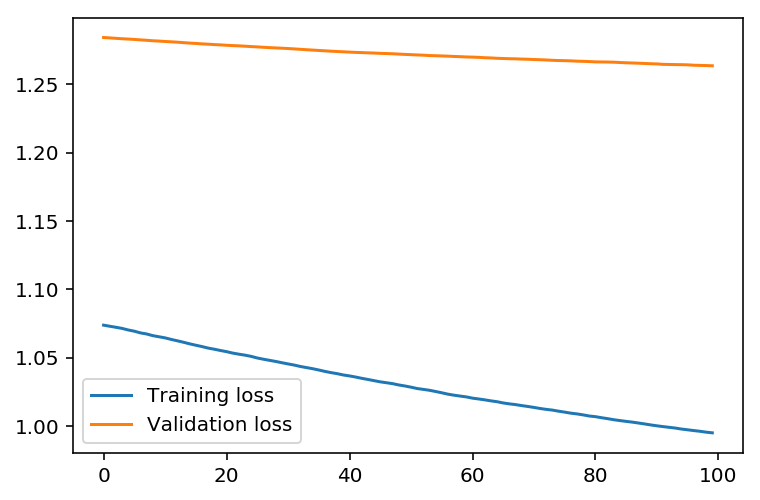

In [185]:
plt.plot(losses['train'], label='Training loss')
plt.plot(losses['validation'], label='Validation loss')
plt.legend()
_ = plt.ylim()

## Check out your predictions

Here, use the test data to view how well your network is modeling the data. If something is completely wrong here, make sure each step in your network is implemented correctly.

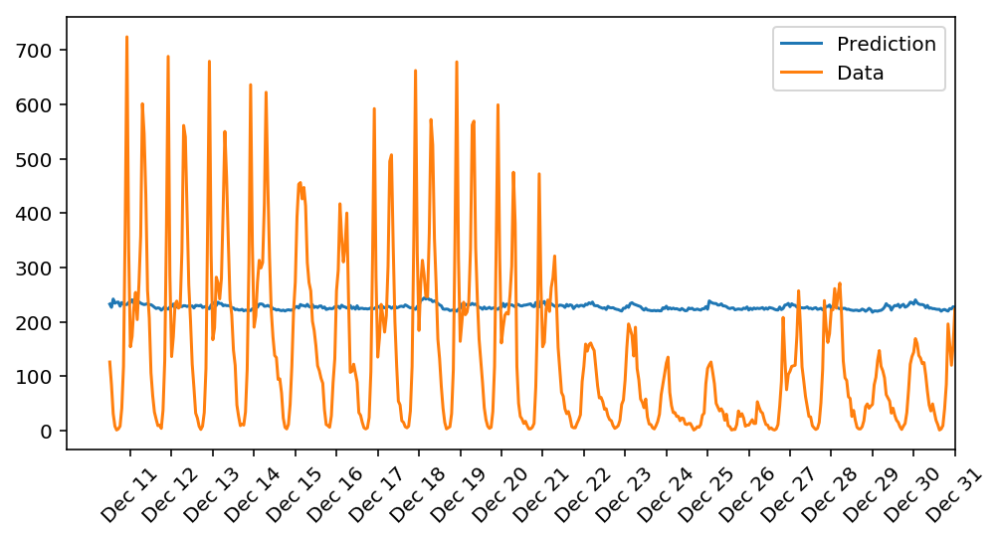

In [186]:
fig, ax = plt.subplots(figsize=(8,4))

mean, std = scaled_features['cnt']
predictions = network.run(test_features).T*std + mean
ax.plot(predictions[0], label='Prediction')
ax.plot((test_targets['cnt']*std + mean).values, label='Data')
ax.set_xlim(right=len(predictions))
ax.legend()

dates = pd.to_datetime(rides.ix[test_data.index]['dteday'])
dates = dates.apply(lambda d: d.strftime('%b %d'))
ax.set_xticks(np.arange(len(dates))[12::24])
_ = ax.set_xticklabels(dates[12::24], rotation=45)

## OPTIONAL: Thinking about your results(this question will not be evaluated in the rubric).
 
Answer these questions about your results. How well does the model predict the data? Where does it fail? Why does it fail where it does?

> **Note:** You can edit the text in this cell by double clicking on it. When you want to render the text, press control + enter

#### Your answer below